# MODELO NO SUPERVISADO

## Preparación

Como primera instancia utilizaremos un modelo no supervisado para evaluar si se puede dividir exitosamente los 2 grupos de la variable target (niños autistas y niños neurotípicos) mediante una clusterización.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
df_cluster = pd.read_csv('/content/drive/MyDrive/DL_UPAO/Proyecto/data.csv')
df_cluster.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,CASE_NO_PATIENT'S,A1,A2,A3,A4,A5,A6,A7,A8,A9,...,Global developmental delay/intellectual disability,Social/Behavioural Issues,Childhood Autism Rating Scale,Anxiety_disorder,Sex,Ethnicity,Jaundice,Family_mem_with_ASD,Who_completed_the_test,ASD_traits
0,1,0,0,0,0,0,0,1,1,0,...,Yes,Yes,1,Yes,F,middle eastern,Yes,No,Family Member,No
1,2,1,1,0,0,0,1,1,0,0,...,Yes,Yes,2,Yes,M,White European,Yes,No,Family Member,Yes
2,3,1,0,0,0,0,0,1,1,0,...,Yes,Yes,4,Yes,M,Middle Eastern,Yes,No,Family Member,Yes
3,4,1,1,1,1,1,1,1,1,1,...,Yes,Yes,2,Yes,M,Hispanic,No,No,Family Member,Yes
4,5,1,1,0,1,1,1,1,1,1,...,Yes,Yes,1,Yes,F,White European,No,No,Family Member,Yes


In [ ]:
# Eliminamos valores nulos
df_cluster = df_cluster.dropna()
df_cluster.isnull().sum()

,0
CASE_NO_PATIENT'S,0
A1,0
A2,0
A3,0
A4,0
A5,0
A6,0
A7,0
A8,0
A9,0


In [ ]:
df_cluster = df_cluster.drop(columns=["CASE_NO_PATIENT'S"])
df_cluster.head(10)

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,...,Global developmental delay/intellectual disability,Social/Behavioural Issues,Childhood Autism Rating Scale,Anxiety_disorder,Sex,Ethnicity,Jaundice,Family_mem_with_ASD,Who_completed_the_test,ASD_traits
0,0,0,0,0,0,0,1,1,0,1,...,Yes,Yes,1,Yes,F,middle eastern,Yes,No,Family Member,No
1,1,1,0,0,0,1,1,0,0,0,...,Yes,Yes,2,Yes,M,White European,Yes,No,Family Member,Yes
2,1,0,0,0,0,0,1,1,0,1,...,Yes,Yes,4,Yes,M,Middle Eastern,Yes,No,Family Member,Yes
3,1,1,1,1,1,1,1,1,1,1,...,Yes,Yes,2,Yes,M,Hispanic,No,No,Family Member,Yes
4,1,1,0,1,1,1,1,1,1,1,...,Yes,Yes,1,Yes,F,White European,No,No,Family Member,Yes
5,1,1,0,0,1,1,1,1,1,1,...,Yes,Yes,2,Yes,M,Black,No,No,Family Member,Yes
6,1,0,0,1,1,1,0,0,1,0,...,Yes,Yes,4,Yes,M,Asian,Yes,No,Family Member,Yes
7,0,1,0,0,1,0,1,1,1,1,...,Yes,Yes,2,Yes,M,Asian,Yes,No,Family Member,Yes
8,0,0,0,0,0,0,1,0,0,1,...,Yes,Yes,2,Yes,M,Asian,No,No,Family Member,No
9,1,1,1,0,1,1,0,1,1,1,...,Yes,Yes,1,Yes,M,South Asian,No,No,Health Care Professional,Yes


In [ ]:
df_cluster.describe(include=object)

,Speech Delay/Language Disorder,Learning disorder,Genetic_Disorders,Depression,Global developmental delay/intellectual disability,Social/Behavioural Issues,Anxiety_disorder,Sex,Ethnicity,Jaundice,Family_mem_with_ASD,Who_completed_the_test,ASD_traits
count,1923,1923,1923,1923,1923,1923,1923,1923,1923,1923,1923,1923,1923
unique,2,2,2,2,2,2,2,2,16,2,2,6,2
top,Yes,Yes,Yes,Yes,Yes,Yes,Yes,M,White European,Yes,No,Health Care Professional,Yes
freq,1034,1050,991,1031,1031,1031,1028,1388,541,1482,1319,1197,1018


In [ ]:
# Codificamos las variables categóricas
lista_cualis = df_cluster.select_dtypes(include='object').columns
# Variables que solo tienen 2 categorias
lista_binarias = []

for column in lista_cualis:
    # Comprobamos si la columna tiene solo 2 categorías únicas
    if df_cluster[column].nunique() == 2:
        lista_binarias.append(column)

for var in lista_binarias:
  if var == 'Sex':
    df_cluster[var] = df_cluster[var].map({'F': 0, 'M': 1})
  else:
    df_cluster[var] = df_cluster[var].map(lambda x: 1 if x == 'Yes' else 0)

# Variables con varias categorias
lista_multi = lista_cualis.difference(lista_binarias)

for var in lista_multi:
  df_cluster = pd.get_dummies(df_cluster, columns=[var], drop_first=True)

df_cluster.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,...,Ethnicity_asian,Ethnicity_black,Ethnicity_middle eastern,Ethnicity_mixed,Ethnicity_south asian,Who_completed_the_test_Family member,Who_completed_the_test_Health Care Professional,Who_completed_the_test_Others,Who_completed_the_test_School and NGO,Who_completed_the_test_Self
0,0,0,0,0,0,0,1,1,0,1,...,False,False,True,False,False,False,False,False,False,False
1,1,1,0,0,0,1,1,0,0,0,...,False,False,False,False,False,False,False,False,False,False
2,1,0,0,0,0,0,1,1,0,1,...,False,False,False,False,False,False,False,False,False,False
3,1,1,1,1,1,1,1,1,1,1,...,False,False,False,False,False,False,False,False,False,False
4,1,1,0,1,1,1,1,1,1,1,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Escalamos con MinMaxScaler, obligatorio para modelos no supervisados
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [ ]:
scaled = scaler.fit_transform(df_cluster)

In [ ]:
columnas = df_cluster.columns

In [ ]:
df_scaled = pd.DataFrame(data = scaled, columns = columnas)
df_scaled.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,...,Ethnicity_asian,Ethnicity_black,Ethnicity_middle eastern,Ethnicity_mixed,Ethnicity_south asian,Who_completed_the_test_Family member,Who_completed_the_test_Health Care Professional,Who_completed_the_test_Others,Who_completed_the_test_School and NGO,Who_completed_the_test_Self
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
X = df_scaled.drop(columns=['ASD_traits'])  # Elimina el target
df_qchat10 = X.iloc[:, :10].join(X[['Qchat_10_Score']])
df_qchat10.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,Qchat_10_Score
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.3
1,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.4
2,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.4
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9


## Reducción de dimensionalidad con PCA

In [ ]:
# Aplicamos la metodologia de ACP!
from sklearn.decomposition import PCA
pca = PCA()

principalComponents = pca.fit_transform(df_qchat10)

In [ ]:
#variacion explicada por las componentes
print(pca.explained_variance_ratio_)

[0.53896355 0.1109979  0.06523836 0.05292114 0.04753973 0.04025944
 0.03594375 0.03496913 0.03308768 0.02591533 0.01416398]


In [ ]:
print(pca.components_)

[[ 3.36276948e-01  2.88285054e-01  2.69655738e-01  3.26093752e-01
   3.31703796e-01  3.53439000e-01  3.64334634e-01  2.79462794e-01
   3.25525026e-01  1.69549159e-01  2.10378268e-01]
 [ 2.56276751e-02  5.87519670e-02 -1.71656317e-01 -1.66707381e-01
  -1.14912963e-01 -8.10023357e-02  3.76784112e-02 -3.63474420e-02
  -1.43274978e-01  9.38374797e-01  1.22686759e-01]
 [ 4.91356726e-01  4.99885113e-01 -4.66837640e-01 -4.04402481e-01
  -1.13696904e-01  1.09075904e-01  1.47669160e-01 -5.49733303e-03
  -1.52884205e-01 -2.25593760e-01 -7.92314819e-02]
 [-3.11382030e-01 -2.80593489e-01 -3.49794558e-01 -3.22800261e-01
   3.02424749e-01  9.04036145e-02  1.70288785e-01  6.83086964e-01
   3.19199725e-02 -2.17521731e-02 -3.19472917e-02]
 [ 4.37810154e-02  3.50580486e-01  2.64282023e-01  1.49399893e-01
  -2.88289825e-01 -3.07625160e-01 -3.47448816e-01  6.38913174e-01
  -2.72706067e-01 -1.83373399e-02  4.03904306e-02]
 [-1.28340109e-01 -6.15169547e-02 -7.50569809e-02  3.04335730e-01
  -4.21839966e-01 -

% Var. explicada (1 componentes):  53.896354886894784
% Var. explicada (2 componentes):  64.99614513159938
% Var. explicada (3 componentes):  71.51998143218984
% Var. explicada (4 componentes):  76.81209567379871
% Var. explicada (5 componentes):  81.56606908543961
% Var. explicada (6 componentes):  85.5920126650003
% Var. explicada (7 componentes):  89.18638719793599
% Var. explicada (8 componentes):  92.6833001020313
% Var. explicada (9 componentes):  95.9920684082936
% Var. explicada (10 componentes):  98.58360169927823
% Var. explicada (11 componentes):  99.99999999999997


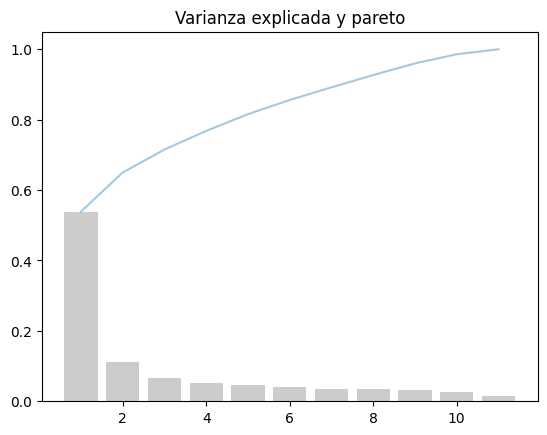

In [ ]:
for i in range(len(pca.components_)):
    print('% Var. explicada ('+str(i+1)+' componentes): ', np.cumsum(pca.explained_variance_ratio_)[i]*100)

plt.bar(range(1,len(pca.components_)+1),pca.explained_variance_ratio_, alpha=.2,color='0')
plt.plot(range(1,len(pca.components_)+1),np.cumsum(pca.explained_variance_ratio_),alpha=0.4)
plt.title("Varianza explicada y pareto")
plt.show()

Elegiremos los 2 primeros componentes, los cuales representan más del 64% de la varianza de todos los datos.

In [ ]:
# Aplicamos la metodologia de ACP!
from sklearn.decomposition import PCA
pca = PCA(n_components=2) # Elegimos 2 componentes principales
principalComponents = pca.fit_transform(df_qchat10)

In [ ]:
#variacion explicada por las componentes
print(pca.explained_variance_ratio_)

[0.53896355 0.1109979 ]


In [ ]:
# Creamos los componentes!
principalDf = pd.DataFrame(data = principalComponents, columns = ['PCA_1', 'PCA_2'])
# Revisamos las nuevas variables!
principalDf.head()

,PCA_1,PCA_2
0,-0.089528,0.650268
1,0.460499,-0.236113
2,0.267787,0.688164
3,2.288716,0.142974
4,1.998023,0.302362


## Modelamiento

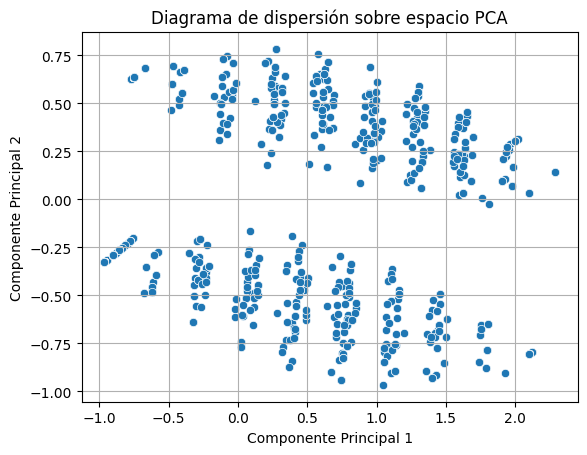

In [ ]:
sns.scatterplot(x='PCA_1', y='PCA_2', data=principalDf)
plt.title('Diagrama de dispersión sobre espacio PCA')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.grid(True)
plt.show()

Para modelo no supervisado optamos por usar DBSCAN en vez de K-Means porque es un algoritmo de clustering basado en densidad que no asume formas esféricas, lo que lo hace ideal para datos con clusters de formas irregulares y diferentes densidades. Además, es robusto ante ruido y puntos atípicos.

In [ ]:
from sklearn.cluster import DBSCAN

# Crear modelo DBSCAN
dbscan = DBSCAN(eps=0.3, min_samples=10)
dbscan.fit(principalDf[['PCA_1', 'PCA_2']])

# Asignar etiquetas de cluster a los datos originales
principalDf['Cluster_DBSCAN'] = dbscan.labels_

In [ ]:
from sklearn.metrics import silhouette_score

# Calculamos la silueta
silhouette = silhouette_score(principalDf[['PCA_1', 'PCA_2']], dbscan.labels_)
print(f'Silhouette Score: {silhouette:.4f}')

Silhouette Score: 0.3732


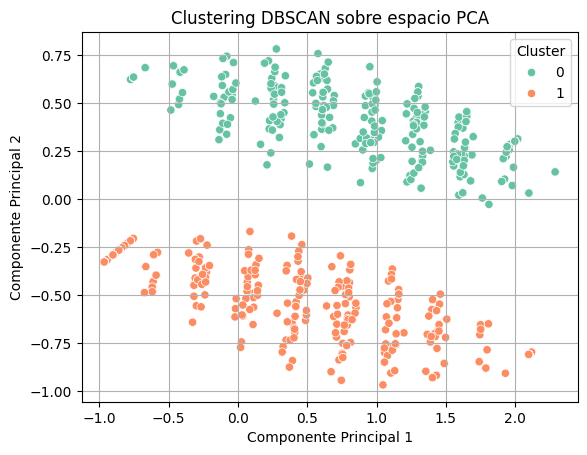

In [ ]:
# Visualizamos los clusters
sns.scatterplot(x='PCA_1', y='PCA_2', hue='Cluster_DBSCAN', data=principalDf, palette='Set2')
plt.title('Clustering DBSCAN sobre espacio PCA')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

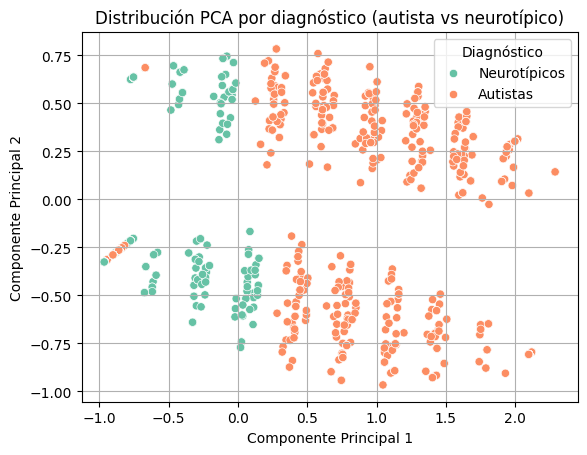

In [ ]:
# Ahora comprobamos sabiendo el target
principalDf['ASD_Traits'] = df_scaled['ASD_traits']

sns.scatterplot(x='PCA_1', y='PCA_2', hue='ASD_Traits', data=principalDf, palette='Set2')
plt.title('Distribución PCA por diagnóstico (autista vs neurotípico)')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
handles, labels = plt.gca().get_legend_handles_labels()
labels = ['Neurotípicos' if label == '0.0' else 'Autistas' for label in labels]
plt.legend(handles=handles, labels=labels, title='Diagnóstico')

plt.grid(True)
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(principalDf['ASD_Traits'], principalDf['Cluster_DBSCAN'])
conf_df = pd.DataFrame(conf_matrix,
                       index=['Neurotípico (real)', 'Autista (real)'],
                       columns=['Cluster 0', 'Cluster 1'])
conf_df

,Cluster 0,Cluster 1
Neurotípico (real),361,544
Autista (real),511,507


**Conclusión**

- Aparentemente el modelo no supervisado pudo distinguir 2 clusters cuya diferenciación es clara, sin embargo si comparamos con el dataset donde figura la target nos podemos dar cuenta que los grupos de niños autistas y neurotípicos están distribuidos en ambos clusteres y no hay una concentración de ningun grupo en un cluster específico, lo que indica que no es capaz de distinguirlos fielmente con la target.
- En el dataset donde solamente se encuentran las variables referentes a la prueba internacional Q-CHAT10 no se puede distinguir mediante clusters a los 2 grupos objetivos, niños con TEA y niños sin TEA, lo que incrementa la importancia de considerar demás variables clínicas y de contexto personal, familiar y social.

# 1. ANÁLISIS EXPLORATORIO DE DATOS

## 1.1. Evaluación del supuesto de completitud de la información

In [173]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [174]:
from google.colab import drive
drive.mount('/content/drive')
df = pd.read_csv('/content/drive/MyDrive/DL_UPAO/Proyecto/data.csv')
df.head(20)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,CASE_NO_PATIENT'S,A1,A2,A3,A4,A5,A6,A7,A8,A9,...,Global developmental delay/intellectual disability,Social/Behavioural Issues,Childhood Autism Rating Scale,Anxiety_disorder,Sex,Ethnicity,Jaundice,Family_mem_with_ASD,Who_completed_the_test,ASD_traits
0,1,0,0,0,0,0,0,1,1,0,...,Yes,Yes,1,Yes,F,middle eastern,Yes,No,Family Member,No
1,2,1,1,0,0,0,1,1,0,0,...,Yes,Yes,2,Yes,M,White European,Yes,No,Family Member,Yes
2,3,1,0,0,0,0,0,1,1,0,...,Yes,Yes,4,Yes,M,Middle Eastern,Yes,No,Family Member,Yes
3,4,1,1,1,1,1,1,1,1,1,...,Yes,Yes,2,Yes,M,Hispanic,No,No,Family Member,Yes
4,5,1,1,0,1,1,1,1,1,1,...,Yes,Yes,1,Yes,F,White European,No,No,Family Member,Yes
5,6,1,1,0,0,1,1,1,1,1,...,Yes,Yes,2,Yes,M,Black,No,No,Family Member,Yes
6,7,1,0,0,1,1,1,0,0,1,...,Yes,Yes,4,Yes,M,Asian,Yes,No,Family Member,Yes
7,8,0,1,0,0,1,0,1,1,1,...,Yes,Yes,2,Yes,M,Asian,Yes,No,Family Member,Yes
8,9,0,0,0,0,0,0,1,0,0,...,Yes,Yes,2,Yes,M,Asian,No,No,Family Member,No
9,10,1,1,1,0,1,1,0,1,1,...,Yes,Yes,1,Yes,M,South Asian,No,No,Health Care Professional,Yes


| Variable                                             | Descripción                                                                 | Tipo                          |
|------------------------------------------------------|------------------------------------------------------------------------------|-------------------------------|
| CASE_NO_PATIENT'S                                    | Número de caso de paciente                                                  | Cualitativa nominal           |
| A1–A10                                               | Puntaje por cada pregunta de la Prueba Qchat 10                            | Cuantitativa discreta         |
| Social_Responsiveness_Scale                          | Escala de respuesta social                                                  | Cuantitativa continua         |
| Age_Years                                            | Años de edad                                                                | Cuantitativa discreta         |
| Qchat_10_Score                                       | Resultado obtenido de la Prueba Qchat 10                                   | Cuantitativa discreta         |
| Speech_Delay_Language_Disorder                       | Cuenta con retraso del habla/trastorno del lenguaje o no                   | Cualitativa nominal           |
| Learning_Disorder                                    | Cuenta con algún trastorno del aprendizaje o no                               | Cualitativa nominal           |
| Genetic_Disorders                                    | Cuenta con algún trastorno genético o no                                   | Cualitativa nominal           |
| Depression                                           | Cuenta con depresión o indicios o no                                       | Cualitativa nominal           |
| Global_Developmental_Delay_Intellectual_Disability   | Cuenta con retraso global o discapacidad intelectual o no                  | Cualitativa nominal           |
| Social_Behavioural_Issues                            | Cuenta con problemas de comportamiento/sociales o no                       | Cualitativa nominal           |
| Childhood_Autism_Rating_Scale                        | Escala de calificación del autismo infantil                                | Cuantitativa continua         |
| Anxiety_Disorder                                     | Cuenta con trastorno de ansiedad o no                                      | Cualitativa nominal           |
| Sex                                                  | Género                                                                     | Cualitativa nominal           |
| Ethnicity                                            | Etnia a la que pertenece                                                   | Cualitativa nominal           |
| Jaundice                                             | Tiene ictericia o no                                                       | Cualitativa nominal           |
| Family_Mem_With_Asd                                  | Tiene algún familiar con autismo o no                                      | Cualitativa nominal           |
| Who_Completed_The_Test                               | Persona que completó el test                                               | Cualitativa nominal           |
| Asd_Traits                                           | Es autista o es neurotípico                                                | Cualitativa nominal (binaria) |


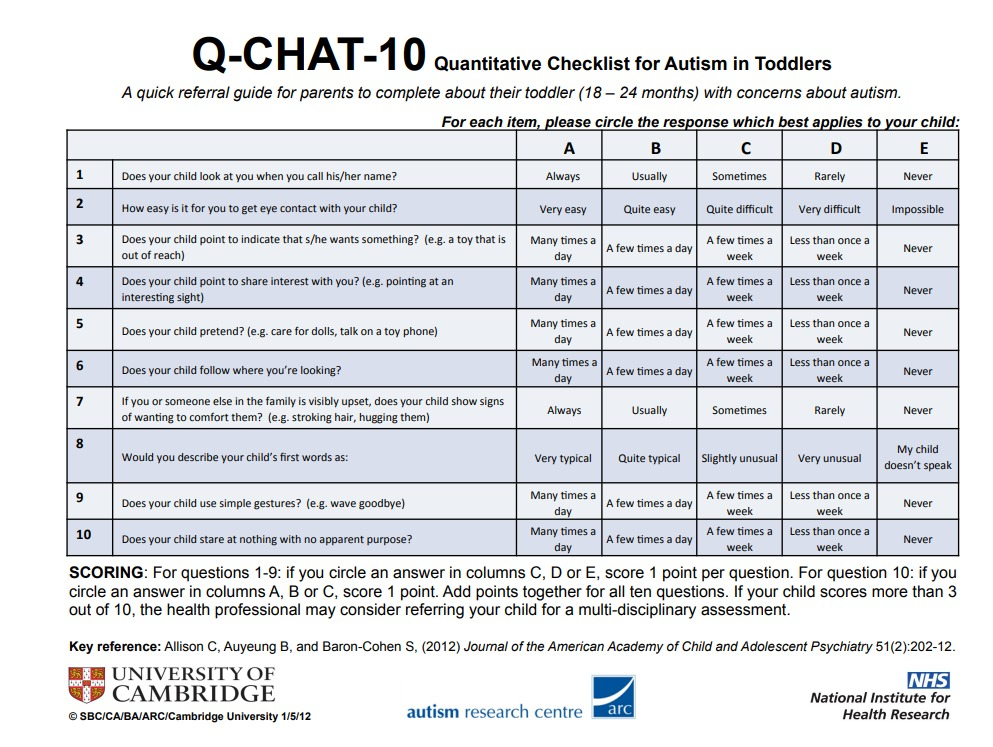

In [175]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1985 entries, 0 to 1984
Data columns (total 28 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   CASE_NO_PATIENT'S                                   1985 non-null   int64  
 1   A1                                                  1985 non-null   int64  
 2   A2                                                  1985 non-null   int64  
 3   A3                                                  1985 non-null   int64  
 4   A4                                                  1985 non-null   int64  
 5   A5                                                  1985 non-null   int64  
 6   A6                                                  1985 non-null   int64  
 7   A7                                                  1985 non-null   int64  
 8   A8                                                  1985 non-null   int64  
 9

In [176]:
# Filas y columnas del dataframe
df.shape

(1985, 28)

In [177]:
df.columns

Index(['CASE_NO_PATIENT'S', 'A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8',
       'A9', 'A10_Autism_Spectrum_Quotient', 'Social_Responsiveness_Scale',
       'Age_Years', 'Qchat_10_Score', 'Speech Delay/Language Disorder',
       'Learning disorder', 'Genetic_Disorders', 'Depression',
       'Global developmental delay/intellectual disability',
       'Social/Behavioural Issues', 'Childhood Autism Rating Scale',
       'Anxiety_disorder', 'Sex', 'Ethnicity', 'Jaundice',
       'Family_mem_with_ASD', 'Who_completed_the_test', 'ASD_traits'],
      dtype='object')

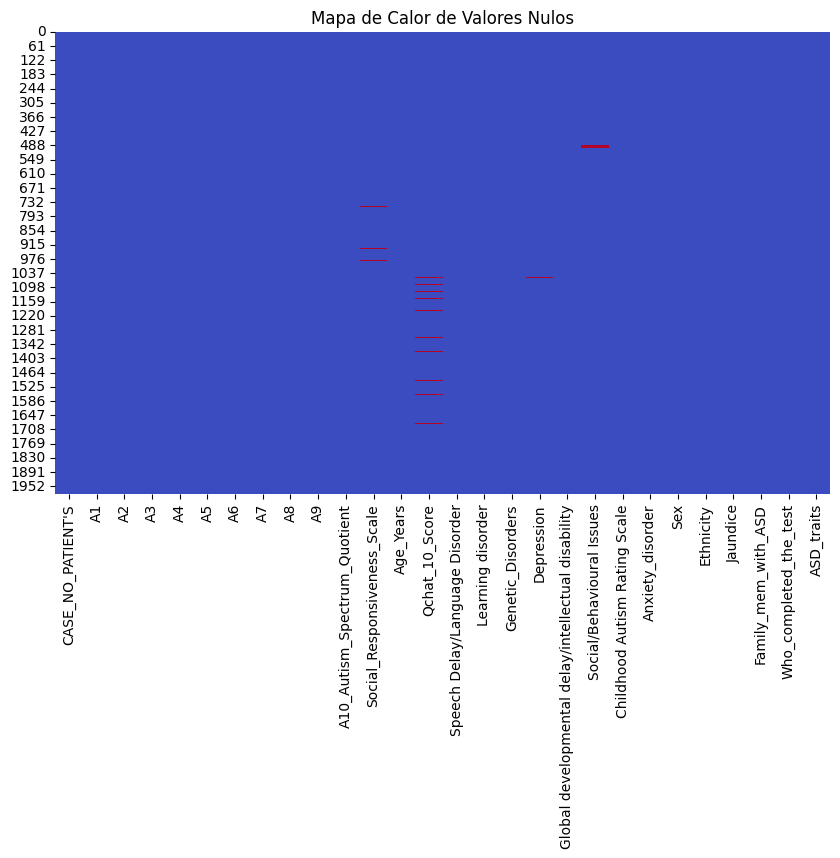

In [178]:
# Crear el mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(),
            cmap='coolwarm',
            cbar=False,)

plt.title('Mapa de Calor de Valores Nulos')
plt.show()

In [179]:
#Suma de valores nulos
df.isnull().sum()

,0
CASE_NO_PATIENT'S,0
A1,0
A2,0
A3,0
A4,0
A5,0
A6,0
A7,0
A8,0
A9,0


In [180]:
#Porcentaje de valores nulos
df.isnull().sum()/df.shape[0]*100

,0
CASE_NO_PATIENT'S,0.000000
A1,0.000000
A2,0.000000
A3,0.000000
A4,0.000000
A5,0.000000
A6,0.000000
A7,0.000000
A8,0.000000
A9,0.000000


Podemos observar que el porcentaje de valores nulos es de menos de 5% en las columnas que los presentan, por lo que eliminar estos registros sería una buena opción. Sin embargo, la variable Qchat_10_Score sale de la suma de las columnas A1-A10, por lo que se propone recalcular esta columna.

In [181]:
df.nunique()

,0
CASE_NO_PATIENT'S,1985
A1,2
A2,2
A3,2
A4,2
A5,2
A6,2
A7,2
A8,2
A9,2


In [182]:
duplicados = df.duplicated().sum()
print(f"Total de registros duplicados: {duplicados}")


Total de registros duplicados: 0


Vemos que no contamos con registros duplicados.

In [183]:
#Eliminamos la columna "CASE_NO_PATIENT'S" dado que almacena valores únicos y no nos sirven para el modelo
df = df.drop(columns=["CASE_NO_PATIENT'S"])
df.head(10)

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,...,Global developmental delay/intellectual disability,Social/Behavioural Issues,Childhood Autism Rating Scale,Anxiety_disorder,Sex,Ethnicity,Jaundice,Family_mem_with_ASD,Who_completed_the_test,ASD_traits
0,0,0,0,0,0,0,1,1,0,1,...,Yes,Yes,1,Yes,F,middle eastern,Yes,No,Family Member,No
1,1,1,0,0,0,1,1,0,0,0,...,Yes,Yes,2,Yes,M,White European,Yes,No,Family Member,Yes
2,1,0,0,0,0,0,1,1,0,1,...,Yes,Yes,4,Yes,M,Middle Eastern,Yes,No,Family Member,Yes
3,1,1,1,1,1,1,1,1,1,1,...,Yes,Yes,2,Yes,M,Hispanic,No,No,Family Member,Yes
4,1,1,0,1,1,1,1,1,1,1,...,Yes,Yes,1,Yes,F,White European,No,No,Family Member,Yes
5,1,1,0,0,1,1,1,1,1,1,...,Yes,Yes,2,Yes,M,Black,No,No,Family Member,Yes
6,1,0,0,1,1,1,0,0,1,0,...,Yes,Yes,4,Yes,M,Asian,Yes,No,Family Member,Yes
7,0,1,0,0,1,0,1,1,1,1,...,Yes,Yes,2,Yes,M,Asian,Yes,No,Family Member,Yes
8,0,0,0,0,0,0,1,0,0,1,...,Yes,Yes,2,Yes,M,Asian,No,No,Family Member,No
9,1,1,1,0,1,1,0,1,1,1,...,Yes,Yes,1,Yes,M,South Asian,No,No,Health Care Professional,Yes


## 1.2. Tratamiento y Limpieza de datos

Renombramos las columnas para que estén en un mismo formato.

In [184]:
# Función para transformar cada nombre
def formatear_columna(col):
    col = col.replace('/', ' ')  # Reemplazar / por espacio
    col = col.replace('_', ' ')  # Reemplazar _ por espacio temporalmente
    col = col.lower().title().replace(' ', '_')  # Capitalizar y unir con guiones bajos
    return col

# Aplicar a cada columna
nuevos_nombres = [formatear_columna(col) for col in df.columns]

In [185]:
df.columns = nuevos_nombres
df.columns

Index(['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9',
       'A10_Autism_Spectrum_Quotient', 'Social_Responsiveness_Scale',
       'Age_Years', 'Qchat_10_Score', 'Speech_Delay_Language_Disorder',
       'Learning_Disorder', 'Genetic_Disorders', 'Depression',
       'Global_Developmental_Delay_Intellectual_Disability',
       'Social_Behavioural_Issues', 'Childhood_Autism_Rating_Scale',
       'Anxiety_Disorder', 'Sex', 'Ethnicity', 'Jaundice',
       'Family_Mem_With_Asd', 'Who_Completed_The_Test', 'Asd_Traits'],
      dtype='object')

Analizamos detenidamente si los valores de la columna "Puntaje_Qchat_10" corresponde a la suma de A1-A10 como debería ser.

In [186]:
# Seleccionamos las columnas numéricas, entre las cuales 11 representan los campos y resultado de la prueba internacional Qchat_10 de autismo, más nuestro target 'Asd_Traits'
selected_columns = df.columns[:10].tolist() + ['Qchat_10_Score', 'Asd_Traits']
df_selected = df[selected_columns].copy()

# Mostrar las primeras filas para verificar
df_selected.head(15)

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,Qchat_10_Score,Asd_Traits
0,0,0,0,0,0,0,1,1,0,1,3.0,No
1,1,1,0,0,0,1,1,0,0,0,4.0,Yes
2,1,0,0,0,0,0,1,1,0,1,4.0,Yes
3,1,1,1,1,1,1,1,1,1,1,10.0,Yes
4,1,1,0,1,1,1,1,1,1,1,9.0,Yes
5,1,1,0,0,1,1,1,1,1,1,8.0,Yes
6,1,0,0,1,1,1,0,0,1,0,5.0,Yes
7,0,1,0,0,1,0,1,1,1,1,6.0,Yes
8,0,0,0,0,0,0,1,0,0,1,2.0,No
9,1,1,1,0,1,1,0,1,1,1,8.0,Yes


In [187]:
# Calcular la suma de A1 a A10 para cada fila
df_selected['A_sum'] = df_selected[['A1','A2','A3','A4','A5','A6','A7','A8','A9','A10_Autism_Spectrum_Quotient']].sum(axis=1)  # sum(axis=1) => Suma todas las filas   sum(axis=0) => Suma todas las columnas

# Comparar con Qchat_10_Score
df_selected['Match'] = df_selected['A_sum'] == df_selected['Qchat_10_Score']

# Creamos 2 data frames, uno de solo niños con TEA y otro de solo sin TEA
asd_df = df_selected[df_selected['Asd_Traits'] == 'Yes']
no_asd_df = df_selected[df_selected['Asd_Traits'] == 'No']

# Calcular cantidad de NO coincidencias
no_match_count_asd = (~asd_df['Match']).sum()
no_match_count_no_asd = (~no_asd_df['Match']).sum()

# Calcular totales por grupo
total_asd = len(asd_df)
total_no_asd = len(no_asd_df)

# Calcular porcentajes
percent_no_match_asd = (no_match_count_asd / total_asd) * 100
percent_no_match_no_asd = (no_match_count_no_asd / total_no_asd) * 100

# Mostrar resultados
print(f"Registros donde la suma de A1-A10 NO coincide con Qchat_10_Score en niños autistas: {no_match_count_asd} ({percent_no_match_asd:.2f}%)")
print(f"Registros donde la suma de A1-A10 NO coincide con Qchat_10_Score en niños con desarrollo típico: {no_match_count_no_asd} ({percent_no_match_no_asd:.2f}%)")

Registros donde la suma de A1-A10 NO coincide con Qchat_10_Score en niños autistas: 288 (26.82%)
Registros donde la suma de A1-A10 NO coincide con Qchat_10_Score en niños con desarrollo típico: 529 (58.07%)


Podemos ver que la variable Qchat_10_Score que debería almacenar la suma de las variables A1-A10 tiene valores erróneos en varios registros, los cuales se encuentran más representados en el grupo de niños con desarrollo típico, representando un gran sesgo, por lo que es necesario realizar un recalculamiento del valor de dicha variable.

In [188]:
# Sobrescribimos la columna Qchat_10_Score con el valor de A_sum, que almacena el valor correcto de la suma
df['Qchat_10_Score'] = df_selected['A_sum']

# Vemos las columnas que corresponden a la prueba Qchat_10
df[df.columns[:10].tolist() + ['Qchat_10_Score']].head(15)

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,Qchat_10_Score
0,0,0,0,0,0,0,1,1,0,1,3
1,1,1,0,0,0,1,1,0,0,0,4
2,1,0,0,0,0,0,1,1,0,1,4
3,1,1,1,1,1,1,1,1,1,1,10
4,1,1,0,1,1,1,1,1,1,1,9
5,1,1,0,0,1,1,1,1,1,1,8
6,1,0,0,1,1,1,0,0,1,0,5
7,0,1,0,0,1,0,1,1,1,1,6
8,0,0,0,0,0,0,1,0,0,1,2
9,1,1,1,0,1,1,0,1,1,1,8


Ahora procedemos a borrar los registros que sigan con valores nulos, seguramente seran menos del 1%

In [189]:
before = len(df)
df.dropna(inplace=True)
after = len(df)

print(f"Filas eliminadas por tener valores nulos: {before - after}")

Filas eliminadas por tener valores nulos: 24


In [190]:
#Suma de valores nulos
df.isnull().sum()

,0
A1,0
A2,0
A3,0
A4,0
A5,0
A6,0
A7,0
A8,0
A9,0
A10_Autism_Spectrum_Quotient,0


## 1.3. Resumen global del total de variables de estudio

Definimos nuestra variable target, en este caso la variable que nos determina si el niño tiene o no autismo

In [191]:
target = 'Asd_Traits'

In [192]:
df[target].value_counts()

,count
Asd_Traits,
Yes,1056
No,905


Podemos ver que está muy equilibrada la cantidad de registros por cada grupo, representando ambos el 50% del dataset

### 1.3.1. Variables cuantitativas

In [193]:
df.describe()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,Social_Responsiveness_Scale,Age_Years,Qchat_10_Score,Childhood_Autism_Rating_Scale
count,1961.000000,1961.000000,1961.000000,1961.000000,1961.00000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000
mean,0.296277,0.237124,0.211117,0.269250,0.27435,0.300357,0.340643,0.241713,0.255992,0.444671,3.083631,9.618052,2.871494,1.699133
std,0.456731,0.425427,0.408205,0.443683,0.44630,0.458530,0.474046,0.428231,0.436529,0.497056,3.691156,4.301336,3.251186,1.016820
min,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,1.000000
50%,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,9.000000,1.000000,1.000000
75%,1.000000,0.000000,0.000000,1.000000,1.00000,1.000000,1.000000,0.000000,1.000000,1.000000,5.000000,14.000000,5.000000,2.000000
max,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,10.000000,18.000000,10.000000,4.000000


In [194]:
# Creamos una lista con nuestras variables cuantitativas
lista_cuantitativas = list(df.describe().columns)
lista_cuantitativas

['A1',
 'A2',
 'A3',
 'A4',
 'A5',
 'A6',
 'A7',
 'A8',
 'A9',
 'A10_Autism_Spectrum_Quotient',
 'Social_Responsiveness_Scale',
 'Age_Years',
 'Qchat_10_Score',
 'Childhood_Autism_Rating_Scale']

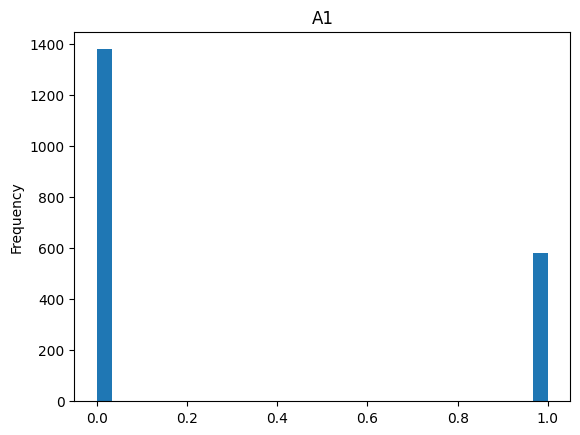

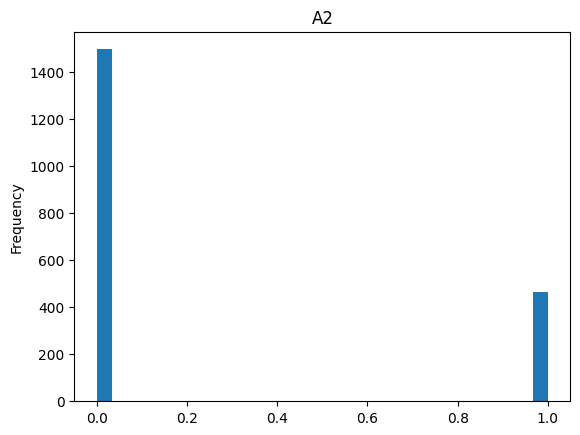

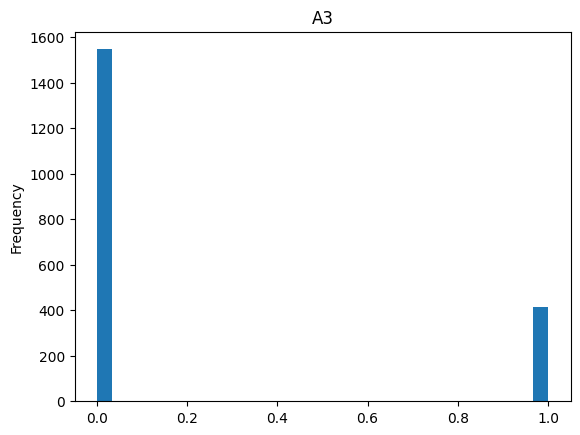

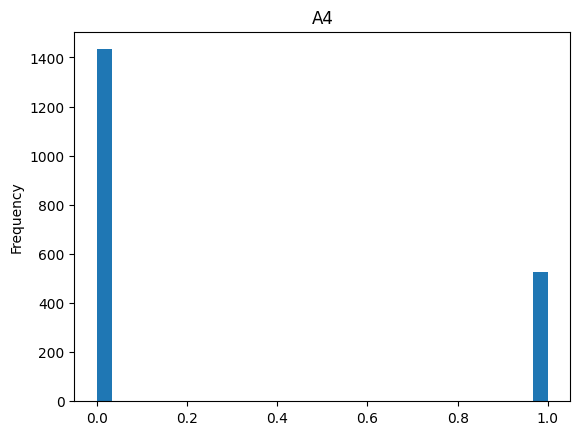

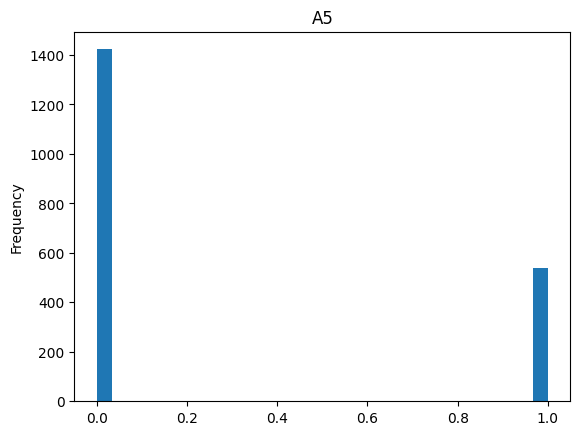

...

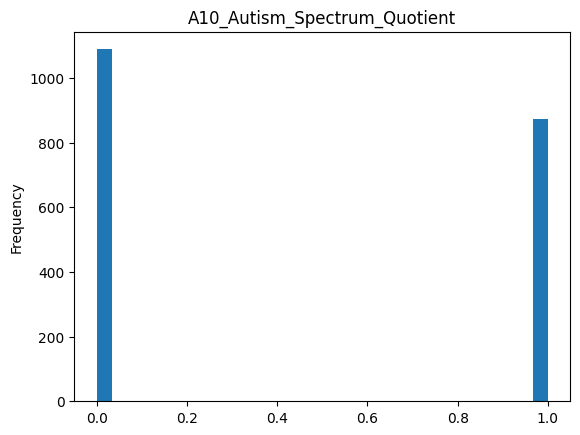

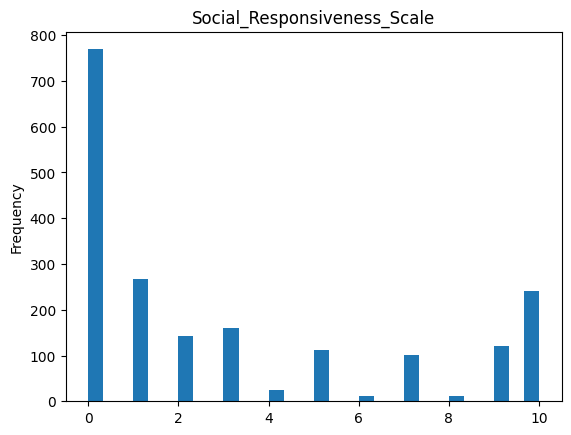

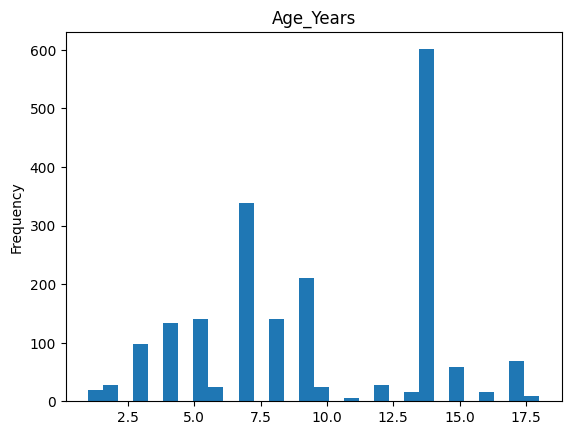

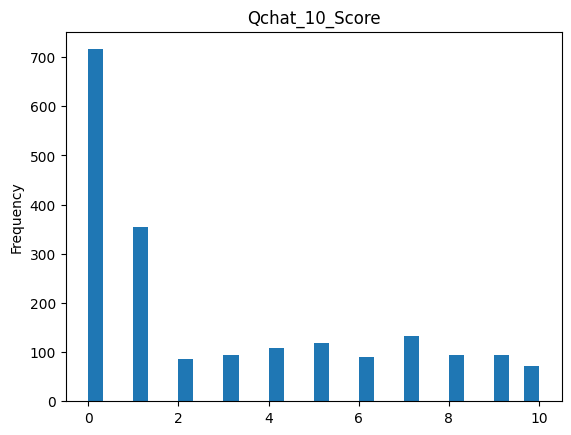

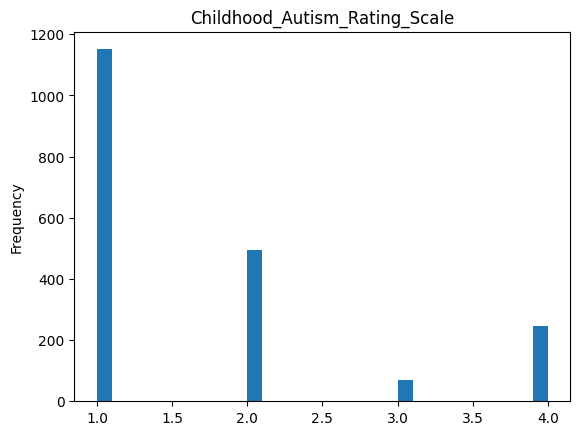

In [195]:
# realizamos histogramas para revisar la distribución de cada variable cuantitativa
for var in lista_cuantitativas:
    df[var].plot(kind='hist', title=var, bins=30)  #bins => cuantas barras como maximo se pueden ver
    plt.show()

Podemos ver que los histogramas tienen clara distinción en la distribución de sus valores y ninguna variable cuenta con un valor que sea una constante, motivo por el cual no se deberían eliminar.
Es más, existe cierta similitud en la distribución de las variables "Social_Responsivines_Scale", "Qchat_10_Score" y "Childhood_Autism_Rating_Scale", lo que indica una posible correlación significante entre estas.

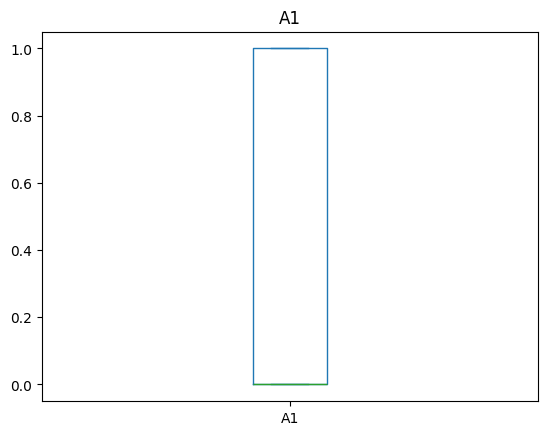

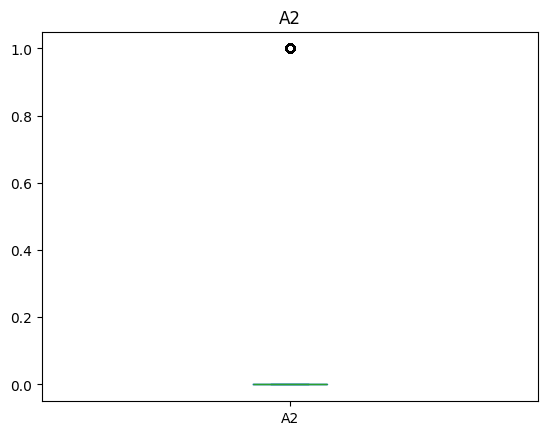

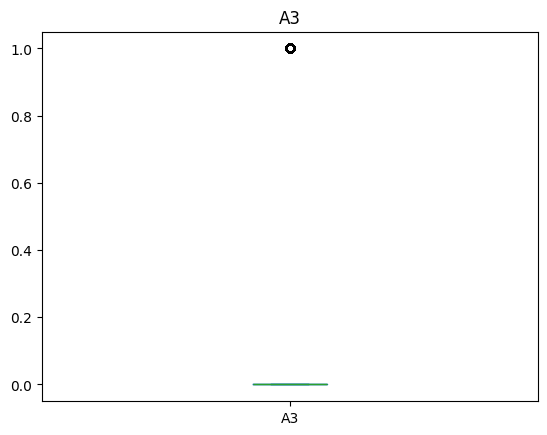

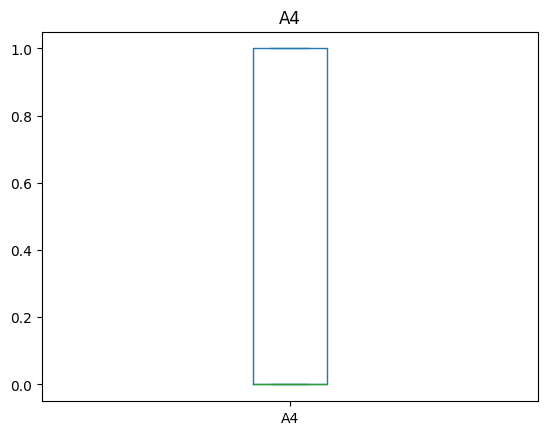

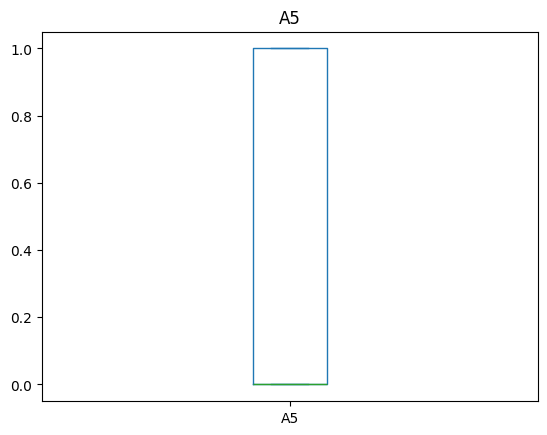

...

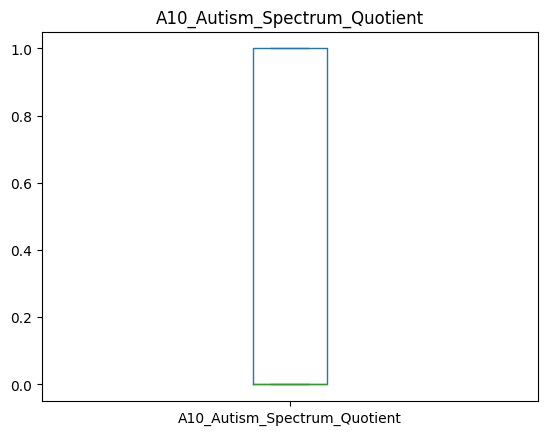

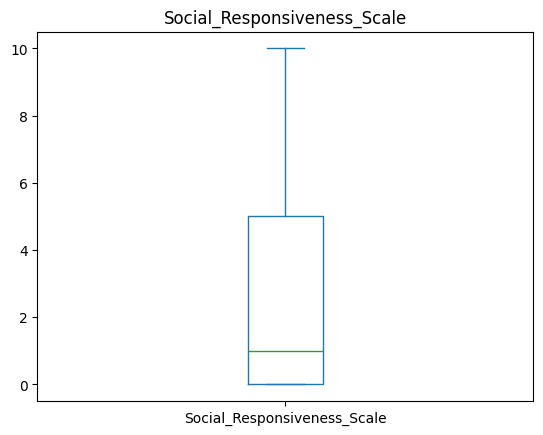

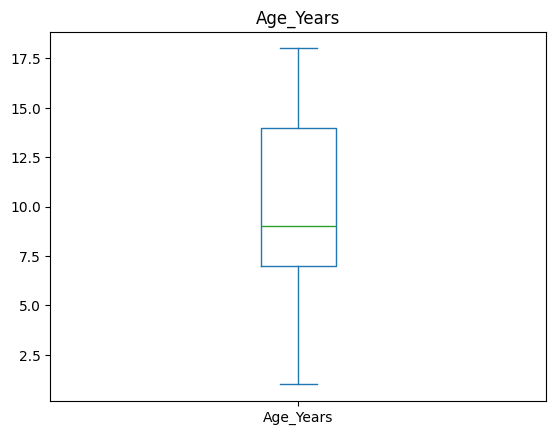

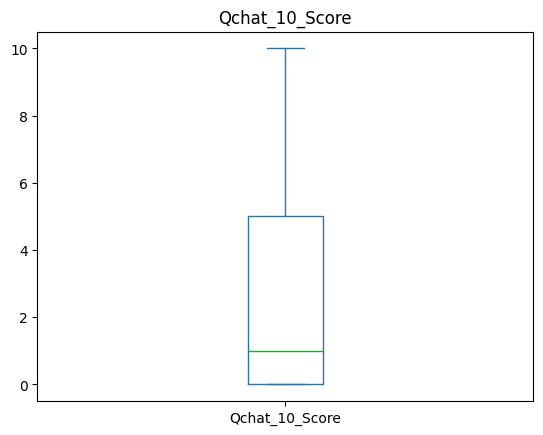

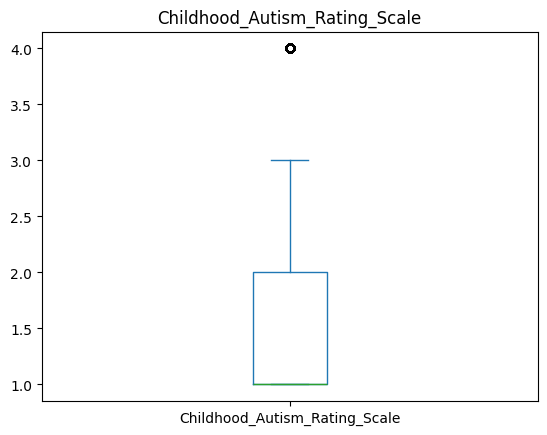

In [196]:
# realizamos diagramas de cajas para revisar la distribución de cada variable cuantitativa
for var in lista_cuantitativas:
    df[var].plot(kind='box', title=var)
    plt.show()

A continuación compararemos los histogramas separando al grupo de niños diagnosticados con TEA con el de los niños con desarrollo típico:

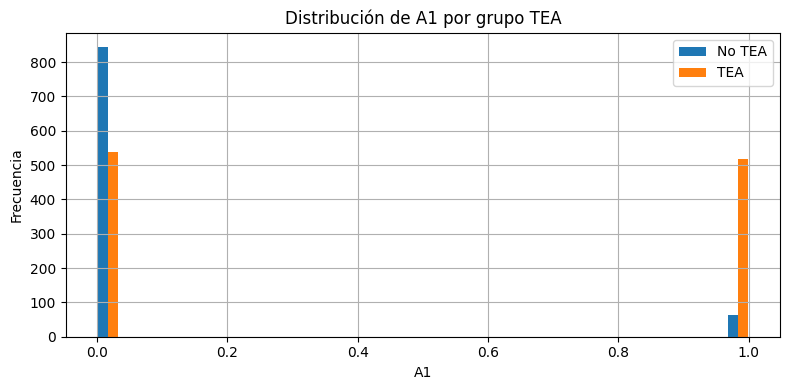

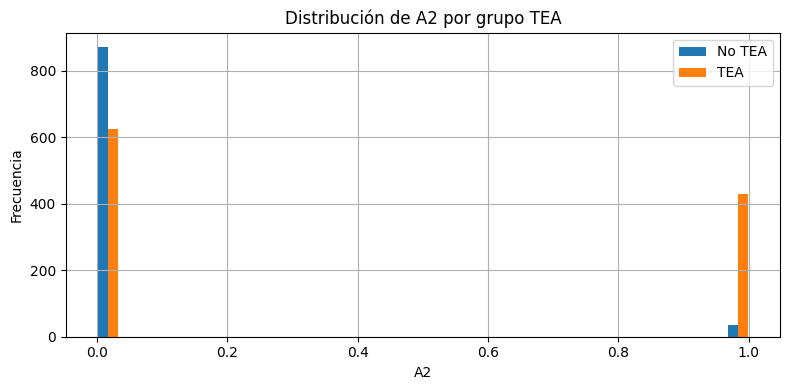

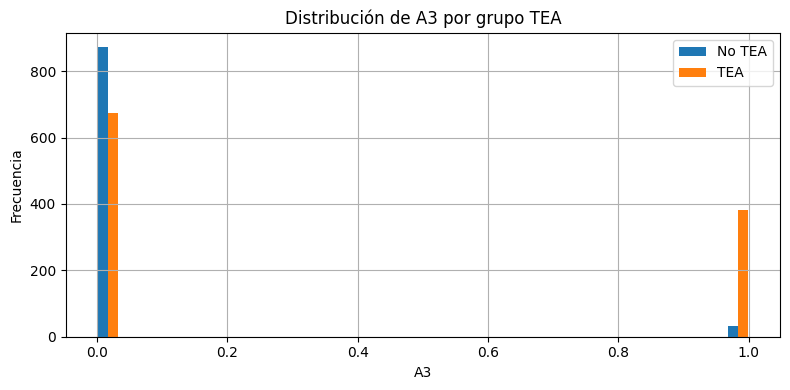

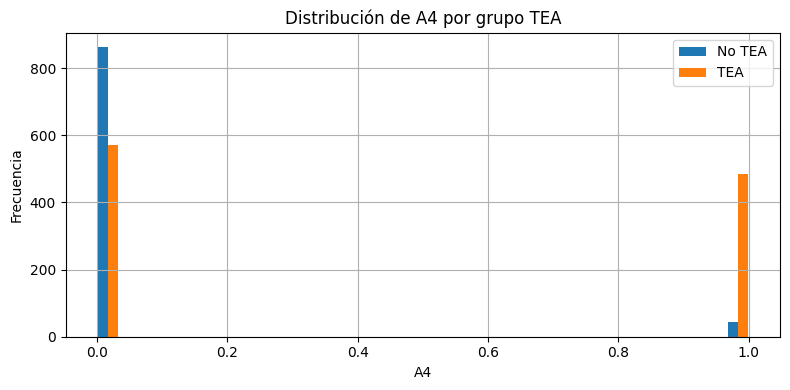

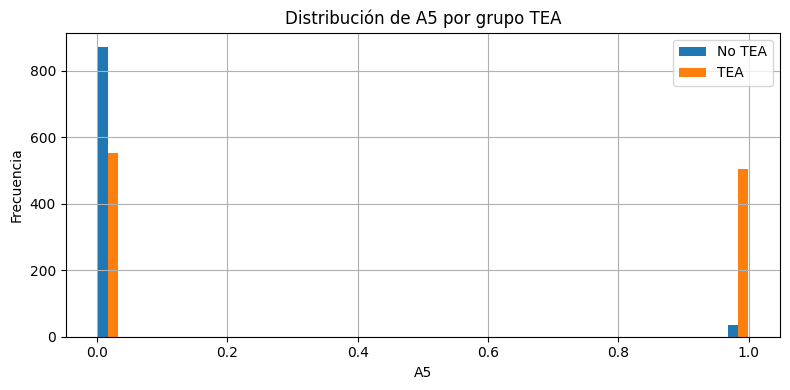

...

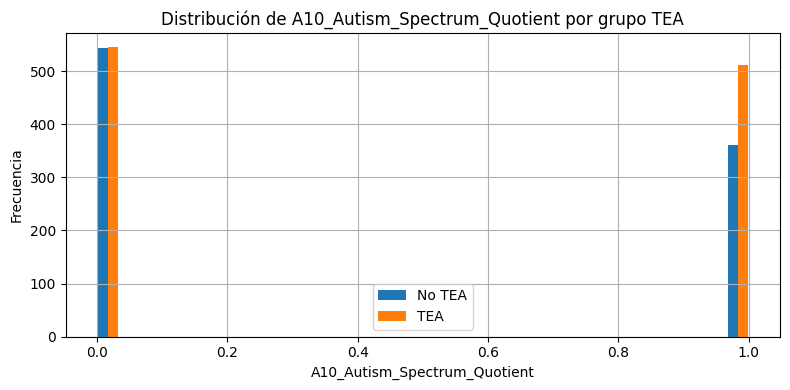

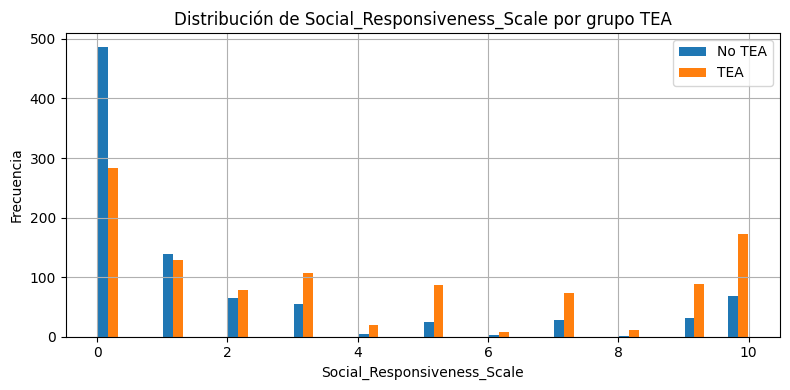

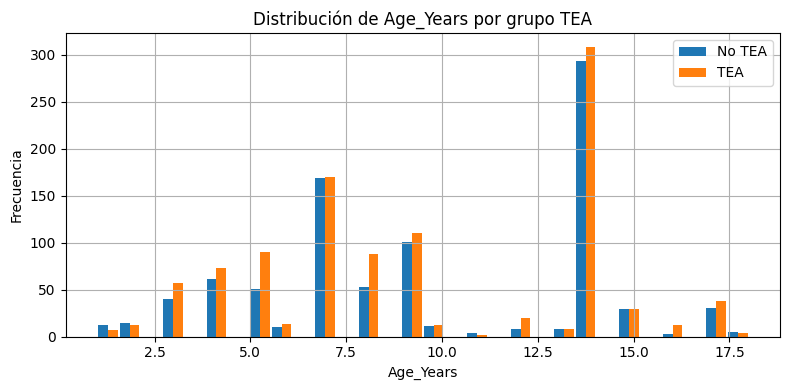

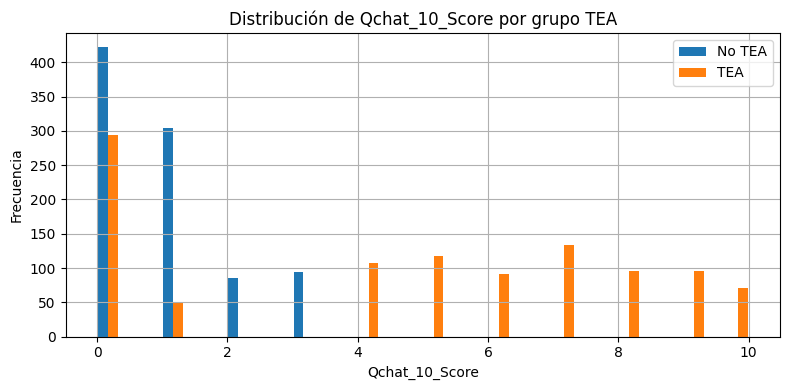

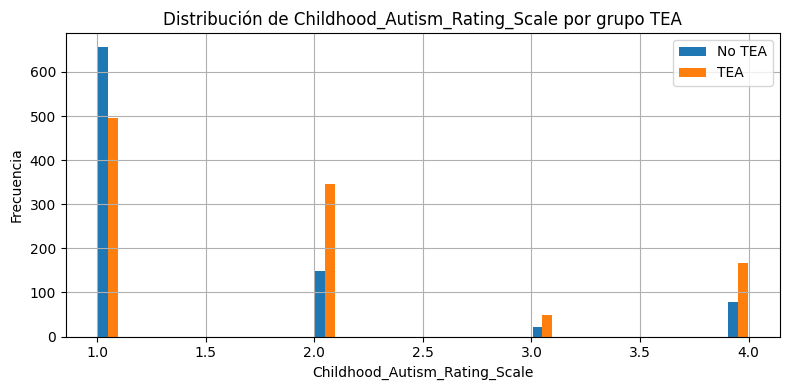

In [197]:
for var in lista_cuantitativas:
    plt.figure(figsize=(8, 4))

    # Valores para cada grupo
    valores_tea = df[df[target] == "Yes"][var]
    valores_no_tea = df[df[target] == "No"][var]

    # Histograma lado a lado
    plt.hist([valores_no_tea, valores_tea], bins=30, label=['No TEA', 'TEA'], align='mid', rwidth=0.9)
    plt.title(f'Distribución de {var} por grupo TEA')
    plt.xlabel(var)
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Podemos ver una clara diferencia entre los valores de los grupos de niños con TEA y sin TEA, en donde en los valores más altos relacionados a un diagnóstico potencial prevalece notoriamente el grupo de los que tienen TEA, y en los valores más bajos el grupo de los que no.

A continuación comparamos el promedio de cada variable cuantitativa en relación al target, niños con y sin TEA:

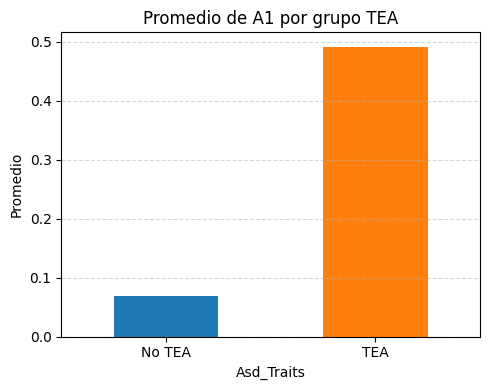

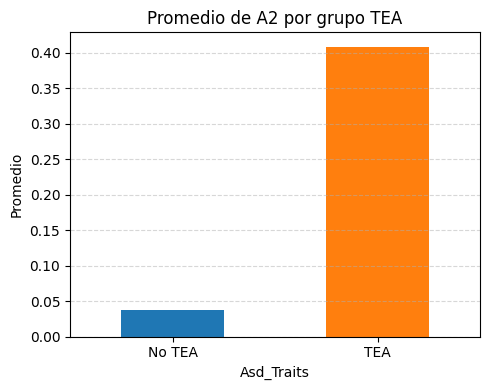

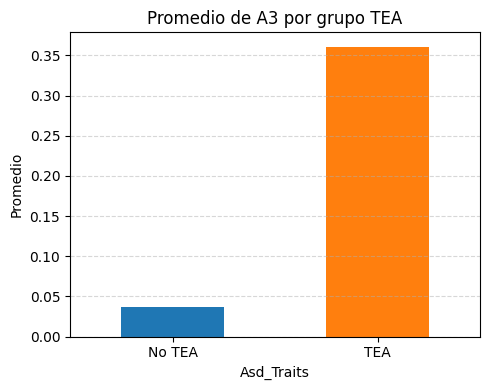

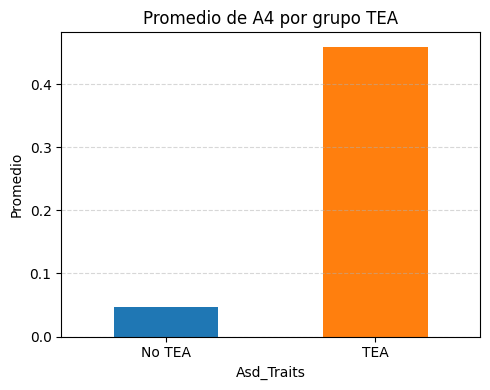

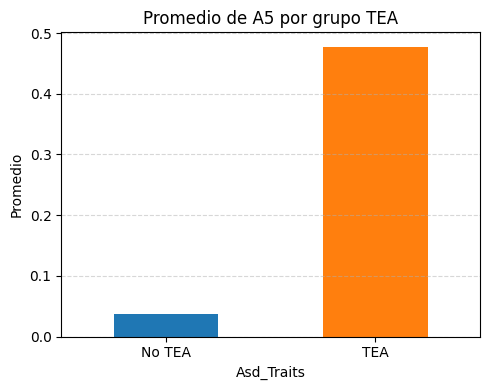

...

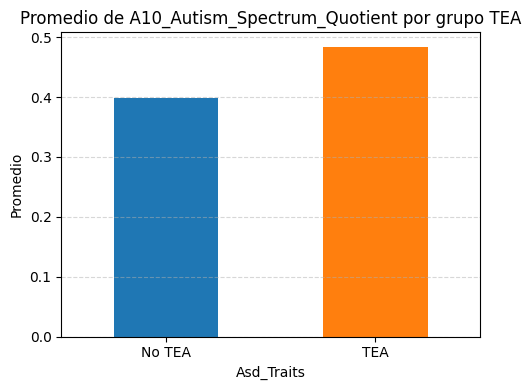

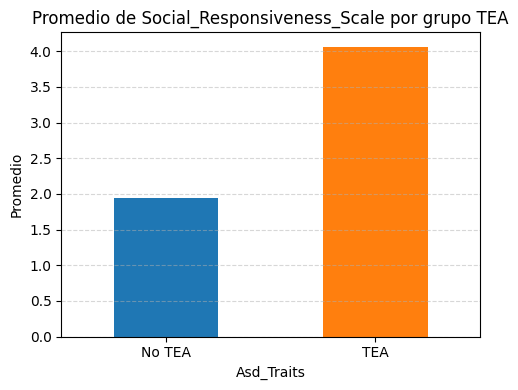

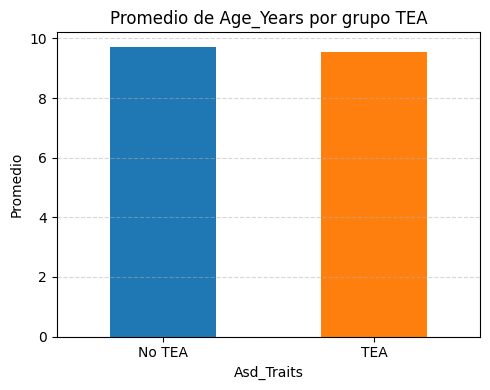

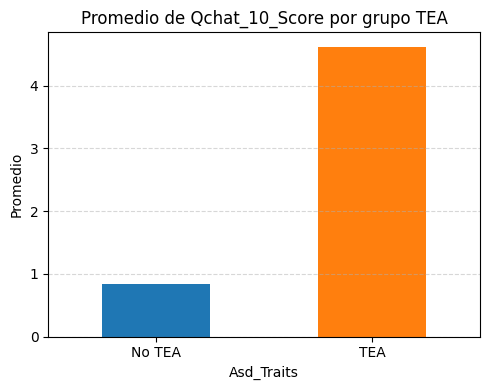

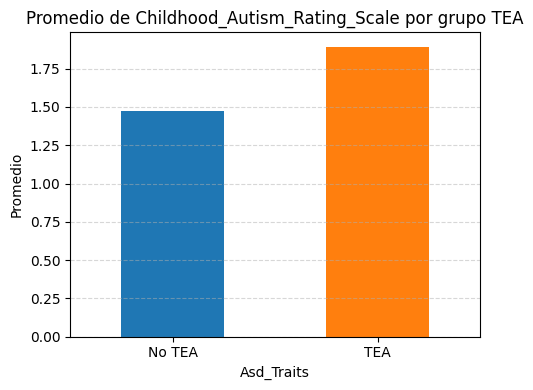

In [198]:
for var in lista_cuantitativas:
    # Calcular promedios por grupo
    promedios = df.groupby(target)[var].mean()

    # Crear gráfico
    plt.figure(figsize=(5, 4))
    promedios.plot(kind='bar', color=['#1f77b4', '#ff7f0e'])  # azul / naranja
    plt.title(f'Promedio de {var} por grupo TEA')
    plt.xticks([0, 1], ['No TEA', 'TEA'], rotation=0)
    plt.ylabel('Promedio')
    plt.xlabel(target)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout() #organiza el contenido del grafico
    plt.show()

Reafirmamos las conclusiones de los gráficos anteriores, los valores más altos son una característica frecuente en el grupo de los niños autistas.

A continuación validaremos si nuestras variables cuentan con valores outliers, analizaremos las 2 que cuentan con una distribución más extensa:

In [199]:
# Funcion para detección de outliers
def find_anomalies(data):
    anomalies = []
    # Set upper and lower limit to 2 standard deviation
    data_std = data.std()
    data_mean = data.mean()
    anomaly_cut_off = data_std * 3   # podemos cambiar este corte
    lower_limit  = data_mean - anomaly_cut_off
    upper_limit = data_mean + anomaly_cut_off
    print(lower_limit.iloc[0])
    print(upper_limit.iloc[0])

    # Generate outliers
    for index, row in data.iterrows():
        outlier = row # # obtener primer columna
        if (outlier.iloc[0] > upper_limit.iloc[0]) or (outlier.iloc[0] < lower_limit.iloc[0]):
            anomalies.append(index)
    return anomalies

In [200]:
anomalos = find_anomalies(df[['Social_Responsiveness_Scale']])
print(anomalos)

-7.989838157417229
14.157099758641095
[]


In [201]:
anomalos = find_anomalies(df[['Qchat_10_Score']])
print(anomalos)

-6.882064835410386
12.625053106700545
[]


Considerando que el límite superior e inferior fue la media más/menos 3 veces la desviación estándar, el cual muchas veces es tomado como el máximo de tolerancia, no se encontró ningún valor outlier.

### 1.3.2. Variables cualitativas

In [202]:
df.describe(include = 'object')

,Speech_Delay_Language_Disorder,Learning_Disorder,Genetic_Disorders,Depression,Global_Developmental_Delay_Intellectual_Disability,Social_Behavioural_Issues,Anxiety_Disorder,Sex,Ethnicity,Jaundice,Family_Mem_With_Asd,Who_Completed_The_Test,Asd_Traits
count,1961,1961,1961,1961,1961,1961,1961,1961,1961,1961,1961,1961,1961
unique,2,2,2,2,2,2,2,2,16,2,2,6,2
top,Yes,Yes,Yes,Yes,Yes,Yes,Yes,M,White European,Yes,No,Health Care Professional,Yes
freq,1034,1051,991,1031,1031,1031,1028,1426,541,1513,1319,1213,1056


In [203]:
# Creamos una lista con nuestras variables cualitativas
lista_cualitativas = df.drop(columns = lista_cuantitativas).columns
# Suponiendo que la variable objetivo para el análisis
lista_cualitativas = lista_cualitativas.drop(target)
lista_cualitativas

Index(['Speech_Delay_Language_Disorder', 'Learning_Disorder',
       'Genetic_Disorders', 'Depression',
       'Global_Developmental_Delay_Intellectual_Disability',
       'Social_Behavioural_Issues', 'Anxiety_Disorder', 'Sex', 'Ethnicity',
       'Jaundice', 'Family_Mem_With_Asd', 'Who_Completed_The_Test'],
      dtype='object')

A continuación, vemos que categorías contiene cada variable cualitativa

In [204]:
# Recorremos las columnas especificadas manualmente en la lista
for col in lista_cualitativas:
    print(f"\n🔸 {col} → {df[col].nunique()} categorías únicas:")
    print(df[col].unique())


🔸 Speech_Delay_Language_Disorder → 2 categorías únicas:
['Yes' 'No']

🔸 Learning_Disorder → 2 categorías únicas:
['Yes' 'No']

🔸 Genetic_Disorders → 2 categorías únicas:
['Yes' 'No']

🔸 Depression → 2 categorías únicas:
['Yes' 'No']

🔸 Global_Developmental_Delay_Intellectual_Disability → 2 categorías únicas:
['Yes' 'No']

🔸 Social_Behavioural_Issues → 2 categorías únicas:
['Yes' 'No']

🔸 Anxiety_Disorder → 2 categorías únicas:
['Yes' 'No']

🔸 Sex → 2 categorías únicas:
['F' 'M']

🔸 Ethnicity → 16 categorías únicas:
['middle eastern' 'White European' 'Middle Eastern' 'Hispanic' 'Black'
 'Asian' 'South Asian' 'Native Indian' 'Others' 'black' 'asian' 'Latino'
 'Mixed' 'south asian' 'mixed' 'PaciFica']

🔸 Jaundice → 2 categorías únicas:
['Yes' 'No']

🔸 Family_Mem_With_Asd → 2 categorías únicas:
['No' 'Yes']

🔸 Who_Completed_The_Test → 6 categorías únicas:
['Family Member' 'Health Care Professional' 'Self' 'Family member'
 'Others' 'School and NGO']


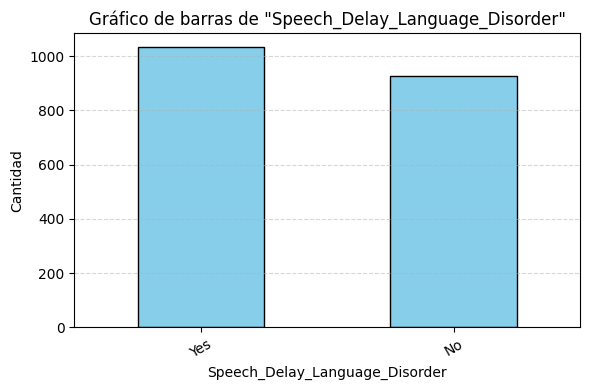

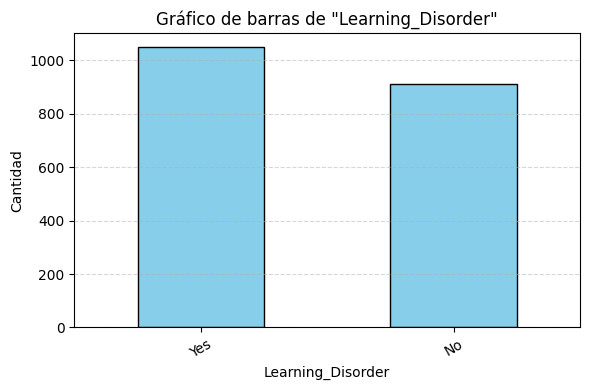

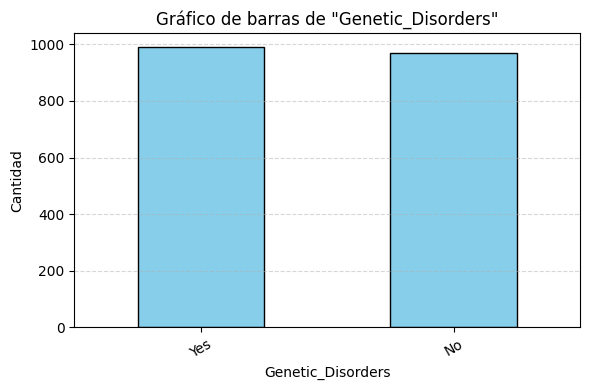

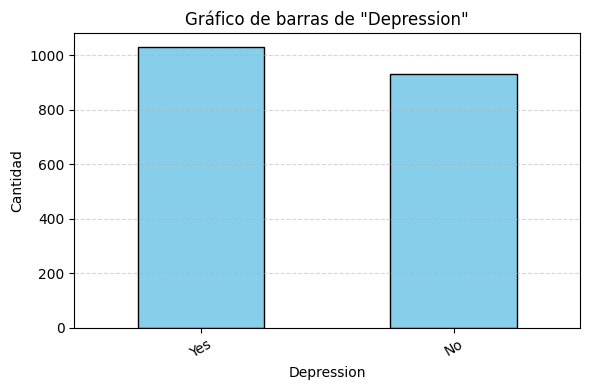

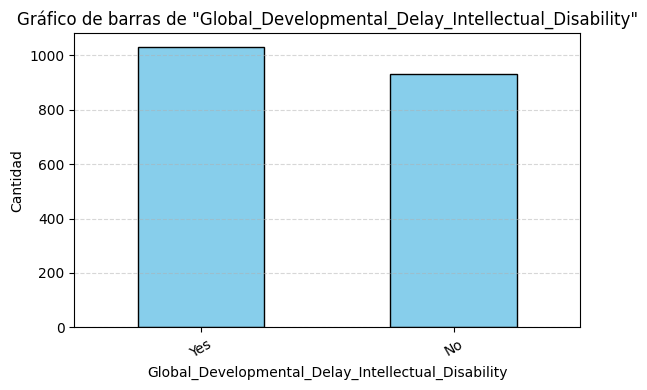

...

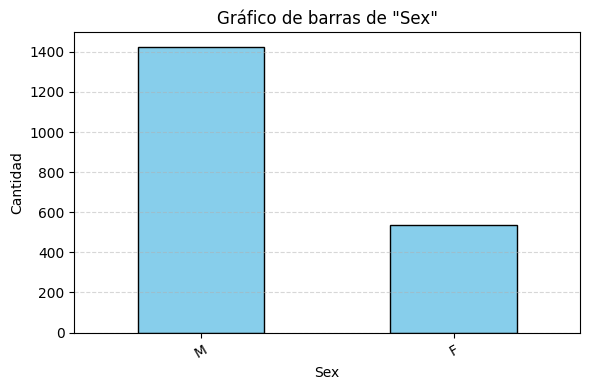

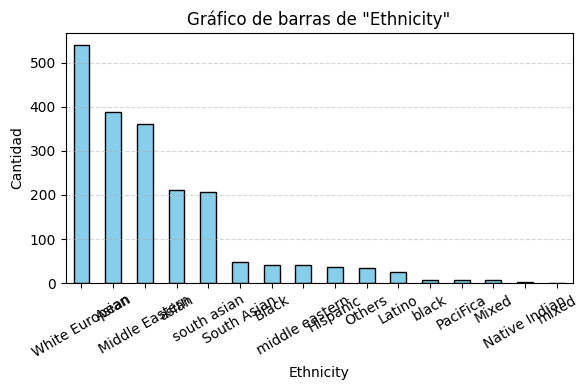

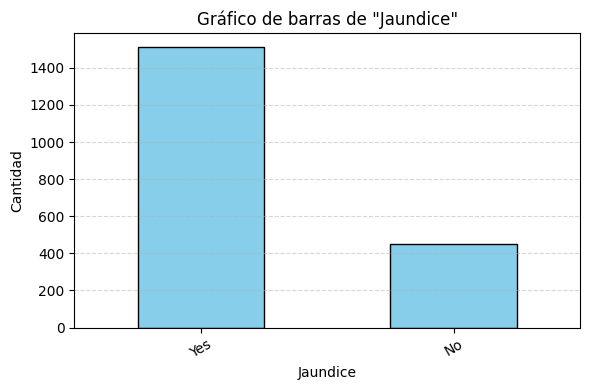

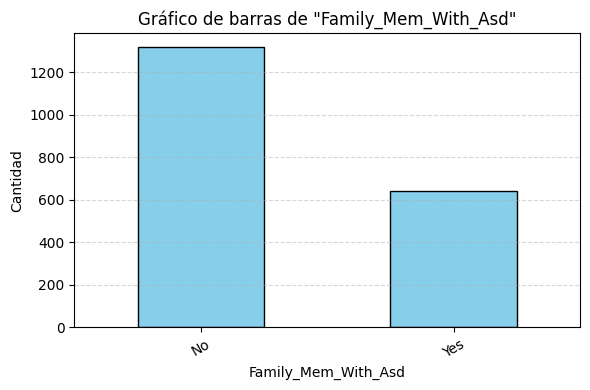

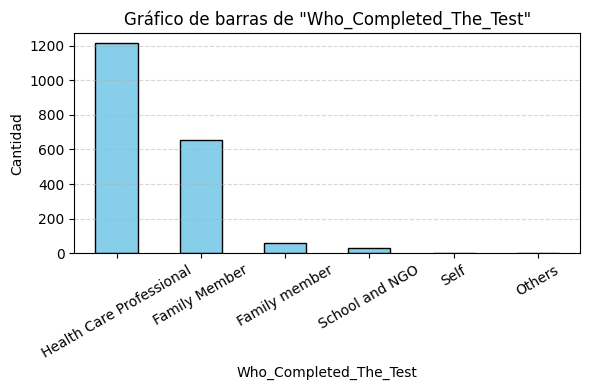

In [205]:
for var in lista_cualitativas:
    plt.figure(figsize=(6, 4))
    df[var].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Gráfico de barras de "{var}"')
    plt.xlabel(var)
    plt.ylabel('Cantidad')
    plt.xticks(rotation=30)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

A continuación veremos el porcentaje de cada categoría según cada variable en gráficos de pastel

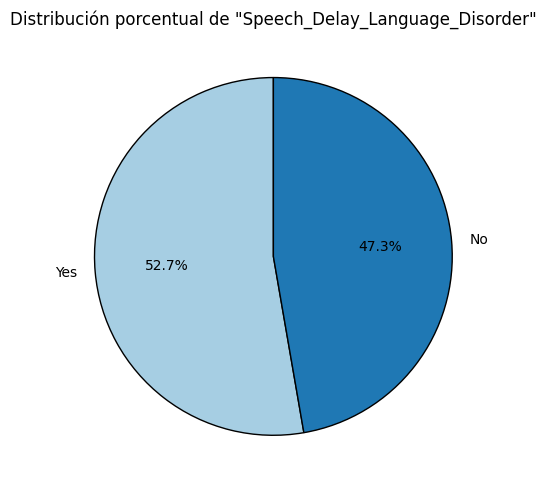

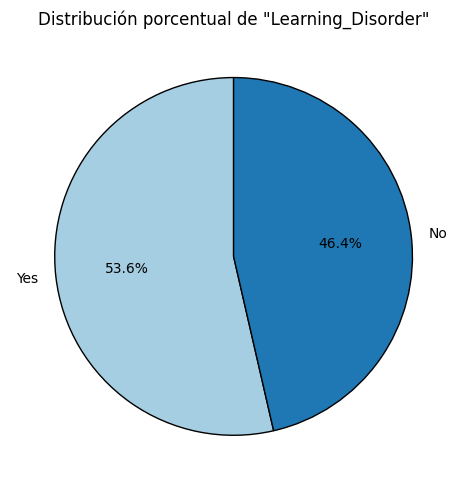

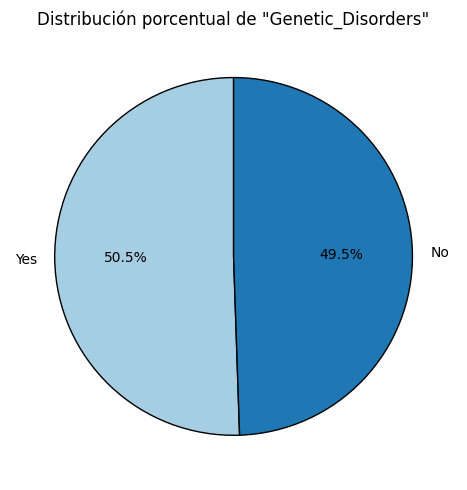

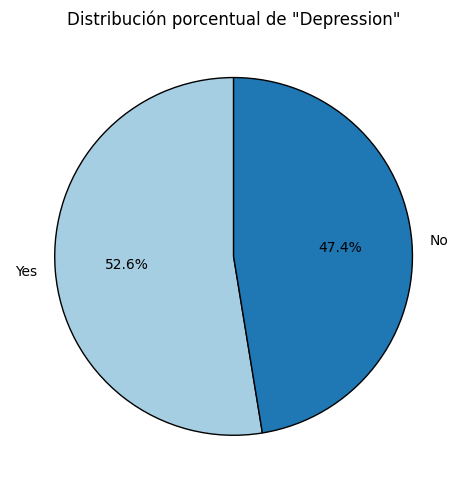

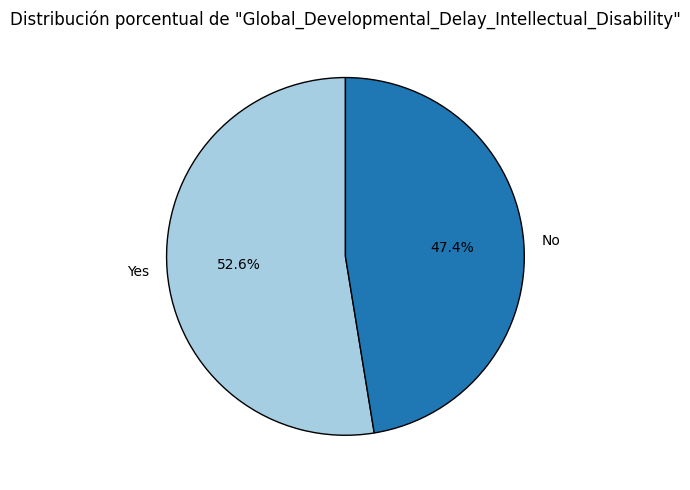

...

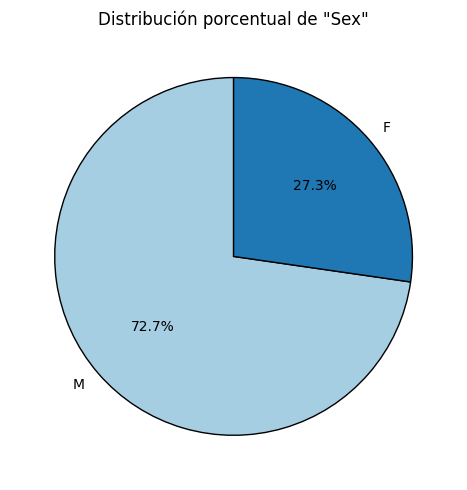

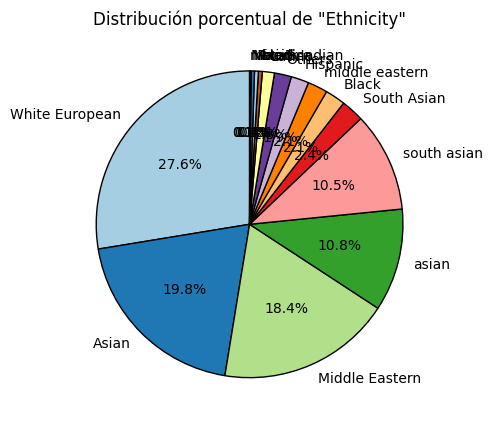

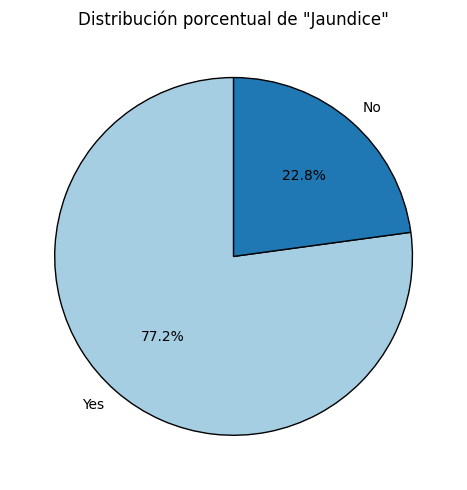

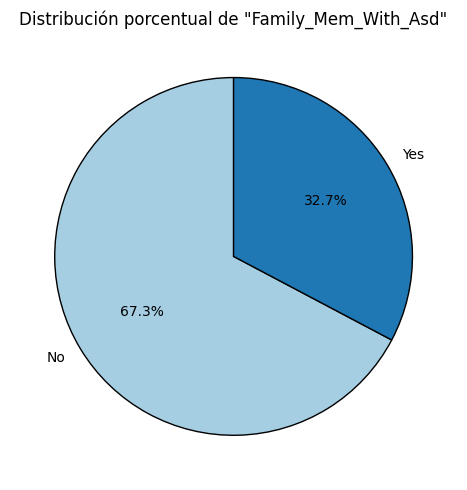

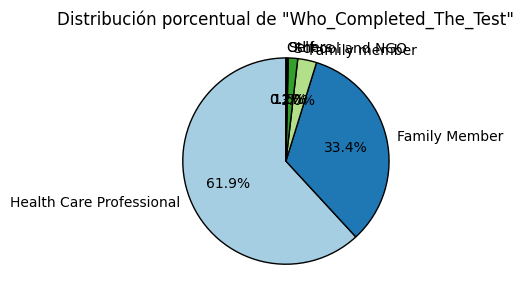

In [206]:
for var in lista_cualitativas:
    plt.figure(figsize=(5, 5))
    df[var].value_counts(normalize=True).plot(
        kind='pie',
        autopct='%1.1f%%',
        startangle=90,
        colors=plt.cm.Paired.colors,
        wedgeprops={'edgecolor': 'black'}
    )
    plt.title(f'Distribución porcentual de "{var}"')
    plt.ylabel('')  # Oculta el label lateral "value"
    plt.tight_layout()
    plt.show()

Podemos notar que algunas variables cualitativas tienen categorías con porcentajes muy similares, por lo que ahora analizaremos según los grupos de niños con y sin TEA.

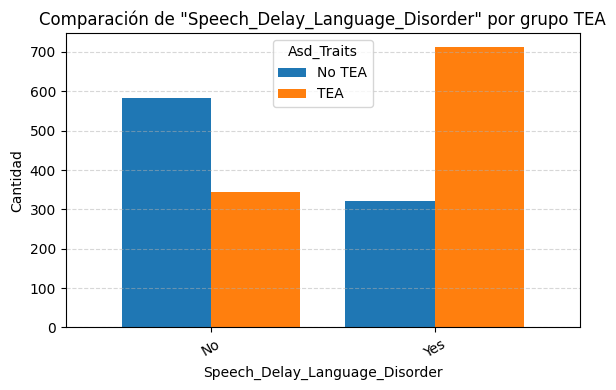

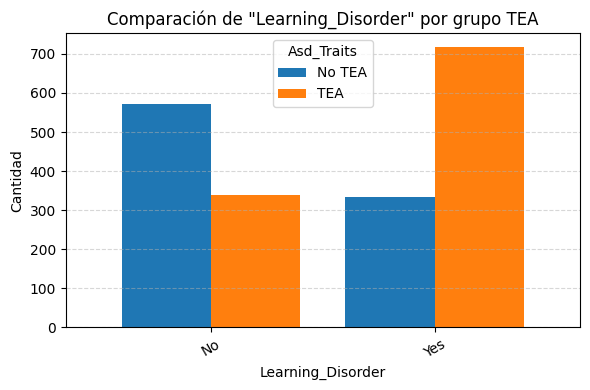

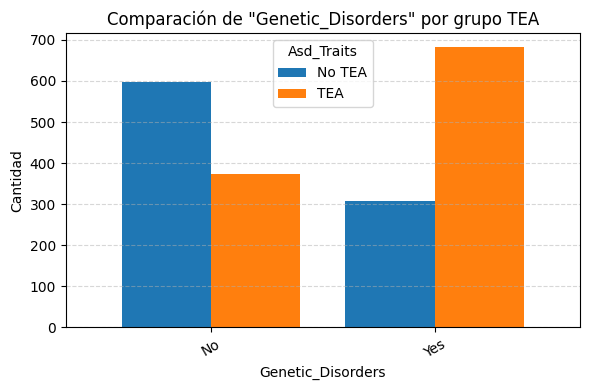

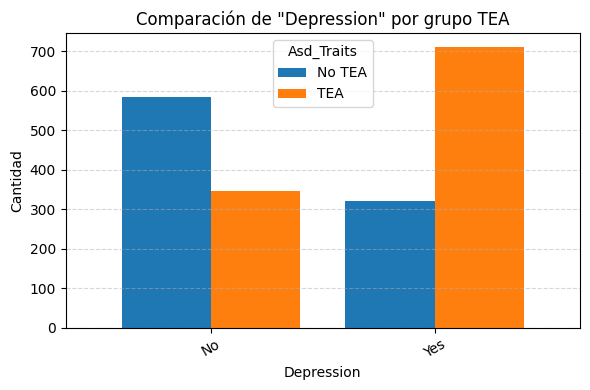

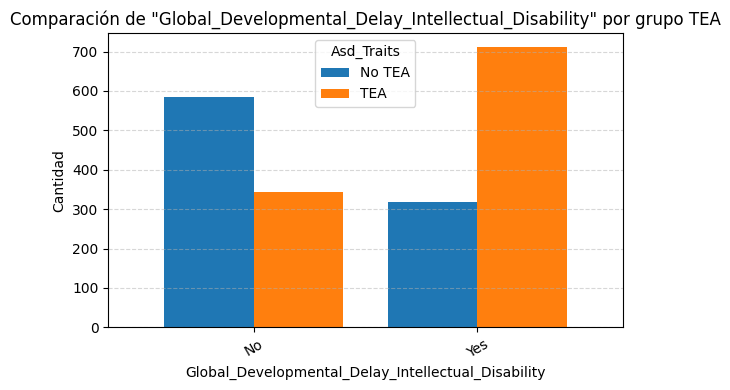

...

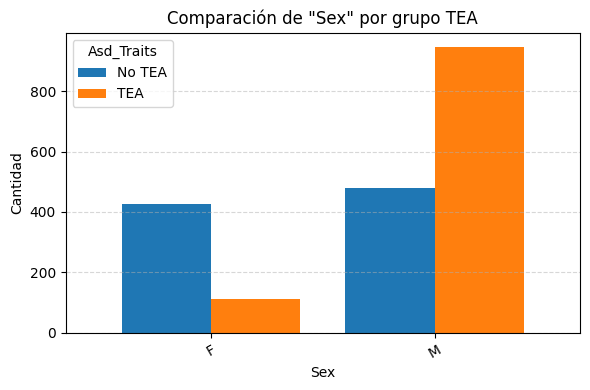

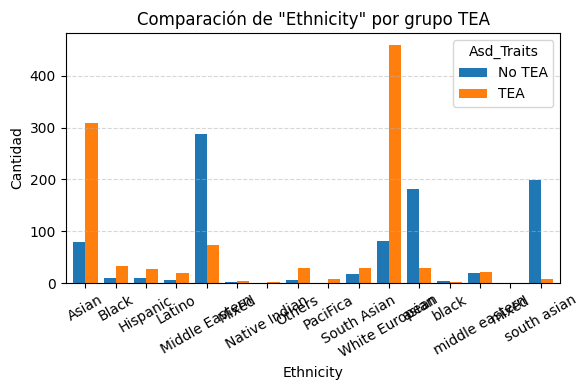

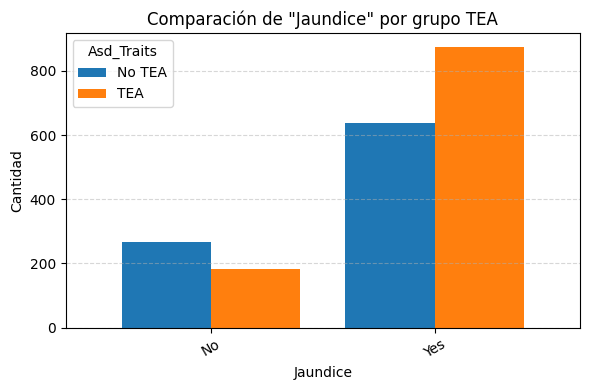

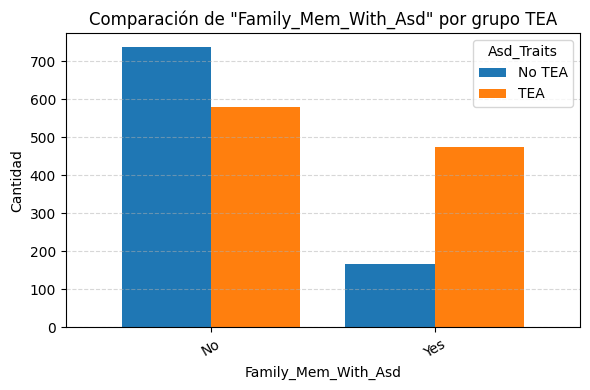

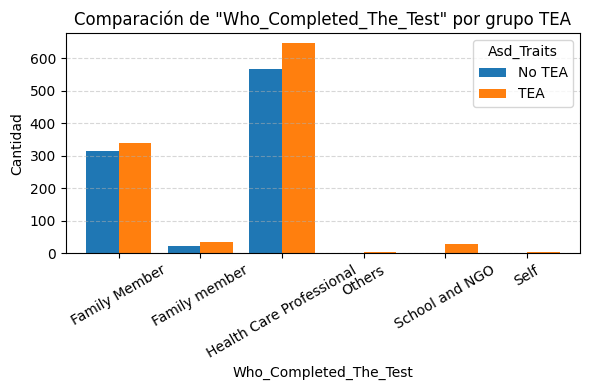

In [207]:
for var in lista_cualitativas:
    # Obtener conteos por categoría y grupo TEA
    conteos = df.groupby([target, var]).size().unstack().T #Reorganizamos .unstack() y trasponemos .T

    # Crear gráfico de barras agrupadas
    conteos.plot(kind='bar', figsize=(6, 4), width=0.8)

    plt.title(f'Comparación de "{var}" por grupo TEA')
    plt.xlabel(var)
    plt.ylabel('Cantidad')
    plt.xticks(rotation=30)
    plt.legend(title=target, labels=['No TEA', 'TEA'])
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

Podemos ver que se repite el hallazgo que encontramos en las variables cuantitativas, pero en este caso es con variables que representan cualidades de riesgo de un potencial autismo, por lo que se nota una clara diferencia en las columnas que corresponden a características del autismo, lo que justifica que el grupo de niños con TEA tenga una mayor presencia en estas.

Ahora analizaremos mejor la distribución de porcentajes comparando gráficos de pastel por cada grupo.

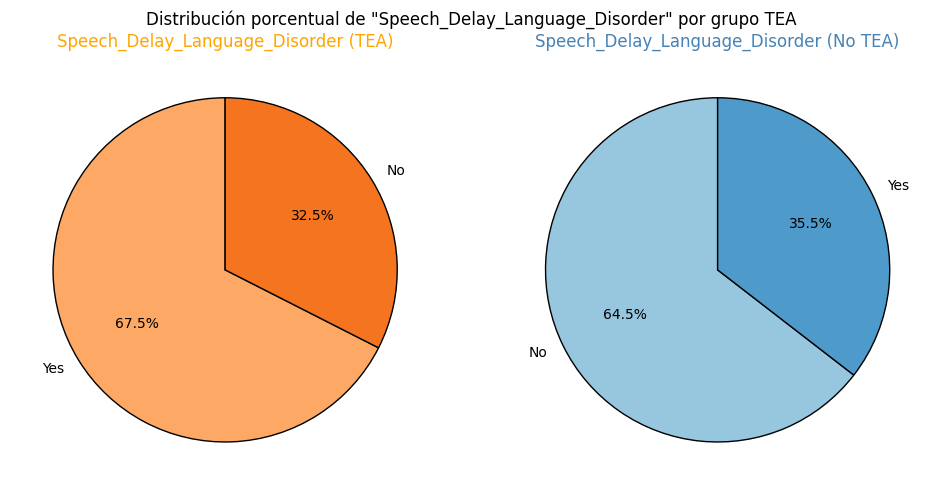

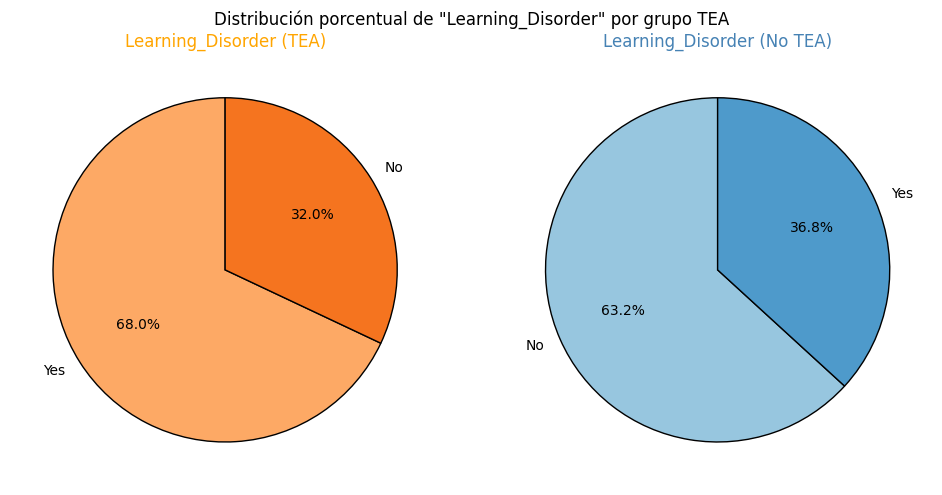

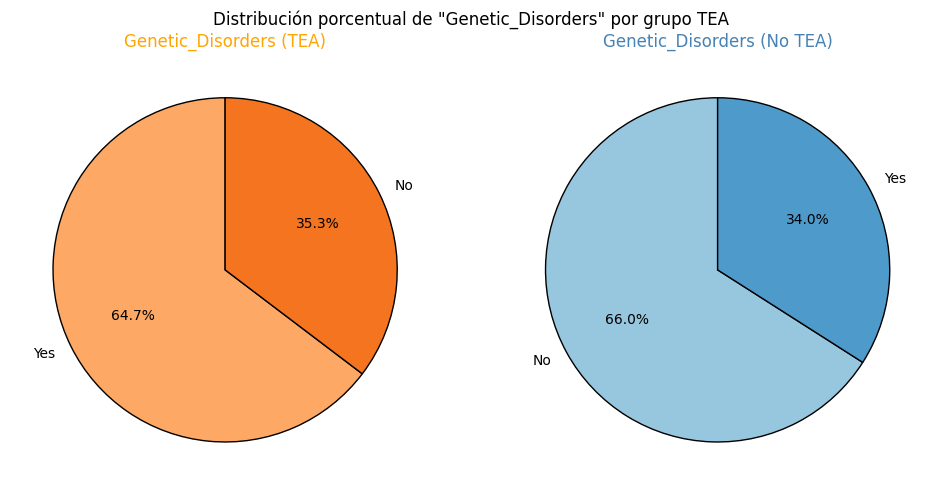

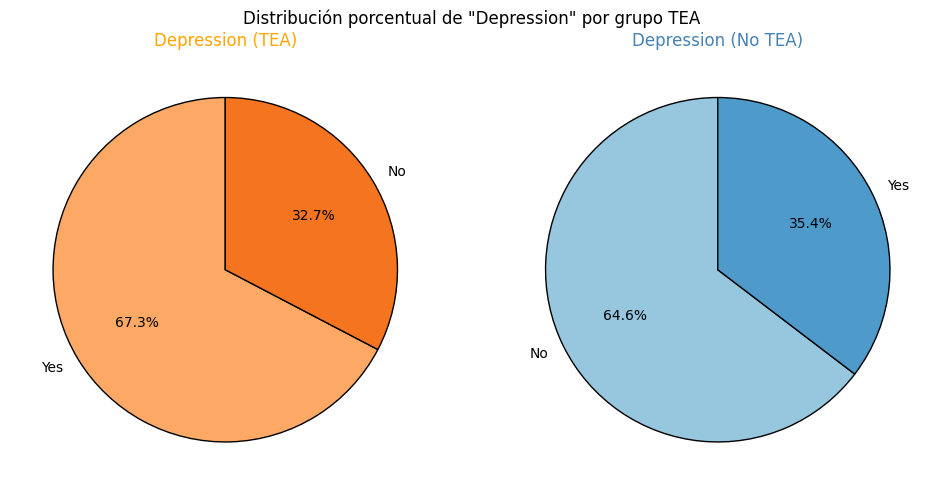

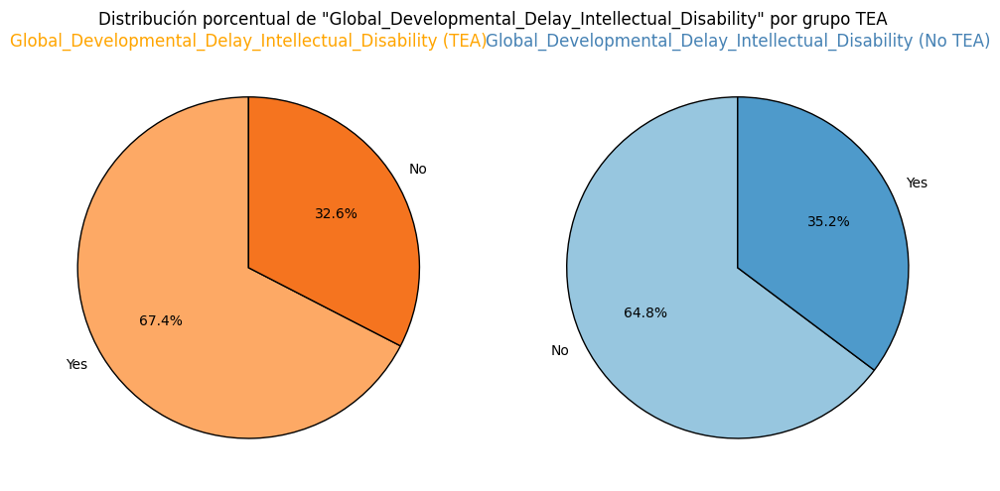

...

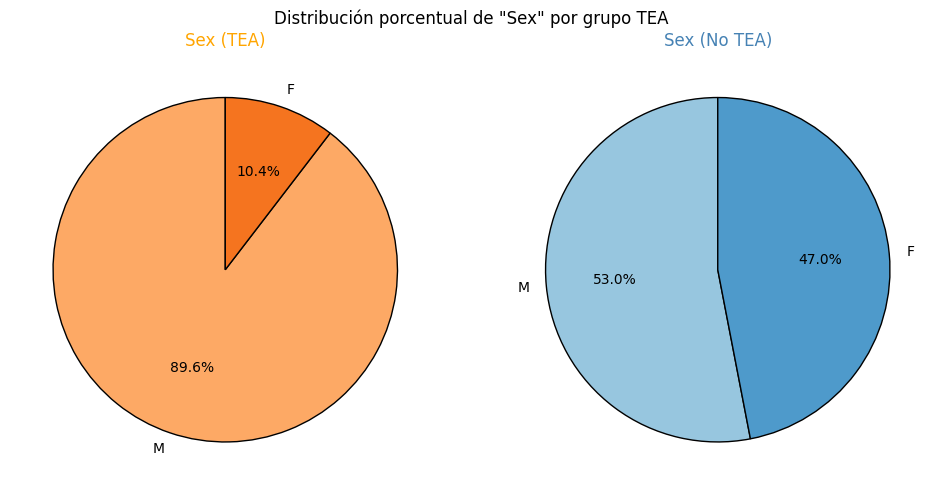

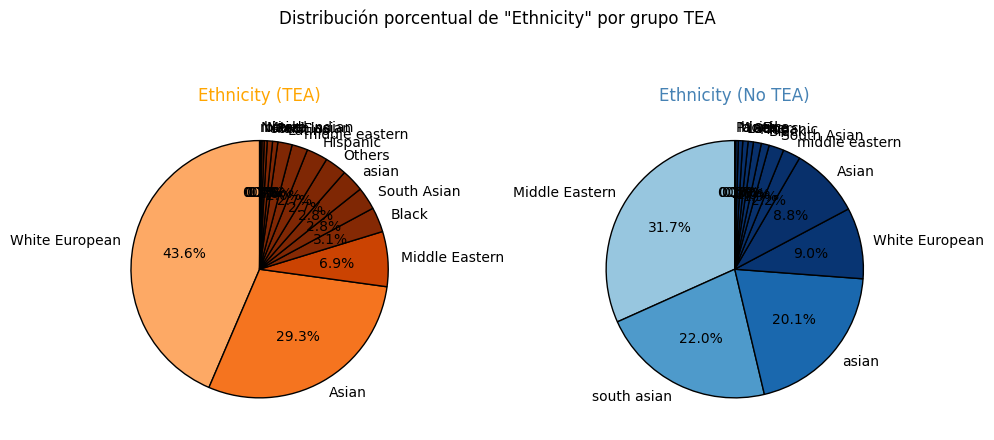

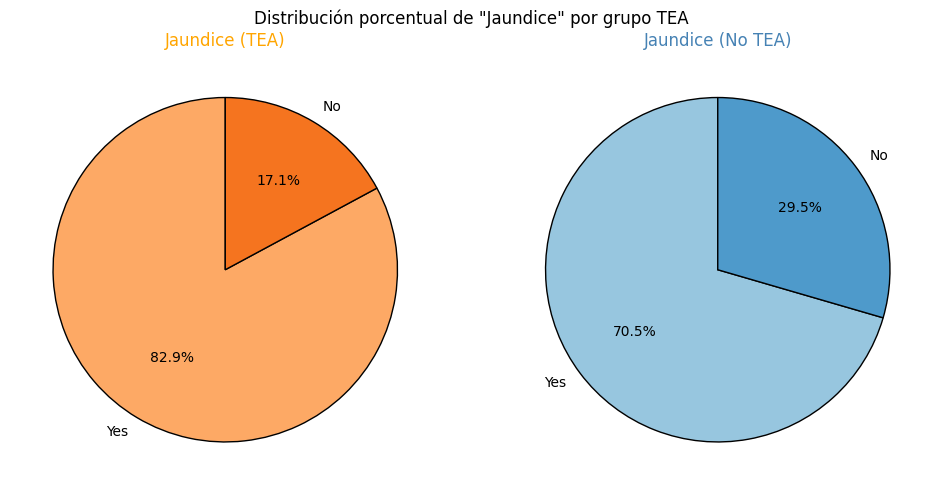

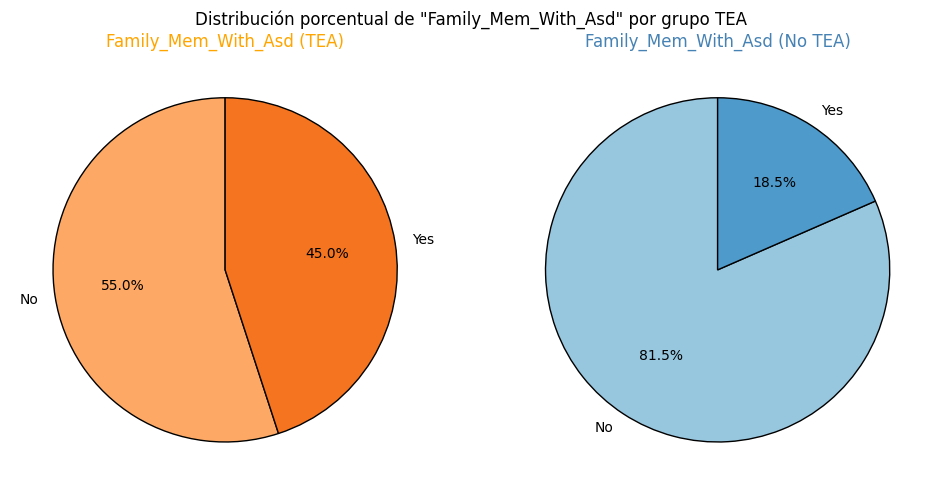

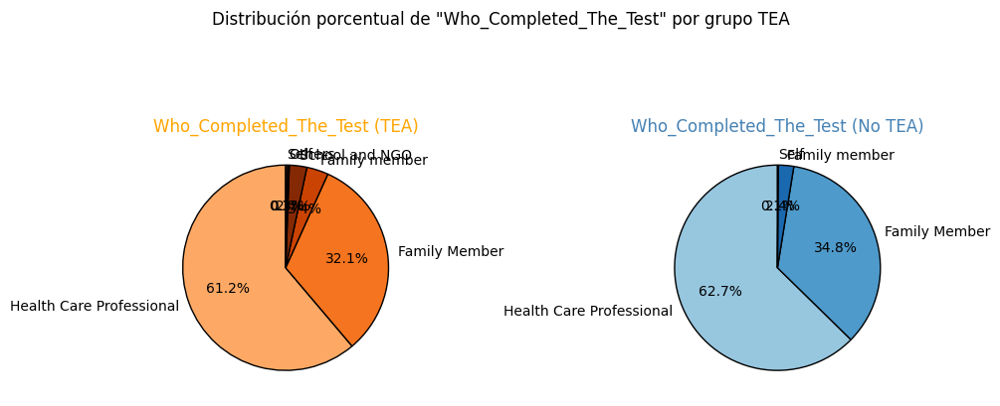

In [208]:
for var in lista_cualitativas:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # 🟠 Colores para TEA  //  normalize=True  => Convertir a porcentaje
    values_tea = df[df[target] == "Yes"][var].value_counts(normalize=True)
    colors_tea = plt.cm.Oranges(range(100, 100 + len(values_tea) * 50, 50))  # tono medio a fuerte

    # 🔵 Colores para No TEA
    values_no_tea = df[df[target] == "No"][var].value_counts(normalize=True)
    colors_no_tea = plt.cm.Blues(range(100, 100 + len(values_no_tea) * 50, 50))

    # Gráfico TEA
    values_tea.plot(
        kind='pie',
        autopct='%1.1f%%',
        startangle=90,
        colors=colors_tea,
        wedgeprops={'edgecolor': 'black'}, #bordes de la porcion del pastel
        ax=axes[0]
    )
    axes[0].set_title(f'{var} (TEA)', color='orange')
    axes[0].set_ylabel('')

    # Gráfico No TEA
    values_no_tea.plot(
        kind='pie',
        autopct='%1.1f%%',
        startangle=90,
        colors=colors_no_tea,
        wedgeprops={'edgecolor': 'black'},
        ax=axes[1]
    )
    axes[1].set_title(f'{var} (No TEA)', color='steelblue')
    axes[1].set_ylabel('')

    # Título general
    plt.suptitle(f'Distribución porcentual de "{var}" por grupo TEA', fontsize=12)
    plt.tight_layout()
    plt.show()

Existe una gran diferencia en la distribución de valores de cada categoría entre los 2 grupos estudiados.

## 1.4. Análisis de correlación y asociación

### 1.4.1. Variables cuantitativas

Analizamos la correlación entre nuestras variables numéricas.

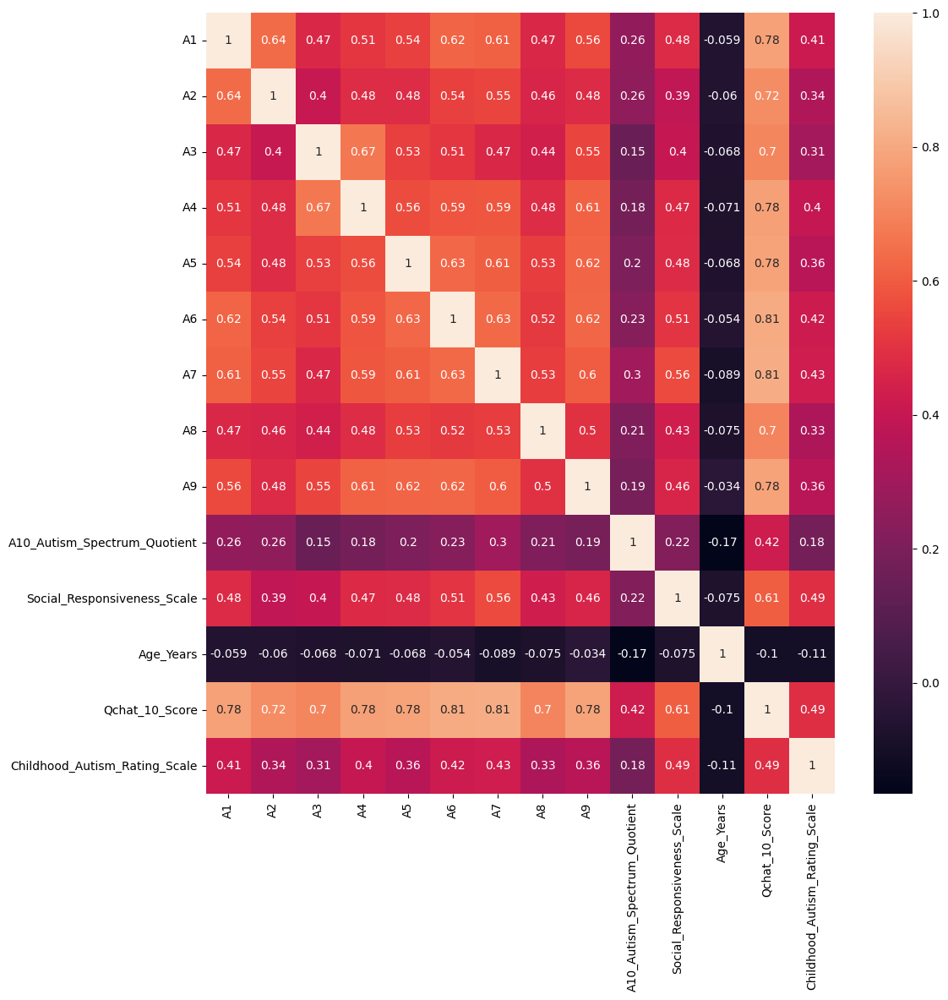

In [209]:
plt.figure(figsize = (12,12))
sns.heatmap(df[lista_cuantitativas].corr(),annot =True)
plt.show()

La variable target es binaria de tipo texto, la cambiamos a numérico:

In [210]:
df[target] = df[target].map({'Yes': 1, 'No': 0})

In [211]:
df[target].value_counts()

,count
Asd_Traits,
1,1056
0,905


In [212]:
df[target].value_counts(normalize = True)

,proportion
Asd_Traits,
1,0.538501
0,0.461499


In [213]:
df[target].mean()

np.float64(0.5385007649158593)

Analizamos la correlación de nuestras variables cuantitativas continuas con nuestra variable target cualitativa dicotómica, pero antes realizaremos pruebas de normalidad para elegir entre los coeficientes Spearman o Biserial puntual.

In [214]:
# Crear listas vacías para clasificar las variables
continuas = []
dicotomicas = []

# Iterar por cada columna en la lista de variables cuantitativas
for col in lista_cuantitativas:
    # Obtener valores únicos no nulos de la columna
    valores_unicos = df[col].unique()

    # Clasificar como dicotómica si tiene exactamente 2 valores únicos
    if len(valores_unicos) == 2:
        dicotomicas.append(col)
    else:
        continuas.append(col)

In [215]:
from scipy.stats import shapiro, pointbiserialr, spearmanr, anderson, jarque_bera

# Diccionario para almacenar resultados
resultados_correlacion = []

for col in continuas:
    datos = df[col]
    y_binaria = df.loc[datos.index, target]

    # Prueba de Shapiro-Wilk
    stat_shapiro, p_shapiro = shapiro(datos)
    es_normal_shapiro = p_shapiro > 0.05

    # Prueba de Anderson-Darling
    ad_result = anderson(datos, dist='norm')
    es_normal_anderson = ad_result.statistic < ad_result.critical_values[2]  # nivel de significancia 5%

    # Prueba de Jarque-Bera
    stat_jb, p_jb = jarque_bera(datos)
    es_normal_jb = p_jb > 0.05

    # Decisión combinada
    es_normal = es_normal_shapiro and es_normal_anderson and es_normal_jb
    normalidad = 'Sí' if es_normal else 'No'

    # Aplicar coeficiente correspondiente
    if es_normal:
        coef, p = pointbiserialr(y_binaria, datos)
        metodo = 'Biserial puntual'
    else:
        coef, p = spearmanr(datos, y_binaria)
        metodo = 'Spearman'

    # Interpretar el nivel de significancia
    if p < 0.001:
        interpretacion = 'Muy significativa (p < 0.001)'
    elif p < 0.01:
        interpretacion = 'Significativa (p < 0.01)'
    elif p < 0.05:
        interpretacion = 'Poco significativa (p < 0.05)'
    else:
        interpretacion = 'No significativa'

    resultados_correlacion.append({
        'Variable': col,
        'p_Shapiro': p_shapiro,
        'Anderson_stat': ad_result.statistic,
        'JB_p_value': p_jb,
        'Normalidad': normalidad,
        'Método': metodo,
        'Coeficiente': coef,
        'p_value': p,
        'Significancia': interpretacion
    })

# Mostrar resultados
df_resultados = pd.DataFrame(resultados_correlacion)
df_resultados

,Variable,p_Shapiro,Anderson_stat,JB_p_value,Normalidad,Método,Coeficiente,p_value,Significancia
0,Social_Responsiveness_Scale,5.118613e-46,177.430659,5.280079e-68,No,Spearman,0.311795,1.795910e-45,Muy significativa (p < 0.001)
1,Age_Years,1.369759e-32,80.699695,1.439505e-29,No,Spearman,-0.021891,3.326016e-01,No significativa
2,Qchat_10_Score,8.567511e-43,142.300317,5.465070e-58,No,Spearman,0.477798,2.171796e-112,Muy significativa (p < 0.001)
3,Childhood_Autism_Rating_Scale,2.253318e-51,259.812446,1.060162e-133,No,Spearman,0.247526,9.182572e-29,Muy significativa (p < 0.001)


Podemos apreciar que todas las variables no siguen una distribución normal, por lo que el coeficiente a usar fue el Spearman. Tras el análisis 3 de las 4 variables resultan significantes en relación al target, lo que justifica su inclusión al modelo final. La variable "Age_Years cuenta con un coeficiente negativo muy bajo y no resulta significante, por lo que se pone en duda su inclusión para el modelo final.

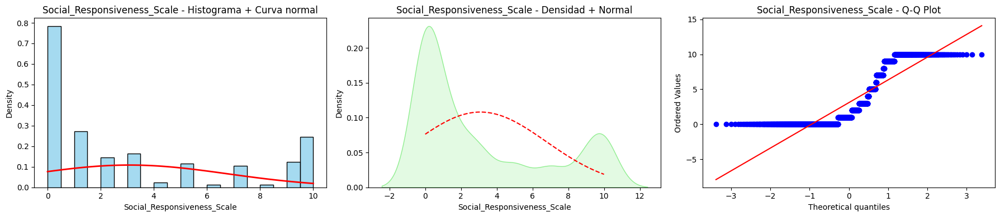

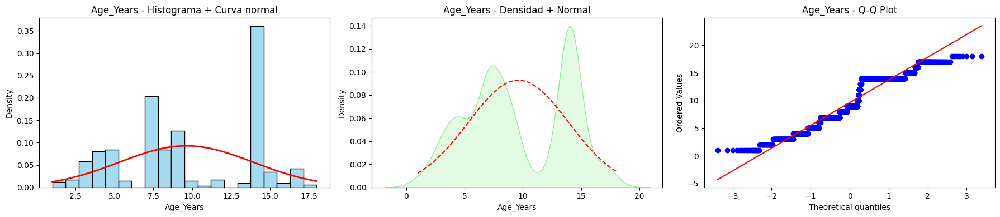

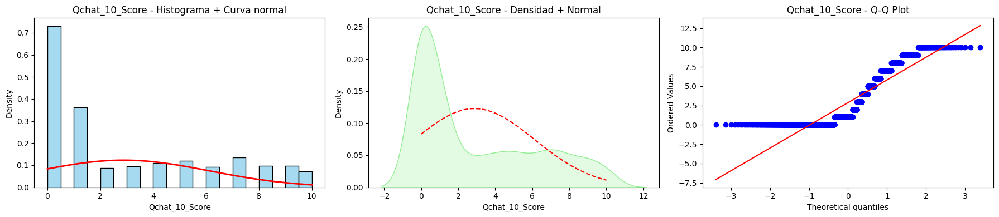

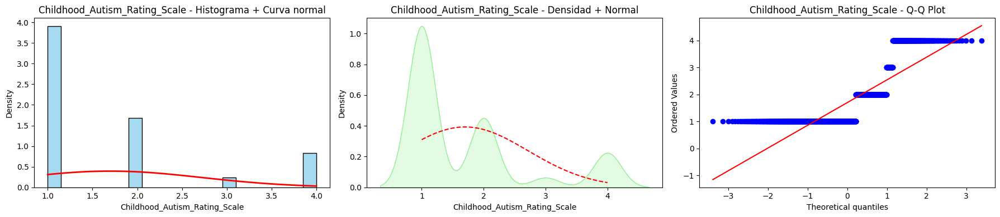

In [216]:
import scipy.stats as stats

for col in continuas:
    datos = df[col]

    # Crear figura
    plt.figure(figsize=(18, 4))

    # Histograma con curva normal
    plt.subplot(1, 3, 1)
    sns.histplot(datos, stat="density", bins=20, color="skyblue", edgecolor="black")
    mean = datos.mean()
    std = datos.std()
    x_vals = np.linspace(datos.min(), datos.max(), 100)
    plt.plot(x_vals, stats.norm.pdf(x_vals, mean, std), color="red", lw=2)
    plt.title(f"{col} - Histograma + Curva normal")

    # Densidad con curva normal
    plt.subplot(1, 3, 2)
    sns.kdeplot(data=datos, bw_adjust=1, fill=True, color="lightgreen")
    plt.plot(x_vals, stats.norm.pdf(x_vals, mean, std), color="red", linestyle="--")
    plt.title(f"{col} - Densidad + Normal")

    # Gráfico Q-Q
    plt.subplot(1, 3, 3)
    stats.probplot(datos, dist="norm", plot=plt)
    plt.title(f"{col} - Q-Q Plot")

    plt.tight_layout()
    plt.show()


Analizamos la asociación de nuestras variables dicotómicas continuas con nuestra variable target cualitativa dicotómica usando el coeficiente Phi de Pearson.

In [217]:
from sklearn.metrics import matthews_corrcoef

# Lista para guardar resultados
resultados_phi = []

for col in dicotomicas:
    x = df[col]
    y = df[target]

    # Calcular el coeficiente Phi usando MCC (es equivalente en 2x2)
    phi = matthews_corrcoef(x, y)

    resultados_phi.append({
        'Variable': col,
        'Coeficiente_Phi': phi
    })

# Crear DataFrame de resultados
df_phi = pd.DataFrame(resultados_phi)
df_phi

,Variable,Coeficiente_Phi
0,A1,0.461782
1,A2,0.434350
2,A3,0.396187
3,A4,0.462772
4,A5,0.491273
5,A6,0.501681
6,A7,0.497042
7,A8,0.412759
8,A9,0.500830
9,A10_Autism_Spectrum_Quotient,0.085278


Apreciamos que nuestras variables cuantitativas dicotómicas tienen un coeficiente Phi moderado con el target.

### 1.4.2. Variables cualitativas

Analizamos la asociación entre nuestras variables categóricas dicotómicas (por ejemplo, variables con valores True/False o 0/1) y la variable objetivo. Para ello utilizamos el coeficiente Phi, adecuado para tablas de contingencia 2x2.

In [218]:
# Crear listas vacías para clasificar las variables
multicat = []
cual_dicotomicas = []

# Iterar por cada columna en la lista de variables cuantitativas
for col in lista_cualitativas:
    # Obtener valores únicos no nulos de la columna
    valores_unicos = df[col].unique()

    # Clasificar como dicotómica si tiene exactamente 2 valores únicos
    if len(valores_unicos) == 2:
        cual_dicotomicas.append(col)
    else:
        multicat.append(col)

In [219]:
# Lista para guardar resultados
resultados_phi = []

for col in cual_dicotomicas:
    valores = df[col].unique()

    # Codificar según el contenido de la columna
    if set(valores) == {'Yes', 'No'}:
        x = df[col].map({'Yes': 1, 'No': 0})
    else:
        x = df[col].map({'M': 1, 'F': 0})

    y = df[target]

    # Calcular el coeficiente Phi usando MCC (es equivalente en 2x2)
    phi = matthews_corrcoef(x, y)

    resultados_phi.append({
        'Variable': col,
        'Coeficiente_Phi': phi,
    })

# Crear DataFrame de resultados
df_phi = pd.DataFrame(resultados_phi)
df_phi

,Variable,Coeficiente_Phi
0,Speech_Delay_Language_Disorder,0.320018
1,Learning_Disorder,0.311849
2,Genetic_Disorders,0.305556
3,Depression,0.319179
4,Global_Developmental_Delay_Intellectual_Disabi...,0.321227
5,Social_Behavioural_Issues,0.319179
6,Anxiety_Disorder,0.318342
7,Sex,0.409019
8,Jaundice,0.146794
9,Family_Mem_With_Asd,0.281820


Podemos ver que la asociación de nuestras variables cualitativas con nuestra target es moderada-baja.

Analizamos la asociación entre nuestras variables cualitativas con más de dos categorías y la variable objetivo mediante el coeficiente de asociación de Cramér’s V, útil para tablas de contingencia mayores a 2x2.

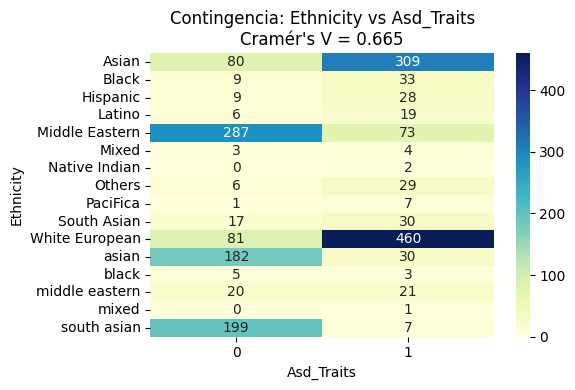

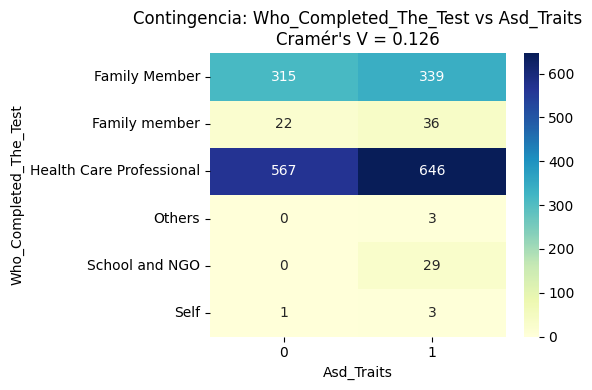

,Variable,Coeficiente_Cramér's V
0,Ethnicity,0.664569
1,Who_Completed_The_Test,0.125653


In [220]:
from scipy.stats import chi2_contingency

# Función para calcular Cramér's V
def cramers_v(x, y):
    tabla = pd.crosstab(x, y)
    chi2, _, _, _ = chi2_contingency(tabla)
    n = tabla.sum().sum()
    phi2 = chi2 / n
    r, k = tabla.shape
    return np.sqrt(phi2 / min(k - 1, r - 1))

# Calcular Cramér's V para variables multicategóricas
resultados_cramers = []

for col in multicat:
    try:
        x = df[col]
        y = df[target]
        v = cramers_v(x, y)
        resultados_cramers.append({
            'Variable': col,
            "Coeficiente_Cramér's V": v,
        })

        # Crear y mostrar el heatmap de la tabla de contingencia
        tabla = pd.crosstab(x, y)
        plt.figure(figsize=(6, 4))
        sns.heatmap(tabla, annot=True, fmt='d', cmap='YlGnBu')
        plt.title(f"Contingencia: {col} vs Asd_Traits\nCramér's V = {v:.3f}")
        plt.xlabel("Asd_Traits")
        plt.ylabel(col)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error con la variable {col}: {e}")
        continue

# Crear DataFrame de resultados
df_cramers = pd.DataFrame(resultados_cramers)
df_cramers

Podemos ver que la variable multicategórica con la menor asociación es "Who_Completed_The_Test", por lo que pone en duda su inclusión al modelo final.

Evaluamos la asociación estadística entre nuestras variables categóricas y la variable objetivo utilizando la prueba de Chi-cuadrado, con el fin de determinar si existen relaciones significativas.

In [221]:
from scipy.stats import chi2_contingency

# Recorrer todas las variables cualitativas (excepto el target)
for var in lista_cualitativas:
    if var == target:
        continue  # Saltar la variable target

    try:
        # Tabla de contingencia
        tabla = pd.crosstab(df[var], df[target])

        # Aplicar test chi-cuadrado
        chi2, p, dof, expected = chi2_contingency(tabla)

        # Mostrar resultado
        print(f"{var}: Valor p = {p:.6f} → {'Significativo' if p < 0.05 else 'No significativo'}")

    except Exception as e:
        print(f"{var}: Error al calcular test → {e}")


Speech_Delay_Language_Disorder: Valor p = 0.000000 → Significativo
Learning_Disorder: Valor p = 0.000000 → Significativo
Genetic_Disorders: Valor p = 0.000000 → Significativo
Depression: Valor p = 0.000000 → Significativo
Global_Developmental_Delay_Intellectual_Disability: Valor p = 0.000000 → Significativo
Social_Behavioural_Issues: Valor p = 0.000000 → Significativo
Anxiety_Disorder: Valor p = 0.000000 → Significativo
Sex: Valor p = 0.000000 → Significativo
Ethnicity: Valor p = 0.000000 → Significativo
Jaundice: Valor p = 0.000000 → Significativo
Family_Mem_With_Asd: Valor p = 0.000000 → Significativo
Who_Completed_The_Test: Valor p = 0.000010 → Significativo


Después de analizar los valores p mediante la prueba de chi-cuadrado, se observa que todas las variables cualitativas evaluadas presentan asociaciones estadísticamente significativas con la variable objetivo (p < 0.05).
Esto indica que estas variables podrían tener un rol importante en la predicción del target y deben ser consideradas en el modelado.

# 2. PREPROCESAMIENTO DE DATOS

## 2.1. Creación de nuevas variables

Creamos una copia del dataframe.

In [222]:
df_pre = df.copy()

1) Creamos una nueva variable cualitativa para asignar los grupos etarios en base a la columna Age_Years

In [223]:
# Asignamos las condiciones y creamos 5 categorías de grupos etarios
condiciones = [
    (df_pre['Age_Years'] >= 1) & (df_pre['Age_Years'] <= 3),
    (df_pre['Age_Years'] >= 4) & (df_pre['Age_Years'] <= 6),
    (df_pre['Age_Years'] >= 7) & (df_pre['Age_Years'] <= 10),
    (df_pre['Age_Years'] >= 11) & (df_pre['Age_Years'] <= 14),
    (df_pre['Age_Years'] >= 15) & (df_pre['Age_Years'] <= 18)
]

opciones = ['Toddlers', 'Preschoolers', 'Middle childhood',
           'Early Teenagers', 'Teenager']

df_pre['Age_Group'] = np.select(condiciones, opciones, default='Other')

In [224]:
df_pre[['Age_Years', 'Age_Group']].head(10)

,Age_Years,Age_Group
0,2,Toddlers
1,3,Toddlers
2,3,Toddlers
3,2,Toddlers
4,2,Toddlers
5,2,Toddlers
6,3,Toddlers
7,3,Toddlers
8,3,Toddlers
9,2,Toddlers


2) Creamos una variable para evaluar le índice de comorbilidad, ofrece una métrica estandarizada que mejora la interpretación clínica y la utilidad analítica de los datos sobre comorbilidades en el autismo.

In [225]:
# Definir las columnas de comorbilidad
comorbidity_columns = ['Speech_Delay_Language_Disorder', 'Learning_Disorder', 'Genetic_Disorders',
                      'Depression', 'Global_Developmental_Delay_Intellectual_Disability',
                      'Social_Behavioural_Issues', 'Anxiety_Disorder']

for col in comorbidity_columns:
    df_pre[col] = df_pre[col].map(lambda x: 1 if x == 'Yes' else 0) #Las variables binarias las codificamos en 1 y 0

# Creamos la variable de porcentaje de comorbilidades  //  sum(axis=1) => Suma todas las filas   sum(axis=0) => Suma todas las columnas
df_pre['Comorbidity_%'] = (df_pre[comorbidity_columns].sum(axis=1) / len(comorbidity_columns)) * 100

# Redondear a dos decimales (opcional)
df_pre['Comorbidity_%'] = df_pre['Comorbidity_%'].round(2)

In [226]:
df_pre[comorbidity_columns + ['Comorbidity_%']].head(10)

,Speech_Delay_Language_Disorder,Learning_Disorder,Genetic_Disorders,Depression,Global_Developmental_Delay_Intellectual_Disability,Social_Behavioural_Issues,Anxiety_Disorder,Comorbidity_%
0,1,1,1,1,1,1,1,100.00
1,1,1,1,1,1,1,1,100.00
2,1,1,1,1,1,1,1,100.00
3,1,1,0,1,1,1,1,85.71
4,1,1,0,1,1,1,1,85.71
5,1,1,0,1,1,1,1,85.71
6,1,1,1,1,1,1,1,100.00
7,1,1,1,1,1,1,1,100.00
8,1,1,0,1,1,1,1,85.71
9,1,1,0,1,1,1,1,85.71


3) A continuación asignaremos las variables correspondientemente a las 2 características clave más representativas del TEA, las capacidades comunicativas y las de interacción social, con el objetivo de obtener variables numéricas como porcentaje segun cada perfil, y por último el perfil predominante como variable categórica.

In [227]:
# Lista de columnas relacionadas con habilidades comunicativas
communication_columns = ['A3', 'A8', 'A9', 'Speech_Delay_Language_Disorder', 'Learning_Disorder']
# Pesos asignados a cada variable con validación profesional
communication_weights = [0.20, 0.20, 0.20, 0.25, 0.15]

🟦 Tabla: Variables de Habilidades Comunicativas

| Variable                         | Peso (%) | Justificación                                                                 |
|----------------------------------|----------|-------------------------------------------------------------------------------|
| A3 (uso de señas para pedir)     | 20%      | Refleja intencionalidad comunicativa activa; indica deseo de interacción.    |
| A8 (primeras palabras)           | 20%      | Evalúa el desarrollo del lenguaje expresivo en una etapa crítica.            |
| A9 (uso de gestos simples)       | 20%      | Indicador temprano de comunicación no verbal; relevante.            |
| Speech_Delay_Language_Disorder   | 25%      | Evidencia objetiva del retraso del habla; debe tener mayor peso.        |
| Learning_Disorder                | 15%      | Afecta la comunicación desde un enfoque más general; clínicamente relevante. |


In [228]:
# Lista de columnas relacionadas con interacción social
social_interaction_columns = ['A1', 'A2', 'A4', 'A5', 'A6', 'A7', 'Social_Behavioural_Issues', 'Anxiety_Disorder']
# Pesos asignados a cada variable con validación profesional
social_interaction_weights = [0.10, 0.10, 0.10, 0.15, 0.15, 0.15, 0.20, 0.05]

 🟩 Tabla: Variables de Interacción Social

| Variable                      | Peso (%) | Justificación                                                                 |
|-------------------------------|----------|-------------------------------------------------------------------------------|
| A1 (respuesta al nombre)      | 10%      | Reacción básica al entorno social; marcador inicial de atención conjunta.    |
| A2 (contacto visual)          | 10%      | Indicador clave de conexión social temprana.                                 |
| A4 (compartir interés)        | 10%      | Evalúa reciprocidad social; uno de los ejes del TEA.                         |
| A5 (juego simbólico)          | 15%      | Componente avanzado de socialización; afecta al desarrollo cognitivo.        |
| A6 (seguir la mirada)         | 15%      | Parte de la atención compartida; muy relevante en detección de TEA.          |
| A7 (respuesta emocional)      | 15%      | Mide empatía básica, relevante pero dependiente del contexto.                |
| Social_Behavioural_Issues     | 20%      | Relación directa con el perfil social-interactivo autista; debe tener mayor peso.    |
| Anxiety_Disorder              | 5%       | Influye de manera secundaria en la interacción social, pero no es marcador específico de TEA.      |


In [229]:
# Communication score ponderado
df_pre['Communication_Issues_%'] = np.average(
    df_pre[communication_columns], axis=1, weights=communication_weights
) * 100

# Social interaction score ponderado
df_pre['Social_Interaction_Issues_%'] = np.average(
    df_pre[social_interaction_columns], axis=1, weights=social_interaction_weights
) * 100

In [230]:
# Función para determinar Clinical_Profile
def classify_profile(row):
    comm_pct = row['Communication_Issues_%']
    social_pct = row['Social_Interaction_Issues_%']

    # Determinar la categoría
    if abs(comm_pct - social_pct) < 10:  # Diferencia menor al 10%
        return 'Mixed'
    elif comm_pct > social_pct:
        return 'Communication'
    else:
        return 'Social interaction'

In [231]:
# Aplicar la función de clasificación
df_pre['Clinical_Profile'] = df_pre.apply(classify_profile, axis=1)

In [232]:
df_pre[['Communication_Issues_%','Social_Interaction_Issues_%','Clinical_Profile','Asd_Traits']].head(25)

,Communication_Issues_%,Social_Interaction_Issues_%,Clinical_Profile,Asd_Traits
0,60.0,40.0,Communication,0
1,40.0,75.0,Social interaction,1
2,60.0,50.0,Communication,1
3,100.0,100.0,Mixed,1
4,80.0,100.0,Social interaction,1
5,80.0,90.0,Social interaction,1
6,60.0,75.0,Social interaction,1
7,80.0,65.0,Communication,1
8,40.0,40.0,Mixed,0
9,100.0,75.0,Communication,1


## 2.2. Análisis de nuevas variables en relación al target

### 2.2.1. Variables cuantitativas creadas

In [233]:
# Creamos una lista con las nuevas variables cuantitativas
cuanti_nuevas = ['Comorbidity_%', 'Communication_Issues_%', 'Social_Interaction_Issues_%']

In [234]:
df_pre[cuanti_nuevas].describe()

,Comorbidity_%,Communication_Issues_%,Social_Interaction_Issues_%
count,1961.000000,1961.000000,1961.000000
mean,52.429465,35.397756,34.892912
std,49.534954,36.852504,37.742938
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,100.000000,40.000000,25.000000
75%,100.000000,60.000000,75.000000
max,100.000000,100.000000,100.000000


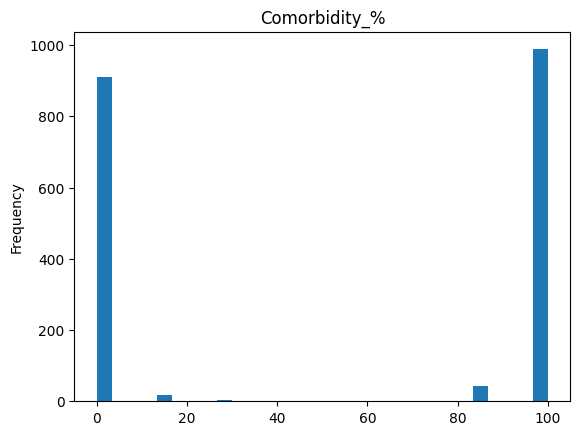

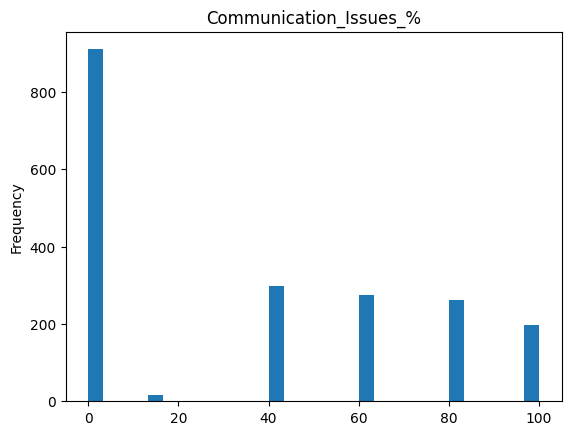

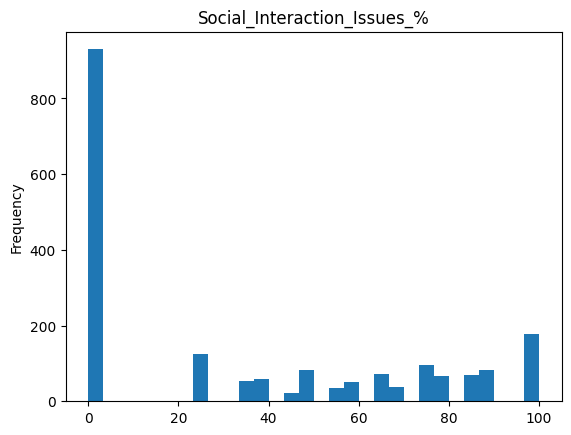

In [235]:
# realizamos histogramas para revisar la distribución de cada variable cuantitativa
for var in cuanti_nuevas:
    df_pre[var].plot(kind='hist', title=var, bins=30)  #bins => cuantas barras como maximo se pueden ver
    plt.show()

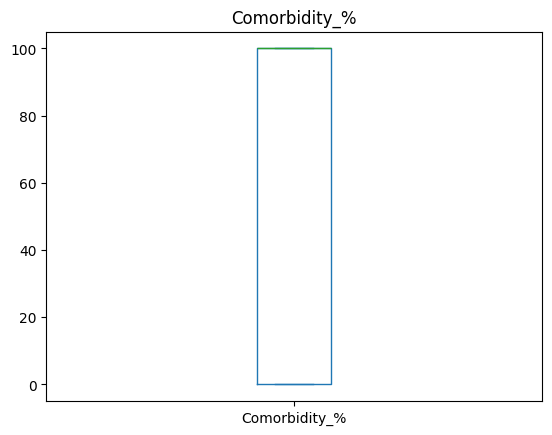

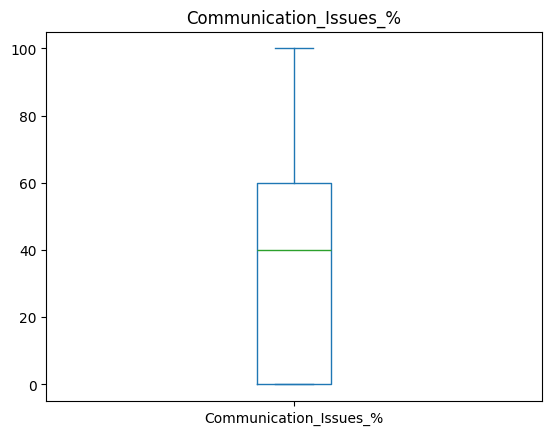

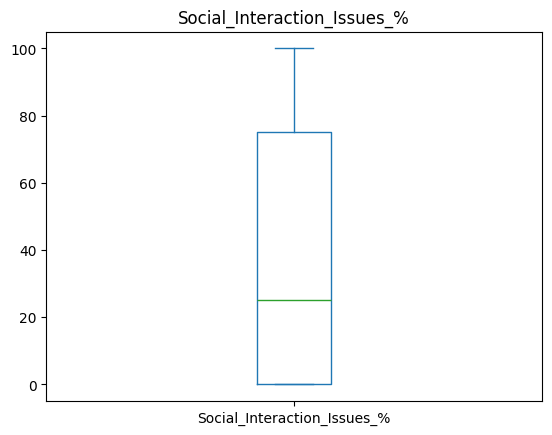

In [236]:
# realizamos diagramas de cajas para revisar la distribución de cada variable cuantitativa
for var in cuanti_nuevas:
    df_pre[var].plot(kind='box', title=var)
    plt.show()

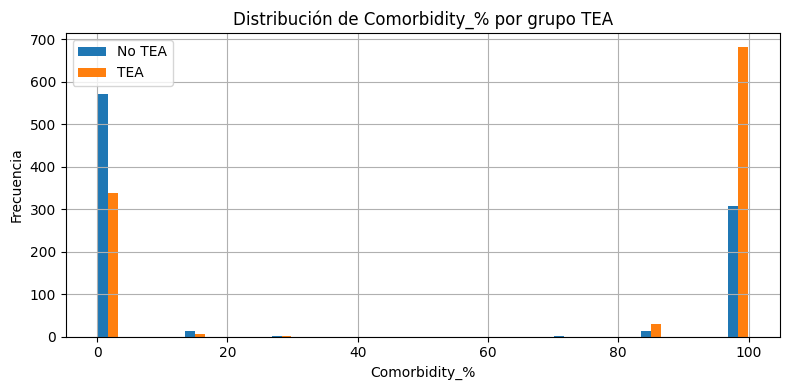

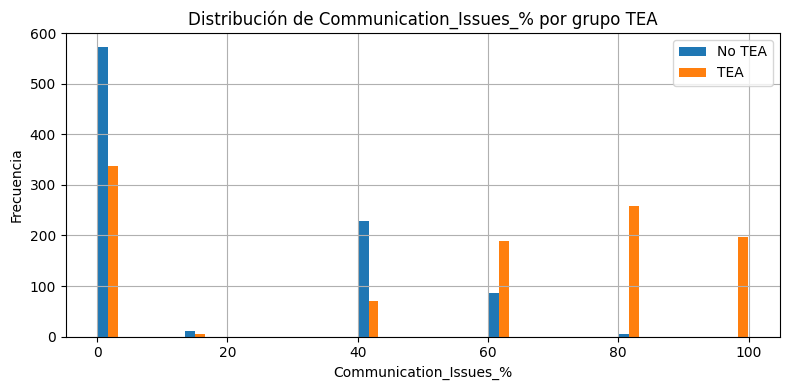

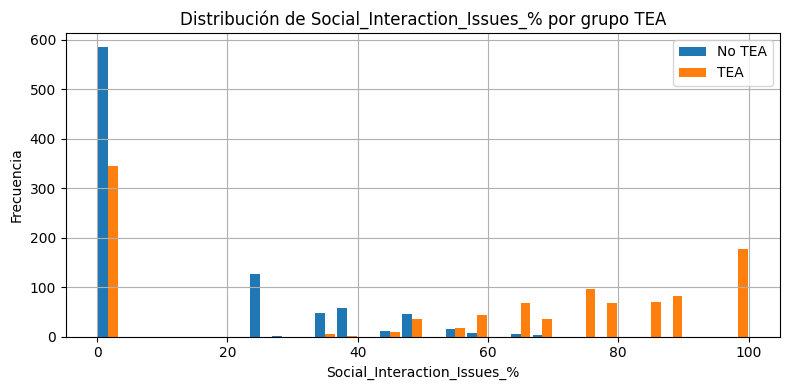

In [237]:
for var in cuanti_nuevas:
    plt.figure(figsize=(8, 4))

    # Valores para cada grupo
    valores_tea = df_pre[df_pre[target] == 1][var]
    valores_no_tea = df_pre[df_pre[target] == 0][var]

    # Histograma lado a lado
    plt.hist([valores_no_tea, valores_tea], bins=30, label=['No TEA', 'TEA'], align='mid', rwidth=0.9)
    plt.title(f'Distribución de {var} por grupo TEA')
    plt.xlabel(var)
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Vemos una clara distribución del porcentaje a favor del grupo de los niños con TEA, manejan los porcentajes más altos.

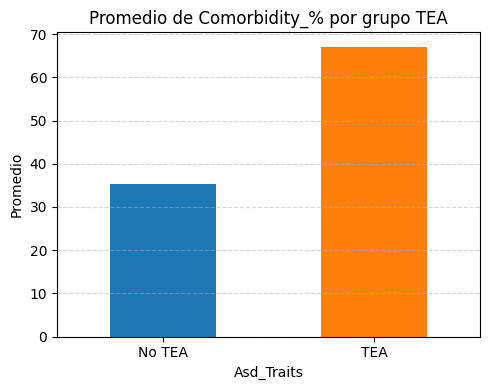

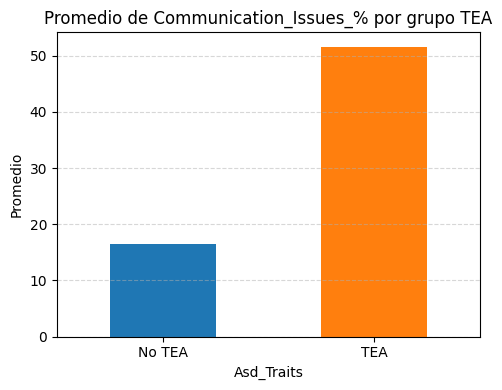

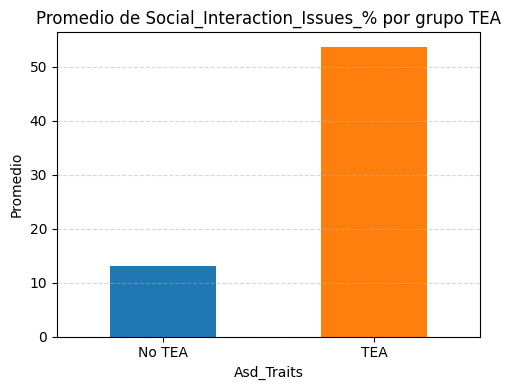

In [238]:
for var in cuanti_nuevas:
    # Calcular promedios por grupo
    promedios = df_pre.groupby(target)[var].mean()

    # Crear gráfico
    plt.figure(figsize=(5, 4))
    promedios.plot(kind='bar', color=['#1f77b4', '#ff7f0e'])  # azul / naranja
    plt.title(f'Promedio de {var} por grupo TEA')
    plt.xticks([0, 1], ['No TEA', 'TEA'], rotation=0)
    plt.ylabel('Promedio')
    plt.xlabel(target)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout() #organiza el contenido del grafico
    plt.show()

Confirmamos el insight del gráfico anterior, el promedio también refleja que los niños con TEA tienen el mayor porcentaje con una ventaja muy significativa.

Analizamos la correlación entre nuestras variables numéricas creadas.

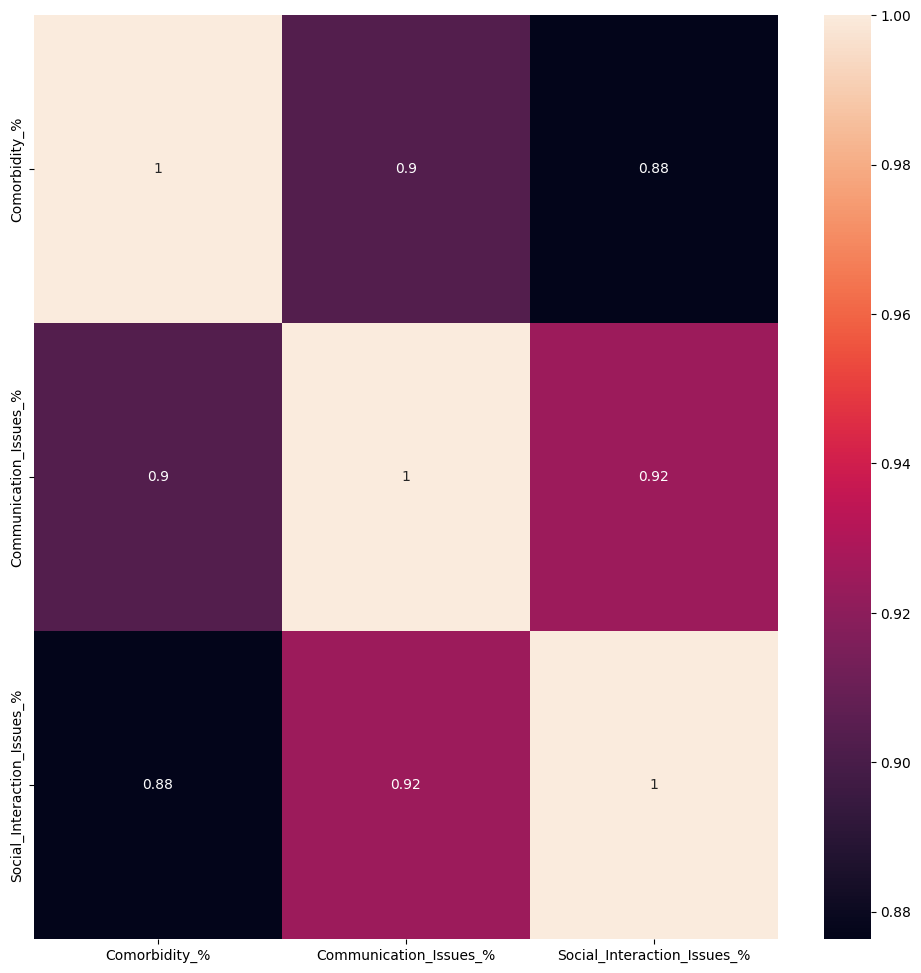

In [239]:
plt.figure(figsize = (12,12))
sns.heatmap(df_pre[cuanti_nuevas].corr(),annot =True)
plt.show()

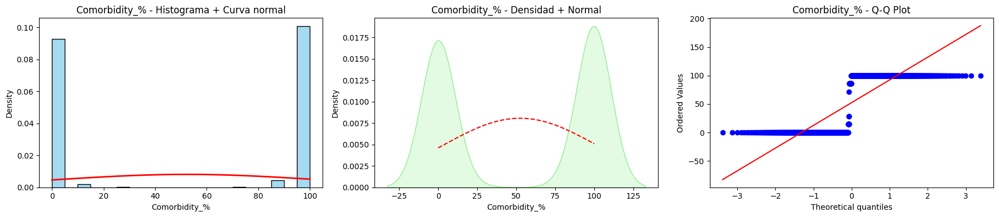

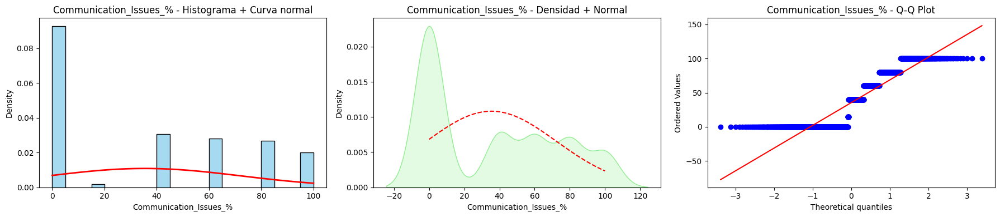

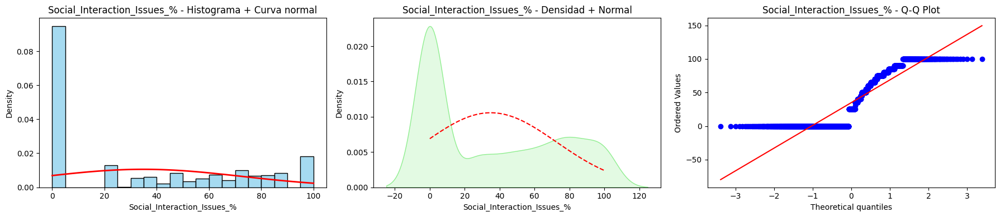

In [240]:
for col in cuanti_nuevas:
    datos = df_pre[col]

    # Crear figura
    plt.figure(figsize=(18, 4))

    # Histograma con curva normal
    plt.subplot(1, 3, 1)
    sns.histplot(datos, stat="density", bins=20, color="skyblue", edgecolor="black")
    mean = datos.mean()
    std = datos.std()
    x_vals = np.linspace(datos.min(), datos.max(), 100)
    plt.plot(x_vals, stats.norm.pdf(x_vals, mean, std), color="red", lw=2)
    plt.title(f"{col} - Histograma + Curva normal")

    # Densidad con curva normal
    plt.subplot(1, 3, 2)
    sns.kdeplot(data=datos, bw_adjust=1, fill=True, color="lightgreen")
    plt.plot(x_vals, stats.norm.pdf(x_vals, mean, std), color="red", linestyle="--")
    plt.title(f"{col} - Densidad + Normal")

    # Gráfico Q-Q
    plt.subplot(1, 3, 3)
    stats.probplot(datos, dist="norm", plot=plt)
    plt.title(f"{col} - Q-Q Plot")

    plt.tight_layout()
    plt.show()

Ahora analizamos la correlación de nuestras variables cuantitativas creadas con nuestra variable target cualitativa dicotómica:

In [241]:
# Diccionario para almacenar resultados
resultados_correlacion = []

for col in cuanti_nuevas:
    datos = df_pre[col]
    y_binaria = df_pre.loc[datos.index, target]

    # Prueba de Shapiro-Wilk
    stat_shapiro, p_shapiro = shapiro(datos)
    es_normal_shapiro = p_shapiro > 0.05

    # Prueba de Anderson-Darling
    ad_result = anderson(datos, dist='norm')
    es_normal_anderson = ad_result.statistic < ad_result.critical_values[2]  # nivel de significancia 5%

    # Prueba de Jarque-Bera
    stat_jb, p_jb = jarque_bera(datos)
    es_normal_jb = p_jb > 0.05

    # Decisión combinada
    es_normal = es_normal_shapiro and es_normal_anderson and es_normal_jb
    normalidad = 'Sí' if es_normal else 'No'

    # Aplicar coeficiente correspondiente
    if es_normal:
        coef, p = pointbiserialr(y_binaria, datos)
        metodo = 'Biserial puntual'
    else:
        coef, p = spearmanr(datos, y_binaria)
        metodo = 'Spearman'

    # Interpretar el nivel de significancia
    if p < 0.001:
        interpretacion = 'Muy significativa (p < 0.001)'
    elif p < 0.01:
        interpretacion = 'Significativa (p < 0.01)'
    elif p < 0.05:
        interpretacion = 'Poco significativa (p < 0.05)'
    else:
        interpretacion = 'No significativa'

    resultados_correlacion.append({
        'Variable': col,
        'p_Shapiro': p_shapiro,
        'Anderson_stat': ad_result.statistic,
        'JB_p_value': p_jb,
        'Normalidad': normalidad,
        'Método': metodo,
        'Coeficiente': coef,
        'p_value': p,
        'Significancia': interpretacion
    })

# Mostrar resultados
df_resultados = pd.DataFrame(resultados_correlacion)
df_resultados

,Variable,p_Shapiro,Anderson_stat,JB_p_value,Normalidad,Método,Coeficiente,p_value,Significancia
0,Comorbidity_%,3.490374e-53,338.596944,4.398274e-71,No,Spearman,0.313962,4.092276e-46,Muy significativa (p < 0.001)
1,Communication_Issues_%,2.828676e-43,151.956212,2.028134e-44,No,Spearman,0.464816,1.098927e-105,Muy significativa (p < 0.001)
2,Social_Interaction_Issues_%,7.836077e-44,157.180940,4.576448e-50,No,Spearman,0.500082,1.354806e-124,Muy significativa (p < 0.001)


Podemos apreciar que las variables cuantitativas creadas guardan una correlación fuerte en relación al target y cuentan con una significancia importante.

### 2.2.2. Variables cualitativas creadas

In [242]:
# Creamos una lista con las nuevas variables cualitativas
cuali_nuevas = ['Age_Group', 'Clinical_Profile']

In [243]:
df_pre[cuali_nuevas].describe()

,Age_Group,Clinical_Profile
count,1961,1961
unique,5,3
top,Middle childhood,Mixed
freq,715,1256


In [244]:
# Recorremos las columnas especificadas manualmente en la lista
for col in cuali_nuevas:
    print(f"\n🔸 {col} → {df_pre[col].nunique()} categorías únicas:")
    print(df_pre[col].unique())


🔸 Age_Group → 5 categorías únicas:
['Toddlers' 'Teenager' 'Early Teenagers' 'Preschoolers' 'Middle childhood']

🔸 Clinical_Profile → 3 categorías únicas:
['Communication' 'Social interaction' 'Mixed']


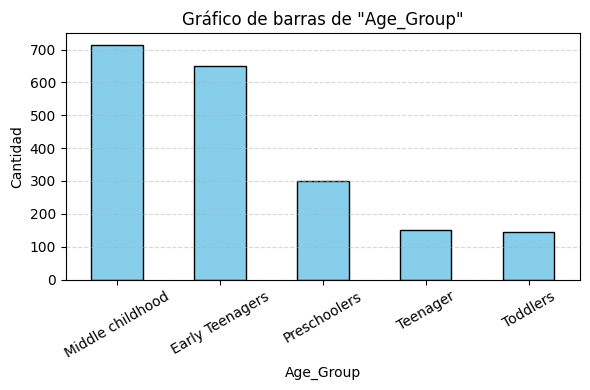

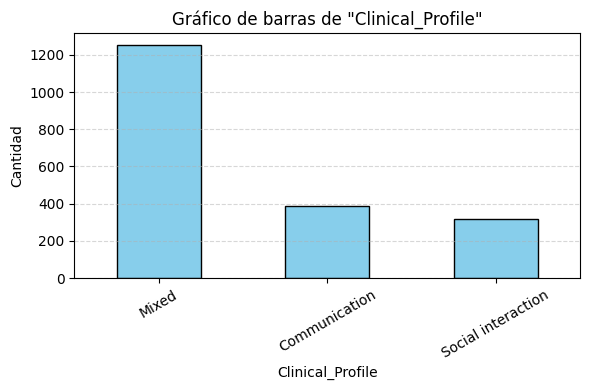

In [245]:
for var in cuali_nuevas:
    plt.figure(figsize=(6, 4))
    df_pre[var].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Gráfico de barras de "{var}"')
    plt.xlabel(var)
    plt.ylabel('Cantidad')
    plt.xticks(rotation=30)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

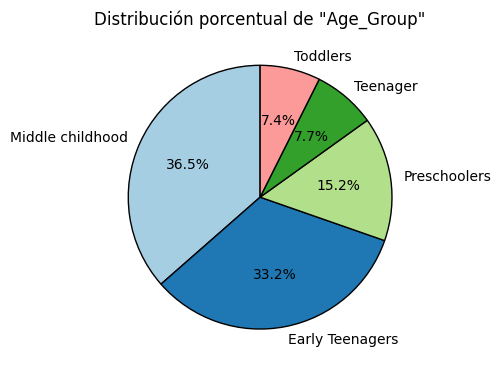

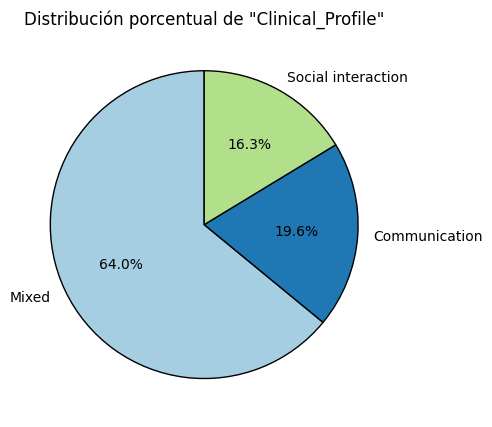

In [246]:
for var in cuali_nuevas:
    plt.figure(figsize=(5, 5))
    df_pre[var].value_counts(normalize=True).plot(
        kind='pie',
        autopct='%1.1f%%',
        startangle=90,
        colors=plt.cm.Paired.colors,
        wedgeprops={'edgecolor': 'black'}
    )
    plt.title(f'Distribución porcentual de "{var}"')
    plt.ylabel('')  # Oculta el label lateral "value"
    plt.tight_layout()
    plt.show()

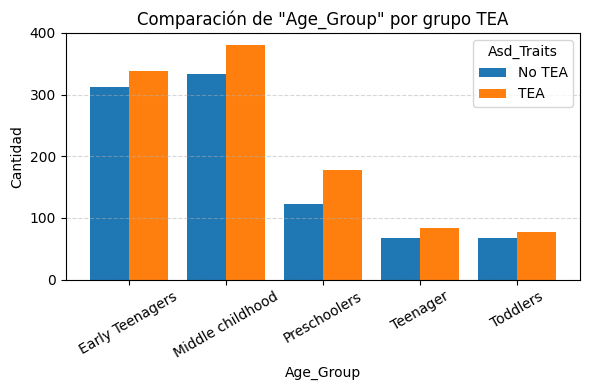

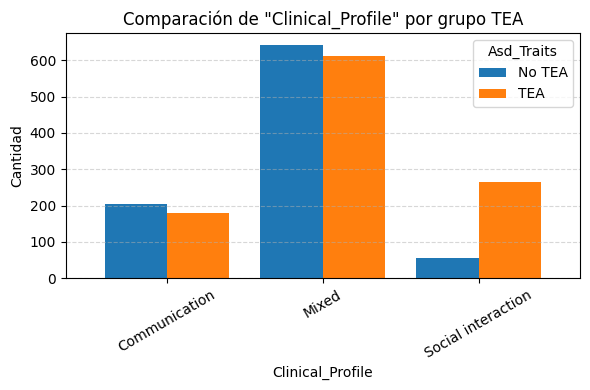

In [247]:
for var in cuali_nuevas:
    # Obtener conteos por categoría y grupo TEA
    conteos = df_pre.groupby([target, var]).size().unstack().T #Reorganizamos .unstack() y trasponemos .T

    # Crear gráfico de barras agrupadas
    conteos.plot(kind='bar', figsize=(6, 4), width=0.8)

    plt.title(f'Comparación de "{var}" por grupo TEA')
    plt.xlabel(var)
    plt.ylabel('Cantidad')
    plt.xticks(rotation=30)
    plt.legend(title=target, labels=['No TEA', 'TEA'])
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

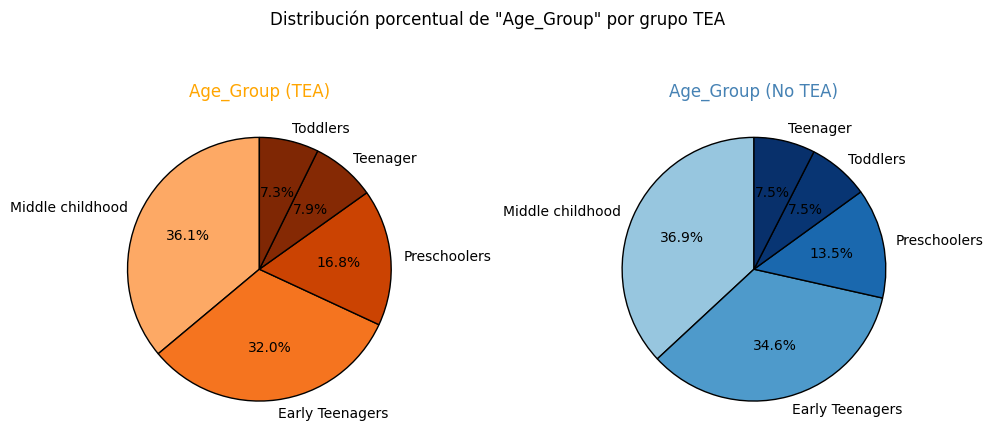

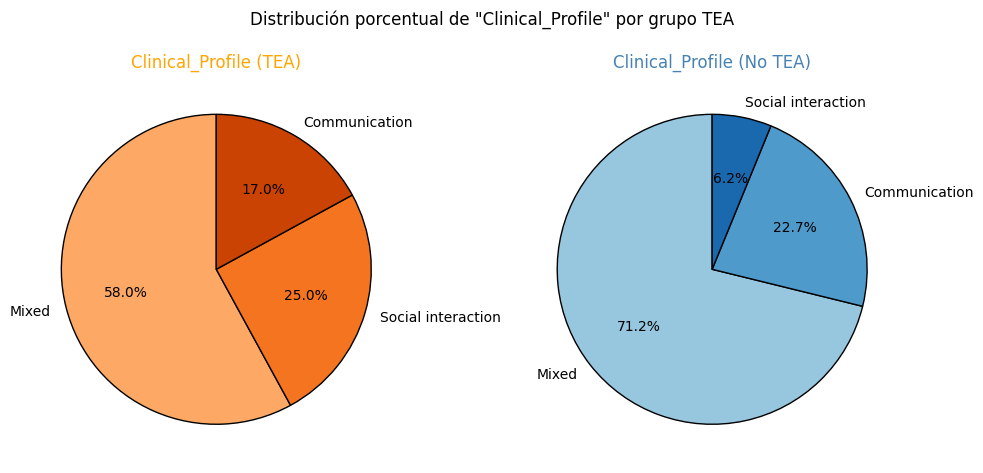

In [248]:
for var in cuali_nuevas:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # 🟠 Colores para TEA  //  normalize=True  => Convertir a porcentaje
    values_tea = df_pre[df_pre[target] == 1][var].value_counts(normalize=True)
    colors_tea = plt.cm.Oranges(range(100, 100 + len(values_tea) * 50, 50))  # tono medio a fuerte

    # 🔵 Colores para No TEA
    values_no_tea = df_pre[df_pre[target] == 0][var].value_counts(normalize=True)
    colors_no_tea = plt.cm.Blues(range(100, 100 + len(values_no_tea) * 50, 50))

    # Gráfico TEA
    values_tea.plot(
        kind='pie',
        autopct='%1.1f%%',
        startangle=90,
        colors=colors_tea,
        wedgeprops={'edgecolor': 'black'}, #bordes de la porcion del pastel
        ax=axes[0]
    )
    axes[0].set_title(f'{var} (TEA)', color='orange')
    axes[0].set_ylabel('')

    # Gráfico No TEA
    values_no_tea.plot(
        kind='pie',
        autopct='%1.1f%%',
        startangle=90,
        colors=colors_no_tea,
        wedgeprops={'edgecolor': 'black'},
        ax=axes[1]
    )
    axes[1].set_title(f'{var} (No TEA)', color='steelblue')
    axes[1].set_ylabel('')

    # Título general
    plt.suptitle(f'Distribución porcentual de "{var}" por grupo TEA', fontsize=12)
    plt.tight_layout()
    plt.show()

- Podemos apreciar que el indicador de correlación de la variable "Age_Group" guarda sentido con los gráficos, esta variable no resulta ser significativa para el modelo puesto que no hay diferencias lo suficientemente representativas entre los 2 valores del target, por lo que se debe eliminar.

- Por otro lado podemos obtener insights interesantes por el lado de la variable "Clinical_Profile" en donde vemos que 1 de cada 4 niños autistas tienen un perfil social interactivo, y más de la mitad tienen un perfil mixto, lo que se acerca a la realidad en donde este subgrupo necesita de terapias integrales como tratamiento.

Analizamos la asociación entre nuestras variables cualitativas creadas, que cuentan con más de dos categorías, y la variable objetivo mediante el coeficiente de asociación de Cramér’s V, útil para tablas de contingencia mayores a 2x2.

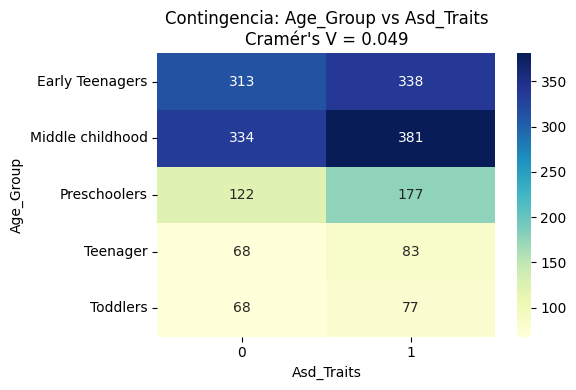

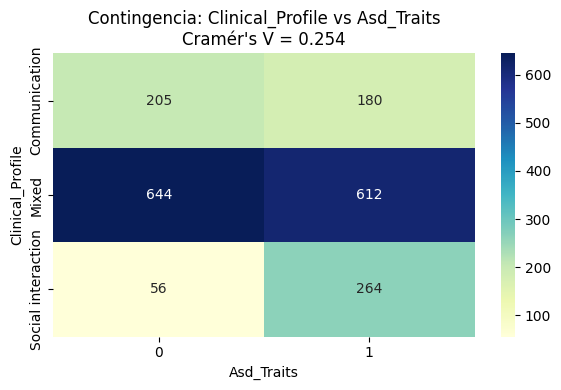

,Variable,Coeficiente_Cramér's V
0,Age_Group,0.048514
1,Clinical_Profile,0.254248


In [249]:
# Función para calcular Cramér's V
def cramers_v(x, y):
    tabla = pd.crosstab(x, y)
    chi2, _, _, _ = chi2_contingency(tabla)
    n = tabla.sum().sum()
    phi2 = chi2 / n
    r, k = tabla.shape
    return np.sqrt(phi2 / min(k - 1, r - 1))

# Calcular Cramér's V para variables multicategóricas
resultados_cramers = []

for col in cuali_nuevas:
    try:
        x = df_pre[col]
        y = df_pre[target]
        v = cramers_v(x, y)
        resultados_cramers.append({
            'Variable': col,
            "Coeficiente_Cramér's V": v,
        })

        # Crear y mostrar el heatmap de la tabla de contingencia
        tabla = pd.crosstab(x, y)
        plt.figure(figsize=(6, 4))
        sns.heatmap(tabla, annot=True, fmt='d', cmap='YlGnBu')
        plt.title(f"Contingencia: {col} vs Asd_Traits\nCramér's V = {v:.3f}")
        plt.xlabel("Asd_Traits")
        plt.ylabel(col)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error con la variable {col}: {e}")
        continue

# Crear DataFrame de resultados
df_cramers = pd.DataFrame(resultados_cramers)
df_cramers

Evaluamos la asociación estadística entre nuestras variables cualitativas creadas y la variable objetivo utilizando la prueba de Chi-cuadrado, con el fin de determinar si existen relaciones significativas.

In [250]:
# Recorrer todas las variables cualitativas (excepto el target)
for var in ['Age_Group', 'Clinical_Profile']:
    if var == target:
        continue  # Saltar la variable target

    try:
        # Tabla de contingencia
        tabla = pd.crosstab(df_pre[var], df_pre[target])

        # Aplicar test chi-cuadrado
        chi2, p, dof, expected = chi2_contingency(tabla)

        # Mostrar resultado
        print(f"{var}: Valor p = {p:.6f} → {'Significativo' if p < 0.05 else 'No significativo'}")

    except Exception as e:
        print(f"{var}: Error al calcular test → {e}")

Age_Group: Valor p = 0.329077 → No significativo
Clinical_Profile: Valor p = 0.000000 → Significativo


Podemos ver que Age_Group no representa una significancia representativa y tiene un coeficiente de asociación muy débil, por lo que se optará por su eliminación.

## 2.3. Depuración de variables para el modelado

Como primera instancia, elminaremos 3 las variables las cuales no aportarían información de valor para el entrenamiento del modelo por motivos del contexto actual y opinión profesional.

In [251]:
df_pre = df_pre.drop(columns=['Jaundice', 'Ethnicity', 'Who_Completed_The_Test'])
df_pre.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,...,Childhood_Autism_Rating_Scale,Anxiety_Disorder,Sex,Family_Mem_With_Asd,Asd_Traits,Age_Group,Comorbidity_%,Communication_Issues_%,Social_Interaction_Issues_%,Clinical_Profile
0,0,0,0,0,0,0,1,1,0,1,...,1,1,F,No,0,Toddlers,100.00,60.0,40.0,Communication
1,1,1,0,0,0,1,1,0,0,0,...,2,1,M,No,1,Toddlers,100.00,40.0,75.0,Social interaction
2,1,0,0,0,0,0,1,1,0,1,...,4,1,M,No,1,Toddlers,100.00,60.0,50.0,Communication
3,1,1,1,1,1,1,1,1,1,1,...,2,1,M,No,1,Toddlers,85.71,100.0,100.0,Mixed
4,1,1,0,1,1,1,1,1,1,1,...,1,1,F,No,1,Toddlers,85.71,80.0,100.0,Social interaction


**Justificación**: Según la decisión informada de profesionales de trastornos del neurodesarrollo y especialistas en autismo, la ictericia y etnia no guardan ninguna relación para estimar a un paciente con TEA, por lo que no tienen más cabida para el modelo. La variable sobre quien completó el test también es insignificante.

Se ha decidido eliminar las siguientes variables del dataset de entrenamiento por los siguientes motivos:

- **`Social_Responsiveness_Scale`** y **`Childhood_Autism_Rating_Scale`**: Ambas variables corresponden a escalas clínicas externas utilizadas en procesos de evaluación paralelos al instrumento principal del estudio (Q-CHAT-10). Debido a que estas pruebas fueron aplicadas como parte de evaluaciones complementarias y no forman parte del objetivo de este proyecto, se excluyen para evitar introducir redundancia o sesgos derivados de evaluaciones cruzadas.

- **`Age_Group`**: Esta variable fue analizada estadísticamente mediante el coeficiente chi-cuadrado, mostrando una **baja relevancia en su asociación con la variable objetivo** (`Asd_Traits`). Además, el análisis gráfico confirmó que no existe una diferenciación clara entre los grupos de edad con respecto al perfil autista o neurotípico. Por tanto, su presencia no aporta valor predictivo relevante al modelo.

In [252]:
df_pre = df_pre.drop(columns=['Social_Responsiveness_Scale', 'Childhood_Autism_Rating_Scale', 'Age_Group'])
df_pre.columns

Index(['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9',
       'A10_Autism_Spectrum_Quotient', 'Age_Years', 'Qchat_10_Score',
       'Speech_Delay_Language_Disorder', 'Learning_Disorder',
       'Genetic_Disorders', 'Depression',
       'Global_Developmental_Delay_Intellectual_Disability',
       'Social_Behavioural_Issues', 'Anxiety_Disorder', 'Sex',
       'Family_Mem_With_Asd', 'Asd_Traits', 'Comorbidity_%',
       'Communication_Issues_%', 'Social_Interaction_Issues_%',
       'Clinical_Profile'],
      dtype='object')

Esta depuración permite mejorar la consistencia del dataset y concentrar el modelado en las variables directamente relacionadas con el comportamiento observado y clínicamente validado.

## 2.4. Encoding de variables categóricas

Realizamos un resumen estadístico de nuestras variables categóricas aun codificadas.

In [253]:
df_pre.describe(include='object')

,Sex,Family_Mem_With_Asd,Clinical_Profile
count,1961,1961,1961
unique,2,2,3
top,M,No,Mixed
freq,1426,1319,1256


In [254]:
# Numerizar uno a uno
df_pre['Family_Mem_With_Asd'] = df_pre['Family_Mem_With_Asd'].map(lambda x: 1 if x == 'Yes' else 0)

# Dummies para Sex y Clinical_Profile
df_pre = pd.get_dummies(df_pre, drop_first=True)
df_pre.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,...,Social_Behavioural_Issues,Anxiety_Disorder,Family_Mem_With_Asd,Asd_Traits,Comorbidity_%,Communication_Issues_%,Social_Interaction_Issues_%,Sex_M,Clinical_Profile_Mixed,Clinical_Profile_Social interaction
0,0,0,0,0,0,0,1,1,0,1,...,1,1,0,0,100.00,60.0,40.0,False,False,False
1,1,1,0,0,0,1,1,0,0,0,...,1,1,0,1,100.00,40.0,75.0,True,False,True
2,1,0,0,0,0,0,1,1,0,1,...,1,1,0,1,100.00,60.0,50.0,True,False,False
3,1,1,1,1,1,1,1,1,1,1,...,1,1,0,1,85.71,100.0,100.0,True,True,False
4,1,1,0,1,1,1,1,1,1,1,...,1,1,0,1,85.71,80.0,100.0,False,False,True


## 2.5. Escalamiento/Normalización de datos

In [255]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [256]:
scaled = scaler.fit_transform(df_pre)

In [257]:
columnas = df_pre.columns
columnas

Index(['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9',
       'A10_Autism_Spectrum_Quotient', 'Age_Years', 'Qchat_10_Score',
       'Speech_Delay_Language_Disorder', 'Learning_Disorder',
       'Genetic_Disorders', 'Depression',
       'Global_Developmental_Delay_Intellectual_Disability',
       'Social_Behavioural_Issues', 'Anxiety_Disorder', 'Family_Mem_With_Asd',
       'Asd_Traits', 'Comorbidity_%', 'Communication_Issues_%',
       'Social_Interaction_Issues_%', 'Sex_M', 'Clinical_Profile_Mixed',
       'Clinical_Profile_Social interaction'],
      dtype='object')

In [258]:
df_pre_scaled = pd.DataFrame(data = scaled, columns = columnas)
df_pre_scaled.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,...,Social_Behavioural_Issues,Anxiety_Disorder,Family_Mem_With_Asd,Asd_Traits,Comorbidity_%,Communication_Issues_%,Social_Interaction_Issues_%,Sex_M,Clinical_Profile_Mixed,Clinical_Profile_Social interaction
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,1.0,1.0,0.0,0.0,1.0000,0.6,0.40,0.0,0.0,0.0
1,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,1.0,1.0,0.0,1.0,1.0000,0.4,0.75,1.0,0.0,1.0
2,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,1.0,1.0,0.0,1.0,1.0000,0.6,0.50,1.0,0.0,0.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,0.0,1.0,0.8571,1.0,1.00,1.0,1.0,0.0
4,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,0.0,1.0,0.8571,0.8,1.00,0.0,0.0,1.0


## 2.6. Creación de variables con PCA

Es una técnica estadística de síntesis de la información o reducción de la dimensión (número de variables) El objetivo será reducirlas a un menor número perdiendo la menor cantidad de información posible.

Los nuevos componentes principales o factores serán una combinación lineal de las variables originales, y además serán **independientes entre sí**.

In [259]:
df_componentes = df_pre_scaled.drop(columns=[target])  # Elimina el target

In [260]:
# Aplicamos la metodologia de ACP!
from sklearn.decomposition import PCA
pca = PCA()

principalComponents = pca.fit_transform(df_componentes)

In [261]:
#variacion explicada por las componentes
print(pca.explained_variance_ratio_)

[6.14374300e-01 8.09304647e-02 5.02182312e-02 3.98478112e-02
 3.61918409e-02 2.90678123e-02 2.52626398e-02 2.07146287e-02
 1.78593847e-02 1.55446563e-02 1.42407955e-02 1.39297352e-02
 1.27806450e-02 1.13731245e-02 1.05215715e-02 3.27078666e-03
 2.13602263e-03 1.14566635e-03 2.71515198e-04 2.20782471e-04
 9.75853337e-05 4.19726989e-13 3.08802134e-19 8.58985989e-20
 0.00000000e+00 0.00000000e+00]


In [262]:
print(pca.components_)

[[ 1.82304444e-01  1.49296346e-01  1.35433357e-01  1.69971642e-01
   1.73898321e-01  1.88059861e-01  2.05289973e-01  1.48584711e-01
   1.63478991e-01  9.24789899e-02 -2.19604779e-02  1.60879664e-01
   2.69204214e-01  2.65581012e-01  2.60628069e-01  2.69689901e-01
   2.69355841e-01  2.69689901e-01  2.68934279e-01  1.01008177e-01
   2.67582744e-01  1.96637617e-01  2.02629161e-01  6.83684884e-02
  -1.69742627e-01  9.73794040e-02]
 [ 2.15650361e-01  2.29939885e-01  2.50130718e-01  2.57441186e-01
   2.53993638e-01  2.51568522e-01  1.91007367e-01  2.09590310e-01
   2.98724569e-01  8.80780727e-02  4.26279473e-02  2.24612463e-01
  -1.68966093e-01 -1.77021882e-01 -1.70733290e-01 -1.66879783e-01
  -1.66508827e-01 -1.66879783e-01 -1.67982071e-01 -1.49662560e-01
  -1.69282253e-01  8.28943139e-02  1.33013512e-01 -7.99330260e-02
   3.59762076e-01 -4.68328505e-02]
 [ 4.57152661e-02  5.97994018e-02 -1.54009829e-01 -1.15374877e-01
  -7.11577118e-02 -1.91086264e-02  7.33853716e-02 -6.05883024e-02
  -1.1

% Var. explicada (1 componentes):  61.43742997525749
% Var. explicada (2 componentes):  69.5304764403863
% Var. explicada (3 componentes):  74.55229956534876
% Var. explicada (4 componentes):  78.5370806878588
% Var. explicada (5 componentes):  82.15626478090743
% Var. explicada (6 componentes):  85.06304600707057
% Var. explicada (7 componentes):  87.58930998563046
% Var. explicada (8 componentes):  89.66077285531786
% Var. explicada (9 componentes):  91.4467113296659
% Var. explicada (10 componentes):  93.00117695916667
% Var. explicada (11 componentes):  94.42525650651218
% Var. explicada (12 componentes):  95.81823002866255
% Var. explicada (13 componentes):  97.09629453218926
% Var. explicada (14 componentes):  98.23360698222278
% Var. explicada (15 componentes):  99.28576413528685
% Var. explicada (16 componentes):  99.61284280145853
% Var. explicada (17 componentes):  99.82644506422308
% Var. explicada (18 componentes):  99.9410116996321
% Var. explicada (19 componentes):  99.96

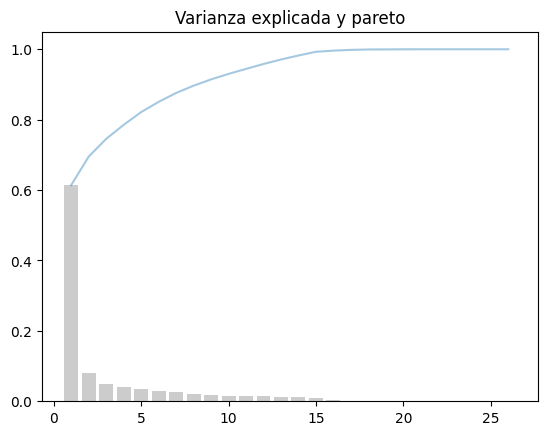

In [263]:
for i in range(len(pca.components_)):
    print('% Var. explicada ('+str(i+1)+' componentes): ', np.cumsum(pca.explained_variance_ratio_)[i]*100)

plt.bar(range(1,len(pca.components_)+1),pca.explained_variance_ratio_, alpha=.2,color='0')
plt.plot(range(1,len(pca.components_)+1),np.cumsum(pca.explained_variance_ratio_),alpha=0.4)
plt.title("Varianza explicada y pareto")
plt.show()

Podemos apreciar que los 2 componentes explican casi el 70% de la varianza de la data, por lo que consideraremos estos 2 como nuestras nuevas variables a incluir para el modelo.

In [264]:
# Aplicamos la metodologia de ACP!
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(df_componentes)

In [265]:
#variacion explicada por las componentes
print(pca.explained_variance_ratio_)

[0.6143743  0.08093046]


In [266]:
import joblib

# Guardar el modelo PCA entrenado en disco
joblib.dump(pca, "pca_model.pkl")


['pca_model.pkl']

In [267]:
# Creamos los componentes!
principalDf = pd.DataFrame(data = principalComponents, columns = ['PCA_1', 'PCA_2'])
# Revisamos las nuevas variables!
principalDf.head()

,PCA_1,PCA_2
0,1.088451,-0.877332
1,1.579185,-0.549663
2,1.374183,-0.703345
3,2.163503,1.625064
4,2.171407,1.009231


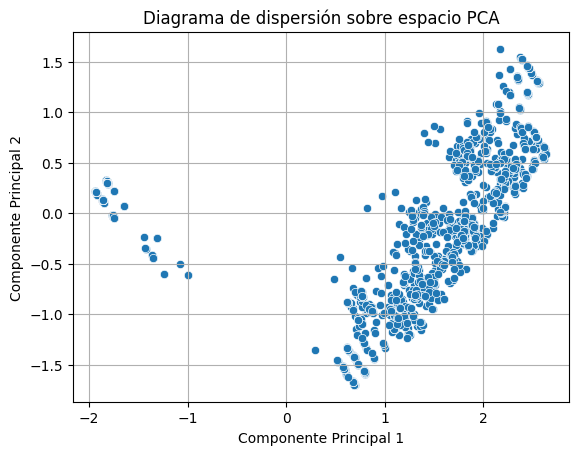

In [268]:
sns.scatterplot(x='PCA_1', y='PCA_2', data=principalDf)
plt.title('Diagrama de dispersión sobre espacio PCA')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.grid(True)
plt.show()

In [269]:
# Unimos los componentes PCA al dataframe original
df_pca = pd.concat([principalDf, df_pre[['Asd_Traits']].reset_index(drop=True)], axis=1)


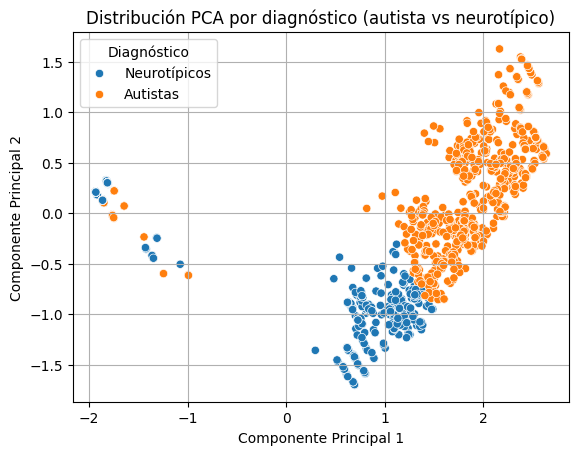

In [270]:
# Visualización
sns.scatterplot(x='PCA_1', y='PCA_2', hue='Asd_Traits', data=df_pca)
plt.title('Distribución PCA por diagnóstico (autista vs neurotípico)')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')

handles, labels = plt.gca().get_legend_handles_labels()
labels = ['Neurotípicos' if label == '0' else 'Autistas' for label in labels]
plt.legend(handles=handles, labels=labels, title='Diagnóstico')

plt.grid(True)
plt.show()

El gráfico muestra una separación real, basada en la variable Asd_Traits (autista vs neurotípico). Se aprecia claramente que los dos perfiles tienden a ubicarse en zonas diferenciadas dentro del espacio reducido por PCA, lo que sugiere que las variables elegidas capturan bien la variabilidad entre ambos grupos.

In [271]:
from sklearn.cluster import KMeans

# Usamos 2 clusters partiendo de la hipótesis que el modelo no supervisado diferenciará con éxito ambas clases del target
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(df_pca[['PCA_1', 'PCA_2']])

df_pca['Cluster'] = kmeans.predict(df_pca[['PCA_1', 'PCA_2']])

In [272]:
from sklearn.metrics import silhouette_score

# Calculamos la inercia
inertia = kmeans.inertia_
print(f"Inercia: {inertia:.4f}")

# Calculamos la silueta
silhouette = silhouette_score(df_pca[['PCA_1', 'PCA_2']], df_pca['Cluster'])
print(f"Silueta Score: {silhouette:.4f}")


Inercia: 1184.9808
Silueta Score: 0.7899


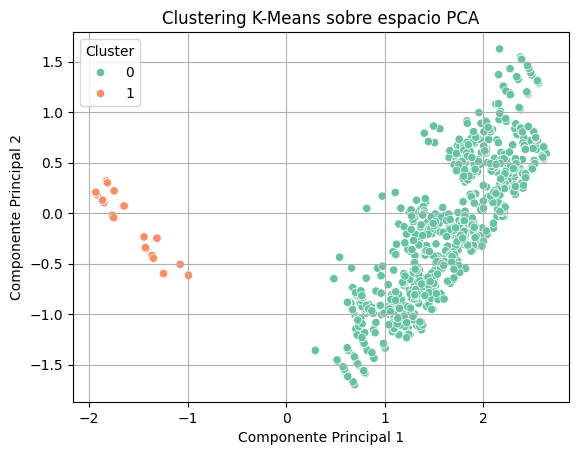

In [273]:
sns.scatterplot(x='PCA_1', y='PCA_2', hue='Cluster', data=df_pca, palette='Set2')
plt.title('Clustering K-Means sobre espacio PCA')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

El gráfico representa una agrupación no supervisada, que intenta encontrar patrones sin conocer los perfiles reales. Aunque logra identificar una agrupación densa en la región derecha del gráfico (Cluster 0), no reproduce fielmente la división entre perfiles reales. Muchos individuos del perfil autista y neurotípico quedan mezclados dentro de un mismo clúster.

In [274]:
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(df_pca['Asd_Traits'], df_pca['Cluster'])
conf_df = pd.DataFrame(conf_matrix,
                       index=['Neurotípico (real)', 'Autista (real)'],
                       columns=['Cluster 0', 'Cluster 1'])
conf_df

,Cluster 0,Cluster 1
Neurotípico (real),320,585
Autista (real),711,345


**Conclusión**

El análisis demuestra que, aunque K-Means logra detectar ciertas concentraciones de puntos, no es confiable como método para identificar perfiles clínicos como el TEA sin información previa.
Esto se debe a que la segmentación que realiza se basa exclusivamente en la geometría del espacio PCA, sin considerar los factores semánticos o clínicos presentes en las variables.

In [275]:
# Le agregamos las variables al set de datos!
df_pre = pd.concat([df_pre_scaled, principalDf], axis=1)
df_pre.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,...,Family_Mem_With_Asd,Asd_Traits,Comorbidity_%,Communication_Issues_%,Social_Interaction_Issues_%,Sex_M,Clinical_Profile_Mixed,Clinical_Profile_Social interaction,PCA_1,PCA_2
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,0.0,1.0000,0.6,0.40,0.0,0.0,0.0,1.088451,-0.877332
1,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.0,1.0,1.0000,0.4,0.75,1.0,0.0,1.0,1.579185,-0.549663
2,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,1.0,1.0000,0.6,0.50,1.0,0.0,0.0,1.374183,-0.703345
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,1.0,0.8571,1.0,1.00,1.0,1.0,0.0,2.163503,1.625064
4,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,1.0,0.8571,0.8,1.00,0.0,0.0,1.0,2.171407,1.009231


In [276]:
# Diccionario para almacenar resultados
resultados_correlacion = []

for col in principalDf.columns:
    datos = df_pre[col]
    y_binaria = df_pre.loc[datos.index, target]

    # Prueba de Shapiro-Wilk
    stat_shapiro, p_shapiro = shapiro(datos)
    es_normal_shapiro = p_shapiro > 0.05

    # Prueba de Anderson-Darling
    ad_result = anderson(datos, dist='norm')
    es_normal_anderson = ad_result.statistic < ad_result.critical_values[2]  # nivel de significancia 5%

    # Prueba de Jarque-Bera
    stat_jb, p_jb = jarque_bera(datos)
    es_normal_jb = p_jb > 0.05

    # Decisión combinada
    es_normal = es_normal_shapiro and es_normal_anderson and es_normal_jb
    normalidad = 'Sí' if es_normal else 'No'

    # Aplicar coeficiente correspondiente
    if es_normal:
        coef, p = pointbiserialr(y_binaria, datos)
        metodo = 'Biserial puntual'
    else:
        coef, p = spearmanr(datos, y_binaria)
        metodo = 'Spearman'

    # Interpretar el nivel de significancia
    if p < 0.001:
        interpretacion = 'Muy significativa (p < 0.001)'
    elif p < 0.01:
        interpretacion = 'Significativa (p < 0.01)'
    elif p < 0.05:
        interpretacion = 'Poco significativa (p < 0.05)'
    else:
        interpretacion = 'No significativa'

    resultados_correlacion.append({
        'Variable': col,
        'p_Shapiro': p_shapiro,
        'Anderson_stat': ad_result.statistic,
        'JB_p_value': p_jb,
        'Normalidad': normalidad,
        'Método': metodo,
        'Coeficiente': coef,
        'p_value': p,
        'Significancia': interpretacion
    })

# Mostrar resultados
df_resultados = pd.DataFrame(resultados_correlacion)
df_resultados

,Variable,p_Shapiro,Anderson_stat,JB_p_value,Normalidad,Método,Coeficiente,p_value,Significancia
0,PCA_1,3.604618e-45,185.806274,2.583495e-58,No,Spearman,0.551886,9.909767e-157,Muy significativa (p < 0.001)
1,PCA_2,8.989471e-30,67.234468,4.190173e-23,No,Spearman,0.212226,2.089349e-21,Muy significativa (p < 0.001)


In [277]:
df_pre.to_csv('df_pre.csv', index=False)

# 3. MODELADO

## 3.1. División en train y test y creación de variantes del dataset

In [278]:
X = df_pre.drop(target, axis =1)
y = df_pre[target].astype(int)

In [279]:
X.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,...,Anxiety_Disorder,Family_Mem_With_Asd,Comorbidity_%,Communication_Issues_%,Social_Interaction_Issues_%,Sex_M,Clinical_Profile_Mixed,Clinical_Profile_Social interaction,PCA_1,PCA_2
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,1.0,0.0,1.0000,0.6,0.40,0.0,0.0,0.0,1.088451,-0.877332
1,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,1.0,0.0,1.0000,0.4,0.75,1.0,0.0,1.0,1.579185,-0.549663
2,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,1.0,0.0,1.0000,0.6,0.50,1.0,0.0,0.0,1.374183,-0.703345
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.8571,1.0,1.00,1.0,1.0,0.0,2.163503,1.625064
4,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.8571,0.8,1.00,0.0,0.0,1.0,2.171407,1.009231


In [280]:
y.head()

,Asd_Traits
0,0
1,1
2,1
3,1
4,1


In [281]:
y.value_counts()

,count
Asd_Traits,
1,1056
0,905


In [282]:
y.value_counts(normalize=True) * 100

,proportion
Asd_Traits,
1,53.850076
0,46.149924


Podemos observar que la distribución en ambas clases es casi equivalente, por lo que se descarta hacer el procedimiento de balanceo de clases, el dataset no lo necesita.

In [ ]:
X.shape

(1961, 28)

In [ ]:
y.shape

(1961,)

### 3.1.1. X: Todas las variables

Como ya tenemos el dataset listo únicamente nos centramos en dividirlo en conjuntos de entrenamiento y prueba.

In [283]:
from sklearn.model_selection import train_test_split
# usaremos la división train/test en 80/20.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y, random_state = 42)

### 3.1.2. Qchat: Variables Q-CHAT 10

Como primer paso extraemos solo las variables relacionadas a la prueba internacional Q-CHAT 10, estarán desde la A1-A10 y el resultado obtenido obviamente.

In [284]:
X_qchat = X.iloc[:, :10].join(X[['Qchat_10_Score']])
X_qchat.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,Qchat_10_Score
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.3
1,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.4
2,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.4
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9


Dividimos en conjuntos de entrenamiento y prueba.

In [285]:
# usaremos la división train/test en 80/20.
X_qchat_train, X_qchat_test, y_qchat_train, y_qchat_test = train_test_split(X_qchat, y, test_size = 0.2, stratify = y, random_state = 42)

### 3.1.3. Best: Variables más importantes

Partimos desde los conjuntos creados del dataset principal donde están todas las variables y lo usamos para seleccionar las features más importantes en base a la correlación y asociación.

| Nº | Variable                                           | Método        | Coeficiente |
|----|----------------------------------------------------|---------------|-------------|
| 1  | PCA_1                                              | Spearman      | 0.551886    |
| 2  | A6                                                 | Phi           | 0.501681    |
| 3  | A9                                                 | Phi           | 0.500830    |
| 4  | Social_Interaction_Issues_%                       | Spearman      | 0.500082    |
| 5  | A7                                                 | Phi           | 0.497042    |
| 6  | A5                                                 | Phi           | 0.491273    |
| 7  | Qchat_10_Score                                     | Spearman      | 0.477798    |
| 8  | Communication_Issues_%                            | Spearman      | 0.464816    |
| 9  | A4                                                 | Phi           | 0.462772    |
| 10 | A1                                                 | Phi           | 0.461782    |
| 11 | A2                                                 | Phi           | 0.434350    |
| 12 | A8                                                 | Phi           | 0.412759    |
| 13 | Sex_M                                                | Phi           | 0.409019    |
| 14 | A3                                                 | Phi           | 0.396187    |
| 15 | Global_Developmental_Delay_Intellectual_Disability | Phi           | 0.321227    |
| 16 | Speech_Delay_Language_Disorder                     | Phi           | 0.320018    |
| 17 | Depression                                         | Phi           | 0.319179    |
| 18 | Social_Behavioural_Issues                          | Phi           | 0.319179    |
| 19 | Anxiety_Disorder                                   | Phi           | 0.318342    |
| 20 | Comorbidity_%                                      | Spearman      | 0.313962    |
| 21 | Learning_Disorder                                  | Phi           | 0.311849    |
| 22 | Genetic_Disorders                                  | Phi           | 0.305556    |
| 23 | Family_Mem_With_Asd                                | Phi           | 0.281820    |
| 24 | Clinical_Profile                                   | Cramér's V    | 0.254248    |
| 25 | PCA_2                                              | Spearman      | 0.212226    |
| 26 | A10_Autism_Spectrum_Quotient                       | Phi           | 0.085278    |
| 27 | Age_Years                                          | Spearman      | -0.021891   |


Creamos el dataset considerando las 20 variables más importantes en términos de correlación.

In [286]:
variables_seleccionadas = [
    'PCA_1',
    'A6',
    'A9',
    'Social_Interaction_Issues_%',
    'A7',
    'A5',
    'Qchat_10_Score',
    'Communication_Issues_%',
    'A4',
    'A1',
    'A2',
    'A8',
    'Sex_M',
    'A3',
    'Global_Developmental_Delay_Intellectual_Disability',
    'Speech_Delay_Language_Disorder',
    'Depression',
    'Social_Behavioural_Issues',
    'Anxiety_Disorder',
    'Comorbidity_%'
]

In [287]:
X_best = X[variables_seleccionadas]
X_best.head()

,PCA_1,A6,A9,Social_Interaction_Issues_%,A7,A5,Qchat_10_Score,Communication_Issues_%,A4,A1,A2,A8,Sex_M,A3,Global_Developmental_Delay_Intellectual_Disability,Speech_Delay_Language_Disorder,Depression,Social_Behavioural_Issues,Anxiety_Disorder,Comorbidity_%
0,1.088451,0.0,0.0,0.40,1.0,0.0,0.3,0.6,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0000
1,1.579185,1.0,0.0,0.75,1.0,0.0,0.4,0.4,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0000
2,1.374183,0.0,0.0,0.50,1.0,0.0,0.4,0.6,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0000
3,2.163503,1.0,1.0,1.00,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.8571
4,2.171407,1.0,1.0,1.00,1.0,1.0,0.9,0.8,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.8571


Dividimos el dataset creado en conjuntos de entrenamiento y prueba.

In [288]:
# usaremos la división train/test en 80/20.
X_best_train, X_best_test, y_best_train, y_best_test = train_test_split(X_best, y, test_size = 0.2, stratify = y, random_state = 42)

## 3.2. Selección y Justificación de modelos

### 3.2.1. Modelos de Boostings Seleccionados

Para capturar la **robustez**, la **reducción progresiva de errores** y mejorar la **capacidad de generalización** en problemas de clasificación, se seleccionaron cinco algoritmos basados en la técnica de **boosting**. Cada uno de estos algoritmos aporta características particulares que enriquecen la estrategia de modelado:

- **AdaBoost (Adaptive Boosting)**: Considerado el algoritmo base de boosting, AdaBoost crea secuencias de clasificadores débiles que se enfocan de manera progresiva en los ejemplos mal clasificados en iteraciones anteriores. Su adaptabilidad lo hace especialmente útil en problemas donde pequeños errores de predicción deben ser corregidos de forma continua, mejorando la precisión global del modelo.

- **Gradient Boosting**: Este algoritmo refina el proceso de boosting utilizando la optimización basada en el gradiente del error de predicción. Es particularmente eficaz en escenarios con **relaciones no lineales complejas** entre variables predictoras y la variable objetivo, permitiendo capturar patrones sutiles en los datos que otros métodos podrían pasar por alto.

- **XGBoost (Extreme Gradient Boosting)**: Representa una versión optimizada y regularizada del Gradient Boosting tradicional. Es reconocido por su alta eficiencia computacional y su capacidad para evitar el sobreajuste, gracias a la incorporación de técnicas como **pruning**, **regularización L1 y L2**, y una estructura de árboles optimizada. XGBoost ha sido ampliamente validado en competencias de Machine Learning como Kaggle, consolidándose como una herramienta de referencia en el área.

- **LightGBM (Light Gradient Boosting Machine)**: LightGBM introduce mejoras sustanciales en términos de velocidad de entrenamiento y consumo de memoria mediante el uso de técnicas como el **Gradient-based One-Side Sampling (GOSS)** y el **Exclusive Feature Bundling (EFB)**. Estas innovaciones hacen de LightGBM una opción ideal para trabajar con **grandes volúmenes de datos** sin sacrificar precisión ni capacidad predictiva.

- **CatBoost (Categorical Boosting)**: Desarrollado para manejar de forma nativa variables categóricas, CatBoost elimina la necesidad de realizar codificaciones adicionales (como one-hot encoding), reduciendo así errores de preprocesamiento. Además, implementa estrategias que minimizan el efecto de predicciones sesgadas, proporcionando una mayor estabilidad y rendimiento en datasets heterogéneos.

**Justificación del enfoque Boosting**: La selección de algoritmos de boosting se justifica por su capacidad intrínseca de construir modelos de alta precisión a partir de clasificadores débiles, mejorando progresivamente los errores de predicción en cada iteración. Además, los métodos de boosting ofrecen una excelente capacidad para manejar problemas de overfitting mediante estrategias de regularización incorporadas, así como para adaptarse a la complejidad de patrones no lineales en los datos. Estas características son especialmente relevantes para el tipo de problema abordado en esta investigación, donde se requiere una alta sensibilidad en la clasificación y la necesidad de capturar patrones complejos de comportamiento en las variables predictoras.

### 3.2.2. Modelo Benchmark: Random Forest

Además de los algoritmos de boosting seleccionados, se incorporó el algoritmo **Random Forest** como parte del proceso de benchmarking exploratorio realizado en esta investigación. A través de una prueba comparativa (spike de benchmarking) entre distintos algoritmos de clasificación, Random Forest demostró consistentemente el mejor desempeño global, evaluado mediante métricas como precisión, recall y área bajo la curva ROC.

**Random Forest** es un método de ensamblado basado en el principio de bagging, que construye múltiples árboles de decisión de manera aleatoria y agrega sus predicciones para obtener un resultado más estable y robusto. Su arquitectura permite reducir significativamente la varianza de los modelos individuales, disminuyendo así el riesgo de sobreajuste que caracteriza a los árboles de decisión simples.

**Justificación**: La selección de Random Forest como modelo benchmark se justifica por su capacidad de manejar grandes cantidades de datos con alta dimensionalidad, su mayor resistencia al sobreajuste en comparación con modelos individuales, y su facilidad para interpretar la importancia de las variables predictoras. Estas ventajas lo convierten en una referencia sólida para comparar los resultados de los modelos de boosting evaluados en esta investigación.

**Benchmark**: https://docs.google.com/document/d/1pv7QWhGNUyLFi655LXE9I_aWt2embb5A/edit?usp=sharing&ouid=116921360281837638875&rtpof=true&sd=true

### 3.2.3. Modelo extras

- **SVM Kernel Lineal**: Adecuado para datos separables linealmente o cuando se busca una solución más simple y rápida. Presenta buen rendimiento con datasets de alta dimensionalidad y es menos propenso al sobreajuste que otros modelos complejos.

- **SVM Kernel Radial**: Expande la capacidad de SVM para manejar relaciones no lineales entre variables. Es eficaz cuando los límites de decisión no son lineales, lo que es común en problemas clínicos complejos como el TEA.

- **Regresión Logística**: Modelo estadístico clásico, interpretable y rápido. Útil como línea base por su facilidad para entender el peso de cada variable. A pesar de su simplicidad, ofrece buenos resultados en problemas de clasificación binaria.

- **KNN**: Algoritmo basado en la distancia que no requiere entrenamiento explícito. Es intuitivo y eficaz en conjuntos de datos con estructura bien definida, aunque su desempeño puede verse afectado por variables irrelevantes o mal escaladas.

## 3.3. Entrenamiento

Definimos una función para obtener las métricas posterior al entrenamiento y importamos GridSearch para poder hacer la búsqueda de mejores hiperparámetros.

In [ ]:
from sklearn import metrics as metrics
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
import joblib

def metricas_confusion(y_train,y_pred_train,y_test,y_pred_test):
    # Matriz de confusion
    print("Matriz confusion: Train")
    cm_train = metrics.confusion_matrix(y_train,y_pred_train)
    print(cm_train)

    print("Matriz confusion: Test")
    cm_test = metrics.confusion_matrix(y_test,y_pred_test)
    print(cm_test)

    # Accuracy
    print("Accuracy: Train")
    accuracy_train=metrics.accuracy_score(y_train,y_pred_train)
    print(accuracy_train)

    print("Accuracy: Test")
    accuracy_test=metrics.accuracy_score(y_test,y_pred_test)
    print(accuracy_test)

    # Precision o Aporte del Modelo
    print("Precision: Train")
    precision_train=metrics.precision_score(y_train,y_pred_train)
    print(precision_train)

    print("Precision: Test")
    precision_test=metrics.precision_score(y_test,y_pred_test)
    print(precision_test)

    # Recall o Sensibilidad
    print("Recall: Train")
    recall_train=metrics.recall_score(y_train,y_pred_train)
    print(recall_train)

    print("Recall: Test")
    recall_test=metrics.recall_score(y_test,y_pred_test)
    print(recall_test)

    # Reporte
    print("Reporte: Train")
    print(classification_report(y_train, y_pred_train))
    print("Reporte: Test")
    print(classification_report(y_test, y_pred_test))

### 3.3.1. AdaBoost

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

#### 3.3.1.1. X

Búsqueda de mejores hiperparámetros

In [ ]:
# Definir el modelo base
model = AdaBoostClassifier(random_state=42)

# Definir el espacio de búsqueda
param_grid = {
    'n_estimators': [50, 100, 250, 500],       # Número de árboles
    'learning_rate': [0.001, 0.01, 0.1, 1.0],  # Tasa de aprendizaje
}

# Configurar GridSearch
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='roc_auc',
    cv=5,                   # 5-fold cross validation
    verbose=2,
    n_jobs=-1               # Usa todos los núcleos de CPU disponibles
)

# Ejecutar la búsqueda
grid_search.fit(X_train, y_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


,param_learning_rate,param_n_estimators,mean_test_score,std_test_score
15,1.00,500,0.978610,0.004214
13,1.00,100,0.977967,0.004916
14,1.00,250,0.977647,0.004785
11,0.10,500,0.977449,0.006172
12,1.00,50,0.977424,0.006154
10,0.10,250,0.977153,0.005981
9,0.10,100,0.976368,0.007116
7,0.01,500,0.960113,0.007813
8,0.10,50,0.960113,0.007813
6,0.01,250,0.959486,0.007419


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m1_ada_X = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 1.0, 'n_estimators': 500}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train=m1_ada_X.predict(X_train) # Prediccion sobre el train
y_pred_test= m1_ada_X.predict(X_test) # Prediccion sobre el test

#Cálculo de los indicadores mas relevantes!
metricas_confusion(y_train,y_pred_train,y_test,y_pred_test)

Matriz confusion: Train
[[686  38]
 [110 734]]
Matriz confusion: Test
[[168  13]
 [ 38 174]]
Accuracy: Train
0.9056122448979592
Accuracy: Test
0.8702290076335878
Precision: Train
0.9507772020725389
Precision: Test
0.93048128342246
Recall: Train
0.8696682464454977
Recall: Test
0.8207547169811321
Reporte: Train
              precision    recall  f1-score   support

           0       0.86      0.95      0.90       724
           1       0.95      0.87      0.91       844

    accuracy                           0.91      1568
   macro avg       0.91      0.91      0.91      1568
weighted avg       0.91      0.91      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.82      0.93      0.87       181
           1       0.93      0.82      0.87       212

    accuracy                           0.87       393
   macro avg       0.87      0.87      0.87       393
weighted avg       0.88      0.87      0.87       393



#### 3.3.1.2. Qchat

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_qchat_train, y_qchat_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


,param_learning_rate,param_n_estimators,mean_test_score,std_test_score
15,1.000,500,0.908946,0.007987
14,1.000,250,0.908503,0.008015
13,1.000,100,0.908393,0.008011
11,0.100,500,0.908393,0.008011
12,1.000,50,0.908393,0.008011
10,0.100,250,0.903533,0.008850
0,0.001,50,0.841233,0.010155
1,0.001,100,0.841233,0.010155
7,0.010,500,0.841233,0.010155
6,0.010,250,0.841233,0.010155


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m2_ada_Qchat = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 1.0, 'n_estimators': 500}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m2_ada_Qchat.predict(X_qchat_train)  # Predicción sobre el Train
y_pred_test  = m2_ada_Qchat.predict(X_qchat_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_qchat_train, y_pred_train, y_qchat_test, y_pred_test)

Matriz confusion: Train
[[724   0]
 [268 576]]
Matriz confusion: Test
[[181   0]
 [ 77 135]]
Accuracy: Train
0.8290816326530612
Accuracy: Test
0.8040712468193384
Precision: Train
1.0
Precision: Test
1.0
Recall: Train
0.6824644549763034
Recall: Test
0.6367924528301887
Reporte: Train
              precision    recall  f1-score   support

           0       0.73      1.00      0.84       724
           1       1.00      0.68      0.81       844

    accuracy                           0.83      1568
   macro avg       0.86      0.84      0.83      1568
weighted avg       0.88      0.83      0.83      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.70      1.00      0.82       181
           1       1.00      0.64      0.78       212

    accuracy                           0.80       393
   macro avg       0.85      0.82      0.80       393
weighted avg       0.86      0.80      0.80       393



#### 3.3.1.3. Best

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_best_train, y_best_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


,param_learning_rate,param_n_estimators,mean_test_score,std_test_score
14,1.00,250,0.978080,0.005725
13,1.00,100,0.977962,0.005964
15,1.00,500,0.977878,0.005251
12,1.00,50,0.977334,0.006213
11,0.10,500,0.976507,0.006327
10,0.10,250,0.964934,0.004223
9,0.10,100,0.951907,0.022902
6,0.01,250,0.917041,0.006477
7,0.01,500,0.917041,0.006477
8,0.10,50,0.917041,0.006477


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m3_ada_Best = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 1.0, 'n_estimators': 250}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m3_ada_Best.predict(X_best_train)  # Predicción sobre el Train
y_pred_test  = m3_ada_Best.predict(X_best_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_best_train, y_pred_train, y_best_test, y_pred_test)

Matriz confusion: Train
[[572 152]
 [  4 840]]
Matriz confusion: Test
[[142  39]
 [  3 209]]
Accuracy: Train
0.9005102040816326
Accuracy: Test
0.8931297709923665
Precision: Train
0.8467741935483871
Precision: Test
0.842741935483871
Recall: Train
0.995260663507109
Recall: Test
0.9858490566037735
Reporte: Train
              precision    recall  f1-score   support

           0       0.99      0.79      0.88       724
           1       0.85      1.00      0.92       844

    accuracy                           0.90      1568
   macro avg       0.92      0.89      0.90      1568
weighted avg       0.91      0.90      0.90      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.98      0.78      0.87       181
           1       0.84      0.99      0.91       212

    accuracy                           0.89       393
   macro avg       0.91      0.89      0.89       393
weighted avg       0.91      0.89      0.89       393



#### Guardado de Modelos

In [ ]:
modelos = []  # Lista vacía al inicio

# Modelo 1
joblib.dump(m1_ada_X, 'm1_ada_X.pkl')
modelos.append(("m1_ada_X", m1_ada_X))

# Modelo 2
joblib.dump(m2_ada_Qchat, 'm2_ada_Qchat.pkl')
modelos.append(("m2_ada_Qchat", m2_ada_Qchat))

# Modelo 3
joblib.dump(m3_ada_Best, 'm3_ada_Best.pkl')
modelos.append(("m3_ada_Best", m3_ada_Best))

### 3.3.2. Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

#### 3.3.2.1. X

Búsqueda de mejores hiperparámetros

In [ ]:
# Definir el modelo base
model = GradientBoostingClassifier(random_state=42)

# Definir el espacio de búsqueda
param_grid = {
    'n_estimators': [100, 250, 500],
    'learning_rate': [0.01, 0.1, 0.5],
    'max_depth': [3, 5, 7]
}

# Configurar GridSearch
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='roc_auc',
    cv=5,                   # 5-fold cross validation
    verbose=2,
    n_jobs=-1               # Usa todos los núcleos de CPU disponibles
)

# Ejecutar la búsqueda
grid_search.fit(X_train, y_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


,param_learning_rate,param_max_depth,param_n_estimators,mean_test_score,std_test_score
24,0.50,7,100,0.980373,0.005172
25,0.50,7,250,0.980243,0.005162
13,0.10,5,250,0.980202,0.005271
15,0.10,7,100,0.980202,0.005271
8,0.01,7,500,0.980169,0.005288
14,0.10,5,500,0.980169,0.005215
16,0.10,7,250,0.980145,0.005330
17,0.10,7,500,0.980145,0.005291
12,0.10,5,100,0.980129,0.005336
23,0.50,5,500,0.979990,0.005620


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m4_gb_X = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.5, 'max_depth': 7, 'n_estimators': 100}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train=m4_gb_X.predict(X_train) # Prediccion sobre el train
y_pred_test= m4_gb_X.predict(X_test) # Prediccion sobre el test

#Cálculo de los indicadores mas relevantes!
metricas_confusion(y_train,y_pred_train,y_test,y_pred_test)

Matriz confusion: Train
[[630  94]
 [ 46 798]]
Matriz confusion: Test
[[155  26]
 [ 21 191]]
Accuracy: Train
0.9107142857142857
Accuracy: Test
0.8804071246819338
Precision: Train
0.8946188340807175
Precision: Test
0.880184331797235
Recall: Train
0.9454976303317536
Recall: Test
0.9009433962264151
Reporte: Train
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       724
           1       0.89      0.95      0.92       844

    accuracy                           0.91      1568
   macro avg       0.91      0.91      0.91      1568
weighted avg       0.91      0.91      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       181
           1       0.88      0.90      0.89       212

    accuracy                           0.88       393
   macro avg       0.88      0.88      0.88       393
weighted avg       0.88      0.88      0.88       393



#### 3.3.2.2. Qchat

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_qchat_train, y_qchat_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


,param_learning_rate,param_max_depth,param_n_estimators,mean_test_score,std_test_score
9,0.10,3,100,0.909302,0.008265
1,0.01,3,250,0.909302,0.008265
0,0.01,3,100,0.909302,0.008265
2,0.01,3,500,0.909302,0.008265
3,0.01,5,100,0.909302,0.008265
5,0.01,5,500,0.909302,0.008265
4,0.01,5,250,0.909302,0.008265
6,0.01,7,100,0.909302,0.008265
7,0.01,7,250,0.909302,0.008265
8,0.01,7,500,0.909302,0.008265


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m5_gb_Qchat = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m5_gb_Qchat.predict(X_qchat_train)  # Predicción sobre el Train
y_pred_test  = m5_gb_Qchat.predict(X_qchat_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_qchat_train, y_pred_train, y_qchat_test, y_pred_test)

Matriz confusion: Train
[[724   0]
 [268 576]]
Matriz confusion: Test
[[181   0]
 [ 77 135]]
Accuracy: Train
0.8290816326530612
Accuracy: Test
0.8040712468193384
Precision: Train
1.0
Precision: Test
1.0
Recall: Train
0.6824644549763034
Recall: Test
0.6367924528301887
Reporte: Train
              precision    recall  f1-score   support

           0       0.73      1.00      0.84       724
           1       1.00      0.68      0.81       844

    accuracy                           0.83      1568
   macro avg       0.86      0.84      0.83      1568
weighted avg       0.88      0.83      0.83      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.70      1.00      0.82       181
           1       1.00      0.64      0.78       212

    accuracy                           0.80       393
   macro avg       0.85      0.82      0.80       393
weighted avg       0.86      0.80      0.80       393



#### 3.3.2.3. Best

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_best_train, y_best_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


,param_learning_rate,param_max_depth,param_n_estimators,mean_test_score,std_test_score
10,0.10,3,250,0.979920,0.005676
15,0.10,7,100,0.979920,0.005676
8,0.01,7,500,0.979904,0.005665
13,0.10,5,250,0.979904,0.005665
12,0.10,5,100,0.979814,0.005547
5,0.01,5,500,0.979708,0.005485
21,0.50,5,100,0.979692,0.005535
16,0.10,7,250,0.979692,0.005535
24,0.50,7,100,0.979692,0.005535
18,0.50,3,100,0.979692,0.005535


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m6_gb_Best = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 250}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m6_gb_Best.predict(X_best_train)  # Predicción sobre el Train
y_pred_test  = m6_gb_Best.predict(X_best_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_best_train, y_pred_train, y_best_test, y_pred_test)

Matriz confusion: Train
[[630  94]
 [ 46 798]]
Matriz confusion: Test
[[155  26]
 [ 21 191]]
Accuracy: Train
0.9107142857142857
Accuracy: Test
0.8804071246819338
Precision: Train
0.8946188340807175
Precision: Test
0.880184331797235
Recall: Train
0.9454976303317536
Recall: Test
0.9009433962264151
Reporte: Train
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       724
           1       0.89      0.95      0.92       844

    accuracy                           0.91      1568
   macro avg       0.91      0.91      0.91      1568
weighted avg       0.91      0.91      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       181
           1       0.88      0.90      0.89       212

    accuracy                           0.88       393
   macro avg       0.88      0.88      0.88       393
weighted avg       0.88      0.88      0.88       393



#### Guardado de Modelos

In [ ]:
# Modelo 4
joblib.dump(m4_gb_X, 'm4_gb_X.pkl')
modelos.append(("m4_gb_X", m4_gb_X))

# Modelo 5
joblib.dump(m5_gb_Qchat, 'm5_gb_Qchat.pkl')
modelos.append(("m5_gb_Qchat", m5_gb_Qchat))

# Modelo 6
joblib.dump(m6_gb_Best, 'm6_gb_Best.pkl')
modelos.append(("m6_gb_Best", m6_gb_Best))

### 3.3.3. XGBoost

In [ ]:
from xgboost import XGBClassifier

#### 3.3.3.1. X

Búsqueda de mejores hiperparámetros

In [ ]:
# Definir el modelo base
model = XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    random_state=42
)

# Definir el espacio de búsqueda
param_grid = {
    'n_estimators': [50, 100, 250, 500],      # Número de árboles
    'learning_rate': [0.01, 0.1, 0.3],         # Tasa de aprendizaje
    'max_depth': [3, 5, 7],                    # Profundidad máxima
}

# Configurar GridSearch
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='roc_auc',
    cv=5,
    verbose=2,
    n_jobs=-1
)

# Ejecutar la búsqueda
grid_search.fit(X_train, y_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex='(param*|mean_t|std_t)') \
    .drop(columns='params') \
    .sort_values('mean_test_score', ascending=False) \
    .head(10)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


,param_learning_rate,param_max_depth,param_n_estimators,mean_test_score,std_test_score
15,0.10,3,500,0.980460,0.004977
25,0.30,3,100,0.980428,0.004975
14,0.10,3,250,0.980370,0.004979
18,0.10,5,250,0.980350,0.004914
17,0.10,5,100,0.980297,0.004962
11,0.01,7,500,0.980256,0.004904
22,0.10,7,250,0.980244,0.004928
31,0.30,5,500,0.980243,0.004964
20,0.10,7,50,0.980231,0.004948
28,0.30,5,50,0.980224,0.004908


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m7_xgb_X = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m7_xgb_X.predict(X_train)  # Predicción sobre el train
y_pred_test = m7_xgb_X.predict(X_test)    # Predicción sobre el test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_train, y_pred_train, y_test, y_pred_test)

Matriz confusion: Train
[[630  94]
 [ 46 798]]
Matriz confusion: Test
[[155  26]
 [ 21 191]]
Accuracy: Train
0.9107142857142857
Accuracy: Test
0.8804071246819338
Precision: Train
0.8946188340807175
Precision: Test
0.880184331797235
Recall: Train
0.9454976303317536
Recall: Test
0.9009433962264151
Reporte: Train
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       724
           1       0.89      0.95      0.92       844

    accuracy                           0.91      1568
   macro avg       0.91      0.91      0.91      1568
weighted avg       0.91      0.91      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       181
           1       0.88      0.90      0.89       212

    accuracy                           0.88       393
   macro avg       0.88      0.88      0.88       393
weighted avg       0.88      0.88      0.88       393



#### 3.3.3.2. Qchat

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_qchat_train, y_qchat_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


,param_learning_rate,param_max_depth,param_n_estimators,mean_test_score,std_test_score
3,0.01,3,500,0.909302,0.008265
7,0.01,5,500,0.909302,0.008265
6,0.01,5,250,0.909302,0.008265
5,0.01,5,100,0.909302,0.008265
28,0.30,5,50,0.909302,0.008265
29,0.30,5,100,0.909302,0.008265
22,0.10,7,250,0.909302,0.008265
9,0.01,7,100,0.909302,0.008265
11,0.01,7,500,0.909302,0.008265
10,0.01,7,250,0.909302,0.008265


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m8_xgb_Qchat = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m8_xgb_Qchat.predict(X_qchat_train)  # Predicción sobre el Train
y_pred_test  = m8_xgb_Qchat.predict(X_qchat_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_qchat_train, y_pred_train, y_qchat_test, y_pred_test)

Matriz confusion: Train
[[724   0]
 [268 576]]
Matriz confusion: Test
[[181   0]
 [ 77 135]]
Accuracy: Train
0.8290816326530612
Accuracy: Test
0.8040712468193384
Precision: Train
1.0
Precision: Test
1.0
Recall: Train
0.6824644549763034
Recall: Test
0.6367924528301887
Reporte: Train
              precision    recall  f1-score   support

           0       0.73      1.00      0.84       724
           1       1.00      0.68      0.81       844

    accuracy                           0.83      1568
   macro avg       0.86      0.84      0.83      1568
weighted avg       0.88      0.83      0.83      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.70      1.00      0.82       181
           1       1.00      0.64      0.78       212

    accuracy                           0.80       393
   macro avg       0.85      0.82      0.80       393
weighted avg       0.86      0.80      0.80       393



#### 3.3.3.3. Best

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_best_train, y_best_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


,param_learning_rate,param_max_depth,param_n_estimators,mean_test_score,std_test_score
27,0.3,3,500,0.979307,0.005661
30,0.3,5,250,0.979291,0.005691
26,0.3,3,250,0.979283,0.005647
21,0.1,7,100,0.979217,0.005217
15,0.1,3,500,0.978999,0.005348
32,0.3,7,50,0.978996,0.005463
17,0.1,5,100,0.978823,0.004942
28,0.3,5,50,0.978787,0.005301
24,0.3,3,50,0.978763,0.005282
35,0.3,7,500,0.978606,0.005845


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m9_xgb_Best = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 500}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m9_xgb_Best.predict(X_best_train)  # Predicción sobre el Train
y_pred_test  = m9_xgb_Best.predict(X_best_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_best_train, y_pred_train, y_best_test, y_pred_test)

Matriz confusion: Train
[[630  94]
 [ 50 794]]
Matriz confusion: Test
[[156  25]
 [ 21 191]]
Accuracy: Train
0.9081632653061225
Accuracy: Test
0.8829516539440203
Precision: Train
0.8941441441441441
Precision: Test
0.8842592592592593
Recall: Train
0.9407582938388626
Recall: Test
0.9009433962264151
Reporte: Train
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       724
           1       0.89      0.94      0.92       844

    accuracy                           0.91      1568
   macro avg       0.91      0.91      0.91      1568
weighted avg       0.91      0.91      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       181
           1       0.88      0.90      0.89       212

    accuracy                           0.88       393
   macro avg       0.88      0.88      0.88       393
weighted avg       0.88      0.88      0.88       393



#### Guardado de Modelos

In [ ]:
# Modelo 7
joblib.dump(m7_xgb_X, 'm7_xgb_X.pkl')
modelos.append(("m7_xgb_X", m7_xgb_X))

# Modelo 8
joblib.dump(m8_xgb_Qchat, 'm8_xgb_Qchat.pkl')
modelos.append(("m8_xgb_Qchat", m8_xgb_Qchat))

# Modelo 9
joblib.dump(m9_xgb_Best, 'm9_xgb_Best.pkl')
modelos.append(("m9_xgb_Best", m9_xgb_Best))

### 3.3.4. LightGBM

In [ ]:
from lightgbm import LGBMClassifier

#### 3.3.4.1. X

Búsqueda de mejores hiperparámetros

In [ ]:
# Definir el modelo base
model = LGBMClassifier(random_state=42)

# Definir el espacio de búsqueda
param_grid = {
    'n_estimators': [50, 100, 250, 500],        # Número de árboles
    'learning_rate': [0.01, 0.1, 0.3],          # Tasa de aprendizaje
    'max_depth': [3, 5, 7],                     # Profundidad máxima del árbol
    'num_leaves': [15, 31, 63],                 # Número de hojas, relacionado con max_depth
}

# Configurar el GridSearch
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='roc_auc',          # Métrica que optimizas
    cv=5,                       # 5-Fold Cross Validation
    verbose=2,
    n_jobs=-1                   # Todos los núcleos disponibles
)

# Ejecutar la búsqueda
grid_search.fit(X_train, y_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex='(param*|mean_t|std_t)') \
    .drop(columns='params') \
    .sort_values('mean_test_score', ascending=False) \
    .head(10)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 844, number of negative: 724
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 604
[LightGBM] [Info] Number of data points in the train set: 1568, number of used features: 28
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.538265 -> initscore=0.153361
[LightGBM] [Info] Start training from score 0.153361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

,param_learning_rate,param_max_depth,param_n_estimators,param_num_leaves,mean_test_score,std_test_score
62,0.10,7,50,63,0.980423,0.004970
60,0.10,7,50,15,0.980423,0.004970
61,0.10,7,50,31,0.980423,0.004970
33,0.01,7,500,15,0.980415,0.004971
35,0.01,7,500,63,0.980415,0.004971
34,0.01,7,500,31,0.980415,0.004971
63,0.10,7,100,15,0.980359,0.005514
71,0.10,7,500,63,0.980161,0.005564
70,0.10,7,500,31,0.980161,0.005564
69,0.10,7,500,15,0.980153,0.005559


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m10_lgbm_X = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'num_leaves': 15}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m10_lgbm_X.predict(X_train)  # Predicción sobre el train
y_pred_test = m10_lgbm_X.predict(X_test)    # Predicción sobre el test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_train, y_pred_train, y_test, y_pred_test)

Matriz confusion: Train
[[630  94]
 [ 47 797]]
Matriz confusion: Test
[[155  26]
 [ 21 191]]
Accuracy: Train
0.9100765306122449
Accuracy: Test
0.8804071246819338
Precision: Train
0.8945005611672279
Precision: Test
0.880184331797235
Recall: Train
0.9443127962085308
Recall: Test
0.9009433962264151
Reporte: Train
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       724
           1       0.89      0.94      0.92       844

    accuracy                           0.91      1568
   macro avg       0.91      0.91      0.91      1568
weighted avg       0.91      0.91      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       181
           1       0.88      0.90      0.89       212

    accuracy                           0.88       393
   macro avg       0.88      0.88      0.88       393
weighted avg       0.88      0.88      0.88       393



#### 3.3.4.2. Qchat

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_qchat_train, y_qchat_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[LightGBM] [Info] Number of positive: 844, number of negative: 724
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 31
[LightGBM] [Info] Number of data points in the train set: 1568, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.538265 -> initscore=0.153361
[LightGBM] [Info] Start training from score 0.153361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

,param_learning_rate,param_max_depth,param_n_estimators,param_num_leaves,mean_test_score,std_test_score
11,0.01,3,500,63,0.909302,0.008265
9,0.01,3,500,15,0.909302,0.008265
10,0.01,3,500,31,0.909302,0.008265
20,0.01,5,250,63,0.909302,0.008265
19,0.01,5,250,31,0.909302,0.008265
18,0.01,5,250,15,0.909302,0.008265
17,0.01,5,100,63,0.909302,0.008265
16,0.01,5,100,31,0.909302,0.008265
15,0.01,5,100,15,0.909302,0.008265
14,0.01,5,50,63,0.909302,0.008265


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m11_lgbm_Qchat = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500, 'num_leaves': 15}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m11_lgbm_Qchat.predict(X_qchat_train)  # Predicción sobre el Train
y_pred_test  = m11_lgbm_Qchat.predict(X_qchat_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_qchat_train, y_pred_train, y_qchat_test, y_pred_test)

Matriz confusion: Train
[[724   0]
 [268 576]]
Matriz confusion: Test
[[181   0]
 [ 77 135]]
Accuracy: Train
0.8290816326530612
Accuracy: Test
0.8040712468193384
Precision: Train
1.0
Precision: Test
1.0
Recall: Train
0.6824644549763034
Recall: Test
0.6367924528301887
Reporte: Train
              precision    recall  f1-score   support

           0       0.73      1.00      0.84       724
           1       1.00      0.68      0.81       844

    accuracy                           0.83      1568
   macro avg       0.86      0.84      0.83      1568
weighted avg       0.88      0.83      0.83      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.70      1.00      0.82       181
           1       1.00      0.64      0.78       212

    accuracy                           0.80       393
   macro avg       0.85      0.82      0.80       393
weighted avg       0.86      0.80      0.80       393



#### 3.3.4.3. Best

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_best_train, y_best_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[LightGBM] [Info] Number of positive: 844, number of negative: 724
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 1568, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.538265 -> initscore=0.153361
[LightGBM] [Info] Start training from score 0.153361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

,param_learning_rate,param_max_depth,param_n_estimators,param_num_leaves,mean_test_score,std_test_score
43,0.1,3,250,31,0.979356,0.005344
42,0.1,3,250,15,0.979356,0.005344
98,0.3,7,50,63,0.979356,0.005404
97,0.3,7,50,31,0.979356,0.005404
96,0.3,7,50,15,0.979356,0.005404
55,0.1,5,250,31,0.979356,0.005404
56,0.1,5,250,63,0.979356,0.005404
54,0.1,5,250,15,0.979356,0.005404
47,0.1,3,500,63,0.979356,0.005404
46,0.1,3,500,31,0.979356,0.005404


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m12_lgbm_Best = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 250, 'num_leaves': 15}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m12_lgbm_Best.predict(X_best_train)  # Predicción sobre el Train
y_pred_test  = m12_lgbm_Best.predict(X_best_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_best_train, y_pred_train, y_best_test, y_pred_test)

Matriz confusion: Train
[[630  94]
 [ 49 795]]
Matriz confusion: Test
[[156  25]
 [ 21 191]]
Accuracy: Train
0.9088010204081632
Accuracy: Test
0.8829516539440203
Precision: Train
0.8942632170978627
Precision: Test
0.8842592592592593
Recall: Train
0.9419431279620853
Recall: Test
0.9009433962264151
Reporte: Train
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       724
           1       0.89      0.94      0.92       844

    accuracy                           0.91      1568
   macro avg       0.91      0.91      0.91      1568
weighted avg       0.91      0.91      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       181
           1       0.88      0.90      0.89       212

    accuracy                           0.88       393
   macro avg       0.88      0.88      0.88       393
weighted avg       0.88      0.88      0.88       393



#### Guardado de Modelos

In [ ]:
# Modelo 10
joblib.dump(m10_lgbm_X, 'm10_lgbm_X.pkl')
modelos.append(("m10_lgbm_X", m10_lgbm_X))

# Modelo 11
joblib.dump(m11_lgbm_Qchat, 'm11_lgbm_Qchat.pkl')
modelos.append(("m11_lgbm_Qchat", m11_lgbm_Qchat))

# Modelo 12
joblib.dump(m12_lgbm_Best, 'm12_lgbm_Best.pkl')
modelos.append(("m12_lgbm_Best", m12_lgbm_Best))

### 3.3.5. CatBoost

In [ ]:
from catboost import CatBoostClassifier

#### 3.3.5.1. X

Búsqueda de mejores hiperparámetros

In [ ]:
# Definir el modelo base
model = CatBoostClassifier(
    verbose=0,         # Para que no imprima todo en pantalla
    random_state=42
)

# Definir el espacio de búsqueda
param_grid = {
    'n_estimators': [50, 100, 250, 500],        # Número de árboles
    'learning_rate': [0.01, 0.1, 0.3],          # Tasa de aprendizaje
    'max_depth': [3, 5, 7],                     # Profundidad máxima del árbol
}

# Configurar el GridSearch
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='roc_auc',          # Usamos AUC como métrica principal
    cv=5,                       # 5-Fold Cross Validation
    verbose=2,
    n_jobs=-1                   # Usar todos los núcleos disponibles
)

# Ejecutar la búsqueda
grid_search.fit(X_train, y_train)

# Ver resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex='(param*|mean_t|std_t)') \
    .drop(columns='params') \
    .sort_values('mean_test_score', ascending=False) \
    .head(10)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


,param_learning_rate,param_max_depth,param_n_estimators,mean_test_score,std_test_score
17,0.1,5,100,0.980879,0.004572
24,0.3,3,50,0.980558,0.004816
25,0.3,3,100,0.980390,0.005099
33,0.3,7,100,0.980382,0.005216
28,0.3,5,50,0.980350,0.005077
27,0.3,3,500,0.980292,0.005102
26,0.3,3,250,0.980292,0.005102
34,0.3,7,250,0.980235,0.005215
35,0.3,7,500,0.980235,0.005215
32,0.3,7,50,0.980181,0.005058


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Guardar el mejor modelo
m13_cat_X = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m13_cat_X.predict(X_train)
y_pred_test  = m13_cat_X.predict(X_test)

# Cálculo de los indicadores más relevantes
metricas_confusion(y_train, y_pred_train, y_test, y_pred_test)

Matriz confusion: Train
[[630  94]
 [ 46 798]]
Matriz confusion: Test
[[155  26]
 [ 21 191]]
Accuracy: Train
0.9107142857142857
Accuracy: Test
0.8804071246819338
Precision: Train
0.8946188340807175
Precision: Test
0.880184331797235
Recall: Train
0.9454976303317536
Recall: Test
0.9009433962264151
Reporte: Train
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       724
           1       0.89      0.95      0.92       844

    accuracy                           0.91      1568
   macro avg       0.91      0.91      0.91      1568
weighted avg       0.91      0.91      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       181
           1       0.88      0.90      0.89       212

    accuracy                           0.88       393
   macro avg       0.88      0.88      0.88       393
weighted avg       0.88      0.88      0.88       393



#### 3.3.5.2. Qchat

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_qchat_train, y_qchat_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


,param_learning_rate,param_max_depth,param_n_estimators,mean_test_score,std_test_score
3,0.01,3,500,0.909302,0.008265
31,0.30,5,500,0.909302,0.008265
30,0.30,5,250,0.909302,0.008265
2,0.01,3,250,0.909302,0.008265
32,0.30,7,50,0.909302,0.008265
33,0.30,7,100,0.909302,0.008265
7,0.01,5,500,0.909302,0.008265
6,0.01,5,250,0.909302,0.008265
17,0.10,5,100,0.909302,0.008265
15,0.10,3,500,0.909302,0.008265


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m14_cat_Qchat = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m14_cat_Qchat.predict(X_qchat_train)  # Predicción sobre el Train
y_pred_test  = m14_cat_Qchat.predict(X_qchat_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_qchat_train, y_pred_train, y_qchat_test, y_pred_test)

Matriz confusion: Train
[[724   0]
 [268 576]]
Matriz confusion: Test
[[181   0]
 [ 77 135]]
Accuracy: Train
0.8290816326530612
Accuracy: Test
0.8040712468193384
Precision: Train
1.0
Precision: Test
1.0
Recall: Train
0.6824644549763034
Recall: Test
0.6367924528301887
Reporte: Train
              precision    recall  f1-score   support

           0       0.73      1.00      0.84       724
           1       1.00      0.68      0.81       844

    accuracy                           0.83      1568
   macro avg       0.86      0.84      0.83      1568
weighted avg       0.88      0.83      0.83      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.70      1.00      0.82       181
           1       1.00      0.64      0.78       212

    accuracy                           0.80       393
   macro avg       0.85      0.82      0.80       393
weighted avg       0.86      0.80      0.80       393



#### 3.3.5.3. Best

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_best_train, y_best_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


,param_learning_rate,param_max_depth,param_n_estimators,mean_test_score,std_test_score
32,0.3,7,50,0.979479,0.005481
19,0.1,5,500,0.979446,0.005474
18,0.1,5,250,0.979446,0.005474
23,0.1,7,500,0.979429,0.005423
22,0.1,7,250,0.979429,0.005423
14,0.1,3,250,0.979426,0.005578
33,0.3,7,100,0.979421,0.005414
34,0.3,7,250,0.979413,0.005428
35,0.3,7,500,0.979413,0.005428
26,0.3,3,250,0.979401,0.005530


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m15_cat_Best = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'learning_rate': 0.3, 'max_depth': 7, 'n_estimators': 50}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m15_cat_Best.predict(X_best_train)  # Predicción sobre el Train
y_pred_test  = m15_cat_Best.predict(X_best_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_best_train, y_pred_train, y_best_test, y_pred_test)

Matriz confusion: Train
[[628  96]
 [ 46 798]]
Matriz confusion: Test
[[155  26]
 [ 21 191]]
Accuracy: Train
0.9094387755102041
Accuracy: Test
0.8804071246819338
Precision: Train
0.8926174496644296
Precision: Test
0.880184331797235
Recall: Train
0.9454976303317536
Recall: Test
0.9009433962264151
Reporte: Train
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       724
           1       0.89      0.95      0.92       844

    accuracy                           0.91      1568
   macro avg       0.91      0.91      0.91      1568
weighted avg       0.91      0.91      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       181
           1       0.88      0.90      0.89       212

    accuracy                           0.88       393
   macro avg       0.88      0.88      0.88       393
weighted avg       0.88      0.88      0.88       393



#### Guardado de Modelos

In [ ]:
# Modelo 13
joblib.dump(m13_cat_X, 'm13_cat_X.pkl')
modelos.append(("m13_cat_X", m13_cat_X))

# Modelo 14
joblib.dump(m14_cat_Qchat, 'm14_cat_Qchat.pkl')
modelos.append(("m14_cat_Qchat", m14_cat_Qchat))

# Modelo 15
joblib.dump(m15_cat_Best, 'm15_cat_Best.pkl')
modelos.append(("m15_cat_Best", m15_cat_Best))

### 3.3.6. Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#### 3.3.6.1. X

Búsqueda de mejores hiperparámetros

In [ ]:
# Definir el modelo base
model = RandomForestClassifier(
    random_state=42
)

# Definir el espacio de búsqueda
param_grid = {
    'n_estimators': [50, 100, 250, 500],        # Número de árboles
    'max_depth': [5, 10, None],            # 5 y 10 controlan bien la complejidad; None deja crecer libre
    'min_samples_split': [2, 5, 10],       # 2 y 5 permiten árboles finos; 10 ayuda a evitar overfitting
    'min_samples_leaf': [1, 2],              # Mínimo de muestras en una hoja
    'criterion': ['gini', 'entropy']       # Añadimos para comparar (opcional pero académico)
}

# Configurar GridSearch
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='roc_auc',          # AUC como métrica de optimización
    cv=5,                       # 5-Fold Cross Validation
    verbose=2,
    n_jobs=-1                   # Usar todos los núcleos
)

# Ejecutar la búsqueda
grid_search.fit(X_train, y_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex='(param*|mean_t|std_t)') \
    .drop(columns='params') \
    .sort_values('mean_test_score', ascending=False) \
    .head(10)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,param_n_estimators,mean_test_score,std_test_score
88,entropy,5,2,5,50,0.980167,0.005343
84,entropy,5,2,2,50,0.980110,0.005452
72,entropy,5,1,2,50,0.980103,0.006089
80,entropy,5,1,10,50,0.980099,0.006179
13,gini,5,2,2,100,0.980092,0.005809
135,entropy,None,2,2,500,0.980063,0.004495
123,entropy,None,1,2,500,0.980023,0.005151
10,gini,5,1,10,250,0.980019,0.005583
92,entropy,5,2,10,50,0.980013,0.006092
51,gini,None,1,2,500,0.980006,0.005141


In [ ]:
# Mostrar los mejores hiperparámetros
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Guardar el mejor modelo
m16_rf_X = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m16_rf_X.predict(X_train)
y_pred_test = m16_rf_X.predict(X_test)

# Cálculo de los indicadores más relevantes
metricas_confusion(y_train, y_pred_train, y_test, y_pred_test)

Matriz confusion: Train
[[601 123]
 [ 31 813]]
Matriz confusion: Test
[[150  31]
 [ 13 199]]
Accuracy: Train
0.9017857142857143
Accuracy: Test
0.8880407124681934
Precision: Train
0.8685897435897436
Precision: Test
0.8652173913043478
Recall: Train
0.9632701421800948
Recall: Test
0.9386792452830188
Reporte: Train
              precision    recall  f1-score   support

           0       0.95      0.83      0.89       724
           1       0.87      0.96      0.91       844

    accuracy                           0.90      1568
   macro avg       0.91      0.90      0.90      1568
weighted avg       0.91      0.90      0.90      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.92      0.83      0.87       181
           1       0.87      0.94      0.90       212

    accuracy                           0.89       393
   macro avg       0.89      0.88      0.89       393
weighted avg       0.89      0.89      0.89       393



#### 3.3.6.2. Qchat

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_qchat_train, y_qchat_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,param_n_estimators,mean_test_score,std_test_score
25,gini,10,1,2,100,0.908983,0.008561
98,entropy,10,1,2,250,0.908910,0.008698
97,entropy,10,1,2,100,0.908910,0.008698
99,entropy,10,1,2,500,0.908910,0.008698
58,gini,None,1,10,250,0.908910,0.008698
57,gini,None,1,10,100,0.908910,0.008698
121,entropy,None,1,2,100,0.908910,0.008698
29,gini,10,1,5,100,0.908861,0.009080
30,gini,10,1,5,250,0.908861,0.009080
49,gini,None,1,2,100,0.908861,0.008673


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m17_rf_Qchat = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m17_rf_Qchat.predict(X_qchat_train)  # Predicción sobre el Train
y_pred_test  = m17_rf_Qchat.predict(X_qchat_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_qchat_train, y_pred_train, y_qchat_test, y_pred_test)

Matriz confusion: Train
[[724   0]
 [268 576]]
Matriz confusion: Test
[[181   0]
 [ 77 135]]
Accuracy: Train
0.8290816326530612
Accuracy: Test
0.8040712468193384
Precision: Train
1.0
Precision: Test
1.0
Recall: Train
0.6824644549763034
Recall: Test
0.6367924528301887
Reporte: Train
              precision    recall  f1-score   support

           0       0.73      1.00      0.84       724
           1       1.00      0.68      0.81       844

    accuracy                           0.83      1568
   macro avg       0.86      0.84      0.83      1568
weighted avg       0.88      0.83      0.83      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.70      1.00      0.82       181
           1       1.00      0.64      0.78       212

    accuracy                           0.80       393
   macro avg       0.85      0.82      0.80       393
weighted avg       0.86      0.80      0.80       393



#### 3.3.6.3. Best

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_best_train, y_best_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,param_n_estimators,mean_test_score,std_test_score
123,entropy,None,1,2,500,0.979806,0.005613
51,gini,None,1,2,500,0.979790,0.005656
99,entropy,10,1,2,500,0.979504,0.005806
127,entropy,None,1,5,500,0.979364,0.005452
139,entropy,None,2,5,500,0.979355,0.005158
55,gini,None,1,5,500,0.979348,0.005482
67,gini,None,2,5,500,0.979298,0.005249
135,entropy,None,2,2,500,0.979290,0.005260
39,gini,10,2,2,500,0.979282,0.005249
43,gini,10,2,5,500,0.979265,0.005229


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m18_rf_Best = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m18_rf_Best.predict(X_best_train)  # Predicción sobre el Train
y_pred_test  = m18_rf_Best.predict(X_best_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_best_train, y_pred_train, y_best_test, y_pred_test)

Matriz confusion: Train
[[630  94]
 [ 46 798]]
Matriz confusion: Test
[[155  26]
 [ 21 191]]
Accuracy: Train
0.9107142857142857
Accuracy: Test
0.8804071246819338
Precision: Train
0.8946188340807175
Precision: Test
0.880184331797235
Recall: Train
0.9454976303317536
Recall: Test
0.9009433962264151
Reporte: Train
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       724
           1       0.89      0.95      0.92       844

    accuracy                           0.91      1568
   macro avg       0.91      0.91      0.91      1568
weighted avg       0.91      0.91      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       181
           1       0.88      0.90      0.89       212

    accuracy                           0.88       393
   macro avg       0.88      0.88      0.88       393
weighted avg       0.88      0.88      0.88       393



#### Guardado de Modelos

In [ ]:
# Modelo 16
joblib.dump(m16_rf_X, 'm16_rf_X.pkl')
modelos.append(("m16_rf_X", m16_rf_X))

# Modelo 17
joblib.dump(m17_rf_Qchat, 'm17_rf_Qchat.pkl')
modelos.append(("m17_rf_Qchat", m17_rf_Qchat))

# Modelo 18
joblib.dump(m18_rf_Best, 'm18_rf_Best.pkl')
modelos.append(("m18_rf_Best", m18_rf_Best))

### 3.3.7. SVM Kernel Lineal

In [ ]:
# Importar modelo SVM
from sklearn.svm import SVC

#### 3.3.7.1. X

Búsqueda de mejores hiperparámetros

In [ ]:
# Definir el modelo base
model = SVC(kernel='linear', probability=True, random_state=42)

# Definir el espacio de búsqueda
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100]  # Controla el margen; valores pequeños = margen amplio (menos overfitting)
}

# Configurar GridSearch
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='roc_auc',     # AUC como métrica de optimización
    cv=5,                  # 5-Fold Cross Validation
    verbose=2,
    n_jobs=-1              # Usar todos los núcleos
)

# Ejecutar la búsqueda
grid_search.fit(X_train, y_train)

resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


,param_C,mean_test_score,std_test_score
4,100.00,0.964049,0.011938
2,1.00,0.962741,0.008851
1,0.10,0.960229,0.006415
3,10.00,0.955278,0.013197
0,0.01,0.941885,0.010016


In [ ]:
# Mostrar los mejores hiperparámetros
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Guardar el mejor modelo
m19_svm_lineal_X = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'C': 100}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m19_svm_lineal_X.predict(X_train)
y_pred_test = m19_svm_lineal_X.predict(X_test)

# Cálculo de los indicadores más relevantes
metricas_confusion(y_train, y_pred_train, y_test, y_pred_test)

Matriz confusion: Train
[[691  33]
 [142 702]]
Matriz confusion: Test
[[170  11]
 [ 46 166]]
Accuracy: Train
0.8883928571428571
Accuracy: Test
0.8549618320610687
Precision: Train
0.9551020408163265
Precision: Test
0.9378531073446328
Recall: Train
0.8317535545023697
Recall: Test
0.7830188679245284
Reporte: Train
              precision    recall  f1-score   support

           0       0.83      0.95      0.89       724
           1       0.96      0.83      0.89       844

    accuracy                           0.89      1568
   macro avg       0.89      0.89      0.89      1568
weighted avg       0.90      0.89      0.89      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.79      0.94      0.86       181
           1       0.94      0.78      0.85       212

    accuracy                           0.85       393
   macro avg       0.86      0.86      0.85       393
weighted avg       0.87      0.85      0.85       393



#### 3.3.7.2. Qchat

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_qchat_train, y_qchat_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)


Fitting 5 folds for each of 5 candidates, totalling 25 fits


,param_C,mean_test_score,std_test_score
0,0.01,0.771741,0.017009
1,0.10,0.771218,0.016908
4,100.00,0.770704,0.017072
2,1.00,0.770426,0.016836
3,10.00,0.770278,0.016832


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m20_svm_lineal_Qchat = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'C': 0.01}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m20_svm_lineal_Qchat.predict(X_qchat_train)  # Predicción sobre el Train
y_pred_test  = m20_svm_lineal_Qchat.predict(X_qchat_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_qchat_train, y_pred_train, y_qchat_test, y_pred_test)

Matriz confusion: Train
[[689  35]
 [268 576]]
Matriz confusion: Test
[[170  11]
 [ 77 135]]
Accuracy: Train
0.8067602040816326
Accuracy: Test
0.7760814249363868
Precision: Train
0.9427168576104746
Precision: Test
0.9246575342465754
Recall: Train
0.6824644549763034
Recall: Test
0.6367924528301887
Reporte: Train
              precision    recall  f1-score   support

           0       0.72      0.95      0.82       724
           1       0.94      0.68      0.79       844

    accuracy                           0.81      1568
   macro avg       0.83      0.82      0.81      1568
weighted avg       0.84      0.81      0.80      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.69      0.94      0.79       181
           1       0.92      0.64      0.75       212

    accuracy                           0.78       393
   macro avg       0.81      0.79      0.77       393
weighted avg       0.82      0.78      0.77       393



#### 3.3.7.3. Best

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_best_train, y_best_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


,param_C,mean_test_score,std_test_score
4,100.00,0.965269,0.009313
3,10.00,0.960599,0.010523
2,1.00,0.956462,0.007591
1,0.10,0.942674,0.006146
0,0.01,0.921743,0.014338


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m21_svm_lineal_Best = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'C': 100}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m21_svm_lineal_Best.predict(X_best_train)  # Predicción sobre el Train
y_pred_test  = m21_svm_lineal_Best.predict(X_best_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_best_train, y_pred_train, y_best_test, y_pred_test)

Matriz confusion: Train
[[563 161]
 [ 15 829]]
Matriz confusion: Test
[[137  44]
 [  8 204]]
Accuracy: Train
0.8877551020408163
Accuracy: Test
0.8676844783715013
Precision: Train
0.8373737373737373
Precision: Test
0.8225806451612904
Recall: Train
0.9822274881516587
Recall: Test
0.9622641509433962
Reporte: Train
              precision    recall  f1-score   support

           0       0.97      0.78      0.86       724
           1       0.84      0.98      0.90       844

    accuracy                           0.89      1568
   macro avg       0.91      0.88      0.88      1568
weighted avg       0.90      0.89      0.89      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.94      0.76      0.84       181
           1       0.82      0.96      0.89       212

    accuracy                           0.87       393
   macro avg       0.88      0.86      0.86       393
weighted avg       0.88      0.87      0.87       393



#### Guardado de Modelos

In [ ]:
# Modelo 19
joblib.dump(m19_svm_lineal_X, 'm19_svm_lineal_X.pkl')
modelos.append(("m19_svm_lineal_X", m19_svm_lineal_X))

# Modelo 20
joblib.dump(m20_svm_lineal_Qchat, 'm20_svm_lineal_Qchat.pkl')
modelos.append(("m20_svm_lineal_Qchat", m20_svm_lineal_Qchat))

# Modelo 21
joblib.dump(m21_svm_lineal_Best, 'm21_svm_lineal_Best.pkl')
modelos.append(("m21_svm_lineal_Best", m21_svm_lineal_Best))

### 3.3.8. SVM Kernel Radial

#### 3.3.8.1. X

Búsqueda de mejores hiperparámetros

In [ ]:
# Definir el modelo base
model = SVC(kernel='rbf', probability=True, random_state=42)

# Definir el espacio de búsqueda
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],                 # Controla el margen
    'gamma': [10**-4, 10**-3, 10**-2, 10**-1]      # Controla la influencia del punto de soporte
}

# Configurar GridSearch
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='roc_auc',     # AUC como métrica de optimización
    cv=5,                  # 5-Fold Cross Validation
    verbose=2,
    n_jobs=-1              # Usar todos los núcleos
)

# Ejecutar la búsqueda
grid_search.fit(X_train, y_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


,param_C,param_gamma,mean_test_score,std_test_score
18,100.0,0.0100,0.974823,0.005040
14,10.0,0.0100,0.973290,0.006145
15,10.0,0.1000,0.972636,0.006279
11,1.0,0.1000,0.971492,0.008263
19,100.0,0.1000,0.970517,0.007532
7,0.1,0.1000,0.970072,0.013639
17,100.0,0.0010,0.964558,0.004004
10,1.0,0.0100,0.958895,0.007325
16,100.0,0.0001,0.955226,0.009737
13,10.0,0.0010,0.953095,0.008597


In [ ]:
# Mostrar los mejores hiperparámetros
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Guardar el mejor modelo
m22_svm_radial_X = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'C': 100, 'gamma': 0.01}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m22_svm_radial_X.predict(X_train)
y_pred_test = m22_svm_radial_X.predict(X_test)

# Cálculo de los indicadores más relevantes
metricas_confusion(y_train, y_pred_train, y_test, y_pred_test)

Matriz confusion: Train
[[724   0]
 [161 683]]
Matriz confusion: Test
[[181   0]
 [ 52 160]]
Accuracy: Train
0.8973214285714286
Accuracy: Test
0.8676844783715013
Precision: Train
1.0
Precision: Test
1.0
Recall: Train
0.8092417061611374
Recall: Test
0.7547169811320755
Reporte: Train
              precision    recall  f1-score   support

           0       0.82      1.00      0.90       724
           1       1.00      0.81      0.89       844

    accuracy                           0.90      1568
   macro avg       0.91      0.90      0.90      1568
weighted avg       0.92      0.90      0.90      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.78      1.00      0.87       181
           1       1.00      0.75      0.86       212

    accuracy                           0.87       393
   macro avg       0.89      0.88      0.87       393
weighted avg       0.90      0.87      0.87       393



#### 3.3.8.2. Qchat

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_qchat_train, y_qchat_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)


Fitting 5 folds for each of 20 candidates, totalling 100 fits


,param_C,param_gamma,mean_test_score,std_test_score
19,100.0,0.1000,0.891503,0.015708
15,10.0,0.1000,0.870595,0.012288
9,1.0,0.0010,0.829510,0.013637
16,100.0,0.0001,0.806346,0.025521
11,1.0,0.1000,0.805541,0.041147
18,100.0,0.0100,0.798307,0.034298
14,10.0,0.0100,0.797601,0.033394
12,10.0,0.0001,0.794969,0.019346
6,0.1,0.0100,0.794596,0.037161
17,100.0,0.0010,0.781616,0.025648


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m23_svm_radial_Qchat = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'C': 100, 'gamma': 0.1}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m23_svm_radial_Qchat.predict(X_qchat_train)  # Predicción sobre el Train
y_pred_test  = m23_svm_radial_Qchat.predict(X_qchat_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_qchat_train, y_pred_train, y_qchat_test, y_pred_test)

Matriz confusion: Train
[[724   0]
 [268 576]]
Matriz confusion: Test
[[181   0]
 [ 77 135]]
Accuracy: Train
0.8290816326530612
Accuracy: Test
0.8040712468193384
Precision: Train
1.0
Precision: Test
1.0
Recall: Train
0.6824644549763034
Recall: Test
0.6367924528301887
Reporte: Train
              precision    recall  f1-score   support

           0       0.73      1.00      0.84       724
           1       1.00      0.68      0.81       844

    accuracy                           0.83      1568
   macro avg       0.86      0.84      0.83      1568
weighted avg       0.88      0.83      0.83      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.70      1.00      0.82       181
           1       1.00      0.64      0.78       212

    accuracy                           0.80       393
   macro avg       0.85      0.82      0.80       393
weighted avg       0.86      0.80      0.80       393



#### 3.3.8.3. Best

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_best_train, y_best_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


,param_C,param_gamma,mean_test_score,std_test_score
19,100.0,0.1000,0.968724,0.004198
15,10.0,0.1000,0.963521,0.005649
18,100.0,0.0100,0.955241,0.008990
17,100.0,0.0010,0.946949,0.005705
13,10.0,0.0010,0.945526,0.007711
16,100.0,0.0001,0.943040,0.007271
11,1.0,0.1000,0.940353,0.004328
10,1.0,0.0100,0.932748,0.009906
7,0.1,0.1000,0.931624,0.004095
14,10.0,0.0100,0.930046,0.006481


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m24_svm_radial_Best = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'C': 100, 'gamma': 0.1}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m24_svm_radial_Best.predict(X_best_train)  # Predicción sobre el Train
y_pred_test  = m24_svm_radial_Best.predict(X_best_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_best_train, y_pred_train, y_best_test, y_pred_test)

Matriz confusion: Train
[[557 167]
 [  0 844]]
Matriz confusion: Test
[[133  48]
 [  1 211]]
Accuracy: Train
0.8934948979591837
Accuracy: Test
0.8753180661577609
Precision: Train
0.8348170128585559
Precision: Test
0.8146718146718147
Recall: Train
1.0
Recall: Test
0.9952830188679245
Reporte: Train
              precision    recall  f1-score   support

           0       1.00      0.77      0.87       724
           1       0.83      1.00      0.91       844

    accuracy                           0.89      1568
   macro avg       0.92      0.88      0.89      1568
weighted avg       0.91      0.89      0.89      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.99      0.73      0.84       181
           1       0.81      1.00      0.90       212

    accuracy                           0.88       393
   macro avg       0.90      0.87      0.87       393
weighted avg       0.90      0.88      0.87       393



#### Guardado de Modelos

In [ ]:
# Modelo 22
joblib.dump(m22_svm_radial_X, 'm22_svm_radial_X.pkl')
modelos.append(("m22_svm_radial_X", m22_svm_radial_X))

# Modelo 23
joblib.dump(m23_svm_radial_Qchat, 'm23_svm_radial_Qchat.pkl')
modelos.append(("m23_svm_radial_Qchat", m23_svm_radial_Qchat))

# Modelo 24
joblib.dump(m24_svm_radial_Best, 'm24_svm_radial_Best.pkl')
modelos.append(("m24_svm_radial_Best", m24_svm_radial_Best))

### 3.3.9. Regresión Logística

In [ ]:
from sklearn.linear_model import LogisticRegression

#### 3.3.9.1. X

Búsqueda de mejores hiperparámetros

In [ ]:
# Definir el modelo base
model = LogisticRegression(solver='liblinear', random_state=42)

# Definir el espacio de búsqueda
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100]        # Inverso de la regularización (mayor C = menos regularización)     # Tipo de penalización
}

# Configurar GridSearch
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='roc_auc',     # AUC como métrica de optimización
    cv=5,                  # 5-Fold Cross Validation
    verbose=2,
    n_jobs=-1              # Usar todos los núcleos
)

# Ejecutar la búsqueda
grid_search.fit(X_train, y_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


,param_C,mean_test_score,std_test_score
4,100.00,0.961978,0.009137
3,10.00,0.961131,0.009934
2,1.00,0.960690,0.007826
1,0.10,0.957430,0.009851
0,0.01,0.928445,0.010050


In [ ]:
# Mostrar los mejores hiperparámetros
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Guardar el mejor modelo
m25_rl_X = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'C': 100}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m25_rl_X.predict(X_train)
y_pred_test = m25_rl_X.predict(X_test)

# Cálculo de los indicadores más relevantes
metricas_confusion(y_train, y_pred_train, y_test, y_pred_test)

Matriz confusion: Train
[[684  40]
 [149 695]]
Matriz confusion: Test
[[166  15]
 [ 49 163]]
Accuracy: Train
0.8794642857142857
Accuracy: Test
0.8371501272264631
Precision: Train
0.9455782312925171
Precision: Test
0.9157303370786517
Recall: Train
0.8234597156398105
Recall: Test
0.7688679245283019
Reporte: Train
              precision    recall  f1-score   support

           0       0.82      0.94      0.88       724
           1       0.95      0.82      0.88       844

    accuracy                           0.88      1568
   macro avg       0.88      0.88      0.88      1568
weighted avg       0.89      0.88      0.88      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.77      0.92      0.84       181
           1       0.92      0.77      0.84       212

    accuracy                           0.84       393
   macro avg       0.84      0.84      0.84       393
weighted avg       0.85      0.84      0.84       393



#### 3.3.9.2. Qchat

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_qchat_train, y_qchat_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


,param_C,mean_test_score,std_test_score
2,1.00,0.829222,0.013003
3,10.00,0.829124,0.013373
4,100.00,0.829059,0.013403
1,0.10,0.829055,0.012249
0,0.01,0.827825,0.013417


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m26_rl_Qchat = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'C': 1}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m26_rl_Qchat.predict(X_qchat_train)  # Predicción sobre el Train
y_pred_test  = m26_rl_Qchat.predict(X_qchat_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_qchat_train, y_pred_train, y_qchat_test, y_pred_test)

Matriz confusion: Train
[[642  82]
 [269 575]]
Matriz confusion: Test
[[163  18]
 [ 77 135]]
Accuracy: Train
0.7761479591836735
Accuracy: Test
0.7582697201017812
Precision: Train
0.8751902587519026
Precision: Test
0.8823529411764706
Recall: Train
0.6812796208530806
Recall: Test
0.6367924528301887
Reporte: Train
              precision    recall  f1-score   support

           0       0.70      0.89      0.79       724
           1       0.88      0.68      0.77       844

    accuracy                           0.78      1568
   macro avg       0.79      0.78      0.78      1568
weighted avg       0.80      0.78      0.78      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.68      0.90      0.77       181
           1       0.88      0.64      0.74       212

    accuracy                           0.76       393
   macro avg       0.78      0.77      0.76       393
weighted avg       0.79      0.76      0.76       393



#### 3.3.9.3. Best

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_best_train, y_best_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


,param_C,mean_test_score,std_test_score
4,100.00,0.963433,0.010864
3,10.00,0.961053,0.010545
2,1.00,0.956943,0.010468
1,0.10,0.950677,0.008255
0,0.01,0.897035,0.009940


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m27_rl_Best = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'C': 100}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m27_rl_Best.predict(X_best_train)  # Predicción sobre el Train
y_pred_test  = m27_rl_Best.predict(X_best_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_best_train, y_pred_train, y_best_test, y_pred_test)

Matriz confusion: Train
[[626  98]
 [ 86 758]]
Matriz confusion: Test
[[152  29]
 [ 28 184]]
Accuracy: Train
0.8826530612244898
Accuracy: Test
0.8549618320610687
Precision: Train
0.8855140186915887
Precision: Test
0.863849765258216
Recall: Train
0.8981042654028436
Recall: Test
0.8679245283018868
Reporte: Train
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       724
           1       0.89      0.90      0.89       844

    accuracy                           0.88      1568
   macro avg       0.88      0.88      0.88      1568
weighted avg       0.88      0.88      0.88      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.84      0.84      0.84       181
           1       0.86      0.87      0.87       212

    accuracy                           0.85       393
   macro avg       0.85      0.85      0.85       393
weighted avg       0.85      0.85      0.85       393



#### Guardado de Modelos

In [ ]:
# Modelo 25
joblib.dump(m25_rl_X, 'm25_rl_X.pkl')
modelos.append(("m25_rl_X", m25_rl_X))

# Modelo 26
joblib.dump(m26_rl_Qchat, 'm26_rl_Qchat.pkl')
modelos.append(("m26_rl_Qchat", m26_rl_Qchat))

# Modelo 27
joblib.dump(m27_rl_Best, 'm27_rl_Best.pkl')
modelos.append(("m27_rl_Best", m27_rl_Best))

### 3.3.10. KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

#### 3.3.10.1. X

Búsqueda de mejores hiperparámetros

In [ ]:
# Definir el modelo base
model = KNeighborsClassifier()

# Definir el espacio de búsqueda
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],         # Número de vecinos
    'weights': ['uniform', 'distance'],     # Peso por cercanía o no
    'metric': ['euclidean', 'manhattan']    # Distancias más comunes
}

# Configurar GridSearch
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='roc_auc',     # AUC como métrica de optimización
    cv=5,                  # 5-Fold Cross Validation
    verbose=2,
    n_jobs=-1              # Usar todos los núcleos
)

# Ejecutar la búsqueda
grid_search.fit(X_train, y_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


,param_metric,param_n_neighbors,param_weights,mean_test_score,std_test_score
19,manhattan,11,distance,0.973665,0.007130
15,manhattan,7,distance,0.973167,0.005920
17,manhattan,9,distance,0.973031,0.006054
18,manhattan,11,uniform,0.972109,0.007246
13,manhattan,5,distance,0.971950,0.005842
9,euclidean,11,distance,0.970891,0.006755
7,euclidean,9,distance,0.970544,0.005958
16,manhattan,9,uniform,0.970517,0.005365
14,manhattan,7,uniform,0.970249,0.005073
12,manhattan,5,uniform,0.969538,0.005366


In [ ]:
# Mostrar los mejores hiperparámetros
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Guardar el mejor modelo
m28_knn_X = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'metric': 'manhattan', 'n_neighbors': 11, 'weights': 'distance'}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m28_knn_X.predict(X_train)
y_pred_test = m28_knn_X.predict(X_test)

# Cálculo de los indicadores más relevantes
metricas_confusion(y_train, y_pred_train, y_test, y_pred_test)

Matriz confusion: Train
[[688  36]
 [113 731]]
Matriz confusion: Test
[[172   9]
 [ 41 171]]
Accuracy: Train
0.9049744897959183
Accuracy: Test
0.8727735368956743
Precision: Train
0.9530638852672751
Precision: Test
0.95
Recall: Train
0.8661137440758294
Recall: Test
0.8066037735849056
Reporte: Train
              precision    recall  f1-score   support

           0       0.86      0.95      0.90       724
           1       0.95      0.87      0.91       844

    accuracy                           0.90      1568
   macro avg       0.91      0.91      0.90      1568
weighted avg       0.91      0.90      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.81      0.95      0.87       181
           1       0.95      0.81      0.87       212

    accuracy                           0.87       393
   macro avg       0.88      0.88      0.87       393
weighted avg       0.88      0.87      0.87       393



#### 3.3.10.2. Qchat

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_qchat_train, y_qchat_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


,param_metric,param_n_neighbors,param_weights,mean_test_score,std_test_score
9,euclidean,11,distance,0.899120,0.009980
19,manhattan,11,distance,0.898726,0.009643
5,euclidean,7,distance,0.893790,0.011576
15,manhattan,7,distance,0.891432,0.010585
7,euclidean,9,distance,0.890883,0.013424
17,manhattan,9,distance,0.890628,0.013054
18,manhattan,11,uniform,0.884817,0.009964
8,euclidean,11,uniform,0.884817,0.009964
11,manhattan,3,distance,0.884604,0.010524
1,euclidean,3,distance,0.882372,0.008703


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m29_knn_Qchat = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'distance'}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m29_knn_Qchat.predict(X_qchat_train)  # Predicción sobre el Train
y_pred_test  = m29_knn_Qchat.predict(X_qchat_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_qchat_train, y_pred_train, y_qchat_test, y_pred_test)

Matriz confusion: Train
[[724   0]
 [268 576]]
Matriz confusion: Test
[[179   2]
 [ 78 134]]
Accuracy: Train
0.8290816326530612
Accuracy: Test
0.7964376590330788
Precision: Train
1.0
Precision: Test
0.9852941176470589
Recall: Train
0.6824644549763034
Recall: Test
0.6320754716981132
Reporte: Train
              precision    recall  f1-score   support

           0       0.73      1.00      0.84       724
           1       1.00      0.68      0.81       844

    accuracy                           0.83      1568
   macro avg       0.86      0.84      0.83      1568
weighted avg       0.88      0.83      0.83      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.70      0.99      0.82       181
           1       0.99      0.63      0.77       212

    accuracy                           0.80       393
   macro avg       0.84      0.81      0.79       393
weighted avg       0.85      0.80      0.79       393



#### 3.3.10.3. Best

Búsqueda de mejores hiperparámetros

In [ ]:
# Ejecutar la búsqueda
grid_search.fit(X_best_train, y_best_train)

# Visualizar los resultados
resultados = pd.DataFrame(grid_search.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(10)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


,param_metric,param_n_neighbors,param_weights,mean_test_score,std_test_score
17,manhattan,9,distance,0.970505,0.006429
19,manhattan,11,distance,0.970283,0.007752
15,manhattan,7,distance,0.969909,0.007067
9,euclidean,11,distance,0.969704,0.006939
7,euclidean,9,distance,0.969317,0.006849
13,manhattan,5,distance,0.968608,0.005897
5,euclidean,7,distance,0.968605,0.007294
18,manhattan,11,uniform,0.967336,0.005596
8,euclidean,11,uniform,0.966937,0.005427
3,euclidean,5,distance,0.966419,0.005194


In [ ]:
# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m30_knn_Best = grid_search.best_estimator_

Mejores hiperparámetros encontrados:
{'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}


Predicciones

In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m30_knn_Best.predict(X_best_train)  # Predicción sobre el Train
y_pred_test  = m30_knn_Best.predict(X_best_test)   # Predicción sobre el Test

# Cálculo de los indicadores más relevantes
metricas_confusion(y_best_train, y_pred_train, y_best_test, y_pred_test)

Matriz confusion: Train
[[688  36]
 [113 731]]
Matriz confusion: Test
[[170  11]
 [ 43 169]]
Accuracy: Train
0.9049744897959183
Accuracy: Test
0.8625954198473282
Precision: Train
0.9530638852672751
Precision: Test
0.9388888888888889
Recall: Train
0.8661137440758294
Recall: Test
0.7971698113207547
Reporte: Train
              precision    recall  f1-score   support

           0       0.86      0.95      0.90       724
           1       0.95      0.87      0.91       844

    accuracy                           0.90      1568
   macro avg       0.91      0.91      0.90      1568
weighted avg       0.91      0.90      0.91      1568

Reporte: Test
              precision    recall  f1-score   support

           0       0.80      0.94      0.86       181
           1       0.94      0.80      0.86       212

    accuracy                           0.86       393
   macro avg       0.87      0.87      0.86       393
weighted avg       0.87      0.86      0.86       393



#### Guardado de Modelos

In [ ]:
# Modelo 28
joblib.dump(m28_knn_X, 'm28_knn_X.pkl')
modelos.append(("m28_knn_X", m28_knn_X))

# Modelo 29
joblib.dump(m29_knn_Qchat, 'm29_knn_Qchat.pkl')
modelos.append(("m29_knn_Qchat", m29_knn_Qchat))

# Modelo 30
joblib.dump(m30_knn_Best, 'm30_knn_Best.pkl')
modelos.append(("m30_knn_Best", m30_knn_Best))

# 4. EVALUACIÓN

## 4.1. Comparación de modelos

### 4.1.1. Todos

In [ ]:
# Particiones test por cada variante del dataset
datasets = [
    ("X", X_test, y_test),
    ("Qchat", X_qchat_test, y_qchat_test),
    ("Best", X_best_test, y_best_test)
]

In [ ]:
modelos = [
    "m1_ada_X",
    "m2_ada_Qchat",
    "m3_ada_Best",
    "m4_gb_X",
    "m5_gb_Qchat",
    "m6_gb_Best",
    "m7_xgb_X",
    "m8_xgb_Qchat",
    "m9_xgb_Best",
    "m10_lgbm_X",
    "m11_lgbm_Qchat",
    "m12_lgbm_Best",
    "m13_cat_X",
    "m14_cat_Qchat",
    "m15_cat_Best",
    "m16_rf_X",
    "m17_rf_Qchat",
    "m18_rf_Best",
    "m19_svm_lineal_X",
    "m20_svm_lineal_Qchat",
    "m21_svm_lineal_Best",
    "m22_svm_radial_X",
    "m23_svm_radial_Qchat",
    "m24_svm_radial_Best",
    "m25_rl_X",
    "m26_rl_Qchat",
    "m27_rl_Best",
    "m28_knn_X",
    "m29_knn_Qchat",
    "m30_knn_Best"
]


In [ ]:
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, precision_recall_curve, roc_curve, auc
)

# Lista para guardar resultados
resultados = []

# Evaluar cada modelo
for nombre in modelos:  # Solo tomamos el nombre, no el modelo en memoria
    # Cargar el modelo guardado (.pkl)
    modelo = joblib.load(f'{nombre}.pkl')

    # Decidir a qué dataset pertenece el modelo
    if "_X" in nombre:
        X_test_set, y_test_set = X_test, y_test
    elif "_Qchat" in nombre:
        X_test_set, y_test_set = X_qchat_test, y_qchat_test
    elif "_Best" in nombre:
        X_test_set, y_test_set = X_best_test, y_best_test
    else:
        raise ValueError(f"No se reconoce el dataset para el modelo {nombre}")

    # Predecir
    y_pred = modelo.predict(X_test_set)
    y_proba = modelo.predict_proba(X_test_set)[:, 1]

    # Guardar resultados
    resultados.append({
        'Modelo': nombre,
        'Accuracy': accuracy_score(y_test_set, y_pred),
        'Precision': precision_score(y_test_set, y_pred),
        'Recall': recall_score(y_test_set, y_pred),
        'F1-Score': f1_score(y_test_set, y_pred),
        'AUC': roc_auc_score(y_test_set, y_proba)
    })

# Convertir resultados a DataFrame
resultados_df = pd.DataFrame(resultados)

# Mostrar resultados ordenados por Recall y luego por F1-Score
resultados_df.sort_values(by=['Recall', 'F1-Score'], ascending=[False, False])

,Modelo,Accuracy,Precision,Recall,F1-Score,AUC
23,m24_svm_radial_Best,0.875318,0.814672,0.995283,0.895966,0.962681
2,m3_ada_Best,0.893130,0.842742,0.985849,0.908696,0.971216
20,m21_svm_lineal_Best,0.867684,0.822581,0.962264,0.886957,0.953690
15,m16_rf_X,0.888041,0.865217,0.938679,0.900452,0.972050
8,m9_xgb_Best,0.882952,0.884259,0.900943,0.892523,0.973275
11,m12_lgbm_Best,0.882952,0.884259,0.900943,0.892523,0.972206
3,m4_gb_X,0.880407,0.880184,0.900943,0.890443,0.971920
5,m6_gb_Best,0.880407,0.880184,0.900943,0.890443,0.970877
6,m7_xgb_X,0.880407,0.880184,0.900943,0.890443,0.971138
9,m10_lgbm_X,0.880407,0.880184,0.900943,0.890443,0.970773


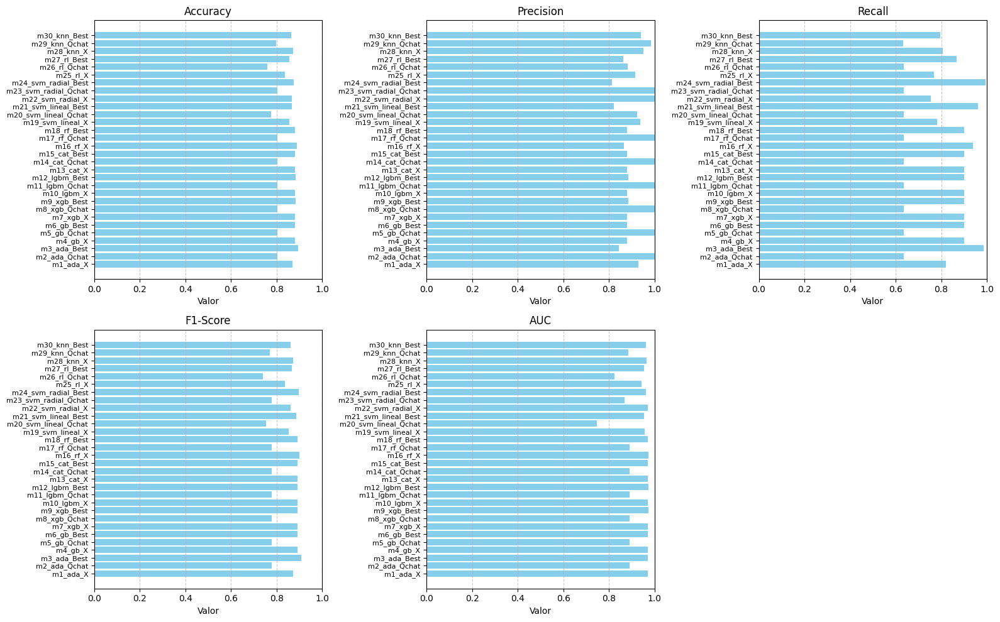

In [ ]:
# Definir métricas que quieres graficar
metricas = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']

# Establecer tamaño de la figura
plt.figure(figsize=(16, 10))

# Crear una barra para cada métrica
for i, metrica in enumerate(metricas):
    plt.subplot(2, 3, i+1)  # 2 filas, 3 columnas de gráficos
    plt.barh(resultados_df['Modelo'], resultados_df[metrica], color='skyblue')
    plt.title(metrica)
    plt.xlabel('Valor')
    plt.xlim(0, 1)
    plt.grid(axis='x', linestyle='--', alpha=0.7)

    # Mejorar separación de etiquetas
    plt.yticks(fontsize=8)  # Reduce el tamaño de fuente para que no se solapen
    plt.subplots_adjust(left=0.3)  # Aumenta el margen izquierdo

# Ajustar el layout para que no se sobrepongan
plt.tight_layout()
plt.show()


### 4.1.2. Según variante del dataset

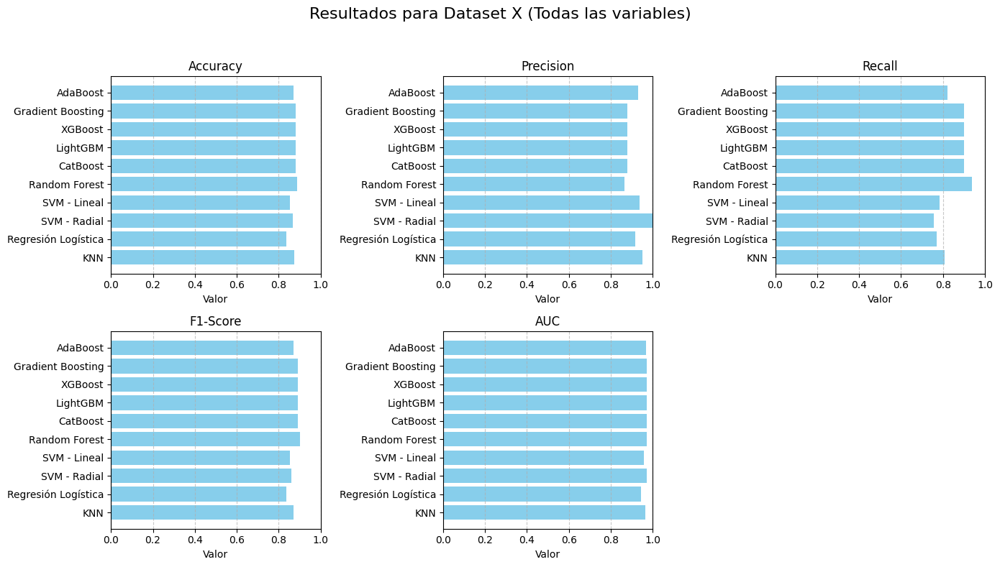

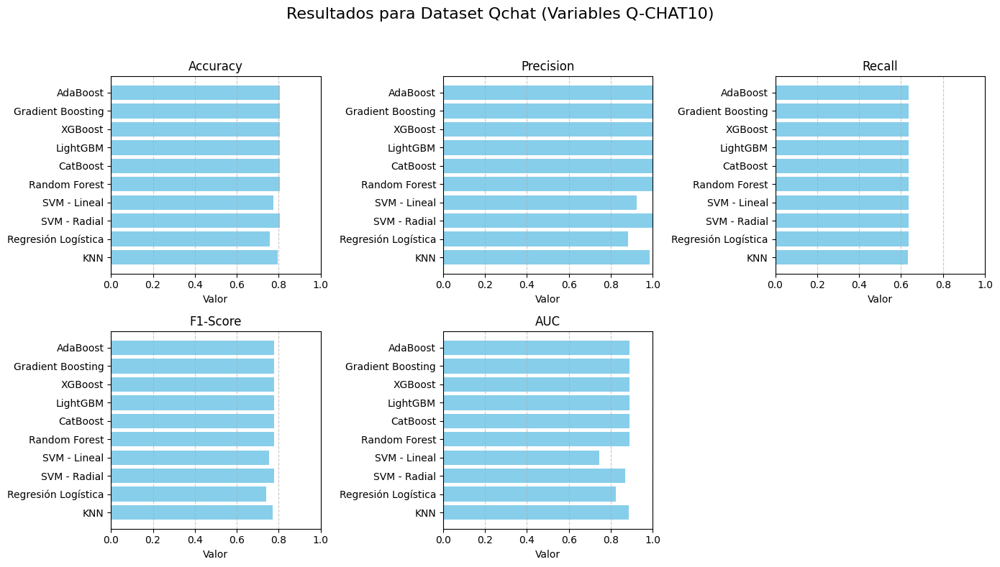

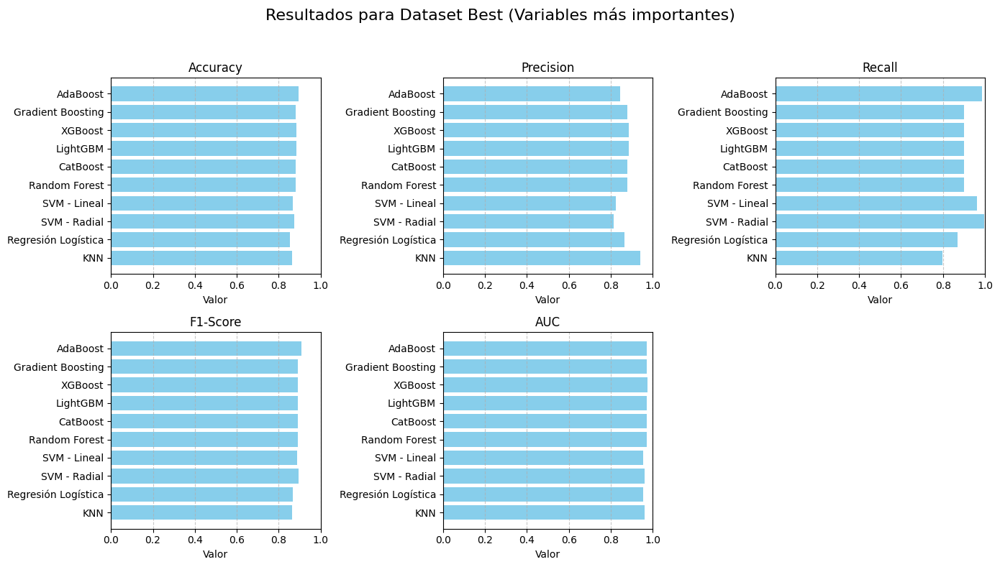

In [ ]:
# --- Separar resultados por tipo de dataset ---
resultados_df_X = resultados_df[resultados_df['Modelo'].str.contains('_X')].copy()
resultados_df_Qchat = resultados_df[resultados_df['Modelo'].str.contains('_Qchat')].copy()
resultados_df_Best = resultados_df[resultados_df['Modelo'].str.contains('_Best')].copy()

# --- Crear columna "Algoritmo" basada en el nombre ---
def extraer_algoritmo(nombre):
    nombre = nombre.lower()
    if 'ada' in nombre:
        return 'AdaBoost'
    elif 'xgb' in nombre:
        return 'XGBoost'
    elif 'lgbm' in nombre:
        return 'LightGBM'
    elif 'gb' in nombre:
        return 'Gradient Boosting'
    elif 'cat' in nombre:
        return 'CatBoost'
    elif 'rf' in nombre:
        return 'Random Forest'
    elif 'lineal' in nombre:
        return 'SVM - Lineal'
    elif 'radial' in nombre:
        return 'SVM - Radial'
    elif 'rl' in nombre:
        return 'Regresión Logística'
    elif 'knn' in nombre:
        return 'KNN'
    else:
        return 'Otro'

for df in [resultados_df_X, resultados_df_Qchat, resultados_df_Best]:
    df['Algoritmo'] = df['Modelo'].apply(extraer_algoritmo)

# --- Definir orden fijo de algoritmos ---
orden_algoritmos = ['AdaBoost', 'Gradient Boosting', 'XGBoost', 'LightGBM', 'CatBoost',
                    'Random Forest', 'SVM - Lineal', 'SVM - Radial', 'Regresión Logística','KNN']

# Función para ordenar un dataframe según el orden fijo
def ordenar_algoritmos(df):
    df['Algoritmo'] = pd.Categorical(df['Algoritmo'], categories=orden_algoritmos, ordered=True)
    return df.sort_values('Algoritmo')

resultados_df_X = ordenar_algoritmos(resultados_df_X)
resultados_df_Qchat = ordenar_algoritmos(resultados_df_Qchat)
resultados_df_Best = ordenar_algoritmos(resultados_df_Best)

# --- Graficar métricas para cada dataset ---

# Definir métricas
metricas = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']

# Función para graficar
def graficar_resultados(df, titulo):
    plt.figure(figsize=(14, 8))
    for i, metrica in enumerate(metricas):
        plt.subplot(2, 3, i+1)
        plt.barh(df['Algoritmo'], df[metrica], color='skyblue')
        plt.title(metrica)
        plt.xlabel('Valor')
        plt.xlim(0, 1)
        plt.grid(axis='x', linestyle='--', alpha=0.7)
        plt.gca().invert_yaxis()  # invierte el orden vertical
    plt.suptitle(titulo, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Graficar cada grupo
graficar_resultados(resultados_df_X, 'Resultados para Dataset X (Todas las variables)')
graficar_resultados(resultados_df_Qchat, 'Resultados para Dataset Qchat (Variables Q-CHAT10)')
graficar_resultados(resultados_df_Best, 'Resultados para Dataset Best (Variables más importantes)')


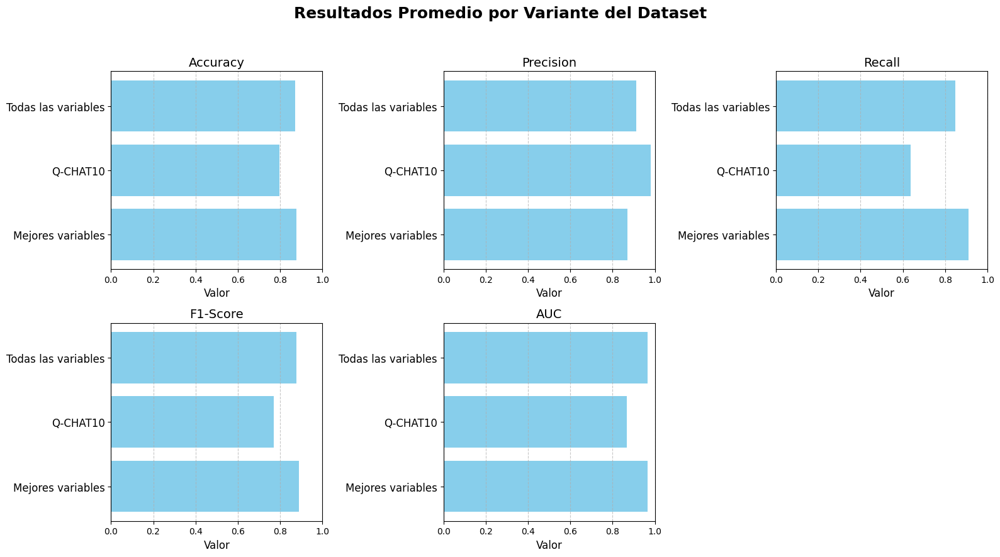

In [ ]:
# --- Extraer nombre de variante del dataset ---
def extraer_variante(nombre):
    if '_X' in nombre:
        return 'Todas las variables'
    elif '_Qchat' in nombre:
        return 'Q-CHAT10'
    elif '_Best' in nombre:
        return 'Mejores variables'
    else:
        return 'Otro'

# Aplicar extracción de variante
resultados_df['Variante'] = resultados_df['Modelo'].apply(extraer_variante)

# --- Agrupar solo columnas numéricas ---
columnas_metricas = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']

resultados_agrupados_variante = resultados_df.groupby('Variante')[columnas_metricas].mean().reset_index()

# --- Ordenar las variantes según orden lógico ---
orden_variante = ['Todas las variables', 'Q-CHAT10', 'Mejores variables']
resultados_agrupados_variante['Variante'] = pd.Categorical(
    resultados_agrupados_variante['Variante'],
    categories=orden_variante,
    ordered=True
)

# --- Graficar ---
import matplotlib.pyplot as plt

metricas = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']

plt.figure(figsize=(16, 9))  # Tamaño más amplio
for i, metrica in enumerate(metricas):
    plt.subplot(2, 3, i+1)
    plt.barh(resultados_agrupados_variante['Variante'], resultados_agrupados_variante[metrica], color='skyblue')
    plt.title(metrica, fontsize=14)
    plt.xlabel('Valor', fontsize=12)
    plt.xlim(0, 1)
    plt.yticks(fontsize=12)  # Agrandar fuente de etiquetas y
    plt.xticks(fontsize=10)  # Agrandar fuente de etiquetas x
    plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.suptitle('Resultados Promedio por Variante del Dataset', fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


### 4.1.3. Según algoritmo

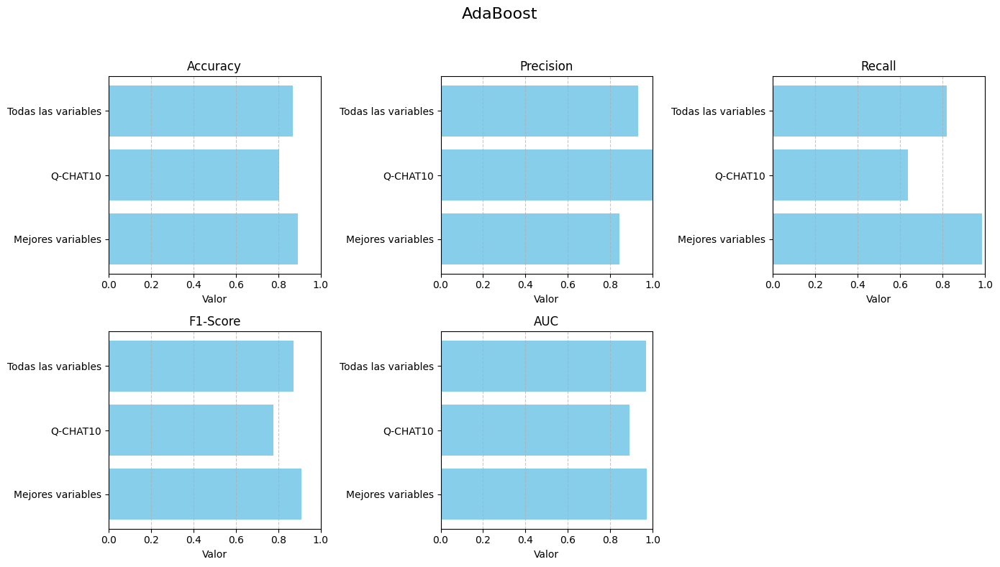

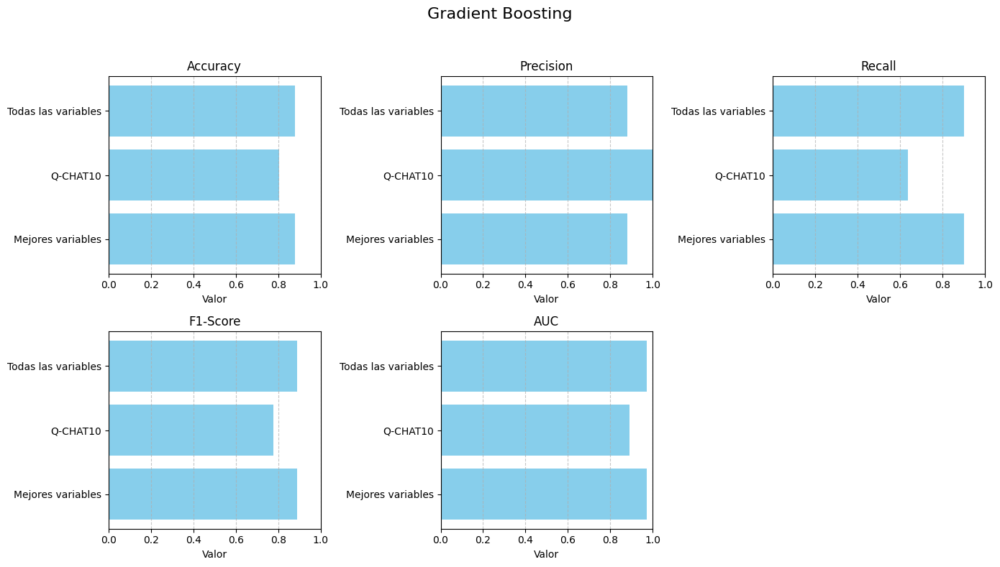

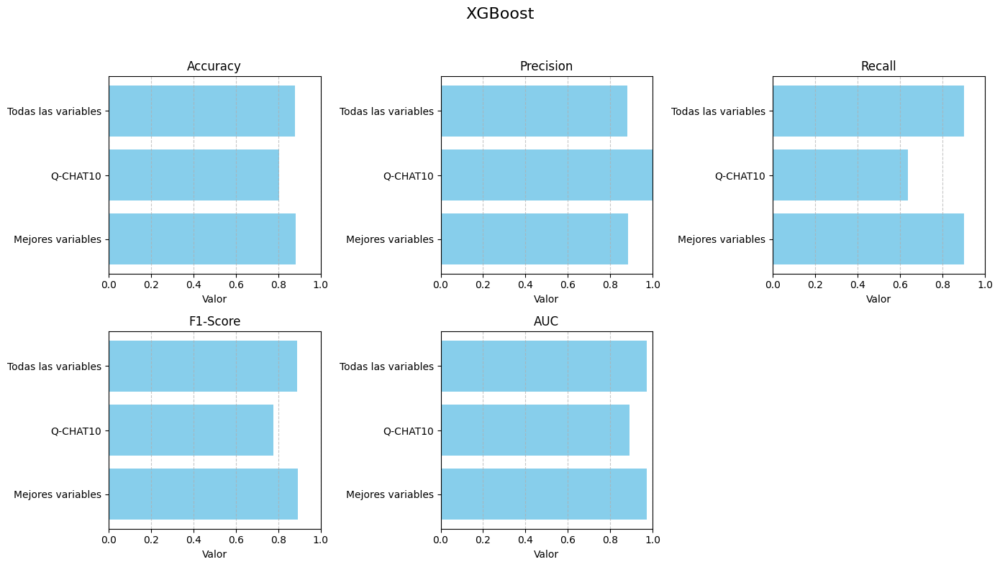

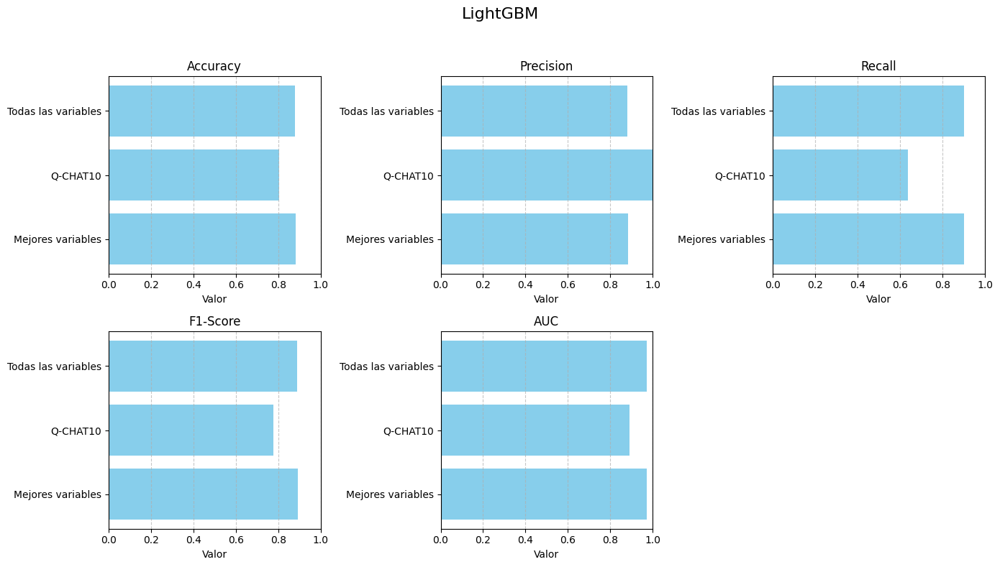

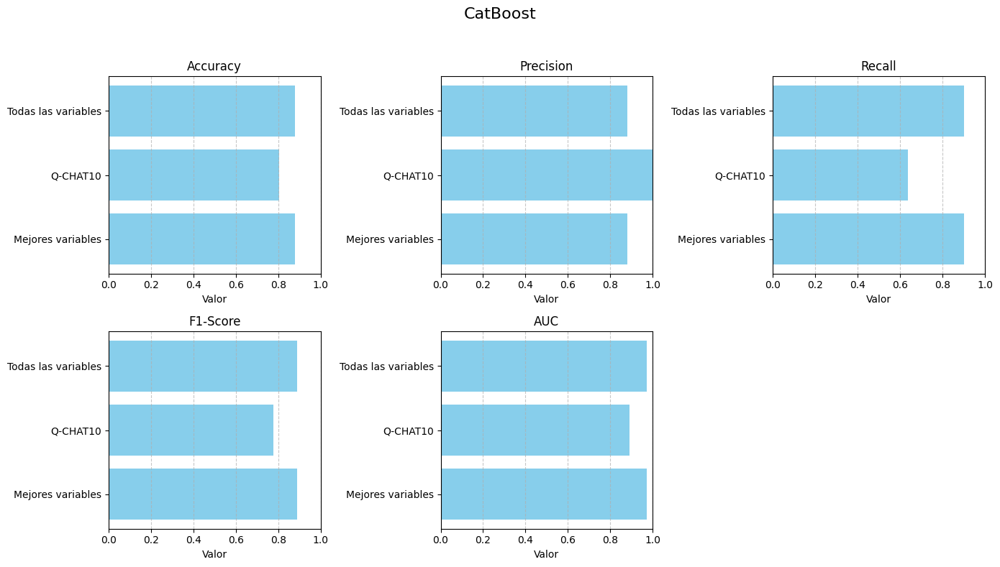

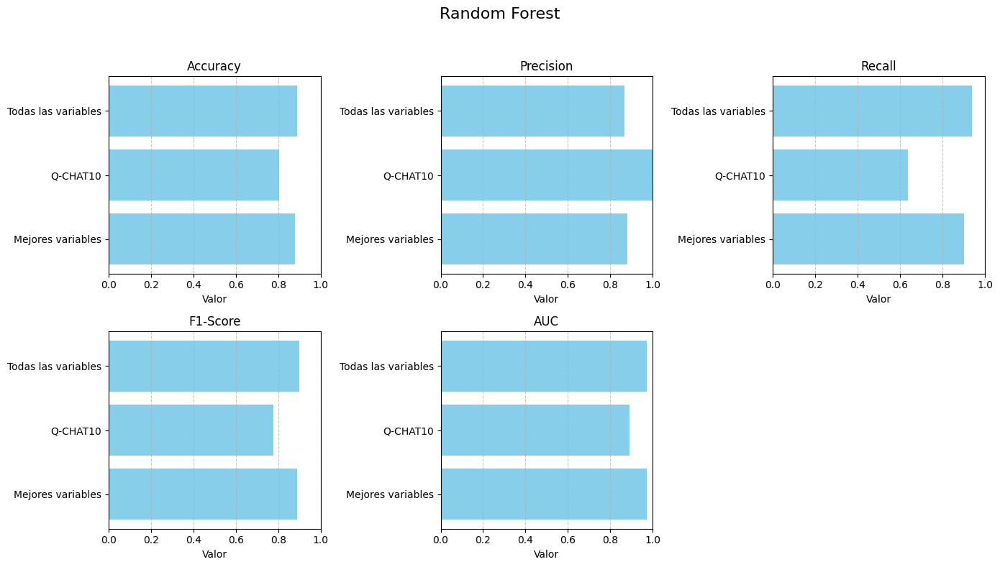

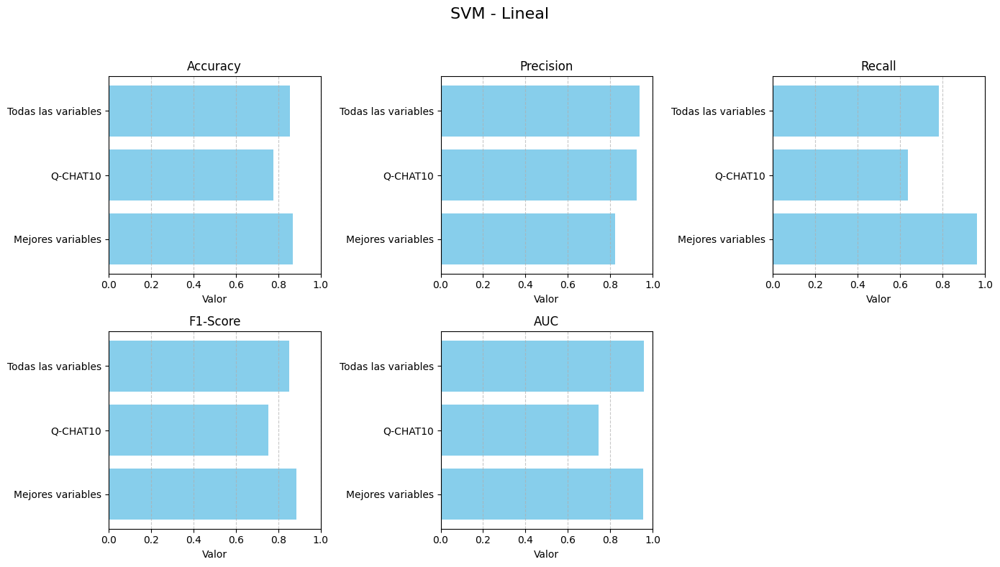

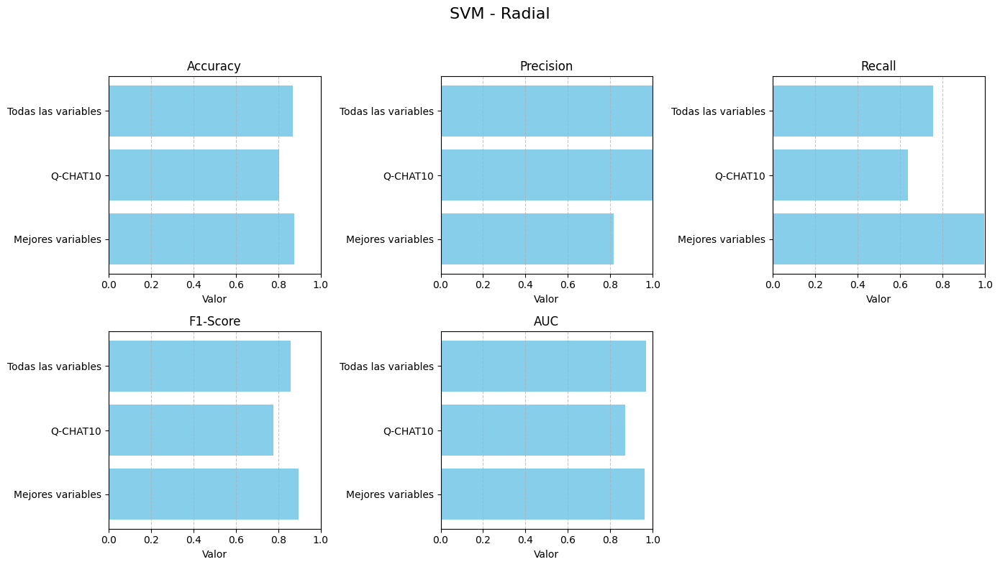

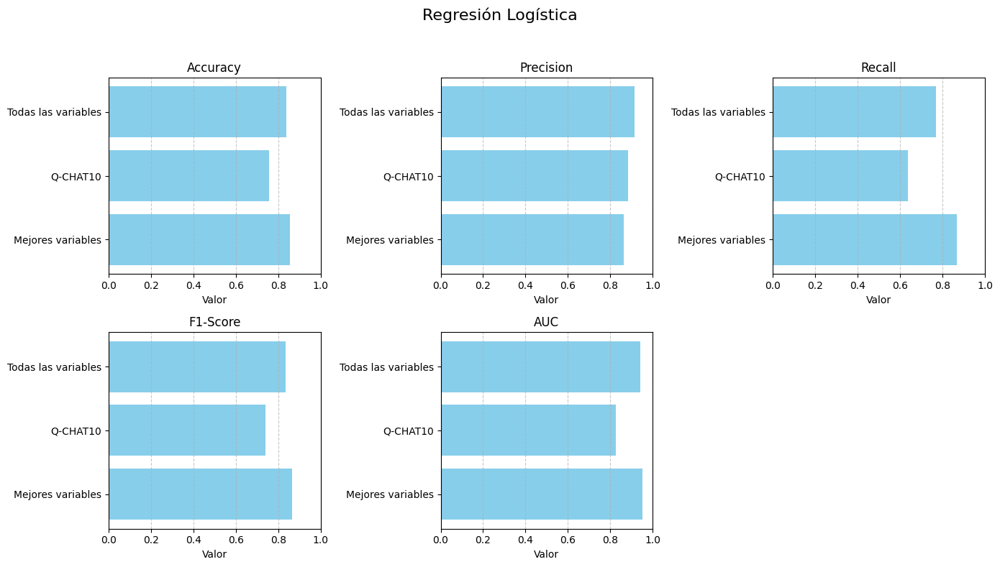

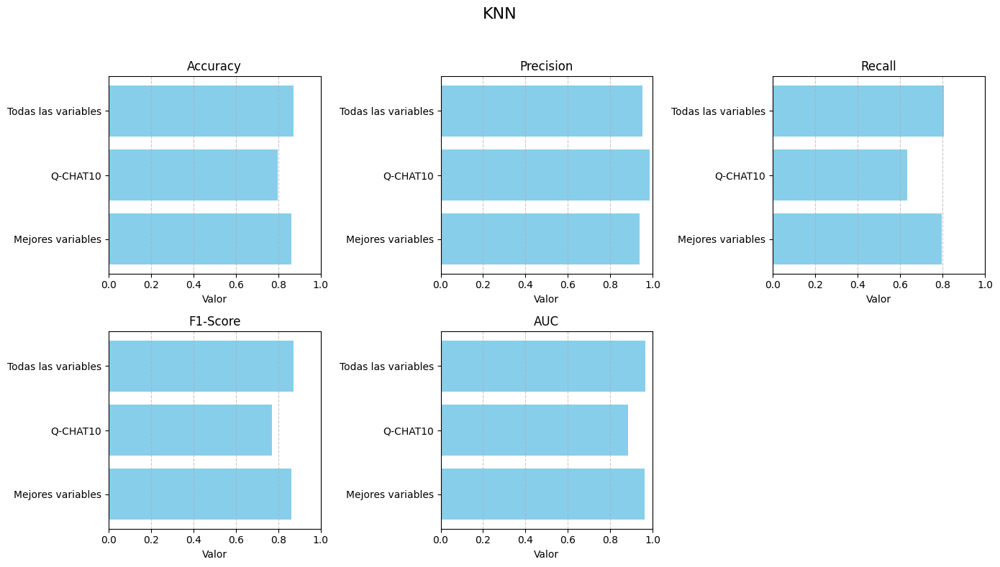

In [ ]:
# --- Definir orden correcto ---
orden_variante = ['Todas las variables', 'Q-CHAT10', 'Mejores variables']

# --- Aplicar extracción de variante y algoritmo ---
resultados_df['Variante'] = resultados_df['Modelo'].apply(extraer_variante)
resultados_df['Algoritmo'] = resultados_df['Modelo'].apply(extraer_algoritmo)

# --- Graficar métricas usando el nombre bonito de la variante ---
metricas = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']

def graficar_por_algoritmo(df):
    for algoritmo in df['Algoritmo'].unique():
      df_algoritmo = df[df['Algoritmo'] == algoritmo].copy()  # <-- Agregamos .copy() aquí
      df_algoritmo['Variante'] = pd.Categorical(df_algoritmo['Variante'], categories=orden_variante, ordered=True)
      df_algoritmo = df_algoritmo.sort_values('Variante')

      plt.figure(figsize=(14, 8))
      for i, metrica in enumerate(metricas):
          plt.subplot(2, 3, i+1)
          plt.barh(df_algoritmo['Variante'], df_algoritmo[metrica], color='skyblue')
          plt.title(metrica)
          plt.xlabel('Valor')
          plt.xlim(0, 1)
          plt.grid(axis='x', linestyle='--', alpha=0.7)
          plt.gca().invert_yaxis()
      plt.suptitle(f'{algoritmo}', fontsize=16)
      plt.tight_layout(rect=[0, 0, 1, 0.95])
      plt.show()

# Ejecutarlo
graficar_por_algoritmo(resultados_df)

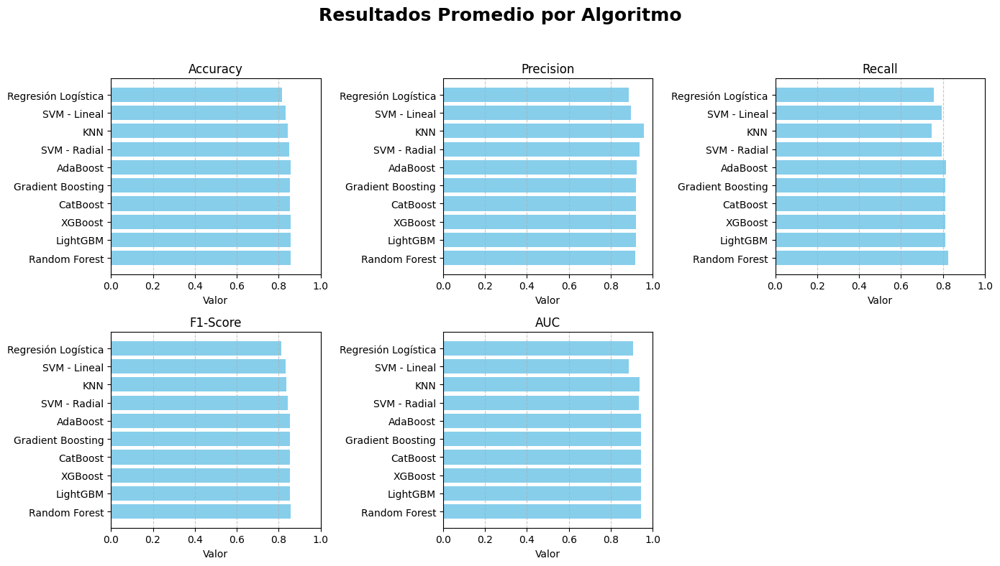

In [ ]:
# --- Agrupar solo columnas numéricas ---
columnas_metricas = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']

resultados_agrupados = resultados_df.groupby('Algoritmo')[columnas_metricas].mean().reset_index()

# --- Ordenar por F1-Score y Recall ---
resultados_agrupados = resultados_agrupados.sort_values(by=['F1-Score', 'Recall'], ascending=[False, False])

# --- Graficar ---
metricas = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']

plt.figure(figsize=(14, 8))
for i, metrica in enumerate(metricas):
    plt.subplot(2, 3, i+1)
    plt.barh(resultados_agrupados['Algoritmo'], resultados_agrupados[metrica], color='skyblue')
    plt.title(metrica)
    plt.xlabel('Valor')
    plt.xlim(0, 1)
    plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.suptitle('Resultados Promedio por Algoritmo', fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### 4.1.4. TOP 3 mejores modelos

Fueron elegidos en función a las métricas F1-Score y Recall, las más importantes en contexto clínico.

                Modelo  Accuracy  Precision    Recall  F1-Score       AUC
0  m24_svm_radial_Best  0.875318   0.814672  0.995283  0.895966  0.962681
1          m3_ada_Best  0.893130   0.842742  0.985849  0.908696  0.971216
2  m21_svm_lineal_Best  0.867684   0.822581  0.962264  0.886957  0.953690


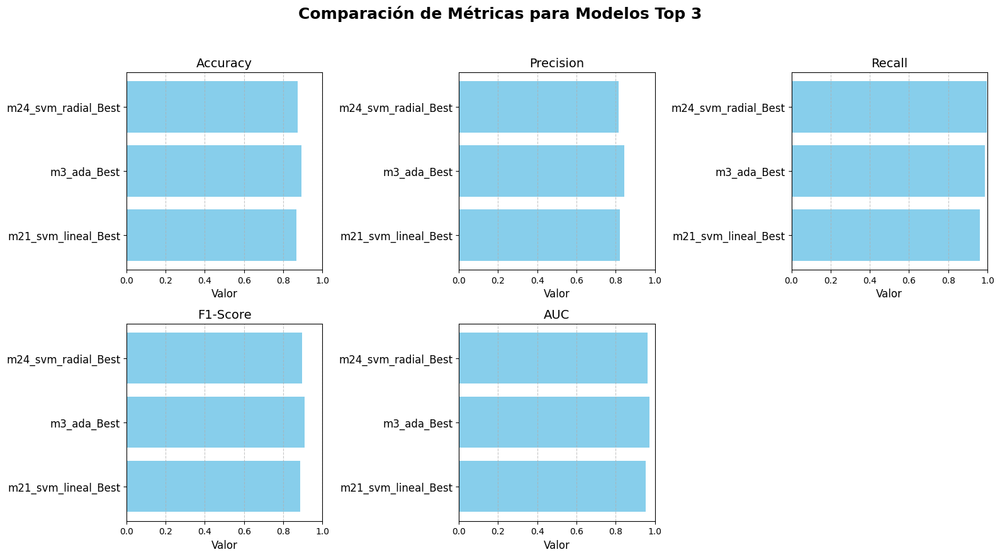

In [ ]:
# --- Lista de nombres de modelos que quieres evaluar ---
modelos_a_guardar = ['m24_svm_radial_Best', 'm3_ada_Best', 'm21_svm_lineal_Best']

# --- Cargar modelos y calcular métricas automáticamente ---
resultados = []

for nombre in modelos_a_guardar:
    # Cargar modelo
    modelo = joblib.load(f'{nombre}.pkl')

    # Seleccionar el dataset correcto
    if '_X' in nombre:
        X_test_set, y_test_set = X_test, y_test
    elif '_Qchat' in nombre:
        X_test_set, y_test_set = X_qchat_test, y_qchat_test
    elif '_Best' in nombre:
        X_test_set, y_test_set = X_best_test, y_best_test
    else:
        raise ValueError(f"No se reconoce el dataset para el modelo {nombre}")

    # Predecir
    y_pred = modelo.predict(X_test_set)
    y_proba = modelo.predict_proba(X_test_set)[:, 1]

    # Guardar métricas
    resultados.append({
        'Modelo': nombre,
        'Accuracy': accuracy_score(y_test_set, y_pred),
        'Precision': precision_score(y_test_set, y_pred),
        'Recall': recall_score(y_test_set, y_pred),
        'F1-Score': f1_score(y_test_set, y_pred),
        'AUC': roc_auc_score(y_test_set, y_proba)
    })

# --- Convertir a DataFrame ---
modelos_top = pd.DataFrame(resultados)

# Mostrar el DataFrame
print(modelos_top)

# --- Graficar cada métrica ---
metricas = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']

plt.figure(figsize=(16, 9))
for i, metrica in enumerate(metricas):
    plt.subplot(2, 3, i+1)
    plt.barh(modelos_top['Modelo'], modelos_top[metrica], color='skyblue')
    plt.title(metrica, fontsize=14)
    plt.xlabel('Valor', fontsize=12)
    plt.xlim(0, 1)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=10)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.gca().invert_yaxis()

plt.suptitle('Comparación de Métricas para Modelos Top 3', fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## 4.2. Modelo elegido e interpretabilidad

Trás un arduo análisis y evaluación de los 30 modelos entrenados, el mejor modelo en cuanto a las métricas Recall y F1-Score fue el que tuvo como el dataset con las mejores variables y como algoritmo a SVM con Kernel Radial. Se tomó de principal relevancia la métrica Recall porque en el ámbito clínico se busca reducir al máximo los casos positivos detectados como negativos (Falsos Negativos). Además de tener un Recall cercano 100% tiene una precisión considerable, es la mejor en los top 3, en donde, se asume que el modelo podrá detectar todos los casos de autismo potencial con la única limitacion de que 1 de cada 5 niños sería un falso autista.

In [ ]:
# --- Lista de nombres de modelos que quieres evaluar ---
modelo_elegido = 'm24_svm_radial_Best'

# --- Cargar modelos y calcular métricas automáticamente ---
resultados = []

# Cargar modelo
modelo = joblib.load(f'{modelo_elegido}.pkl')

# Asume que X_best_test y y_best_test ya están definidos
X_test_set, y_test_set = X_best_test, y_best_test

# Predecir
y_pred = modelo.predict(X_test_set)
y_proba = modelo.predict_proba(X_test_set)[:, 1]

# Guardar métricas
resultados.append({
    'Accuracy': accuracy_score(y_test_set, y_pred),
    'Precision': precision_score(y_test_set, y_pred),
    'Recall': recall_score(y_test_set, y_pred),
    'F1-Score': f1_score(y_test_set, y_pred),
    'AUC': roc_auc_score(y_test_set, y_proba)
})

# --- Convertir a DataFrame ---
modelo_desc = pd.DataFrame(resultados)

Métricas del modelo:
   Accuracy  Precision    Recall  F1-Score       AUC
0  0.875318   0.814672  0.995283  0.895966  0.962681


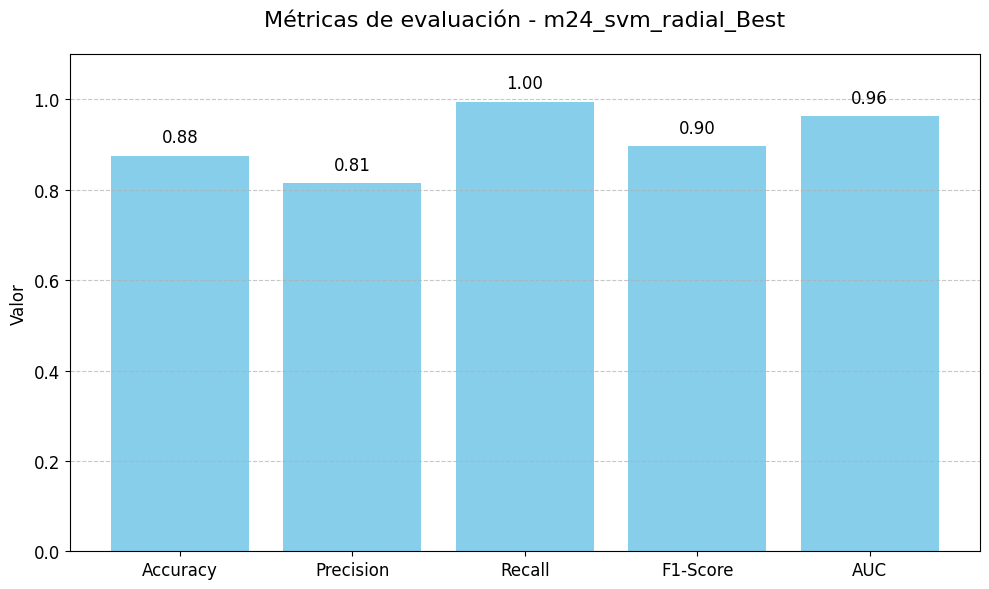

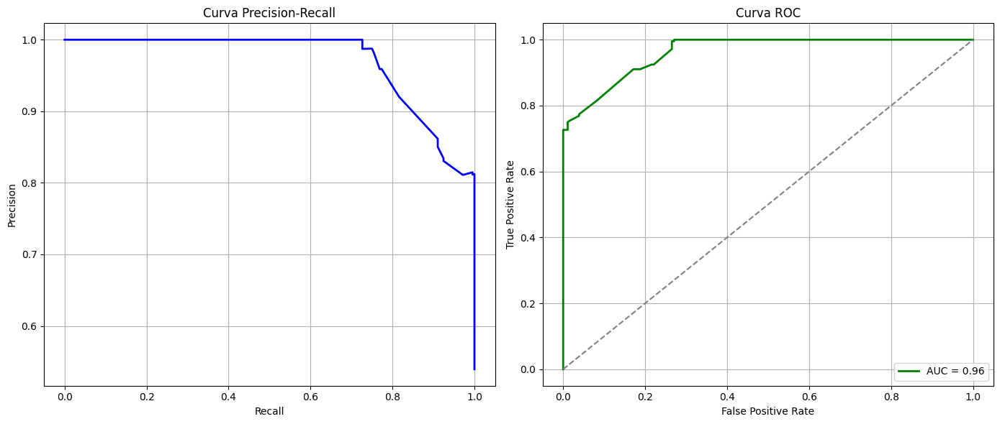

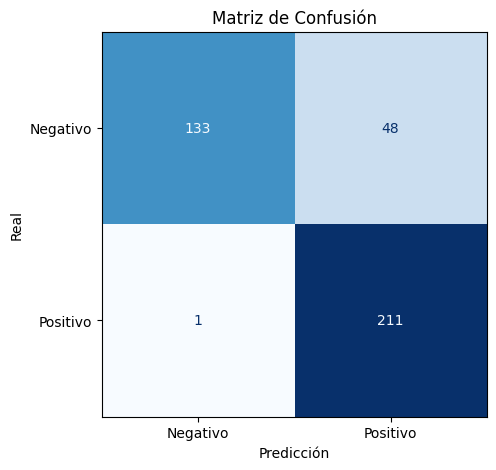

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Mostrar el DataFrame con las métricas
print("Métricas del modelo:")
print(modelo_desc)

# Extraer nombres de métricas y sus valores desde el DataFrame
metricas = modelo_desc.columns.tolist()
valores = modelo_desc.iloc[0].tolist()

# --- GRÁFICO DE BARRAS DE MÉTRICAS ---
plt.figure(figsize=(10, 6))
plt.bar(metricas, valores, color='skyblue')
plt.ylim(0, 1.1)
plt.title(f'Métricas de evaluación - {modelo_elegido}', fontsize=16, pad=20)
plt.ylabel('Valor', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Mostrar valores encima de cada barra
for i, v in enumerate(valores):
    plt.text(i, v + 0.03, f"{v:.2f}", ha='center', fontsize=12)

plt.tight_layout()
plt.show()

# --- CURVAS PRECISION-RECALL Y ROC ---
precision, recall, _ = precision_recall_curve(y_test_set, y_proba)
fpr, tpr, _ = roc_curve(y_test_set, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(14, 6))

# Curva Precision-Recall
plt.subplot(1, 2, 1)
plt.plot(recall, precision, color='blue', lw=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Curva Precision-Recall')
plt.grid(True)

# Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='green', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)

plt.tight_layout()
plt.show()

# --- MATRIZ DE CONFUSIÓN ---
cm = confusion_matrix(y_test_set, y_pred)
labels = ["Negativo", "Positivo"]

# Visualización con anotaciones
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(ax=ax, cmap='Blues', colorbar=False)

plt.title("Matriz de Confusión")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.grid(False)
plt.show()

### 4.2.1. Explicabilidad

Con el objetivo de interpretar las decisiones del modelo SVM con kernel radial, se empleó la técnica de explicabilidad SHAP (SHapley Additive exPlanations). Esta metodología permite descomponer cada predicción en contribuciones asociadas a las variables de entrada, basándose en la teoría de juegos de Shapley para asegurar una asignación equitativa del impacto de cada característica.

Dado que los modelos SVM no son compatibles con explicadores optimizados para árboles de decisión, como TreeExplainer, se utilizó el explainer agnóstico KernelExplainer. Este estima los valores SHAP mediante perturbaciones sistemáticas sobre las variables de entrada, ajustando un modelo local interpretable. Para reducir la carga computacional del proceso, se seleccionaron aleatoriamente 100 instancias del conjunto de prueba para el análisis.

  0%|          | 0/100 [00:00<?, ?it/s]

Tipo de salida SHAP: <class 'numpy.ndarray'>
Shape: (100, 20, 2)


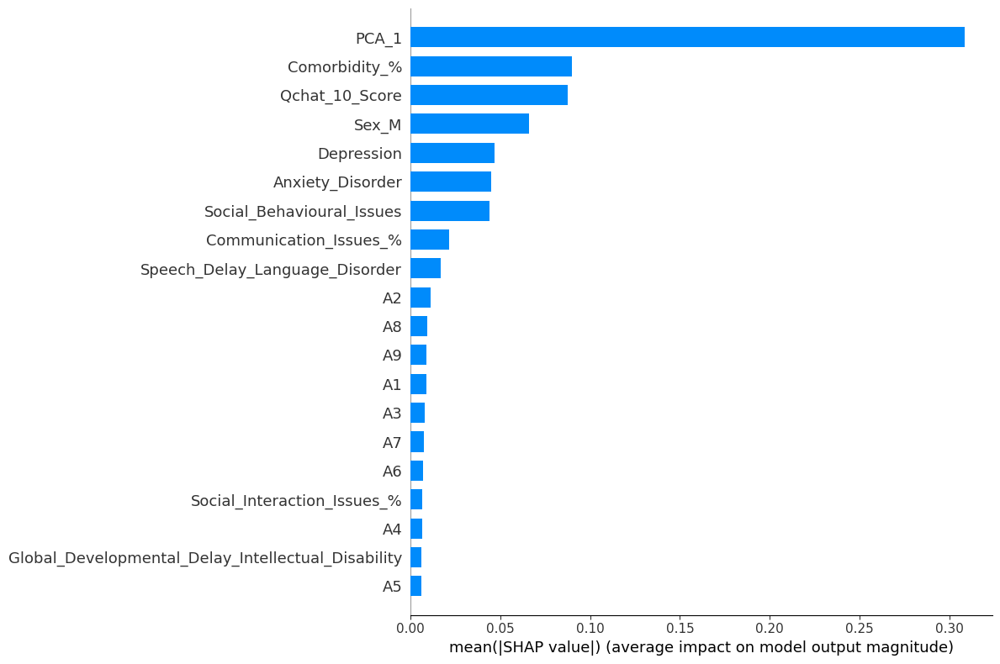

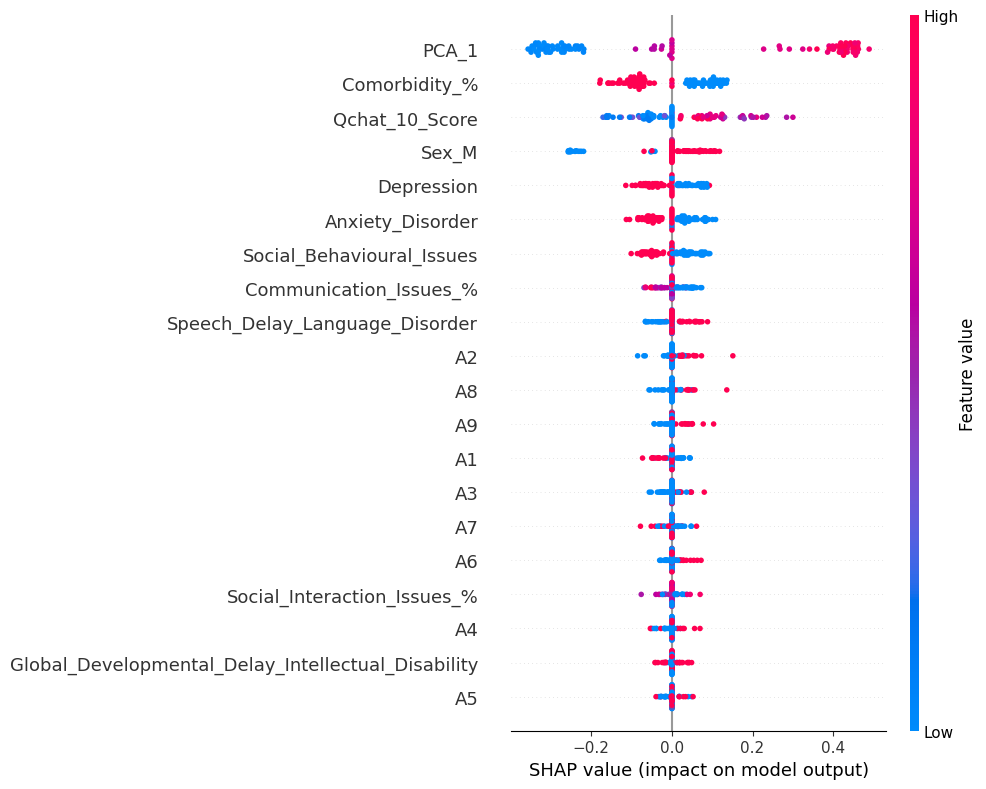

<Figure size 640x480 with 0 Axes>

In [ ]:
import shap

# 1. Seleccionar una muestra del conjunto de prueba
X_sample = X_test_set.sample(100, random_state=42)

# 2. Crear el explainer con KernelExplainer (modelo agnóstico)
explainer = shap.KernelExplainer(
    model=modelo.predict_proba,
    data=shap.sample(X_test_set, 100)  # datos de referencia (background)
)

# 3. Calcular los valores SHAP para la muestra
shap_values = explainer.shap_values(X_sample, nsamples=100)

# 4. Diagnóstico: verificar forma
print("Tipo de salida SHAP:", type(shap_values))
print("Shape:", np.array(shap_values).shape)

# 5. Extraer correctamente SHAP de la clase positiva (índice 1)
if isinstance(shap_values, np.ndarray) and shap_values.ndim == 3:
    shap_values_to_plot = shap_values[:, :, 1]  # clase 1: riesgo
elif isinstance(shap_values, list) and len(shap_values) == 2:
    shap_values_to_plot = shap_values[1]
else:
    shap_values_to_plot = shap_values

# Gráfico 1: Importancia promedio de variables (barra)
shap.summary_plot(
    shap_values_to_plot,
    X_sample,
    plot_type="bar",
    plot_size=(12, 8)  # en pulgadas: ancho x alto
)

# Ajustar el eje x con etiqueta personalizada (opcional)
plt.tight_layout()

# Gráfico 2: Distribución SHAP (beeswarm)
shap.summary_plot(
    shap_values_to_plot,
    X_sample,
    plot_size=(10, 8)
)
plt.tight_layout()

### 4.2.2. Importancia de variables

In [ ]:
# Obtener los nombres de las variables
feature_names = X_sample.columns

# Calcular la media del valor absoluto de SHAP para cada variable
importancia_shap = np.abs(shap_values_to_plot).mean(axis=0)

# Crear un DataFrame con los resultados
importancia_df = pd.DataFrame({
    'Variable': feature_names,
    'Importancia (media |SHAP|)': importancia_shap
}).sort_values(by='Importancia (media |SHAP|)', ascending=False)

# Mostrar el top 10
importancia_df.head(10)

,Variable,Importancia (media |SHAP|)
0,PCA_1,0.308509
19,Comorbidity_%,0.089749
6,Qchat_10_Score,0.087398
12,Sex_M,0.065757
16,Depression,0.046727
18,Anxiety_Disorder,0.044778
17,Social_Behavioural_Issues,0.043753
7,Communication_Issues_%,0.021275
15,Speech_Delay_Language_Disorder,0.016667
10,A2,0.011139


**Interpretación:**

- **PCA_1** es la variable más influyente del modelo, lo cual sugiere que la componente principal capturada resume una gran cantidad de información relevante para la clasificación, probablemente relacionada con patrones latentes en el conjunto de datos.

- **Comorbidity_%** y **Qchat_10_Score** también muestran una fuerte influencia, lo que es consistente con hallazgos clínicos, donde la carga comórbida y las puntuaciones en cuestionarios de cribado son indicadores clave en diagnósticos de trastornos del espectro autista (TEA).

- La variable **Sex_M** ocupa el cuarto lugar en importancia, lo cual justifica el análisis específico de sesgo por sexo realizado previamente. Esta relevancia destaca la necesidad de monitorear constantemente el impacto de variables sensibles en los modelos predictivos.

- Variables clínicas como **Depression**, **Anxiety_Disorder**, y **Social_Behavioural_Issues** también aportan significativamente, lo que valida la integración de factores conductuales y emocionales en el modelo.

En conjunto, esta interpretación no solo permite validar la coherencia clínica del modelo, sino también identificar posibles fuentes de sesgo o generalización limitada, especialmente en presencia de variables con alta carga explicativa y sensibilidad ética, como el sexo o la comorbilidad.


### 4.2.3. Evaluación de sesgos

In [ ]:
# Crear dos subconjuntos: masculino (1) y femenino (0)
masculino_idx = X_test_set['Sex_M'] == 1
femenino_idx = X_test_set['Sex_M'] == 0

# Subconjuntos de predicciones
y_pred = modelo.predict(X_test_set)

# Métricas para cada grupo
def evaluar_sesgo(grupo_idx, nombre):
    acc = accuracy_score(y_test_set[grupo_idx], y_pred[grupo_idx])
    prec = precision_score(y_test_set[grupo_idx], y_pred[grupo_idx])
    rec = recall_score(y_test_set[grupo_idx], y_pred[grupo_idx])
    f1 = f1_score(y_test_set[grupo_idx], y_pred[grupo_idx])
    print(f"--- {nombre} ---")
    print(f"Accuracy:  {acc:.3f}")
    print(f"Precision: {prec:.3f}")
    print(f"Recall:    {rec:.3f}")
    print(f"F1-Score:  {f1:.3f}\n")

evaluar_sesgo(masculino_idx, "Grupo Masculino")
evaluar_sesgo(femenino_idx, "Grupo Femenino")

--- Grupo Masculino ---
Accuracy:  0.838
Precision: 0.802
Recall:    1.000
F1-Score:  0.890

--- Grupo Femenino ---
Accuracy:  0.990
Precision: 1.000
Recall:    0.941
F1-Score:  0.970



**Análisis del sesgo por sexo en el modelo SVM con kernel radial**

- Se realizó una evaluación del posible sesgo del modelo en función del sexo, considerando la alta relevancia de la variable `Sex_M` en el análisis de explicabilidad global. Para ello, se compararon las métricas de desempeño del modelo **SVM con kernel radial** sobre los subconjuntos masculino y femenino del conjunto de prueba.

- Los resultados indicaron que el modelo alcanzó un rendimiento casi perfecto en el grupo femenino, con valores de **accuracy de 0.990**, **precisión de 1.000**, **recall de 0.941** y **F1-score de 0.970**. En contraste, en el grupo masculino, el desempeño fue inferior: **accuracy de 0.838**, **precisión de 0.802**, **recall de 1.000** y **F1-score de 0.890**. Estas diferencias sugieren que, aunque el modelo identifica correctamente la mayoría de los casos en ambos grupos, la menor precisión en el grupo masculino se asocia a una mayor proporción de falsos positivos.

- Si bien este comportamiento no refleja un sesgo significativo en términos absolutos, resulta relevante en contextos donde se espera una equidad estricta entre grupos. Por ello, se recomienda monitorear de forma continua el desempeño del modelo, especialmente cuando se emplean variables sensibles como el sexo, con el fin de asegurar niveles aceptables de equidad y justicia a lo largo del tiempo.

- Cabe destacar que, aunque el grupo femenino con diagnóstico de TEA representa solo el **10.4 %** del total, el modelo logró un rendimiento notable en este subconjunto. Esto podría deberse a que, a pesar del tamaño reducido, los casos femeninos presentan patrones clínicos más homogéneos, lo cual facilita el aprendizaje del modelo. Así, más que evidenciar un sesgo, este comportamiento podría reflejar una generalización efectiva en una subpoblación con menor variabilidad interna. No obstante, se recomienda validar esta hipótesis en futuras investigaciones con muestras femeninas más amplias y diversas.


# 5. PRUEBAS

## 5.1. Nuevo entrenamiento con balanceo de clases para "sex"

In [ ]:
from imblearn.over_sampling import SMOTE

df_pre = pd.read_csv('df_pre.csv')

# 1. Filtrar solo autistas
autistas = df_pre[df_pre['Asd_Traits'] == 1].copy()

# 2. Definir X e y para SMOTE
X_autistas = autistas.drop(columns=['Asd_Traits', 'Sex_M'])  # Usamos todas menos la clase y el sexo
y_autistas = autistas['Sex_M']  # Queremos balancear esto

In [ ]:
print(y_autistas.value_counts())

Sex_M
1.0    946
0.0    110
Name: count, dtype: int64


In [ ]:
# 3. Aplicar SMOTE para balancear el sexo dentro de los autistas
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_aut_synt, y_aut_synt = smote.fit_resample(X_autistas, y_autistas)

# 4. Reconstruir DataFrame
df_aut_synt = pd.DataFrame(X_aut_synt, columns=X_autistas.columns)
df_aut_synt['Sex_M'] = y_aut_synt
df_aut_synt['Asd_Traits'] = 1  # Todos siguen siendo autistas

# 5. Filtrar el resto del dataset (no autistas)
no_autistas = df_pre[df_pre['Asd_Traits'] == 0]

In [ ]:
# 6. Combinar todo
df_balanceado_final = pd.concat([df_aut_synt, no_autistas], axis=0).sample(frac=1, random_state=42)

# 7. Separar X e y finales
X_final = df_balanceado_final.drop(columns=['Asd_Traits'])
y_final = df_balanceado_final['Asd_Traits']

In [ ]:
print(pd.Series(y_aut_synt).value_counts())

Sex_M
1.0    946
0.0    946
Name: count, dtype: int64


In [ ]:
variables_seleccionadas_sin_sexo = [
    'PCA_1',
    'A6',
    'A9',
    'Social_Interaction_Issues_%',
    'A7',
    'A5',
    'Qchat_10_Score',
    'Communication_Issues_%',
    'A4',
    'A1',
    'A2',
    'A8',
    #'Sex_M',
    'A3',
    'Global_Developmental_Delay_Intellectual_Disability',
    'Speech_Delay_Language_Disorder',
    'Depression',
    'Social_Behavioural_Issues',
    'Anxiety_Disorder',
    'Comorbidity_%'
]

variables_seleccionadas_con_sexo = [
    'PCA_1',
    'A6',
    'A9',
    'Social_Interaction_Issues_%',
    'A7',
    'A5',
    'Qchat_10_Score',
    'Communication_Issues_%',
    'A4',
    'A1',
    'A2',
    'A8',
    'Sex_M',
    'A3',
    'Global_Developmental_Delay_Intellectual_Disability',
    'Speech_Delay_Language_Disorder',
    'Depression',
    'Social_Behavioural_Issues',
    'Anxiety_Disorder',
    'Comorbidity_%'
]

In [ ]:
X_final_con = X_final[variables_seleccionadas_con_sexo]

In [ ]:
# Importar modelo SVM
from sklearn.svm import SVC

In [ ]:
# usaremos la división train/test en 80/20.
X_final_con_train, X_final_con_test, y_final_con_train, y_final_con_test = train_test_split(X_final_con, y_final, test_size = 0.2, stratify = y_final, random_state = 42)

In [ ]:
# Definir el modelo base
model = SVC(kernel='rbf', probability=True, random_state=42)

# Definir el espacio de búsqueda
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],                 # Controla el margen
    'gamma': [10**-4, 10**-3, 10**-2, 10**-1]      # Controla la influencia del punto de soporte
}

# Configurar GridSearch
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='roc_auc',     # AUC como métrica de optimización
    cv=5,                  # 5-Fold Cross Validation
    verbose=2,
    n_jobs=-1              # Usar todos los núcleos
)

# Ejecutar la búsqueda
grid_search.fit(X_final_con_train, y_final_con_train)

# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Mejor modelo
m31_svm_radial_def = grid_search.best_estimator_

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Mejores hiperparámetros encontrados:
{'C': 100, 'gamma': 0.1}


In [ ]:
# Predecir con el algoritmo entrenado para validar
y_pred_train = m31_svm_radial_def.predict(X_final_con_train)
y_pred_test = m31_svm_radial_def.predict(X_final_con_test)  #  Correcto


# Cálculo de los indicadores más relevantes
metricas_confusion(y_final_con_train, y_pred_train, y_final_con_test, y_pred_test)

Matriz confusion: Train
[[ 545  179]
 [   0 1513]]
Matriz confusion: Test
[[145  36]
 [  1 378]]
Accuracy: Train
0.9199821189092534
Accuracy: Test
0.9339285714285714
Precision: Train
0.8942080378250591
Precision: Test
0.9130434782608695
Recall: Train
1.0
Recall: Test
0.9973614775725593
Reporte: Train
              precision    recall  f1-score   support

         0.0       1.00      0.75      0.86       724
         1.0       0.89      1.00      0.94      1513

    accuracy                           0.92      2237
   macro avg       0.95      0.88      0.90      2237
weighted avg       0.93      0.92      0.92      2237

Reporte: Test
              precision    recall  f1-score   support

         0.0       0.99      0.80      0.89       181
         1.0       0.91      1.00      0.95       379

    accuracy                           0.93       560
   macro avg       0.95      0.90      0.92       560
weighted avg       0.94      0.93      0.93       560



In [ ]:
# Modelo 31
joblib.dump(m31_svm_radial_def, 'm31_svm_radial_def.pkl')

['m31_svm_radial_def.pkl']

## 5.2. Nueva comparación (Benchmark)

                Modelo  Accuracy  Precision    Recall  F1-Score       AUC  \
0  m24_svm_radial_Best  0.875318   0.814672  0.995283  0.895966  0.962681   
1   m31_svm_radial_def  0.933929   0.913043  0.997361  0.953342  0.986246   

   Umbral_Óptimo  
0          0.626  
1          0.597  


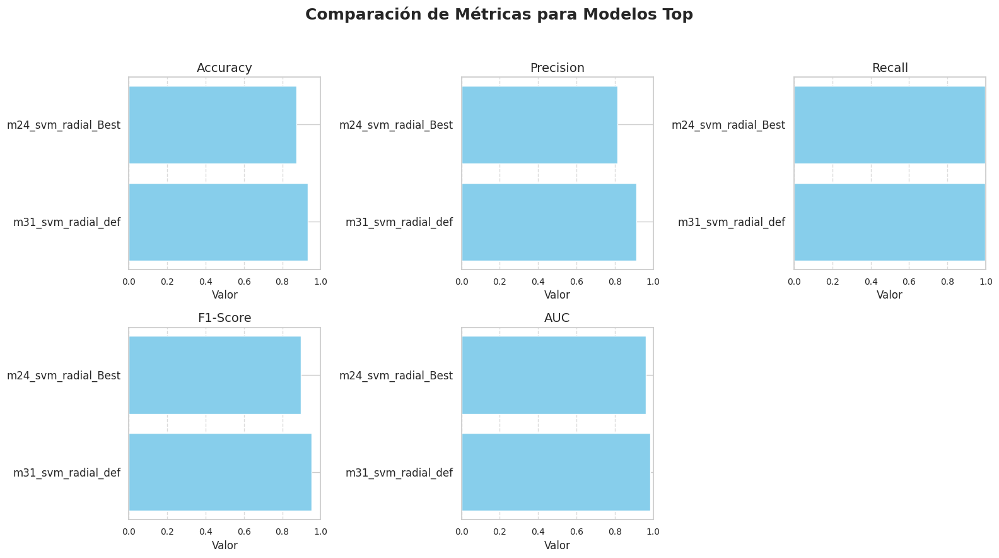

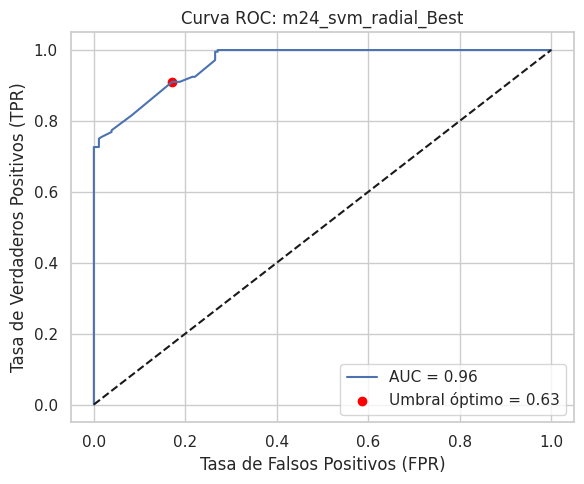

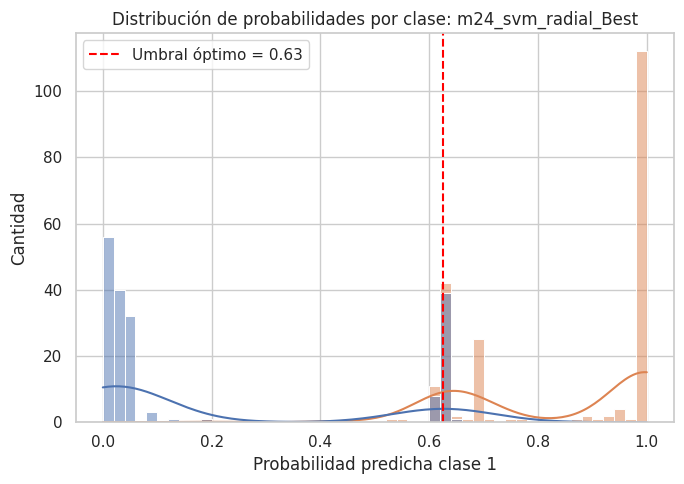

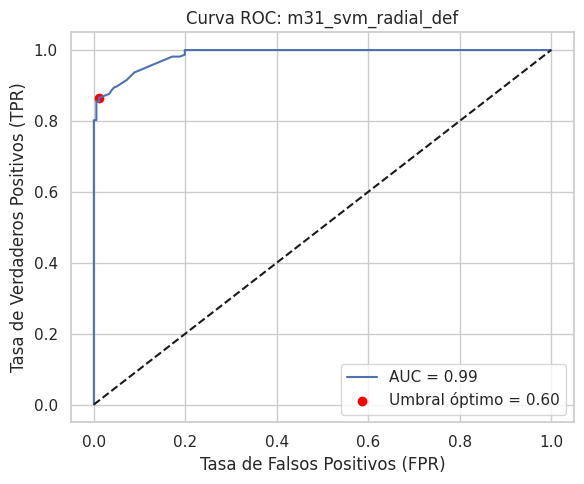

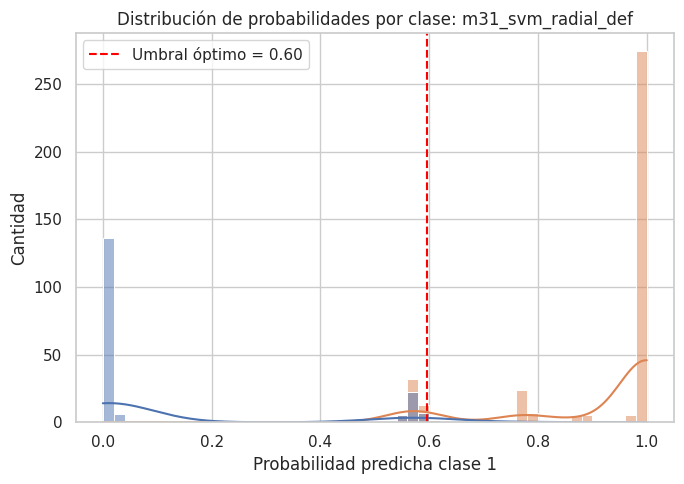

In [ ]:
import joblib
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve

# --- Lista de modelos a evaluar ---
modelos_a_guardar = [
    {'nombre': 'm24_svm_radial_Best', 'X': X_best_test, 'y': y_best_test},
    {'nombre': 'm31_svm_radial_def',  'X': X_final_con_test, 'y': y_final_test}
]

resultados = []
curvas_roc = []

# --- Evaluar cada modelo ---
for modelo_info in modelos_a_guardar:
    nombre = modelo_info['nombre']
    X_test_set = modelo_info['X']
    y_test_set = modelo_info['y']

    modelo = joblib.load(f'{nombre}.pkl')

    # Predicciones
    y_pred = modelo.predict(X_test_set)
    y_proba = modelo.predict_proba(X_test_set)[:, 1]

    # ROC
    fpr, tpr, thresholds = roc_curve(y_test_set, y_proba)
    auc = roc_auc_score(y_test_set, y_proba)
    optimal_idx = (tpr - fpr).argmax()
    optimal_threshold = thresholds[optimal_idx]

    # Guardar métricas
    resultados.append({
        'Modelo': nombre,
        'Accuracy': accuracy_score(y_test_set, y_pred),
        'Precision': precision_score(y_test_set, y_pred),
        'Recall': recall_score(y_test_set, y_pred),
        'F1-Score': f1_score(y_test_set, y_pred),
        'AUC': auc,
        'Umbral_Óptimo': round(optimal_threshold, 3)
    })

    curvas_roc.append({
        'nombre': nombre,
        'fpr': fpr,
        'tpr': tpr,
        'auc': auc,
        'optimal_fpr': fpr[optimal_idx],
        'optimal_tpr': tpr[optimal_idx],
        'optimal_threshold': optimal_threshold,
        'y_proba': y_proba,
        'y_real': y_test_set
    })

# --- Mostrar tabla resumen ---
modelos_top = pd.DataFrame(resultados)
print(modelos_top)

# --- Gráficas comparativas ---
metricas = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']
plt.figure(figsize=(16, 9))
for i, metrica in enumerate(metricas):
    plt.subplot(2, 3, i+1)
    plt.barh(modelos_top['Modelo'], modelos_top[metrica], color='skyblue')
    plt.title(metrica, fontsize=14)
    plt.xlabel('Valor', fontsize=12)
    plt.xlim(0, 1)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=10)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.gca().invert_yaxis()

plt.suptitle('Comparación de Métricas para Modelos Top', fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# --- Gráfica de curvas ROC y distribución de probabilidades ---
for curva in curvas_roc:
    # --- Curva ROC ---
    plt.figure(figsize=(6, 5))
    plt.plot(curva['fpr'], curva['tpr'], label=f"AUC = {curva['auc']:.2f}")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.scatter(curva['optimal_fpr'], curva['optimal_tpr'], color='red',
                label=f"Umbral óptimo = {curva['optimal_threshold']:.2f}")
    plt.xlabel('Tasa de Falsos Positivos (FPR)')
    plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
    plt.title(f"Curva ROC: {curva['nombre']}")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # --- Histograma de probabilidades ---
    df_proba = pd.DataFrame({
        'Probabilidad': curva['y_proba'],
        'Clase real': curva['y_real']
    })

    plt.figure(figsize=(7, 5))
    sns.histplot(data=df_proba, x='Probabilidad', hue='Clase real', bins=50, kde=True)
    plt.axvline(x=curva['optimal_threshold'], color='red', linestyle='--',
                label=f'Umbral óptimo = {curva["optimal_threshold"]:.2f}')
    plt.title(f'Distribución de probabilidades por clase: {curva["nombre"]}')
    plt.xlabel('Probabilidad predicha clase 1')
    plt.ylabel('Cantidad')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


## 5.3. Ingreso de registros y predicción

In [ ]:
# Simulación de entrada del usuario
data = {'A1': 0, 'A2': 0, 'A3': 0, 'A4': 0, 'A5': 0, 'A6': 0, 'A7': 0, 'A8': 0, 'A9': 0, 'A10_Autism_Spectrum_Quotient': 0,
     'Age_Years': 14, 'Sex_M': 0, 'Speech_Delay_Language_Disorder': 0, 'Learning_Disorder': 0, 'Genetic_Disorders': 0,
     'Depression': 0, 'Global_Developmental_Delay_Intellectual_Disability': 0, 'Social_Behavioural_Issues': 0,
     'Anxiety_Disorder': 0, 'Family_Mem_With_Asd': 0}

# QCHAT total
data['Qchat_10_Score'] = sum(list(data.values())[:10])

# Comunicación
communication_cols = ['A3', 'A8', 'A9', 'Speech_Delay_Language_Disorder', 'Learning_Disorder']
communication_weights = [0.20, 0.20, 0.20, 0.25, 0.15]
data['Communication_Issues_%'] = round(sum(data[col] * w * 100 for col, w in zip(communication_cols, communication_weights)), 2)

# Social
social_cols = ['A1', 'A2', 'A4', 'A5', 'A6', 'A7', 'Social_Behavioural_Issues', 'Anxiety_Disorder']
social_weights = [0.10, 0.10, 0.10, 0.15, 0.15, 0.15, 0.20, 0.05]
data['Social_Interaction_Issues_%'] = round(sum(data[col] * w * 100 for col, w in zip(social_cols, social_weights)), 2)

# Comorbilidades
comorb_cols = [
    'Speech_Delay_Language_Disorder', 'Learning_Disorder', 'Genetic_Disorders',
    'Depression', 'Global_Developmental_Delay_Intellectual_Disability',
    'Social_Behavioural_Issues', 'Anxiety_Disorder'
]
data['Comorbidity_%'] = round((sum(data[col] for col in comorb_cols) / len(comorb_cols)) * 100, 2)

# Clinical Profile (categoría)
comm = data['Communication_Issues_%']
soc = data['Social_Interaction_Issues_%']
if abs(comm - soc) < 10:
    data['Clinical_Profile'] = 'Mixed'
elif comm > soc:
    data['Clinical_Profile'] = 'Communication'
else:
    data['Clinical_Profile'] = 'Social interaction'


# Convertir a DataFrame
df = pd.DataFrame([data])

dummies = pd.get_dummies(df['Clinical_Profile'], prefix='Clinical_Profile', drop_first=False)
df = pd.concat([df.drop(columns=['Clinical_Profile']), dummies], axis=1)

# Asegurar columnas esperadas, aunque falten algunas clases
for col in ['Clinical_Profile_Mixed', 'Clinical_Profile_Social interaction']:
    if col not in df.columns:
        df[col] = 0


ordered_cols_pca = [
    'A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10_Autism_Spectrum_Quotient',
    'Age_Years', 'Qchat_10_Score',
    'Speech_Delay_Language_Disorder', 'Learning_Disorder', 'Genetic_Disorders', 'Depression',
    'Global_Developmental_Delay_Intellectual_Disability', 'Social_Behavioural_Issues',
    'Anxiety_Disorder', 'Family_Mem_With_Asd',
    'Comorbidity_%', 'Communication_Issues_%', 'Social_Interaction_Issues_%',
    'Sex_M', 'Clinical_Profile_Mixed', 'Clinical_Profile_Social interaction'
]

# Verificar resultado
df = df[ordered_cols_pca]

# Define los rangos min–max por variable
scaling_params = {
    "Age_Years": (1, 18),
    "Sex_M": (0, 1),
    "A1": (0, 1),
    "A2": (0, 1),
    "A3": (0, 1),
    "A4": (0, 1),
    "A5": (0, 1),
    "A6": (0, 1),
    "A7": (0, 1),
    "A8": (0, 1),
    "A9": (0, 1),
    "A10_Autism_Spectrum_Quotient": (0, 1),
    "Qchat_10_Score": (0, 10),
    "Speech_Delay_Language_Disorder": (0, 1),
    "Learning_Disorder": (0, 1),
    "Genetic_Disorders": (0, 1),
    "Depression": (0, 1),
    "Global_Developmental_Delay_Intellectual_Disability": (0, 1),
    "Social_Behavioural_Issues": (0, 1),
    "Anxiety_Disorder": (0, 1),
    "Family_Mem_With_Asd": (0, 1),
    "Social_Interaction_Issues_%": (0, 100),
    "Communication_Issues_%": (0, 100),
    "Comorbidity_%": (0, 100),
    "Clinical_Profile_Mixed": (0, 1),
    "Clinical_Profile_Social interaction": (0, 1)
}

# Función de min-max manual
def minmax_scale(value, min_val, max_val):
    return round((value - min_val) / (max_val - min_val), 4) if max_val != min_val else 0.0

# Aplicar la escala a cada columna
df_scaled = df.copy()
for col, (min_val, max_val) in scaling_params.items():
    df_scaled[col] = df_scaled[col].apply(lambda x: minmax_scale(x, min_val, max_val))

from sklearn.decomposition import PCA

# Seleccionar solo las columnas que usarás en PCA (sin incluir las dummies que no usaste)
# 11. Cargar PCA entrenado
pca = joblib.load("pca_model.pkl")

# 12. Transformar y agregar PCA_1
df_scaled['PCA_1'] = pca.transform(df_scaled)[:, 0]

columns = [
    'PCA_1', 'A6', 'A9', 'Social_Interaction_Issues_%', 'A7', 'A5',
    'Qchat_10_Score', 'Communication_Issues_%', 'A4', 'A1', 'A2', 'A8',
    'Sex_M', 'A3', 'Global_Developmental_Delay_Intellectual_Disability',
    'Speech_Delay_Language_Disorder', 'Depression',
    'Social_Behavioural_Issues', 'Anxiety_Disorder', 'Comorbidity_%'
]
df_prueba = df_scaled[columns]
df_prueba.head()

,PCA_1,A6,A9,Social_Interaction_Issues_%,A7,A5,Qchat_10_Score,Communication_Issues_%,A4,A1,A2,A8,Sex_M,A3,Global_Developmental_Delay_Intellectual_Disability,Speech_Delay_Language_Disorder,Depression,Social_Behavioural_Issues,Anxiety_Disorder,Comorbidity_%
0,-1.931111,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
modelo = joblib.load('m24_svm_radial_Best.pkl')

# Asume que X_best_test y y_best_test ya están definidos
X_test_set, y_test_set = X_best_test, y_best_test

# Predecir
y_pred = modelo.predict(X_test_set)

# Obtener ambas probabilidades
y_prob_all = modelo.predict_proba(X_test_set)

# Crear DataFrame con ambas probabilidades
df_resultados = pd.DataFrame({
    'Real': y_test_set,
    'Predicho': y_pred,
    'Probabilidad_clase_0': y_prob_all[:, 0],
    'Probabilidad_clase_1': y_prob_all[:, 1]
})

# Ordenar por probabilidad de clase 1 (descendente)
df_ordenado = df_resultados.sort_values(by='Probabilidad_clase_1', ascending=False)

# Filtrar solo los predichos como clase 1
df_predichos_1 = df_ordenado[df_ordenado['Predicho'] == 0]

# Mostrar
print(df_predichos_1.head())

     Real  Predicho  Probabilidad_clase_0  Probabilidad_clase_1
210     0         0              0.806954              0.193046
458     1         0              0.819551              0.180449
118     0         0              0.860140              0.139860
64      0         0              0.907829              0.092171
586     0         0              0.909315              0.090685


In [ ]:
# Definir el umbral óptimo basado en tu análisis ROC
umbral_optimo = 0.75

# Obtener la probabilidad de clase 1
probabilidades = modelo.predict_proba(df_prueba)[0]
proba_clase_1 = probabilidades[1]

# Asignar clase según el umbral personalizado
prediccion_umbral = 1 if proba_clase_1 >= umbral_optimo else 0

# Mostrar resultados
print("Predicción con umbral personalizado:", prediccion_umbral)
print("Probabilidad clase 1:", round(proba_clase_1, 4))
print("Probabilidad clase 0:", round(probabilidades[0], 4))

Predicción con umbral personalizado: 0
Probabilidad clase 1: 0.0403
Probabilidad clase 0: 0.9597


In [ ]:
modelo = joblib.load('m31_svm_radial_def.pkl')

# Asume que X_best_test y y_best_test ya están definidos
X_test_set, y_test_set = X_final_con_test, y_final_con_test

# Predecir
y_pred = modelo.predict(X_test_set)

# Obtener ambas probabilidades
y_prob_all = modelo.predict_proba(X_test_set)

# Crear DataFrame con ambas probabilidades
df_resultados = pd.DataFrame({
    'Real': y_test_set,
    'Predicho': y_pred,
    'Probabilidad_clase_0': y_prob_all[:, 0],
    'Probabilidad_clase_1': y_prob_all[:, 1]
})

# Ordenar por probabilidad de clase 1 (descendente)
df_ordenado = df_resultados.sort_values(by='Probabilidad_clase_1', ascending=False)

# Filtrar solo los predichos como clase 1
df_predichos_1 = df_ordenado[df_ordenado['Predicho'] == 0]

# Mostrar
print(df_predichos_1.head())

      Real  Predicho  Probabilidad_clase_0  Probabilidad_clase_1
422    1.0       0.0              0.897381              0.102619
266    0.0       0.0              0.913902              0.086098
590    0.0       0.0              0.938170              0.061830
773    0.0       0.0              0.941345              0.058655
1090   0.0       0.0              0.962334              0.037666


In [ ]:
# Definir el umbral óptimo basado en tu análisis ROC
umbral_optimo = 0.605

# Obtener la probabilidad de clase 1
probabilidades = modelo.predict_proba(df_prueba)[0]
proba_clase_1 = probabilidades[1]

# Asignar clase según el umbral personalizado
prediccion_umbral = 1 if proba_clase_1 >= umbral_optimo else 0

# Mostrar resultados
print("Predicción con umbral personalizado:", prediccion_umbral)
print("Probabilidad clase 1:", round(proba_clase_1, 4))
print("Probabilidad clase 0:", round(probabilidades[0], 4))

Predicción con umbral personalizado: 0
Probabilidad clase 1: 0.0156
Probabilidad clase 0: 0.9844


# 6. DATOS SINTÉTICOS

In [ ]:
!pip install -U sdv==1.4.0

In [ ]:
import sdv
print(sdv.__version__)

1.4.0


In [ ]:
import pandas as pd
from sdv.single_table import CTGANSynthesizer, GaussianCopulaSynthesizer
from sdv.metadata.single_table import SingleTableMetadata
import matplotlib.pyplot as plt
import seaborn as sns

# === Preparar el dataset base (original) ===
X_total = X_best.copy()
X_total['ASD_Traits'] = y

# === Crear metadatos una vez para ambos modelos ===
metadata = SingleTableMetadata()
metadata.detect_from_dataframe(X_total)

In [ ]:
# === Gaussian Copula Synthesizer ===
gc_synth = GaussianCopulaSynthesizer(metadata)
gc_synth.fit(X_total)
gc_data = gc_synth.sample(num_rows=385)

# === CTGAN Synthesizer ===
ctgan_synth = CTGANSynthesizer(metadata)
ctgan_synth.fit(X_total)
ctgan_data = ctgan_synth.sample(num_rows=385)

/usr/local/lib/python3.11/dist-packages/rdt/transformers/numerical.py:112: UserWarning: No rounding scheme detected for column 'PCA_1'. Data will not be rounded.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/rdt/transformers/numerical.py:112: UserWarning: No rounding scheme detected for column 'Social_Interaction_Issues_%'. Data will not be rounded.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/rdt/transformers/numerical.py:112: UserWarning: No rounding scheme detected for column 'Qchat_10_Score'. Data will not be rounded.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/rdt/transformers/numerical.py:112: UserWarning: No rounding scheme detected for column 'PCA_1'. Data will not be rounded.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/rdt/transformers/numerical.py:112: UserWarning: No rounding scheme detected for column 'Social_Interaction_Issues_%'. Data will not be rounded.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/rdt/transfor

In [ ]:
# Lista de columnas que aceptan decimales
decimal_columns = ['PCA_1', 'Social_Interaction_Issues_%', 'Communication_Issues_%',
                   'Qchat_10_Score', 'Comorbidity_%']

# Función para redondear todo lo demás a 0 o 1
def limpiar_datos_binarios(df):
    df_limpio = df.copy()
    for col in df.columns:
        if col not in decimal_columns:
            df_limpio[col] = df_limpio[col].round().clip(0, 1)
    return df_limpio

# Aplicar limpieza a los conjuntos sintéticos
gc_data = limpiar_datos_binarios(gc_data)
ctgan_data = limpiar_datos_binarios(ctgan_data)

In [ ]:
# Verifica si hay columnas binarias con valores diferentes a 0 o 1
for col in gc_data.columns:
    if col not in decimal_columns:
        uniques = gc_data[col].unique()
        if not set(uniques).issubset({0.0, 1.0}):
            print(f"Columna {col} tiene valores inesperados: {uniques}")
        else:
            print(f"Columna {col} está limpia.")

Columna A6 está limpia.
Columna A9 está limpia.
Columna A7 está limpia.
Columna A5 está limpia.
Columna A4 está limpia.
Columna A1 está limpia.
Columna A2 está limpia.
Columna A8 está limpia.
Columna Sex_M está limpia.
Columna A3 está limpia.
Columna Global_Developmental_Delay_Intellectual_Disability está limpia.
Columna Speech_Delay_Language_Disorder está limpia.
Columna Depression está limpia.
Columna Social_Behavioural_Issues está limpia.
Columna Anxiety_Disorder está limpia.
Columna ASD_Traits está limpia.


In [ ]:
# Verifica si hay columnas binarias con valores diferentes a 0 o 1
for col in ctgan_data.columns:
    if col not in decimal_columns:
        uniques = ctgan_data[col].unique()
        if not set(uniques).issubset({0.0, 1.0}):
            print(f"Columna {col} tiene valores inesperados: {uniques}")
        else:
            print(f"Columna {col} está limpia.")

Columna A6 está limpia.
Columna A9 está limpia.
Columna A7 está limpia.
Columna A5 está limpia.
Columna A4 está limpia.
Columna A1 está limpia.
Columna A2 está limpia.
Columna A8 está limpia.
Columna Sex_M está limpia.
Columna A3 está limpia.
Columna Global_Developmental_Delay_Intellectual_Disability está limpia.
Columna Speech_Delay_Language_Disorder está limpia.
Columna Depression está limpia.
Columna Social_Behavioural_Issues está limpia.
Columna Anxiety_Disorder está limpia.
Columna ASD_Traits está limpia.


In [ ]:
X_total.columns

Index(['PCA_1', 'A6', 'A9', 'Social_Interaction_Issues_%', 'A7', 'A5',
       'Qchat_10_Score', 'Communication_Issues_%', 'A4', 'A1', 'A2', 'A8',
       'Sex_M', 'A3', 'Global_Developmental_Delay_Intellectual_Disability',
       'Speech_Delay_Language_Disorder', 'Depression',
       'Social_Behavioural_Issues', 'Anxiety_Disorder', 'Comorbidity_%',
       'ASD_Traits'],
      dtype='object')

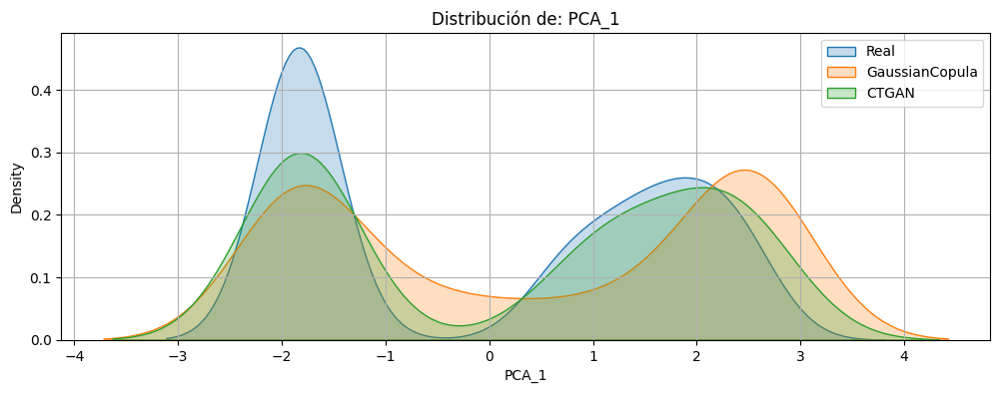

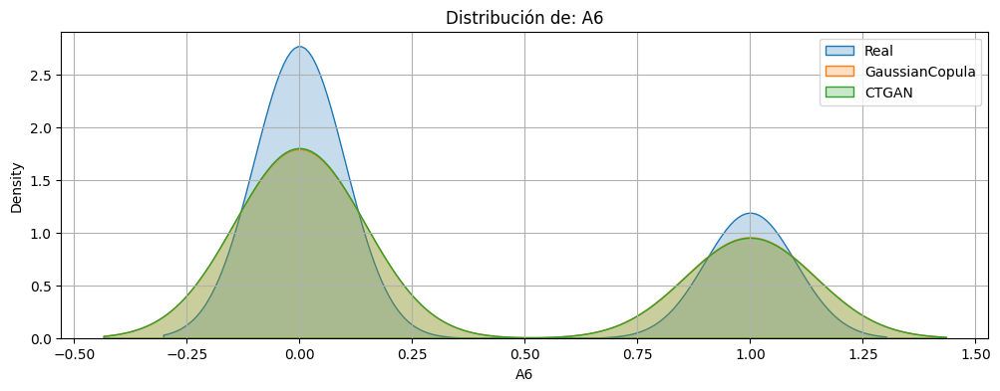

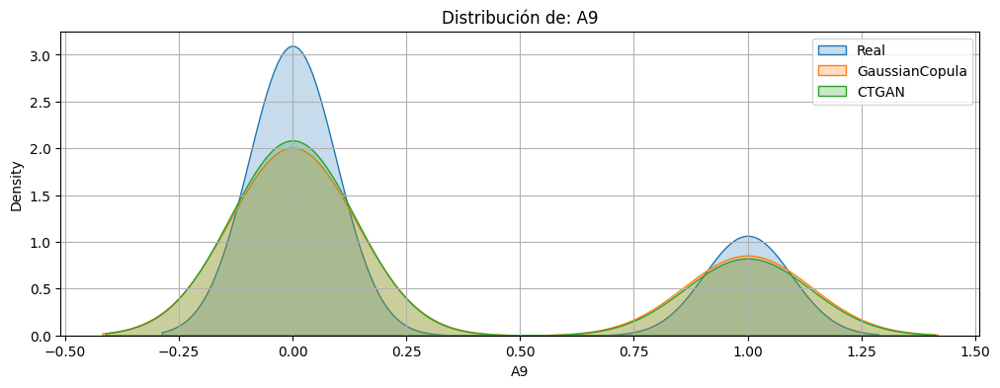

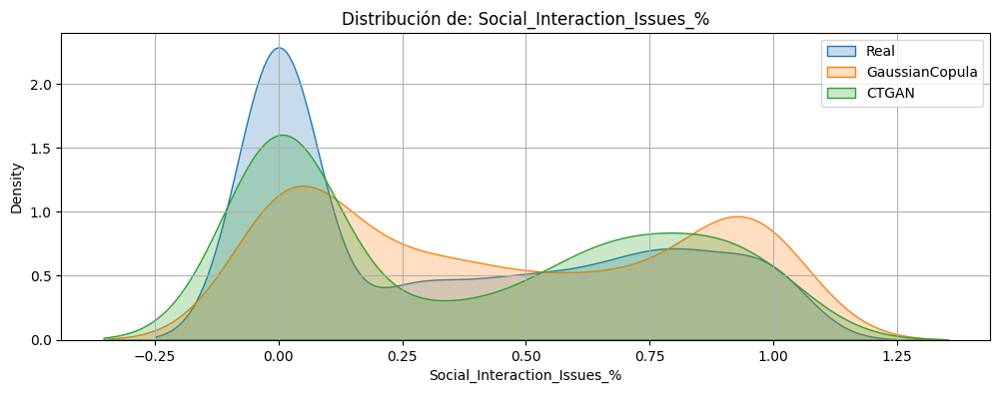

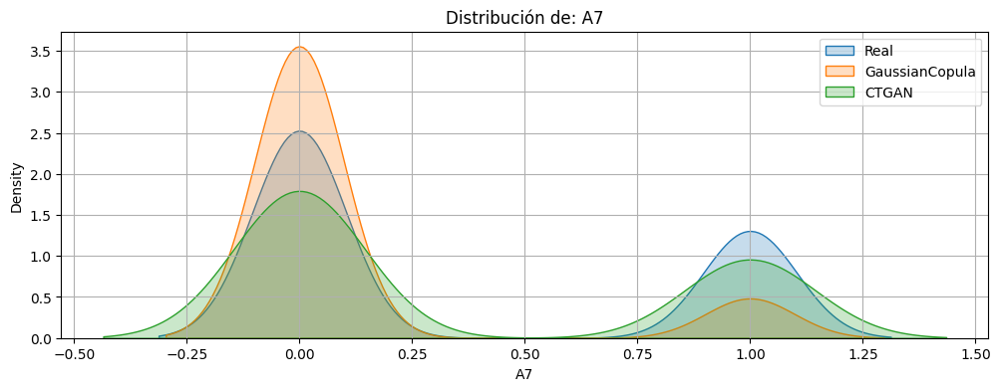

...

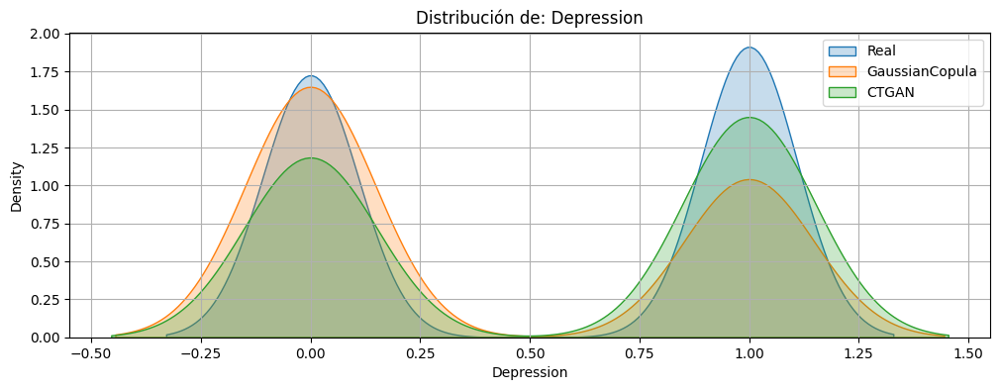

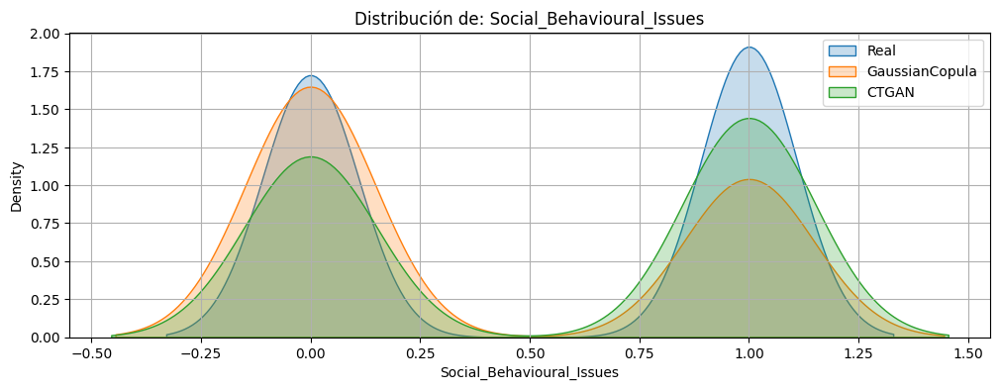

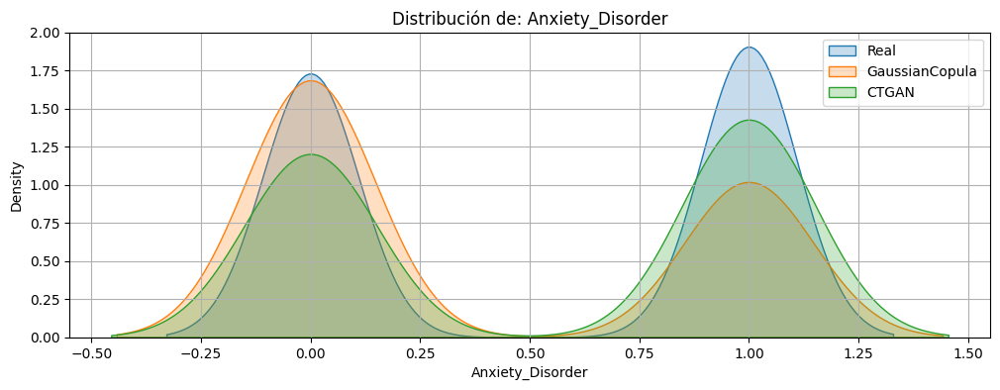

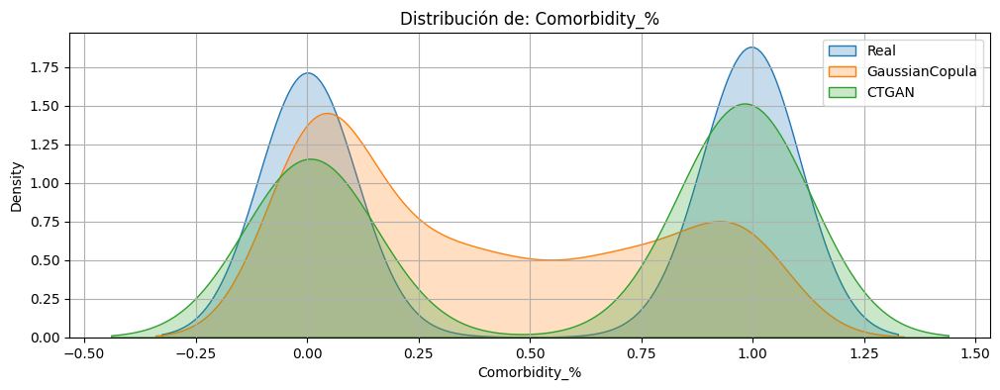

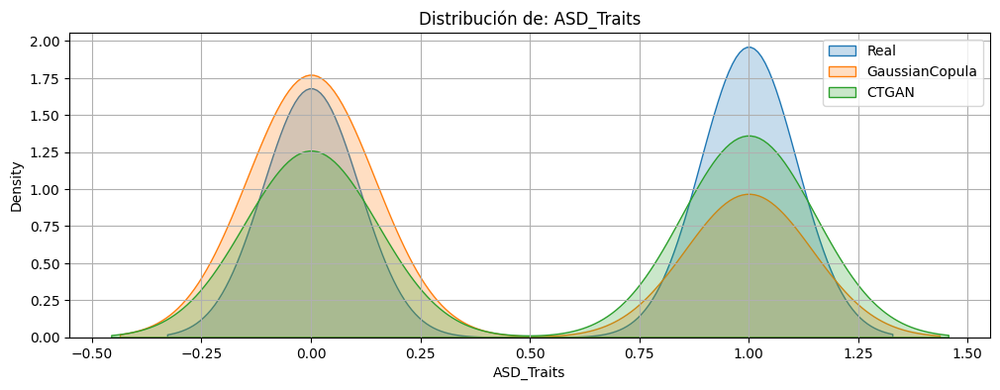

In [ ]:
# === Visualización comparativa ===
cols_to_compare = X_total.columns  # ajusta según tus variables

def comparar_distribuciones(variable):
    plt.figure(figsize=(12, 4))

    # Original
    sns.kdeplot(X_total[variable], label='Real', fill=True)

    # Gaussian
    sns.kdeplot(gc_data[variable], label='GaussianCopula', fill=True)

    # CTGAN
    sns.kdeplot(ctgan_data[variable], label='CTGAN', fill=True)

    plt.title(f'Distribución de: {variable}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Comparar cada variable
for var in cols_to_compare:
    comparar_distribuciones(var)

In [ ]:
gc_data.to_csv("synthetic_data_gaussian.csv", index=False)
ctgan_data.to_csv("synthetic_data_ctgan.csv", index=False)

## Análisis general de las distribuciones sintéticas vs reales

A lo largo de las variables clave (continuas, categóricas y binarias), se observan los siguientes patrones:

- **CTGAN** tiende a reproducir mejor las **distribuciones bimodales o no lineales**, como `ASD_Traits`, `PCA_1`, `Comorbidity_%`, lo cual es esperable al estar basado en **modelos generativos adversariales (GANs)**, que capturan relaciones complejas entre variables.

- **GaussianCopulaSynthesizer**, por otro lado, ofrece un ajuste más **suave y generalizado**, sin sobreajustarse a los picos reales, lo que puede ser útil en casos donde se prioriza **estabilidad y velocidad de entrenamiento**. Sin embargo, **pierde precisión** en distribuciones con modas múltiples o asimetrías marcadas.

- Para variables **binarias** como `A6`, `A7`, `Sex_M`, **ambos modelos muestran buen rendimiento**, aunque CTGAN parece mantener una mayor fidelidad a los picos reales, especialmente cuando hay **desequilibrio entre clases**.

- En variables de **porcentaje** (`Social_Interaction_Issues_%`, `Communication_Issues_%`), ambos modelos presentan **ligeras desviaciones**, pero CTGAN **capta mejor la forma general**, mientras que Gaussian genera una curva más suavizada.

---

## Conclusiones

### 1. ¿Cuál sintetizador se asemeja más al conjunto real?

**CTGAN supera ligeramente a GaussianCopulaSynthesizer** en su capacidad de replicar patrones reales, especialmente en variables con:

- Bimodalidad (`ASD_Traits`, `PCA_1`)
- Valores desequilibrados (`A7`, `Sex_M`)
- Distribuciones sesgadas o con múltiples picos (`Comorbidity_%`, `Qchat_10_Score`)

---

### 2. ¿A qué se debe este mejor rendimiento de CTGAN?

- CTGAN utiliza **redes neuronales y GANs** que **aprenden relaciones no lineales complejas** entre atributos, lo que le permite capturar mejor la **estructura latente** de los datos reales.
- A diferencia de GaussianCopula, que **asume dependencias gaussianas** y transforma los datos a distribuciones normales, **CTGAN puede modelar dependencias arbitrarias y distribuciones irregulares**.

---

### 3. ¿En qué situaciones seguiría siendo útil GaussianCopula?

- Cuando se trabaja con **datasets pequeños o muy balanceados**.
- Cuando se requiere **rapidez de entrenamiento y generación**.
- Para tareas donde la **preservación de la estructura marginal** (de cada variable individual) sea suficiente.

---

### 4. Recomendación final

Para este caso, donde el dataset presenta **distribuciones un tanto complejas y variables mixtas**, **CTGAN es el modelo más adecuado** si se busca una síntesis fiel para tareas posteriores como entrenamiento de modelos.

> Sin embargo, siempre es buena práctica realizar una **validación cuantitativa adicional** (por ejemplo, *Train Synthetic / Test Real - TSTR*) para confirmar que la similitud visual se traduzca en **utilidad predictiva real**.


## PRUEBA Train Synthetic, Test Real

In [ ]:
# Importar modelo SVM
from sklearn.svm import SVC

In [ ]:
# === Gaussian Copula Synthesizer ===
gc_synth = GaussianCopulaSynthesizer(metadata)
gc_synth.fit(X_total)
gc_data = gc_synth.sample(num_rows=1000)

# === CTGAN Synthesizer ===
ctgan_synth = CTGANSynthesizer(metadata)
ctgan_synth.fit(X_total)
ctgan_data = ctgan_synth.sample(num_rows=1000)

/usr/local/lib/python3.11/dist-packages/rdt/transformers/numerical.py:112: UserWarning: No rounding scheme detected for column 'PCA_1'. Data will not be rounded.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/rdt/transformers/numerical.py:112: UserWarning: No rounding scheme detected for column 'Social_Interaction_Issues_%'. Data will not be rounded.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/rdt/transformers/numerical.py:112: UserWarning: No rounding scheme detected for column 'Qchat_10_Score'. Data will not be rounded.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/rdt/transformers/numerical.py:112: UserWarning: No rounding scheme detected for column 'PCA_1'. Data will not be rounded.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/rdt/transformers/numerical.py:112: UserWarning: No rounding scheme detected for column 'Social_Interaction_Issues_%'. Data will not be rounded.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/rdt/transfor

In [ ]:
# Lista de columnas que aceptan decimales
decimal_columns = ['PCA_1', 'Social_Interaction_Issues_%', 'Communication_Issues_%',
                   'Qchat_10_Score', 'Comorbidity_%']

# Función para redondear todo lo demás a 0 o 1
def limpiar_datos_binarios(df):
    df_limpio = df.copy()
    for col in df.columns:
        if col not in decimal_columns:
            df_limpio[col] = df_limpio[col].round().clip(0, 1)
    return df_limpio

# Aplicar limpieza a los conjuntos sintéticos
gc_data = limpiar_datos_binarios(gc_data)
ctgan_data = limpiar_datos_binarios(ctgan_data)

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    accuracy_score, f1_score, roc_auc_score, precision_score,
    recall_score, balanced_accuracy_score, confusion_matrix
)
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

def evaluar_tstr_svm(X_synthetic, nombre_modelo):
    print(f"\n Evaluando {nombre_modelo} con SVM + GridSearchCV...")

    # Separar features y target
    X_train_syn = X_synthetic.drop(columns='ASD_Traits')
    y_train_syn = X_synthetic['ASD_Traits']

    # Definir modelo base
    model = SVC(kernel='rbf', probability=True, random_state=42)

    # Espacio de búsqueda
    param_grid = {
        'C': [0.01, 0.1, 1, 10, 100],
        'gamma': [1e-4, 1e-3, 1e-2, 1e-1]
    }

    # GridSearch
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring='roc_auc',
        cv=5,
        verbose=1,
        n_jobs=-1
    )

    # Entrenar en datos sintéticos
    grid_search.fit(X_train_syn, y_train_syn)

    # Predecir sobre datos reales
    y_pred = grid_search.predict(X_best_test)
    y_proba = grid_search.predict_proba(X_best_test)[:, 1]

    # Calcular métricas
    acc = accuracy_score(y_best_test, y_pred)
    bal_acc = balanced_accuracy_score(y_best_test, y_pred)
    f1 = f1_score(y_best_test, y_pred)
    prec = precision_score(y_best_test, y_pred)
    rec = recall_score(y_best_test, y_pred)
    auc = roc_auc_score(y_best_test, y_proba)
    cm = confusion_matrix(y_best_test, y_pred)

    # Mostrar resultados
    print(f" Resultados TSTR con {nombre_modelo}")
    print(f"- Accuracy:            {acc:.4f}")
    print(f"- Balanced Accuracy:   {bal_acc:.4f}")
    print(f"- Precision:           {prec:.4f}")
    print(f"- Recall:              {rec:.4f}")
    print(f"- F1 Score:            {f1:.4f}")
    print(f"- AUC Score:           {auc:.4f}")

    # Visualizar matriz de confusión
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1], yticklabels=[0, 1])
    plt.title(f"Matriz de confusión - {nombre_modelo}")
    plt.xlabel("Predicho")
    plt.ylabel("Real")
    plt.show()

    return grid_search


🔍 Evaluando GaussianCopulaSynthesizer con SVM + GridSearchCV...
Fitting 5 folds for each of 20 candidates, totalling 100 fits
📊 Resultados TSTR con GaussianCopulaSynthesizer
- Accuracy:            0.7023
- Balanced Accuracy:   0.7241
- Precision:           1.0000
- Recall:              0.4481
- F1 Score:            0.6189
- AUC Score:           0.9055


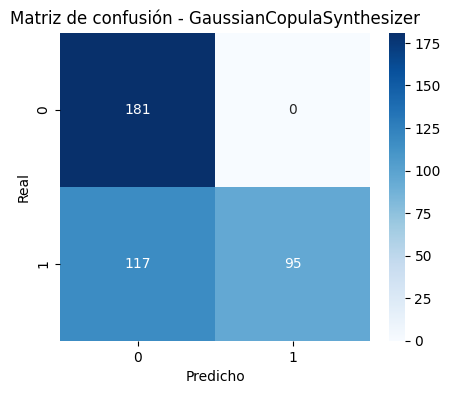


🔍 Evaluando CTGANSynthesizer con SVM + GridSearchCV...
Fitting 5 folds for each of 20 candidates, totalling 100 fits
📊 Resultados TSTR con CTGANSynthesizer
- Accuracy:            0.6412
- Balanced Accuracy:   0.6416
- Precision:           0.6784
- Recall:              0.6368
- F1 Score:            0.6569
- AUC Score:           0.8364


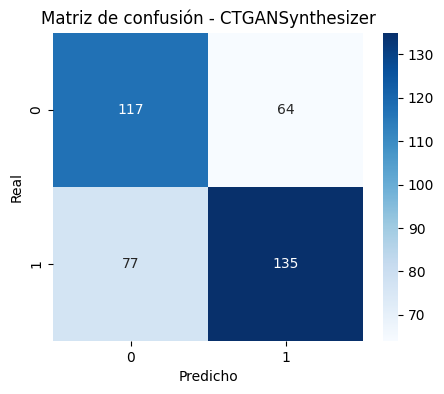

In [ ]:
# Ejecutar validación TSTR para ambos modelos sintéticos
modelo_gc = evaluar_tstr_svm(gc_data, "GaussianCopulaSynthesizer")
modelo_ctgan = evaluar_tstr_svm(ctgan_data, "CTGANSynthesizer")

## Interpretación

### GaussianCopulaSynthesizer:
- **Altísima precisión (1.00)** pero **recall muy bajo (0.43)** → el modelo **detecta bien los negativos**, pero **falla mucho en detectar positivos** (alta cantidad de falsos negativos).
- Esto se confirma en la **matriz de confusión**: muchos `1 reales` son predichos como `0` (117 FN).
- **AUC alto (0.9055)** gracias a una buena capacidad de separación general, pero **sufre en el equilibrio de clases**.

### CTGANSynthesizer:
- Más **equilibrado** entre `precision` y `recall` (ambos ~0.65).
- Aunque tiene **menor accuracy general (0.6412)**, su **F1 Score es más alto** que el de Gaussian (0.6569 vs 0.6189), lo que indica **mejor rendimiento en detección de positivos**.
- **Balanced accuracy más estable**, mostrando que **maneja mejor el desbalance entre clases**.

---

## Conclusión final (TSTR)

- **CTGAN es más útil si te importa capturar correctamente los casos positivos**, como en diagnósticos, alertas tempranas o sistemas de riesgo, ya que ofrece **mejor `recall` y `F1 Score`**.
- **GaussianCopula** puede ser preferible en tareas donde se desea **minimizar falsos positivos**, pero **sacrifica sensibilidad**, lo cual puede ser crítico en contextos médicos o sociales.

> En contextos donde el costo de no detectar un caso positivo es alto (como salud o educación especial), se prioriza **`recall` + `F1` balanceados**, por lo tanto:
### **CTGAN es la mejor opción general** en este caso.


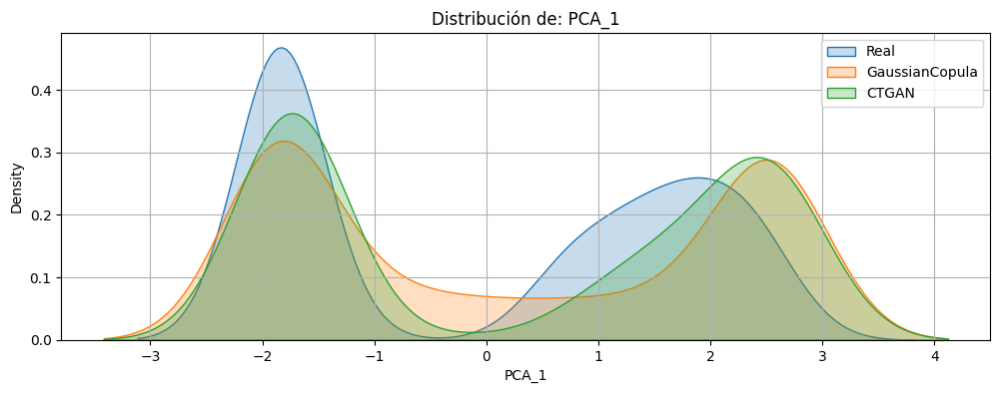

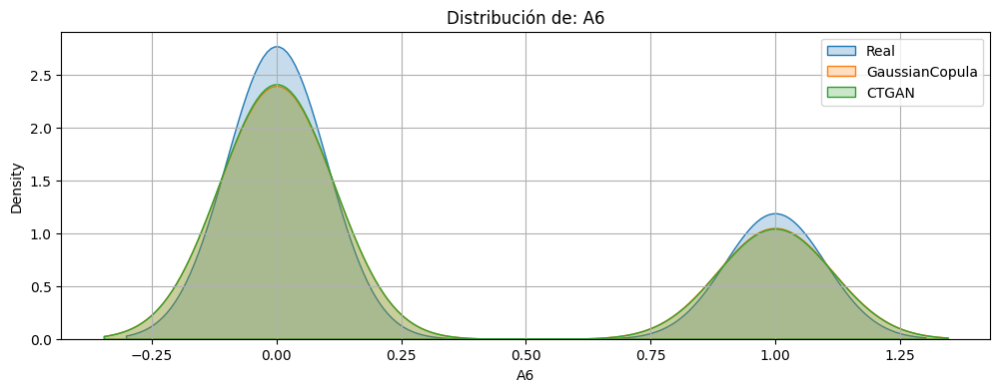

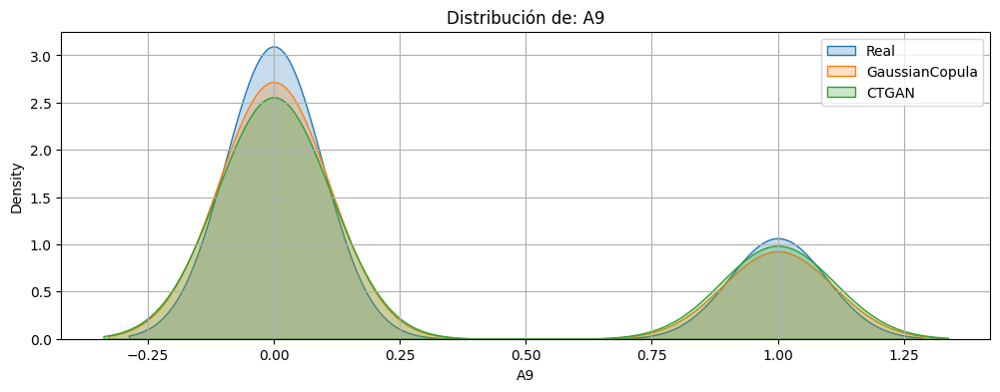

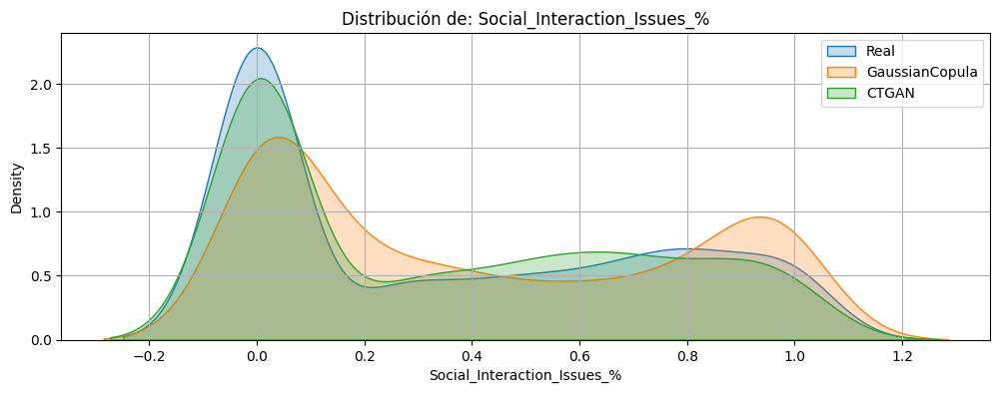

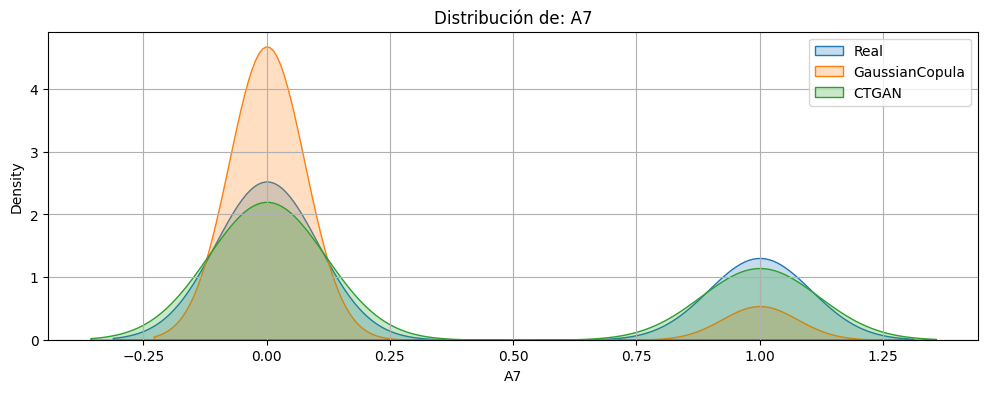

...

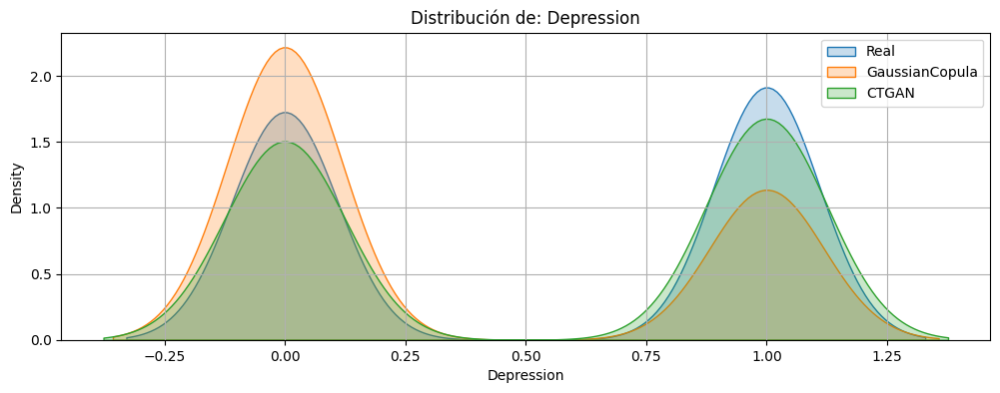

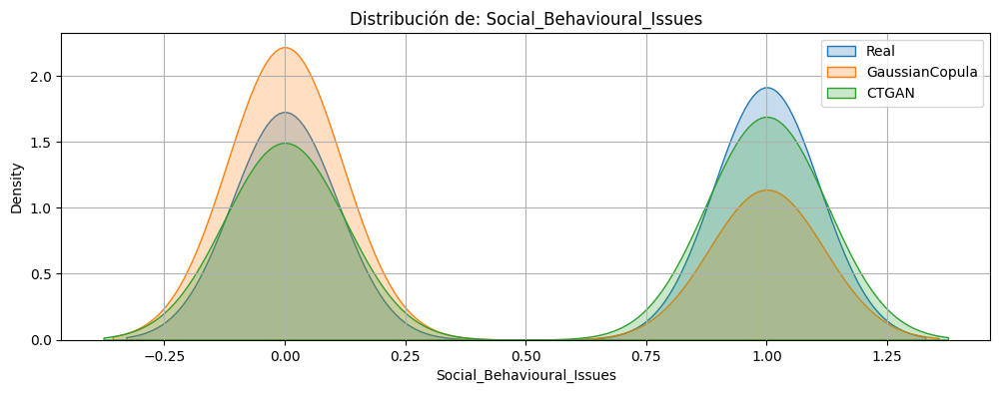

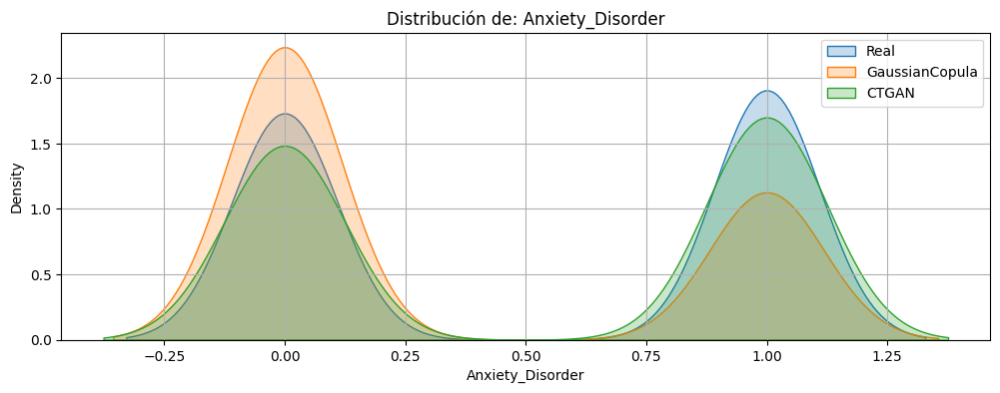

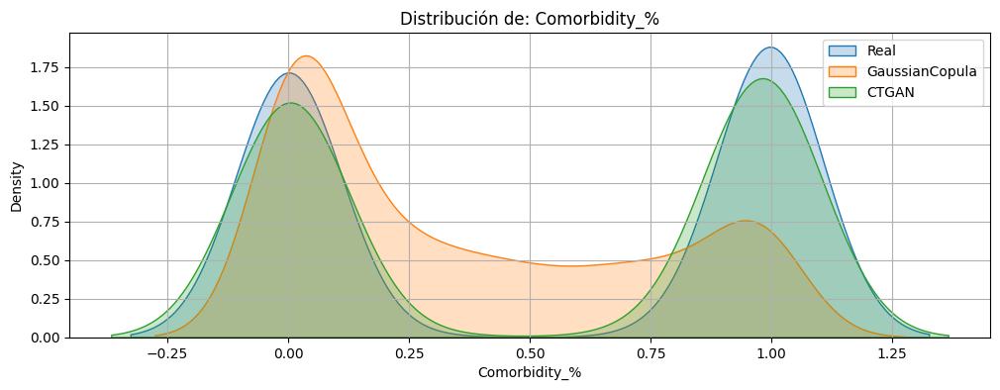

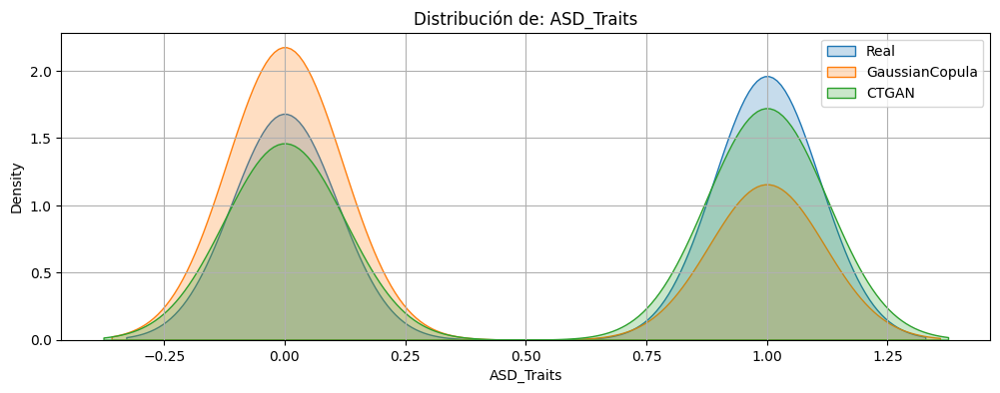

In [ ]:
# === Visualización comparativa ===
cols_to_compare = X_total.columns  # ajusta según tus variables

def comparar_distribuciones(variable):
    plt.figure(figsize=(12, 4))

    # Original
    sns.kdeplot(X_total[variable], label='Real', fill=True)

    # Gaussian
    sns.kdeplot(gc_data[variable], label='GaussianCopula', fill=True)

    # CTGAN
    sns.kdeplot(ctgan_data[variable], label='CTGAN', fill=True)

    plt.title(f'Distribución de: {variable}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Comparar cada variable
for var in cols_to_compare:
    comparar_distribuciones(var)

# MODELO DEEP LEARNING

## 1. ANÁLISIS EXPLORATORIO DE DATOS (2DO DATASET)

### 1.1. Evaluación del supuesto de completitud de la información

In [289]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [290]:
from google.colab import drive
drive.mount('/content/drive')
df2 = pd.read_csv('/content/drive/MyDrive/DL_UPAO/Proyecto/Autism_Screening_Data_Combined.csv')
df2.head(20)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10,Age,Sex,Jauundice,Family_ASD,Class
0,1,1,0,1,0,0,1,1,0,0,15,m,no,no,NO
1,0,1,1,1,0,1,1,0,1,0,15,m,no,no,NO
2,1,1,1,0,1,1,1,1,1,1,15,f,no,yes,YES
3,1,1,1,1,1,1,1,1,0,0,16,f,no,no,YES
4,1,1,1,1,1,1,1,1,1,1,15,f,no,no,YES
5,0,1,1,1,0,1,1,0,1,0,14,m,no,no,NO
6,1,0,0,0,1,0,0,1,0,1,14,f,no,no,NO
7,1,0,0,0,1,0,0,1,0,1,12,m,no,no,NO
8,1,0,0,0,1,0,0,1,0,1,15,f,no,no,NO
9,0,1,1,1,0,1,1,0,1,0,12,f,no,no,NO


In [291]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6075 entries, 0 to 6074
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   A1          6075 non-null   int64 
 1   A2          6075 non-null   int64 
 2   A3          6075 non-null   int64 
 3   A4          6075 non-null   int64 
 4   A5          6075 non-null   int64 
 5   A6          6075 non-null   int64 
 6   A7          6075 non-null   int64 
 7   A8          6075 non-null   int64 
 8   A9          6075 non-null   int64 
 9   A10         6075 non-null   int64 
 10  Age         6075 non-null   int64 
 11  Sex         6075 non-null   object
 12  Jauundice   6075 non-null   object
 13  Family_ASD  6075 non-null   object
 14  Class       6075 non-null   object
dtypes: int64(11), object(4)
memory usage: 712.0+ KB


In [292]:
# Filas y columnas del dataframe
df2.shape

(6075, 15)

In [293]:
df2.columns

Index(['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10', 'Age',
       'Sex', 'Jauundice', 'Family_ASD', 'Class'],
      dtype='object')

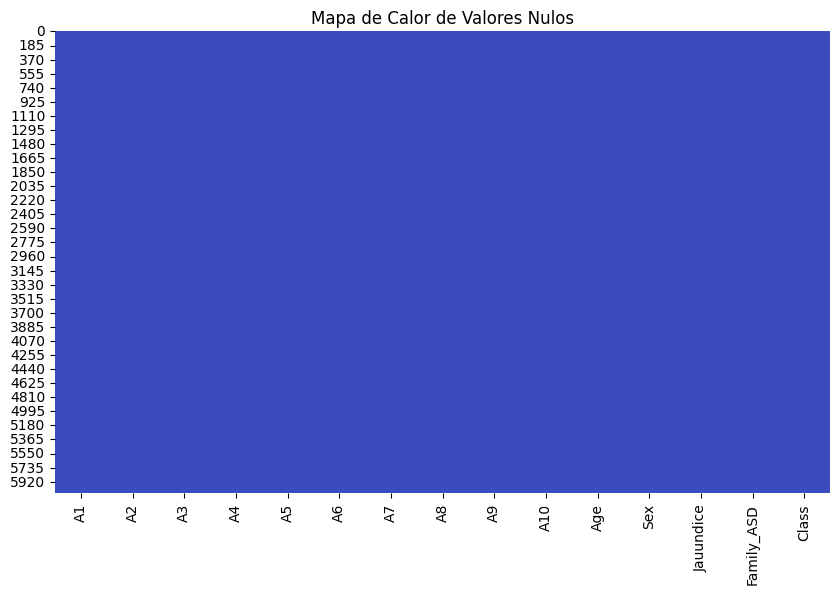

In [294]:
# Crear el mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(df2.isnull(),
            cmap='coolwarm',
            cbar=False,)

plt.title('Mapa de Calor de Valores Nulos')
plt.show()

In [295]:
#Suma de valores nulos
df2.isnull().sum()

,0
A1,0
A2,0
A3,0
A4,0
A5,0
A6,0
A7,0
A8,0
A9,0
A10,0


In [296]:
#Porcentaje de valores nulos
df2.isnull().sum()/df2.shape[0]*100

,0
A1,0.0
A2,0.0
A3,0.0
A4,0.0
A5,0.0
A6,0.0
A7,0.0
A8,0.0
A9,0.0
A10,0.0


In [297]:
df2.nunique()

,0
A1,2
A2,2
A3,2
A4,2
A5,2
A6,2
A7,2
A8,2
A9,2
A10,2


In [298]:
duplicados = df2.duplicated().sum()
print(f"Total de registros duplicados: {duplicados}")


Total de registros duplicados: 847


Observamos que tiene mucha cantidad de valores duplicados

### 1.2. Tratamiento y Limpieza de datos

Eliminamos los duplicados

In [299]:
df2.drop_duplicates(inplace=True)
duplicados = df2.duplicated().sum()
print(f"Total de registros duplicados: {duplicados}")

Total de registros duplicados: 0


Renombramos las columnas para que estén en un mismo formato ambos datasets.

In [300]:
df2.columns

Index(['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10', 'Age',
       'Sex', 'Jauundice', 'Family_ASD', 'Class'],
      dtype='object')

In [301]:
df2.rename(columns={
    'A10': 'A10_Autism_Spectrum_Quotient',
    'Age': 'Age_Years',
    'Jauundice': 'Jaundice',
    'Family_ASD': 'Family_Mem_With_Asd',
    'Class': 'Asd_Traits'
}, inplace=True)

df2.columns

Index(['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9',
       'A10_Autism_Spectrum_Quotient', 'Age_Years', 'Sex', 'Jaundice',
       'Family_Mem_With_Asd', 'Asd_Traits'],
      dtype='object')

Renombramos las categorías de las variables cualitativas para que coincidan ambos datasets

In [302]:
# Corregir valores de la columna 'Sex'
df2['Sex'] = df2['Sex'].str.upper()

# Corregir 'no' y 'yes' a 'No' y 'Yes' en las demás columnas
columns_to_fix = ['Jaundice', 'Family_Mem_With_Asd', 'Asd_Traits']
for col in columns_to_fix:
    df2[col] = df2[col].str.capitalize()
df2

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,Age_Years,Sex,Jaundice,Family_Mem_With_Asd,Asd_Traits
0,1,1,0,1,0,0,1,1,0,0,15,M,No,No,No
1,0,1,1,1,0,1,1,0,1,0,15,M,No,No,No
2,1,1,1,0,1,1,1,1,1,1,15,F,No,Yes,Yes
3,1,1,1,1,1,1,1,1,0,0,16,F,No,No,Yes
4,1,1,1,1,1,1,1,1,1,1,15,F,No,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6070,0,0,0,0,0,0,0,0,0,1,2,F,No,Yes,No
6071,0,0,1,1,1,0,1,0,1,0,1,M,Yes,No,No
6072,1,0,1,1,1,1,1,1,1,1,2,M,Yes,No,No
6073,1,0,0,0,0,0,0,1,0,1,2,M,No,Yes,No


Creamos la variable Qchat_10_Score, puesto que es de las más importantes para la predicción, su fórmula es la suma de A1 - A10.

In [303]:
# Calcular la suma de A1 a A10 para cada fila
df2['Qchat_10_Score'] = df2[['A1','A2','A3','A4','A5','A6','A7','A8','A9','A10_Autism_Spectrum_Quotient']].sum(axis=1)  # sum(axis=1) => Suma todas las filas   sum(axis=0) => Suma todas las columnas
# Extraer columnas
cols = df2.columns.tolist()

# Mover 'Qchat_10_Score' después de 'A10_Autism_Spectrum_Quotient'
cols.remove('Qchat_10_Score')
insert_pos = cols.index('A10_Autism_Spectrum_Quotient') + 1
cols.insert(insert_pos, 'Qchat_10_Score')

# Reordenar el DataFrame
df2 = df2[cols]
df2

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,Qchat_10_Score,Age_Years,Sex,Jaundice,Family_Mem_With_Asd,Asd_Traits
0,1,1,0,1,0,0,1,1,0,0,5,15,M,No,No,No
1,0,1,1,1,0,1,1,0,1,0,6,15,M,No,No,No
2,1,1,1,0,1,1,1,1,1,1,9,15,F,No,Yes,Yes
3,1,1,1,1,1,1,1,1,0,0,8,16,F,No,No,Yes
4,1,1,1,1,1,1,1,1,1,1,10,15,F,No,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6070,0,0,0,0,0,0,0,0,0,1,1,2,F,No,Yes,No
6071,0,0,1,1,1,0,1,0,1,0,5,1,M,Yes,No,No
6072,1,0,1,1,1,1,1,1,1,1,9,2,M,Yes,No,No
6073,1,0,0,0,0,0,0,1,0,1,3,2,M,No,Yes,No


### 1.3. Resumen global del total de variables de estudio

Definimos nuestra variable target, en este caso la variable que nos determina si el niño tiene o no autismo

In [306]:
target = 'Asd_Traits'

In [307]:
df2[target].value_counts()

,count
Asd_Traits,
No,3686
Yes,1542


#### 1.3.1. Variables cuantitativas

In [308]:
df2.describe()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,Qchat_10_Score,Age_Years
count,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000
mean,0.691469,0.481637,0.540360,0.551262,0.541316,0.431331,0.494262,0.530031,0.421959,0.593344,5.276970,20.793037
std,0.461931,0.499710,0.498416,0.497413,0.498338,0.495310,0.500015,0.499145,0.493919,0.491257,2.455689,15.082187
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,7.000000
50%,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,5.000000,20.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000,31.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,10.000000,80.000000


In [309]:
# Creamos una lista con nuestras variables cuantitativas
lista_cuantitativas = list(df2.describe().columns)
lista_cuantitativas

['A1',
 'A2',
 'A3',
 'A4',
 'A5',
 'A6',
 'A7',
 'A8',
 'A9',
 'A10_Autism_Spectrum_Quotient',
 'Qchat_10_Score',
 'Age_Years']

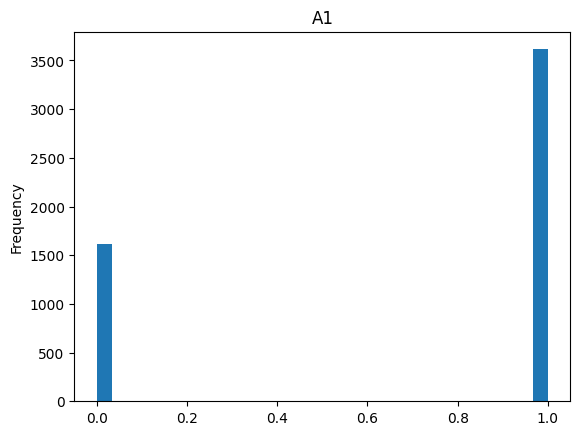

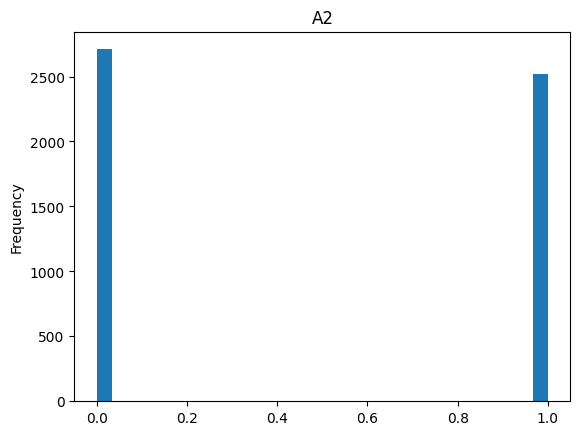

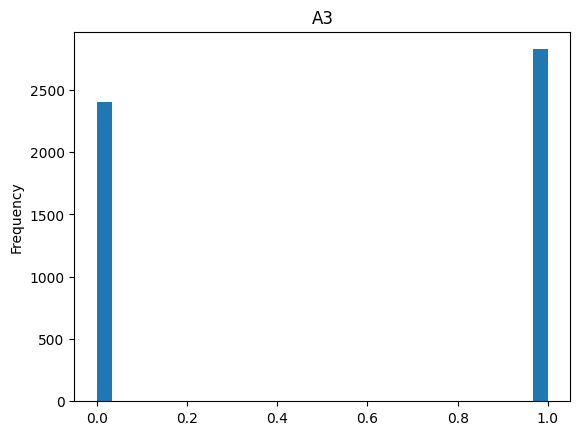

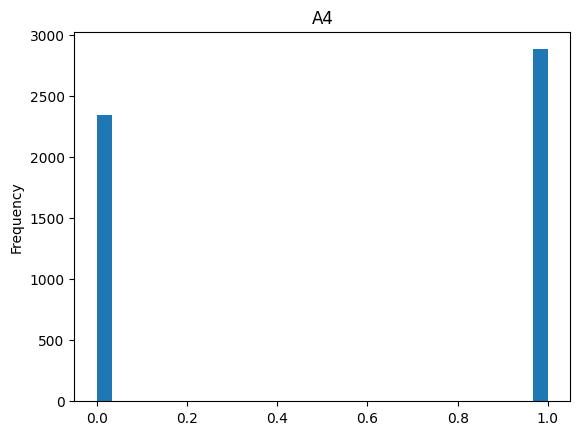

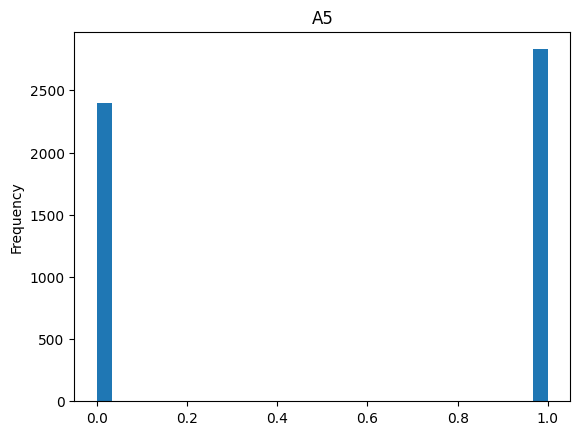

...

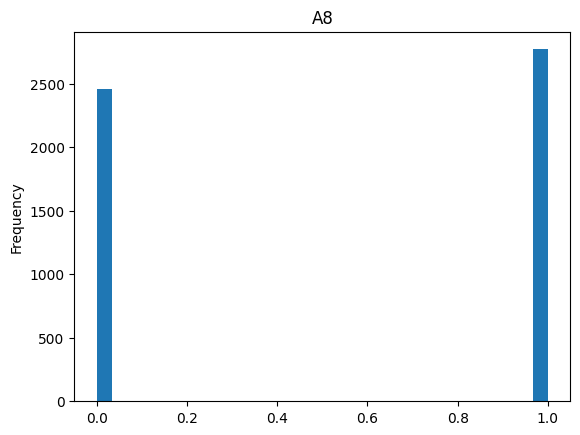

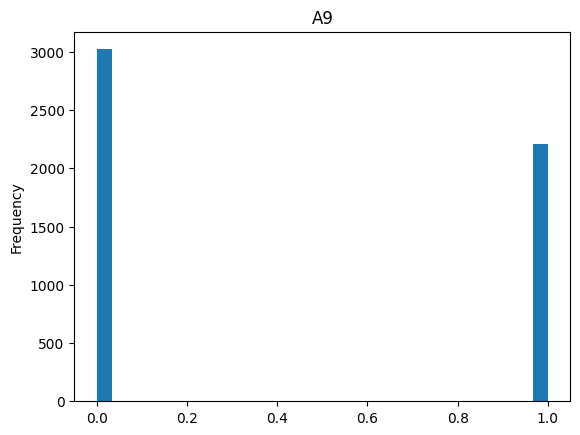

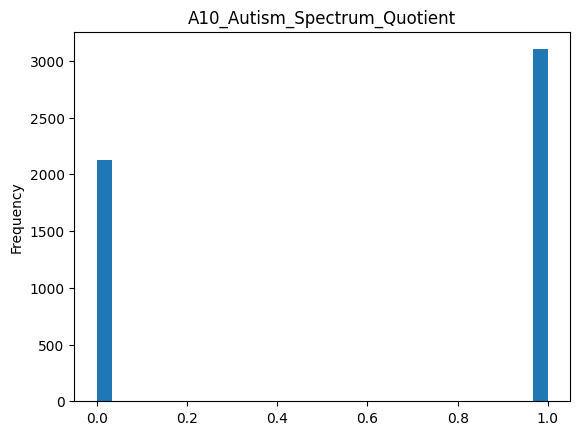

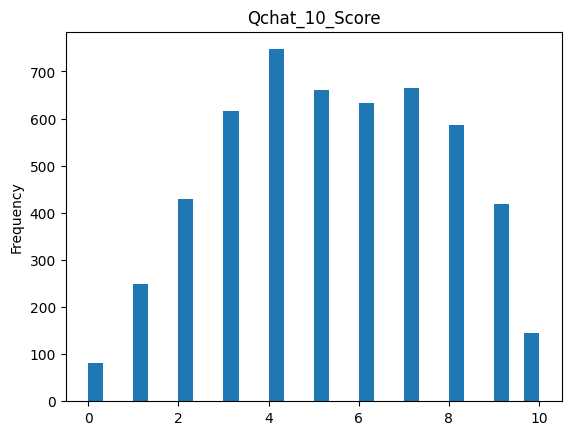

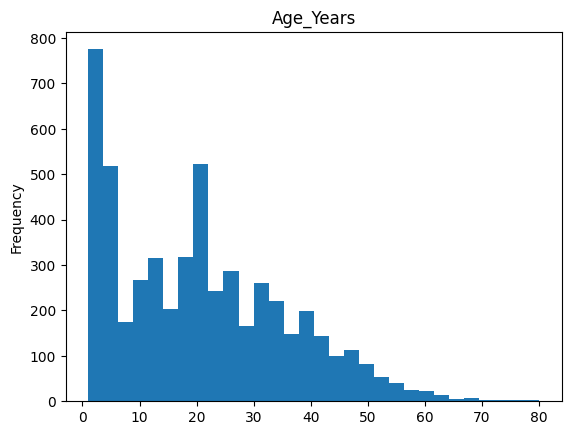

In [310]:
# realizamos histogramas para revisar la distribución de cada variable cuantitativa
for var in lista_cuantitativas:
    df2[var].plot(kind='hist', title=var, bins=30)  #bins => cuantas barras como maximo se pueden ver
    plt.show()

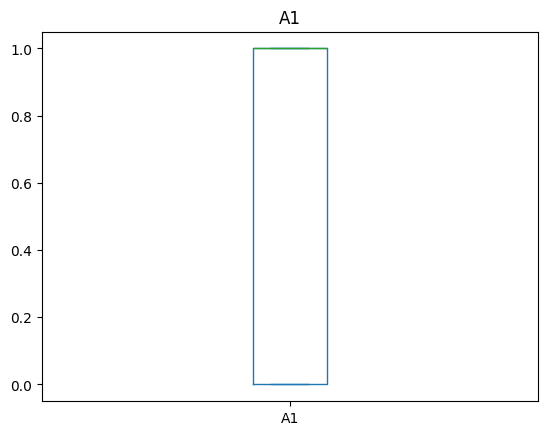

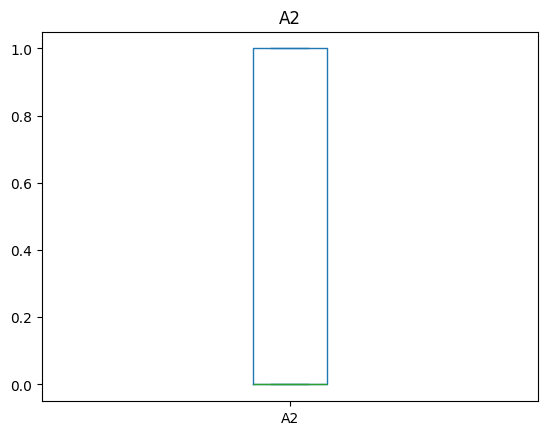

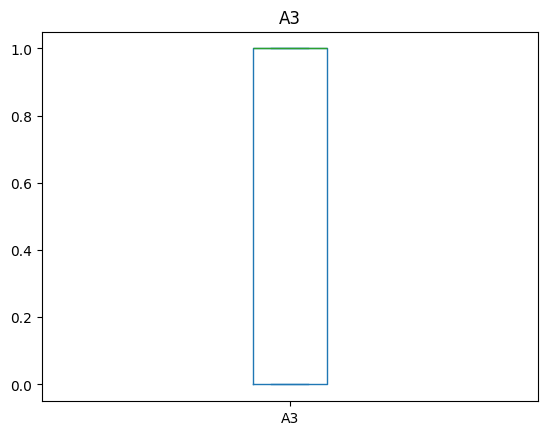

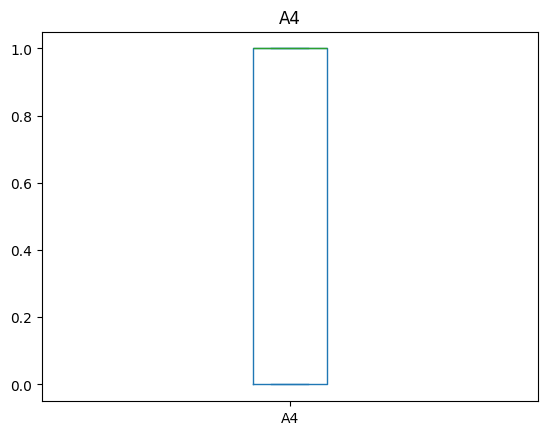

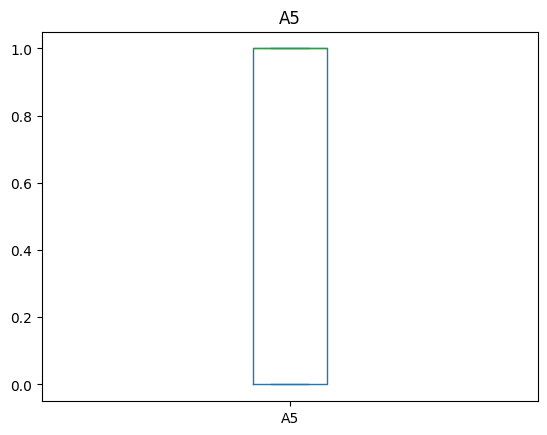

...

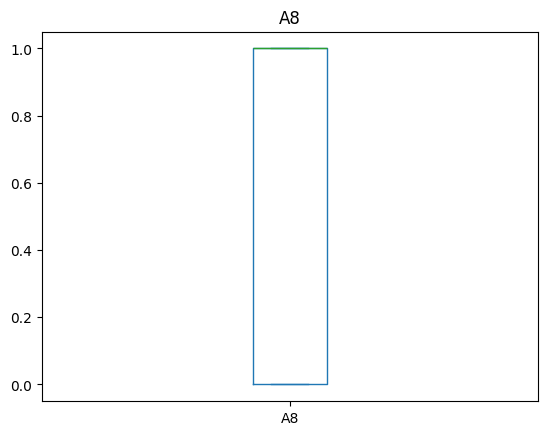

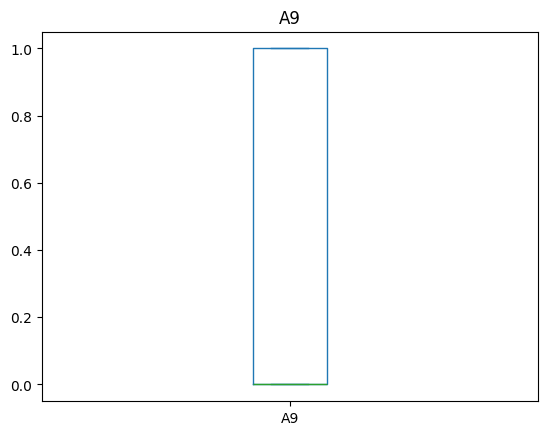

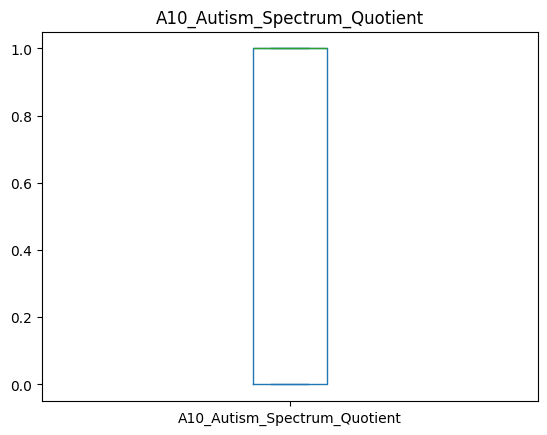

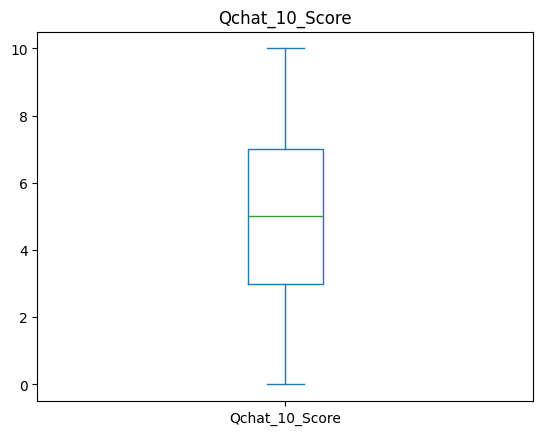

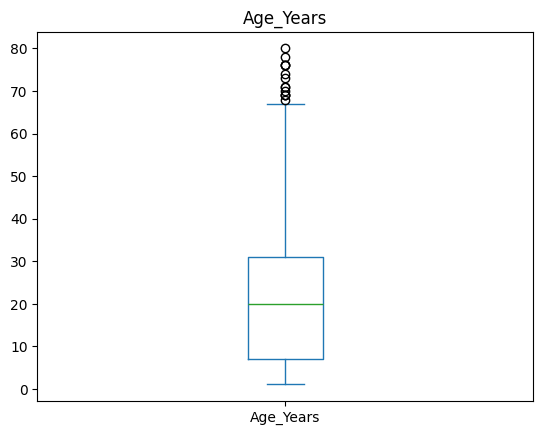

In [311]:
# realizamos diagramas de cajas para revisar la distribución de cada variable cuantitativa
for var in lista_cuantitativas:
    df2[var].plot(kind='box', title=var)
    plt.show()

A continuación compararemos los histogramas separando al grupo de niños diagnosticados con TEA con el de los niños con desarrollo típico:

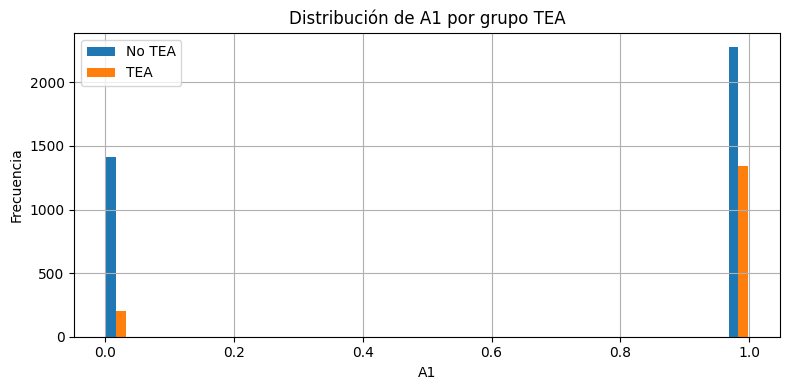

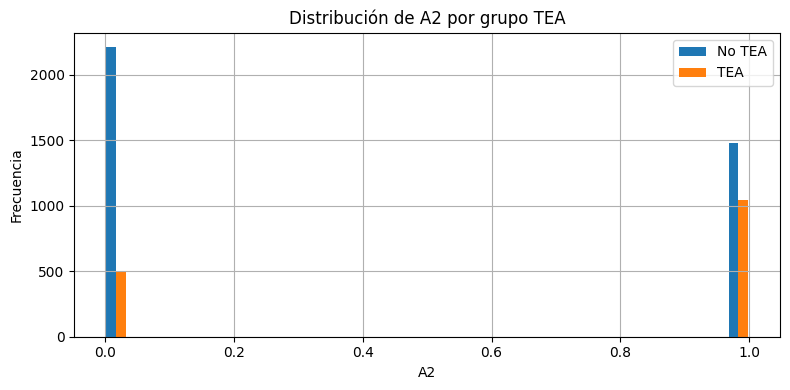

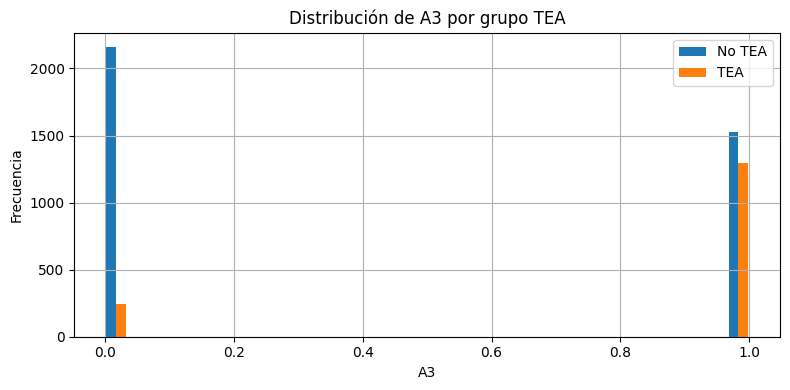

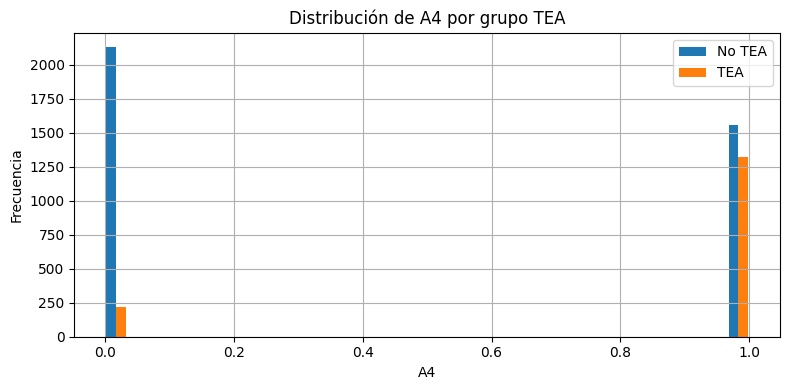

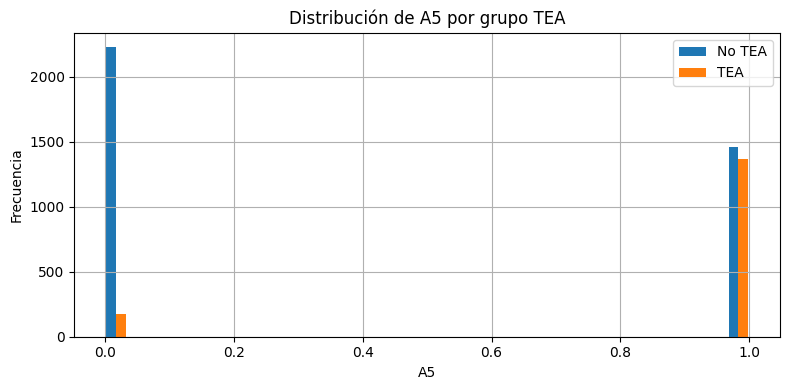

...

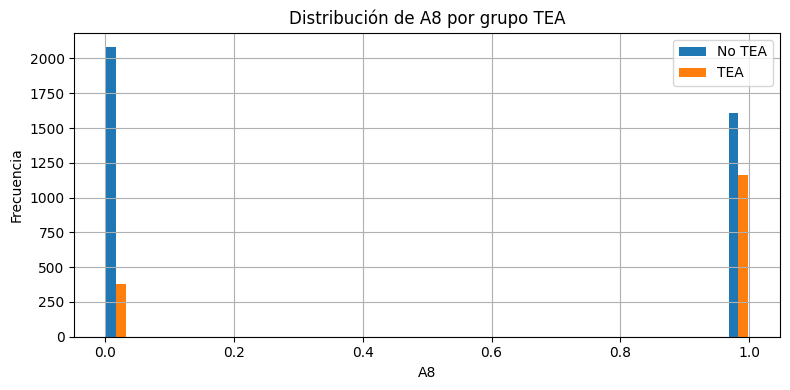

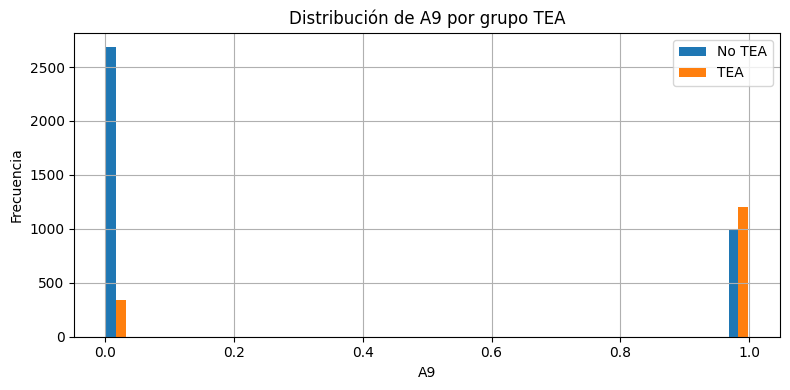

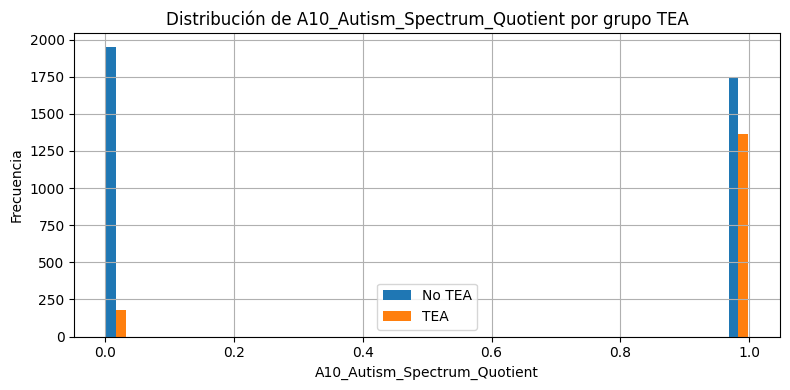

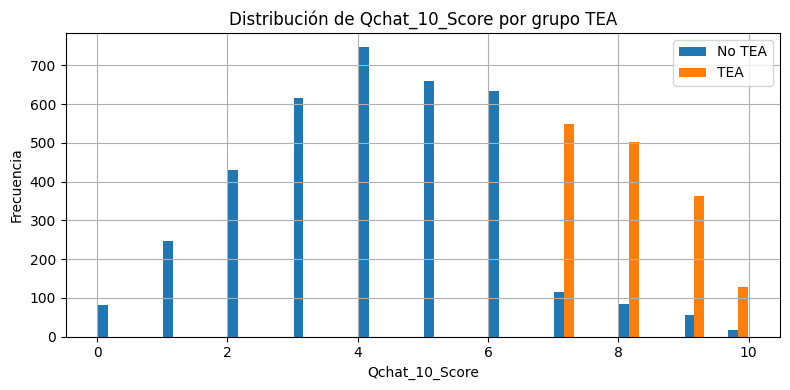

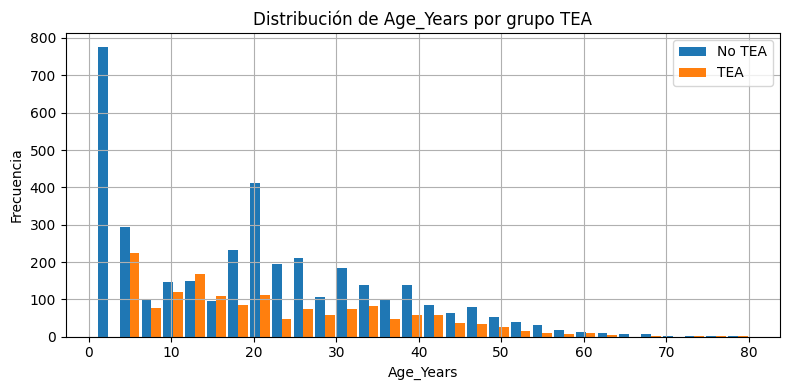

In [312]:
for var in lista_cuantitativas:
    plt.figure(figsize=(8, 4))

    # Valores para cada grupo
    valores_tea = df2[df2[target] == "Yes"][var]
    valores_no_tea = df2[df2[target] == "No"][var]

    # Histograma lado a lado
    plt.hist([valores_no_tea, valores_tea], bins=30, label=['No TEA', 'TEA'], align='mid', rwidth=0.9)
    plt.title(f'Distribución de {var} por grupo TEA')
    plt.xlabel(var)
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Podemos ver una clara diferencia entre los valores de los grupos de niños con TEA y sin TEA, en donde en los valores más altos relacionados a un diagnóstico potencial prevalece notoriamente el grupo de los que tienen TEA, y en los valores más bajos el grupo de los que no.

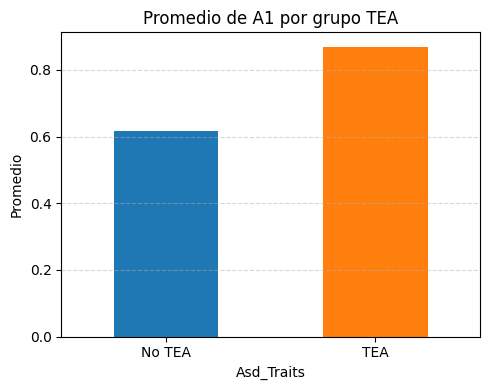

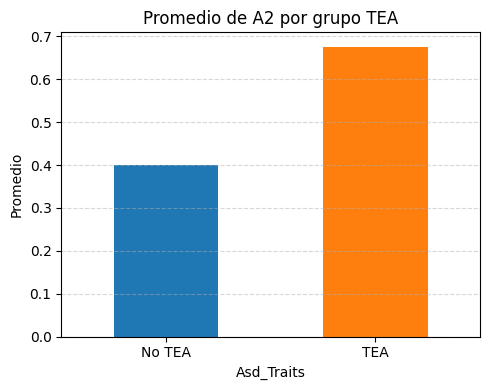

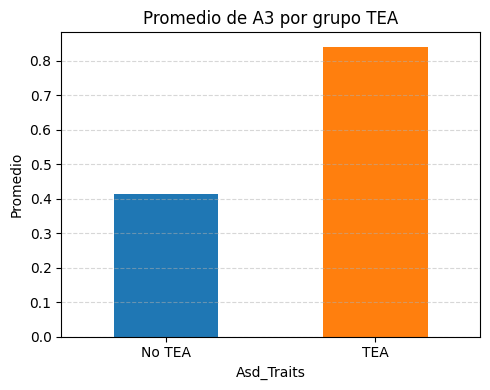

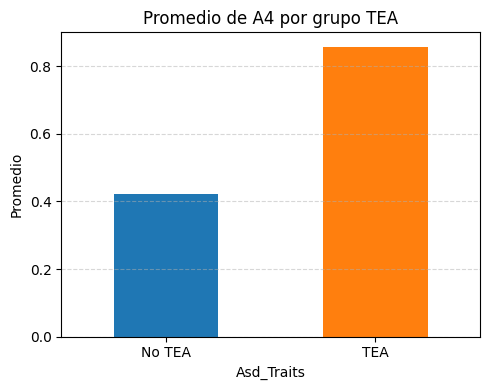

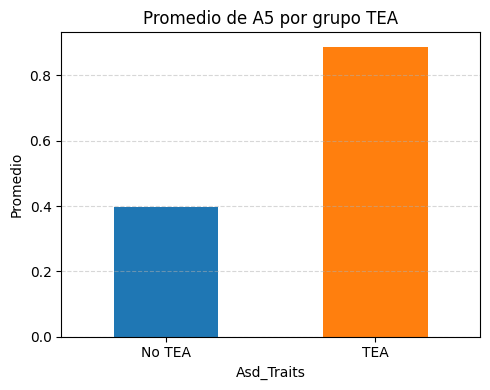

...

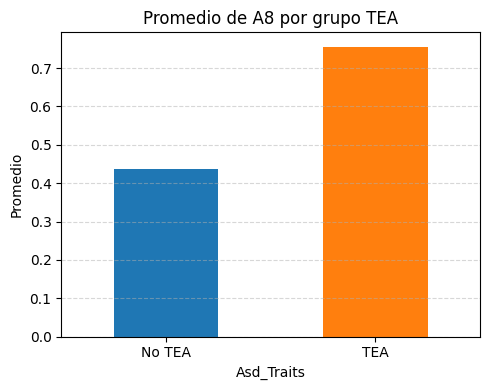

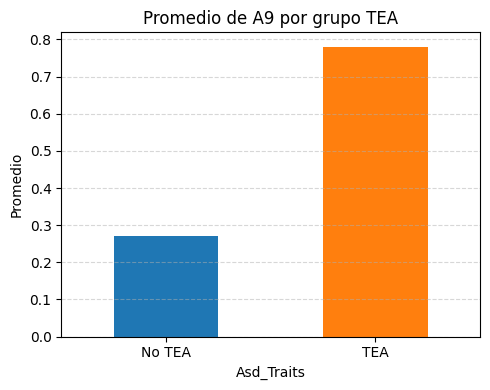

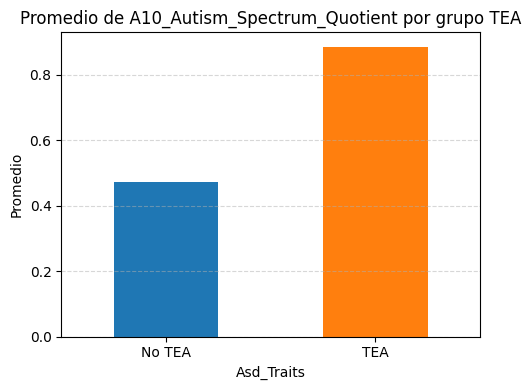

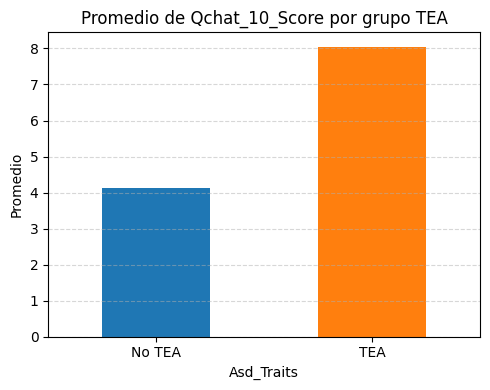

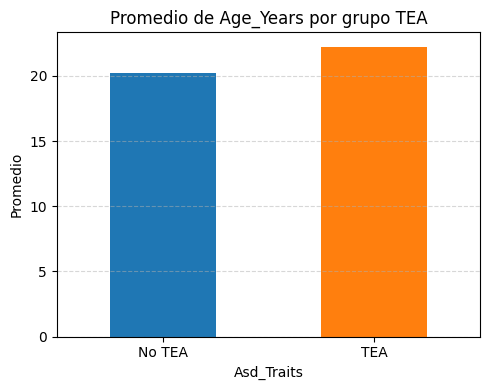

In [313]:
for var in lista_cuantitativas:
    # Calcular promedios por grupo
    promedios = df2.groupby(target)[var].mean()

    # Crear gráfico
    plt.figure(figsize=(5, 4))
    promedios.plot(kind='bar', color=['#1f77b4', '#ff7f0e'])  # azul / naranja
    plt.title(f'Promedio de {var} por grupo TEA')
    plt.xticks([0, 1], ['No TEA', 'TEA'], rotation=0)
    plt.ylabel('Promedio')
    plt.xlabel(target)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout() #organiza el contenido del grafico
    plt.show()

Reafirmamos las conclusiones de los gráficos anteriores, los valores más altos son una característica frecuente en el grupo de los niños autistas.

#### 1.3.2. Variables cualitativas

In [314]:
df2.describe(include = 'object')

,Sex,Jaundice,Family_Mem_With_Asd,Asd_Traits
count,5228,5228,5228,5228
unique,2,2,2,2
top,M,No,No,No
freq,2996,4268,4184,3686


In [315]:
# Creamos una lista con nuestras variables cualitativas
lista_cualitativas = df2.drop(columns = lista_cuantitativas).columns
# Suponiendo que la variable objetivo para el análisis
lista_cualitativas = list(lista_cualitativas.drop(target))
lista_cualitativas

['Sex', 'Jaundice', 'Family_Mem_With_Asd']

A continuación, vemos que categorías contiene cada variable cualitativa

In [316]:
# Recorremos las columnas especificadas manualmente en la lista
for col in lista_cualitativas:
    print(f"\n {col} → {df2[col].nunique()} categorías únicas:")
    print(df2[col].unique())


 Sex → 2 categorías únicas:
['M' 'F']

 Jaundice → 2 categorías únicas:
['No' 'Yes']

 Family_Mem_With_Asd → 2 categorías únicas:
['No' 'Yes']


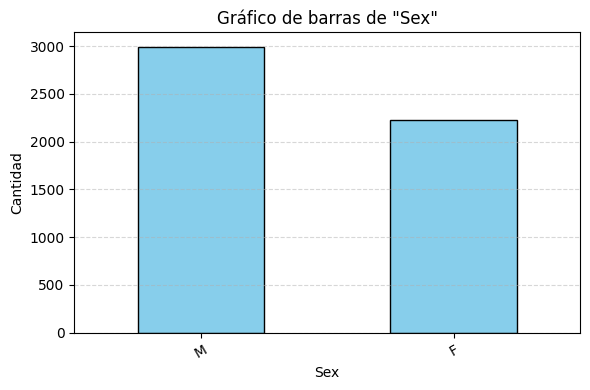

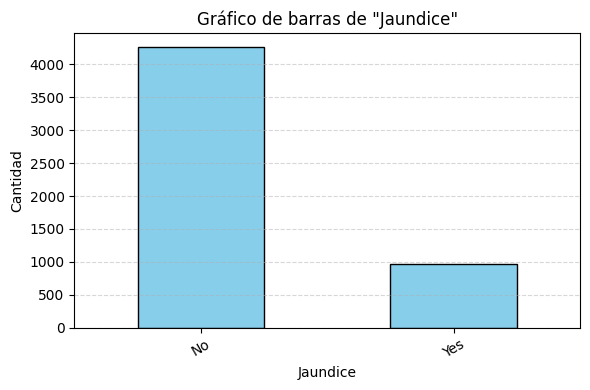

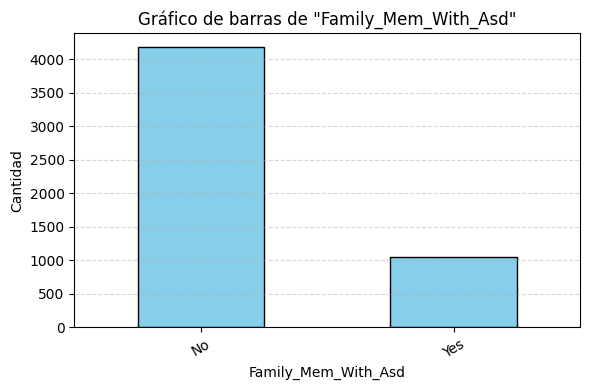

In [317]:
for var in lista_cualitativas:
    plt.figure(figsize=(6, 4))
    df2[var].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Gráfico de barras de "{var}"')
    plt.xlabel(var)
    plt.ylabel('Cantidad')
    plt.xticks(rotation=30)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

A continuación veremos el porcentaje de cada categoría según cada variable en gráficos de pastel

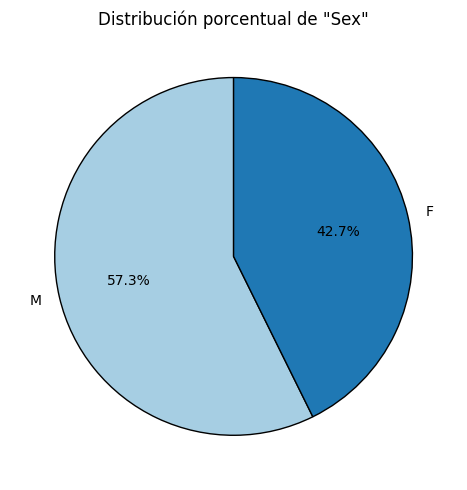

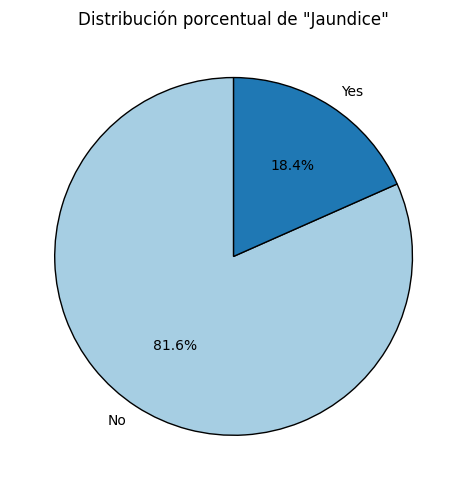

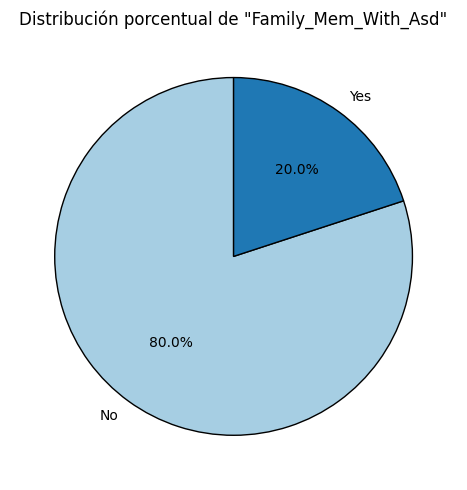

In [318]:
for var in lista_cualitativas:
    plt.figure(figsize=(5, 5))
    df2[var].value_counts(normalize=True).plot(
        kind='pie',
        autopct='%1.1f%%',
        startangle=90,
        colors=plt.cm.Paired.colors,
        wedgeprops={'edgecolor': 'black'}
    )
    plt.title(f'Distribución porcentual de "{var}"')
    plt.ylabel('')  # Oculta el label lateral "value"
    plt.tight_layout()
    plt.show()

Podemos notar que algunas variables cualitativas tienen categorías con porcentajes muy similares, por lo que ahora analizaremos según los grupos de niños con y sin TEA.

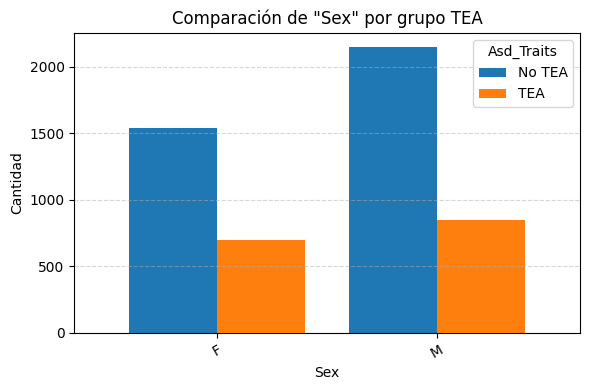

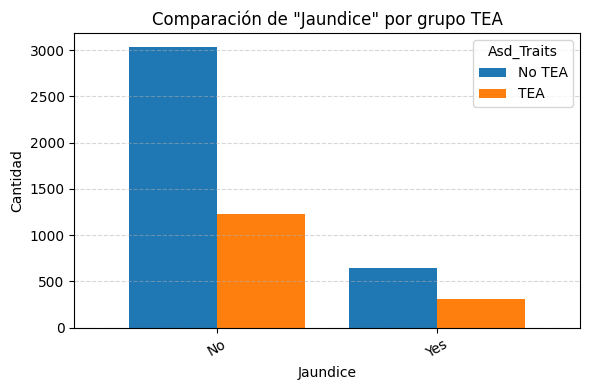

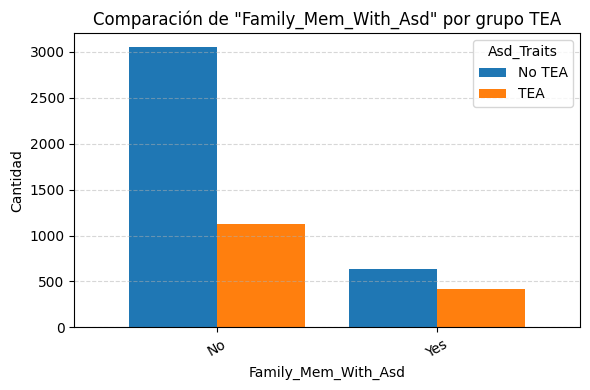

In [319]:
for var in lista_cualitativas:
    # Obtener conteos por categoría y grupo TEA
    conteos = df2.groupby([target, var]).size().unstack().T #Reorganizamos .unstack() y trasponemos .T

    # Crear gráfico de barras agrupadas
    conteos.plot(kind='bar', figsize=(6, 4), width=0.8)

    plt.title(f'Comparación de "{var}" por grupo TEA')
    plt.xlabel(var)
    plt.ylabel('Cantidad')
    plt.xticks(rotation=30)
    plt.legend(title=target, labels=['No TEA', 'TEA'])
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

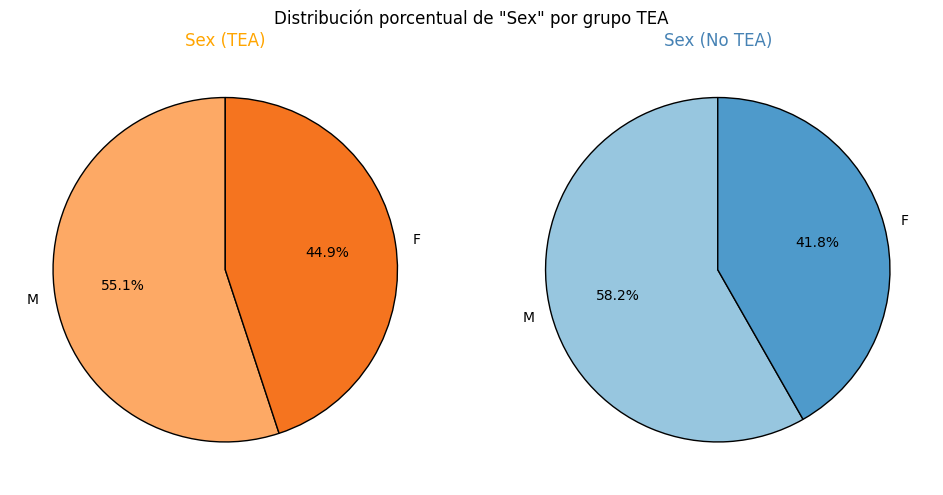

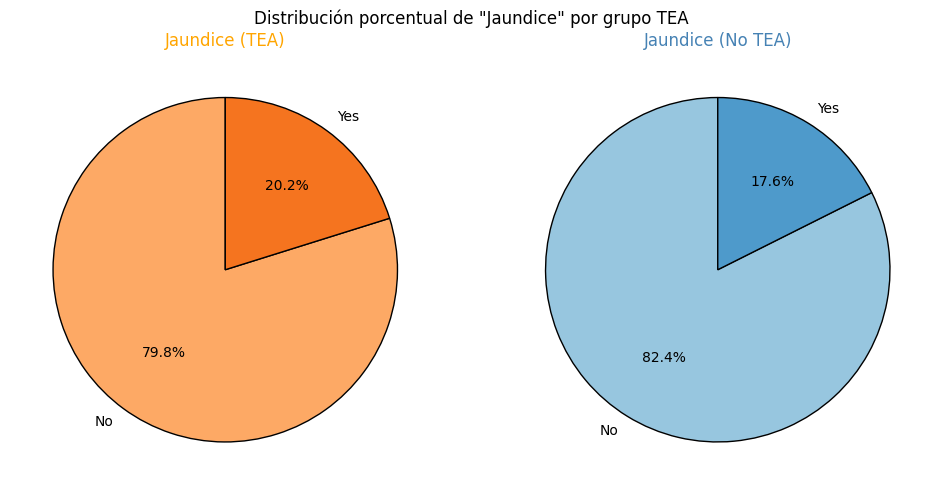

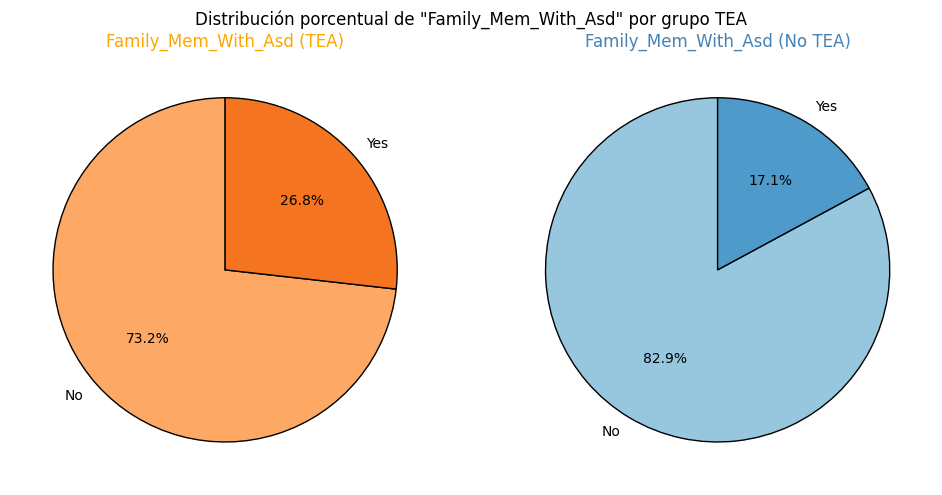

In [320]:
for var in lista_cualitativas:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # NARANJA -  Colores para TEA  //  normalize=True  => Convertir a porcentaje
    values_tea = df2[df2[target] == "Yes"][var].value_counts(normalize=True)
    colors_tea = plt.cm.Oranges(range(100, 100 + len(values_tea) * 50, 50))  # tono medio a fuerte

    # AZUL - Colores para No TEA
    values_no_tea = df2[df2[target] == "No"][var].value_counts(normalize=True)
    colors_no_tea = plt.cm.Blues(range(100, 100 + len(values_no_tea) * 50, 50))

    # Gráfico TEA
    values_tea.plot(
        kind='pie',
        autopct='%1.1f%%',
        startangle=90,
        colors=colors_tea,
        wedgeprops={'edgecolor': 'black'}, #bordes de la porcion del pastel
        ax=axes[0]
    )
    axes[0].set_title(f'{var} (TEA)', color='orange')
    axes[0].set_ylabel('')

    # Gráfico No TEA
    values_no_tea.plot(
        kind='pie',
        autopct='%1.1f%%',
        startangle=90,
        colors=colors_no_tea,
        wedgeprops={'edgecolor': 'black'},
        ax=axes[1]
    )
    axes[1].set_title(f'{var} (No TEA)', color='steelblue')
    axes[1].set_ylabel('')

    # Título general
    plt.suptitle(f'Distribución porcentual de "{var}" por grupo TEA', fontsize=12)
    plt.tight_layout()
    plt.show()

No existe una gran diferencia en la distribución de valores de cada categoría entre los 2 grupos estudiados.

### 1.4. Análisis de correlación y asociación

#### 1.4.1. Variables cuantitativas

Analizamos la correlación entre nuestras variables numéricas.

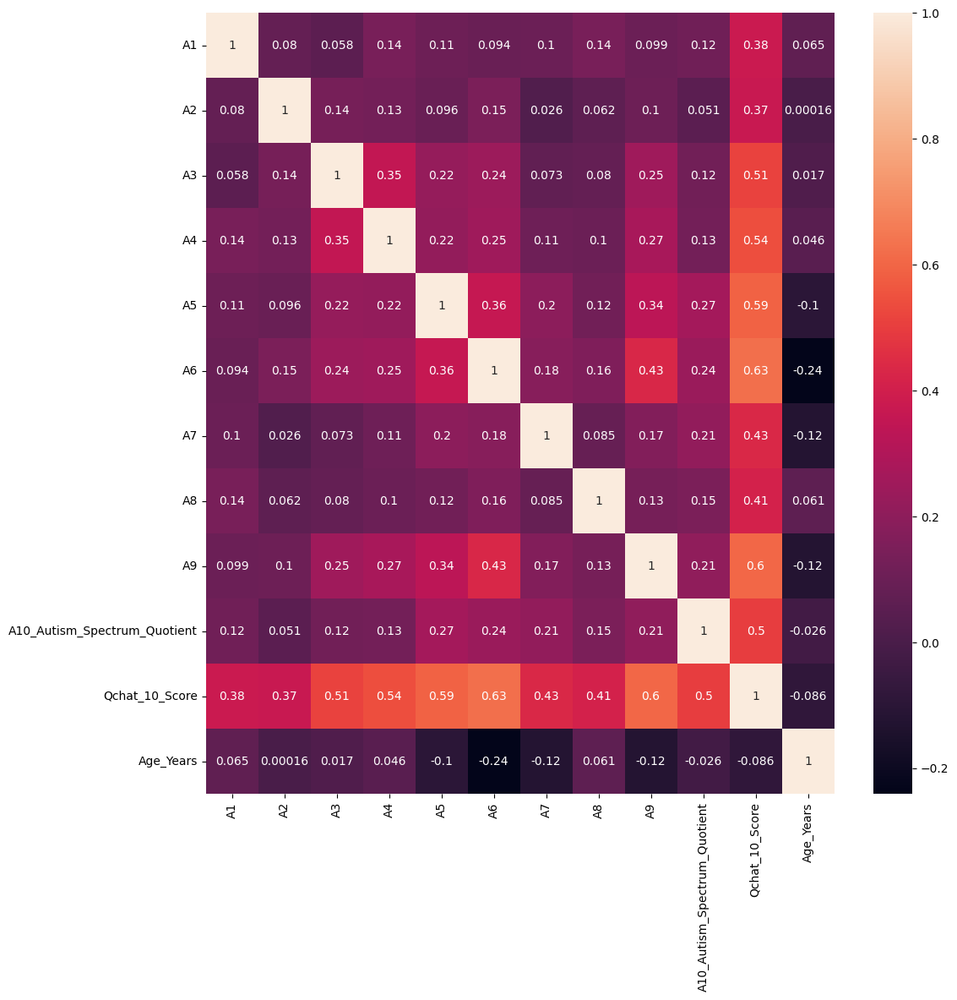

In [321]:
plt.figure(figsize = (12,12))
sns.heatmap(df2[lista_cuantitativas].corr(),annot =True)
plt.show()

La variable target es binaria de tipo texto, la cambiamos a numérico:

In [322]:
df2[target] = df2[target].map({'Yes': 1, 'No': 0})

In [323]:
df2[target].value_counts()

,count
Asd_Traits,
0,3686
1,1542


In [324]:
df2[target].value_counts(normalize = True)

,proportion
Asd_Traits,
0,0.70505
1,0.29495


In [325]:
df2[target].mean()

np.float64(0.2949502677888294)

Analizamos la correlación de nuestras variables cuantitativas continuas con nuestra variable target cualitativa dicotómica, pero antes realizaremos pruebas de normalidad para elegir entre los coeficientes Spearman o Biserial puntual.

In [326]:
# Crear listas vacías para clasificar las variables
continuas = []
dicotomicas = []

# Iterar por cada columna en la lista de variables cuantitativas
for col in lista_cuantitativas:
    # Obtener valores únicos no nulos de la columna
    valores_unicos = df2[col].unique()

    # Clasificar como dicotómica si tiene exactamente 2 valores únicos
    if len(valores_unicos) == 2:
        dicotomicas.append(col)
    else:
        continuas.append(col)

In [327]:
from scipy.stats import shapiro, pointbiserialr, spearmanr, anderson, jarque_bera

# Diccionario para almacenar resultados
resultados_correlacion = []

for col in continuas:
    datos = df2[col]
    y_binaria = df2.loc[datos.index, target]

    # Prueba de Shapiro-Wilk
    stat_shapiro, p_shapiro = shapiro(datos)
    es_normal_shapiro = p_shapiro > 0.05

    # Prueba de Anderson-Darling
    ad_result = anderson(datos, dist='norm')
    es_normal_anderson = ad_result.statistic < ad_result.critical_values[2]  # nivel de significancia 5%

    # Prueba de Jarque-Bera
    stat_jb, p_jb = jarque_bera(datos)
    es_normal_jb = p_jb > 0.05

    # Decisión combinada
    es_normal = es_normal_shapiro and es_normal_anderson and es_normal_jb
    normalidad = 'Sí' if es_normal else 'No'

    # Aplicar coeficiente correspondiente
    if es_normal:
        coef, p = pointbiserialr(y_binaria, datos)
        metodo = 'Biserial puntual'
    else:
        coef, p = spearmanr(datos, y_binaria)
        metodo = 'Spearman'

    # Interpretar el nivel de significancia
    if p < 0.001:
        interpretacion = 'Muy significativa (p < 0.001)'
    elif p < 0.01:
        interpretacion = 'Significativa (p < 0.01)'
    elif p < 0.05:
        interpretacion = 'Poco significativa (p < 0.05)'
    else:
        interpretacion = 'No significativa'

    resultados_correlacion.append({
        'Variable': col,
        'p_Shapiro': p_shapiro,
        'Anderson_stat': ad_result.statistic,
        'JB_p_value': p_jb,
        'Normalidad': normalidad,
        'Método': metodo,
        'Coeficiente': coef,
        'p_value': p,
        'Significancia': interpretacion
    })

# Mostrar resultados
df_resultados = pd.DataFrame(resultados_correlacion)
df_resultados

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5228.
  res = hypotest_fun_out(*samples, **kwds)


,Variable,p_Shapiro,Anderson_stat,JB_p_value,Normalidad,Método,Coeficiente,p_value,Significancia
0,Qchat_10_Score,9.554121e-33,55.906196,3.993802e-37,No,Spearman,0.742002,0.000000e+00,Muy significativa (p < 0.001)
1,Age_Years,2.057233e-41,76.818961,3.084499e-77,No,Spearman,0.086482,3.769139e-10,Muy significativa (p < 0.001)


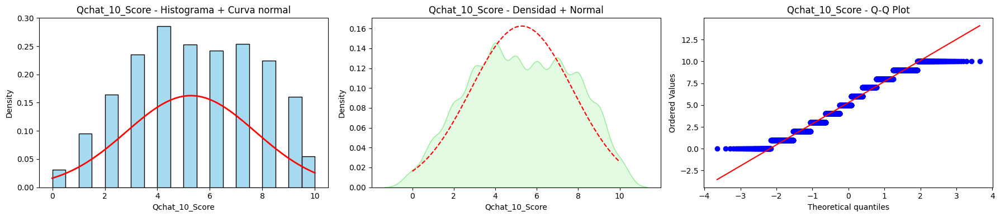

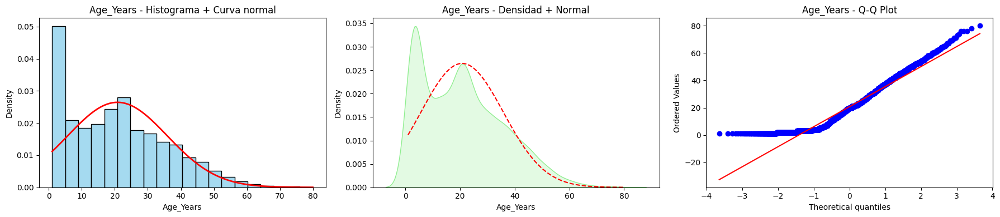

In [328]:
import scipy.stats as stats

for col in continuas:
    datos = df2[col]

    # Crear figura
    plt.figure(figsize=(18, 4))

    # Histograma con curva normal
    plt.subplot(1, 3, 1)
    sns.histplot(datos, stat="density", bins=20, color="skyblue", edgecolor="black")
    mean = datos.mean()
    std = datos.std()
    x_vals = np.linspace(datos.min(), datos.max(), 100)
    plt.plot(x_vals, stats.norm.pdf(x_vals, mean, std), color="red", lw=2)
    plt.title(f"{col} - Histograma + Curva normal")

    # Densidad con curva normal
    plt.subplot(1, 3, 2)
    sns.kdeplot(data=datos, bw_adjust=1, fill=True, color="lightgreen")
    plt.plot(x_vals, stats.norm.pdf(x_vals, mean, std), color="red", linestyle="--")
    plt.title(f"{col} - Densidad + Normal")

    # Gráfico Q-Q
    plt.subplot(1, 3, 3)
    stats.probplot(datos, dist="norm", plot=plt)
    plt.title(f"{col} - Q-Q Plot")

    plt.tight_layout()
    plt.show()


Analizamos la asociación de nuestras variables dicotómicas continuas con nuestra variable target cualitativa dicotómica usando el coeficiente Phi de Pearson.

In [329]:
from sklearn.metrics import matthews_corrcoef

# Lista para guardar resultados
resultados_phi = []

for col in dicotomicas:
    x = df2[col]
    y_binaria = df2[target]

    # Calcular el coeficiente Phi usando MCC (es equivalente en 2x2)
    phi = matthews_corrcoef(x, y_binaria)

    resultados_phi.append({
        'Variable': col,
        'Coeficiente_Phi': phi
    })

# Crear DataFrame de resultados
df_phi = pd.DataFrame(resultados_phi)
df_phi

,Variable,Coeficiente_Phi
0,A1,0.248603
1,A2,0.251265
2,A3,0.390327
3,A4,0.398862
4,A5,0.449755
5,A6,0.482652
6,A7,0.257432
7,A8,0.292207
8,A9,0.469107
9,A10_Autism_Spectrum_Quotient,0.383461


Apreciamos que nuestras variables cuantitativas dicotómicas tienen un coeficiente Phi moderado con el target.

#### 1.4.2. Variables cualitativas

Analizamos la asociación entre nuestras variables categóricas dicotómicas (por ejemplo, variables con valores True/False o 0/1) y la variable objetivo. Para ello utilizamos el coeficiente Phi, adecuado para tablas de contingencia 2x2.

In [330]:
# Crear listas vacías para clasificar las variables
multicat = []
cual_dicotomicas = []

# Iterar por cada columna en la lista de variables cuantitativas
for col in lista_cualitativas:
    # Obtener valores únicos no nulos de la columna
    valores_unicos = df2[col].unique()

    # Clasificar como dicotómica si tiene exactamente 2 valores únicos
    if len(valores_unicos) == 2:
        cual_dicotomicas.append(col)
    else:
        multicat.append(col)

In [331]:
# Lista para guardar resultados
resultados_phi = []

for col in cual_dicotomicas:
    valores = df2[col].unique()

    # Codificar según el contenido de la columna
    if set(valores) == {'Yes', 'No'}:
        x = df2[col].map({'Yes': 1, 'No': 0})
    else:
        x = df2[col].map({'M': 1, 'F': 0})

    y_binaria = df2[target]

    # Calcular el coeficiente Phi usando MCC (es equivalente en 2x2)
    phi = matthews_corrcoef(x, y_binaria)

    resultados_phi.append({
        'Variable': col,
        'Coeficiente_Phi': phi,
    })

# Crear DataFrame de resultados
df_phi = pd.DataFrame(resultados_phi)
df_phi

,Variable,Coeficiente_Phi
0,Sex,-0.029401
1,Jaundice,0.030169
2,Family_Mem_With_Asd,0.110244


Evaluamos la asociación estadística entre nuestras variables categóricas y la variable objetivo utilizando la prueba de Chi-cuadrado, con el fin de determinar si existen relaciones significativas.

In [332]:
from scipy.stats import chi2_contingency

# Recorrer todas las variables cualitativas (excepto el target)
for var in lista_cualitativas:
    if var == target:
        continue  # Saltar la variable target

    try:
        # Tabla de contingencia
        tabla = pd.crosstab(df2[var], df2[target])

        # Aplicar test chi-cuadrado
        chi2, p, dof, expected = chi2_contingency(tabla)

        # Mostrar resultado
        print(f"{var}: Valor p = {p:.6f} → {'Significativo' if p < 0.05 else 'No significativo'}")

    except Exception as e:
        print(f"{var}: Error al calcular test → {e}")


Sex: Valor p = 0.036154 → Significativo
Jaundice: Valor p = 0.032179 → Significativo
Family_Mem_With_Asd: Valor p = 0.000000 → Significativo


Después de analizar los valores p mediante la prueba de chi-cuadrado, se observa que todas las variables cualitativas evaluadas presentan asociaciones estadísticamente significativas con la variable objetivo (p < 0.05), salvo Jaundice, la cual, como en el primer dataset, se tendrá que eliminar por su baja importancia en un posible diagnóstico.
Esto indica que estas variables podrían tener un rol importante en la predicción del target y deben ser consideradas en el modelado.

## 2. PREPROCESAMIENTO DE DATOS

### 2.1. Encoding de variables categóricas

In [334]:
df2

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,Qchat_10_Score,Age_Years,Sex,Jaundice,Family_Mem_With_Asd,Asd_Traits
0,1,1,0,1,0,0,1,1,0,0,5,15,M,No,No,0
1,0,1,1,1,0,1,1,0,1,0,6,15,M,No,No,0
2,1,1,1,0,1,1,1,1,1,1,9,15,F,No,Yes,1
3,1,1,1,1,1,1,1,1,0,0,8,16,F,No,No,1
4,1,1,1,1,1,1,1,1,1,1,10,15,F,No,No,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6070,0,0,0,0,0,0,0,0,0,1,1,2,F,No,Yes,0
6071,0,0,1,1,1,0,1,0,1,0,5,1,M,Yes,No,0
6072,1,0,1,1,1,1,1,1,1,1,9,2,M,Yes,No,0
6073,1,0,0,0,0,0,0,1,0,1,3,2,M,No,Yes,0


In [335]:
# Numerizar uno a uno
df2['Family_Mem_With_Asd'] = df2['Family_Mem_With_Asd'].map(lambda x: 1 if x == 'Yes' else 0)

# Dummies para Sex y Jaundice
df2 = pd.get_dummies(df2, drop_first=True)
df2.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,Qchat_10_Score,Age_Years,Family_Mem_With_Asd,Asd_Traits,Sex_M,Jaundice_Yes
0,1,1,0,1,0,0,1,1,0,0,5,15,0,0,True,False
1,0,1,1,1,0,1,1,0,1,0,6,15,0,0,True,False
2,1,1,1,0,1,1,1,1,1,1,9,15,1,1,False,False
3,1,1,1,1,1,1,1,1,0,0,8,16,0,1,False,False
4,1,1,1,1,1,1,1,1,1,1,10,15,0,1,False,False


### 2.2. Escalamaniento de datos

In [336]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [337]:
scaled = scaler.fit_transform(df2)

In [338]:
columnas = df2.columns
columnas

Index(['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9',
       'A10_Autism_Spectrum_Quotient', 'Qchat_10_Score', 'Age_Years',
       'Family_Mem_With_Asd', 'Asd_Traits', 'Sex_M', 'Jaundice_Yes'],
      dtype='object')

In [339]:
df2_scaled = pd.DataFrame(data = scaled, columns = columnas)
df2_scaled.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10_Autism_Spectrum_Quotient,Qchat_10_Score,Age_Years,Family_Mem_With_Asd,Asd_Traits,Sex_M,Jaundice_Yes
0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.5,0.177215,0.0,0.0,1.0,0.0
1,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.6,0.177215,0.0,0.0,1.0,0.0
2,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9,0.177215,1.0,1.0,0.0,0.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.8,0.189873,0.0,1.0,0.0,0.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.177215,0.0,1.0,0.0,0.0


### 2.3. Depuración de variables para el modelado (pre entrenamiento)

In [340]:
df2_scaled.columns

Index(['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9',
       'A10_Autism_Spectrum_Quotient', 'Qchat_10_Score', 'Age_Years',
       'Family_Mem_With_Asd', 'Asd_Traits', 'Sex_M', 'Jaundice_Yes'],
      dtype='object')

In [341]:
X_best.columns # Columnas del dataset final con variables clinicas importantes

Index(['PCA_1', 'A6', 'A9', 'Social_Interaction_Issues_%', 'A7', 'A5',
       'Qchat_10_Score', 'Communication_Issues_%', 'A4', 'A1', 'A2', 'A8',
       'Sex_M', 'A3', 'Global_Developmental_Delay_Intellectual_Disability',
       'Speech_Delay_Language_Disorder', 'Depression',
       'Social_Behavioural_Issues', 'Anxiety_Disorder', 'Comorbidity_%'],
      dtype='object')

In [342]:
pretrain_features = [
    "A1", "A2", "A3", "A4", "A5",
    "A6", "A7", "A8", "A9",
    "Qchat_10_Score", "Sex_M"
]

# Asegurarte de incluir la etiqueta
pretrain_columns = pretrain_features + ["Asd_Traits"]

# Crear el nuevo DataFrame con solo las columnas seleccionadas
df2_pre = df2_scaled[pretrain_columns].copy()

In [343]:
df2_pre.head()

,A1,A2,A3,A4,A5,A6,A7,A8,A9,Qchat_10_Score,Sex_M,Asd_Traits
0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.5,1.0,0.0
1,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.6,1.0,0.0
2,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.9,0.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.8,0.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0


Selecciono únicamente estas columnas (`A1`–`A9`, `Qchat_10_Score`, `Sex_M` y `Asd_Traits`) porque representan el conjunto mínimo de variables compartidas entre el dataset de preentrenamiento y el dataset clínico utilizado para fine-tuning. Esta selección asegura que el modelo pueda ser entrenado primero con una gran cantidad de datos generales, y posteriormente ajustado con datos clínicos más ricos sin modificar la estructura de entrada. Se excluyen variables como `PCA_1`, `A10_Autism_Spectrum_Quotient`, `Age_Years` o `Jaundice`, ya que no están disponibles o no son reproducibles en ambas fases del entrenamiento.


In [344]:
df_base = df2_pre.copy()

df_clinical = X_best.copy()
df_clinical['Asd_Traits'] = y

df_base.to_csv('df_base.csv', index=False)
df_clinical.to_csv('df_clinical.csv', index=False)

## 3. ENTRENAMIENTO

### 3.1. MODELO CON ÚNICAMENTE DATASET CLINICO (SIN TRANSFER LEARNING)

In [439]:
# Importar librerías necesarias
from sklearn.model_selection import train_test_split
import tensorflow as tf

In [440]:
df_clinical

,PCA_1,A6,A9,Social_Interaction_Issues_%,A7,A5,Qchat_10_Score,Communication_Issues_%,A4,A1,...,A8,Sex_M,A3,Global_Developmental_Delay_Intellectual_Disability,Speech_Delay_Language_Disorder,Depression,Social_Behavioural_Issues,Anxiety_Disorder,Comorbidity_%,Asd_Traits
0,1.088451,0.0,0.0,0.40,1.0,0.0,0.3,0.6,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0000,0
1,1.579185,1.0,0.0,0.75,1.0,0.0,0.4,0.4,0.0,1.0,...,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0000,1
2,1.374183,0.0,0.0,0.50,1.0,0.0,0.4,0.6,0.0,1.0,...,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0000,1
3,2.163503,1.0,1.0,1.00,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.8571,1
4,2.171407,1.0,1.0,1.00,1.0,1.0,0.9,0.8,1.0,1.0,...,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.8571,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1956,-1.745133,0.0,0.0,0.00,0.0,0.0,0.1,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0
1957,-1.931111,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0
1958,-1.745133,0.0,0.0,0.00,0.0,0.0,0.1,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,1
1959,-1.862742,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0


División en conjunto de entrenamiento y validación

In [519]:
# División del dataset
X = df_clinical.drop(columns=["Asd_Traits"])
y = df_clinical["Asd_Traits"]


# División en conjunto de entrenamiento y validación (80% train / 20% val)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [442]:
X.shape

(1961, 20)

In [443]:
y.shape

(1961,)

##### 3.1.1. Variantes de modelos

**Justificación del uso de 64 neuronas en la primera capa oculta**

La elección de 64 neuronas en la primera capa oculta se basa en un equilibrio técnico entre capacidad representacional, riesgo de sobreajuste y eficiencia computacional. En primer lugar, el modelo trabaja con un conjunto de 20 variables clínicas de entrada, por lo que una capa de 64 neuronas —más de tres veces la dimensión de entrada— resulta adecuada para capturar relaciones no lineales complejas sin incurrir en una dimensionalidad excesiva.

 Además, dado que el conjunto de datos cuenta con menos de 2000 registros, un modelo con una capacidad mayor (por ejemplo, 128 o 256 neuronas) implicaría un número mucho mayor de parámetros, incrementando el riesgo de sobreajuste, especialmente en ausencia de regularización adicional.

In [444]:
from keras import Input
from keras.models import Sequential
from keras.layers import Dense

model_baseline = Sequential([
    Input(shape=(X_train.shape[1],)),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

model_baseline.compile(optimizer='adam',
                       loss='binary_crossentropy',
                       metrics=['accuracy'])

model_baseline.summary()

Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_177 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,457 (13.50 KB)

 Trainable params: 3,457 (13.50 KB)

 Non-trainable params: 0 (0.00 B)

**Justificación de Hiperparámetros — `model_baseline (L2 + Dropout)**

| Hiperparámetro        | Valor asignado            | Justificación                                                                                     |
|-----------------------|---------------------------|---------------------------------------------------------------------------------------------------|
| `Input(shape)`        | `(X_train.shape[1],)`      | Define la dimensión de entrada basada en el número de variables predictoras (20 en este caso).   |
| `Dense(units=64)`     | 64 neuronas                | Proporciona capacidad suficiente para capturar relaciones no lineales sin riesgo elevado de overfitting, dada la cantidad de datos. |
| `activation='relu'`   | ReLU en capas ocultas      | ReLU ayuda a evitar el problema del gradiente desvanecido y mejora la eficiencia del entrenamiento. |
| `Dense(units=32)`     | 32 neuronas                | Reduce gradualmente la dimensionalidad manteniendo la capacidad de aprendizaje.                   |
| `Dense(units=1)`      | 1 neurona                  | Necesaria para salida binaria (0 o 1), correspondiente a la predicción de `Asd_Traits`.           |
| `activation='sigmoid'`| En la capa de salida       | Convierte la salida en una probabilidad entre 0 y 1, adecuada para clasificación binaria.         |
| `optimizer='adam'`    | Adam                       | Optimizador eficiente que ajusta el learning rate automáticamente, ideal para muchos problemas de clasificación. |
| `loss='binary_crossentropy'` | Binary crossentropy  | Función de pérdida estándar para clasificación binaria, penaliza predicciones incorrectas con alta confianza. |
| `metrics=['accuracy']`| Accuracy                   | Métrica clara e interpretable para problemas de clasificación balanceados.                        |


In [445]:
from keras.layers import Dropout
from keras.regularizers import l2

# Modelo con L2 + Dropout
model_l2_dropout = Sequential([
    Input(shape=(X_train.shape[1],)),
    Dense(64, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.3),
    Dense(32, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.2),
    Dense(1, activation='sigmoid')
])


model_l2_dropout.compile(optimizer='adam',
                         loss='binary_crossentropy',
                         metrics=['accuracy'])

model_l2_dropout.summary()

Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_180 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_43 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_44 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_182 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,457 (13.50 KB)

 Trainable params: 3,457 (13.50 KB)

 Non-trainable params: 0 (0.00 B)

**Justificación de Hiperparámetros — `model_l2_dropout` (L2 + Dropout)**


| Hiperparámetro               | Valor/Configuración           | Justificación                                                                                                                                           |
|-----------------------------|-------------------------------|--------------------------------------------------------------------------------------------------------------------------------------------------------|
| `Input(shape=(X_train.shape[1],))` | 20 variables (desde `X_train`) | Define el tamaño de entrada del modelo con base en el número de variables clínicas escaladas.                                                         |
| `Dense(64, activation='relu')`     | 64 neuronas, activación ReLU   | Suficiente capacidad para aprender representaciones no lineales sin sobreajustar. ReLU previene gradientes desaparecidos y acelera entrenamiento.     |
| `kernel_regularizer=l2(0.001)`     | Regularización L2              | Penaliza pesos grandes, previene overfitting. L2 es ideal cuando se busca suavizar los pesos sin eliminarlos completamente (como haría L1).           |
| `Dropout(0.3)`                     | 30% de desactivación           | Desactiva aleatoriamente un 30% de las neuronas para evitar sobreajuste en la primera capa oculta.                                                    |
| `Dense(32, activation='relu')`     | 32 neuronas, activación ReLU   | Segunda capa densa para refinar representaciones intermedias, manteniendo capacidad sin ser excesiva.                                                 |
| `Dropout(0.2)`                     | 20% de desactivación           | Menor dropout que la anterior para evitar pérdida excesiva de señal antes de la salida.                                                               |
| `Dense(1, activation='sigmoid')`   | 1 neurona de salida, Sigmoid   | Función de activación para clasificación binaria, devuelve una probabilidad entre 0 y 1.                                                              |
| `optimizer='adam'`                 | Adam                           | Optimiza eficientemente con adaptación automática de tasas de aprendizaje, adecuado para problemas con datos escasos.                                 |
| `loss='binary_crossentropy'`       | Binary Crossentropy            | Métrica estándar para clasificación binaria, ideal cuando se predice una clase frente a otra.                                                         |
| `metrics=['accuracy']`            | Accuracy                       | Mide qué proporción de predicciones son correctas; útil como métrica de referencia en clasificación binaria balanceada o moderadamente desbalanceada.|


In [446]:
from keras.layers import BatchNormalization
from keras.regularizers import l1

# Modelo con L1 + BatchNormalization
model_bn_l1 = Sequential([
    Input(shape=(X_train.shape[1],)),
    Dense(64, activation='relu', kernel_regularizer=l1(0.001)),
    BatchNormalization(),
    Dense(32, activation='relu', kernel_regularizer=l1(0.001)),
    BatchNormalization(),
    Dense(1, activation='sigmoid')
])

model_bn_l1.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

model_bn_l1.summary()

Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_183 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_38          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_39          │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,841 (15.00 KB)

 Trainable params: 3,649 (14.25 KB)

 Non-trainable params: 192 (768.00 B)

**Justificación de Hiperparámetros — `model_bn_l1` (L1 + BatchNormalization)**

| Hiperparámetro                            | Valor utilizado                                     | Justificación                                                                                                                                      |
|------------------------------------------|-----------------------------------------------------|----------------------------------------------------------------------------------------------------------------------------------------------------|
| `Input(shape=(X_train.shape[1],))`        | 20 variables clínicas                               | Se define la dimensión de entrada con base en el número de variables predictoras escaladas.                                                       |
| `Dense(64, activation='relu', kernel_regularizer=l1(0.001))` | 64 neuronas, activación ReLU, L1(0.001)             | Brinda capacidad para representar relaciones complejas. L1 promueve sparsity, útil cuando se desea identificar variables clínicas relevantes.     |
| `BatchNormalization()`                   | Aplicada después de la primera capa densa           | Estabiliza la distribución de activaciones y acelera el entrenamiento. Reduce el “internal covariate shift” y mejora la convergencia.             |
| `Dense(32, activation='relu', kernel_regularizer=l1(0.001))` | 32 neuronas, activación ReLU, L1(0.001)             | Reduce progresivamente la dimensionalidad manteniendo capacidad de aprendizaje. La regularización L1 continúa ayudando a filtrar variables.       |
| `BatchNormalization()`                   | Aplicada después de la segunda capa densa           | Continúa normalizando activaciones intermedias para evitar oscilaciones y acelerar la convergencia.                                               |
| `Dense(1, activation='sigmoid')`         | 1 neurona de salida, activación Sigmoid             | Convierte la salida en una probabilidad entre 0 y 1, adecuada para clasificación binaria como en el caso de `Asd_Traits`.                         |
| `loss='binary_crossentropy'`             | Binary Crossentropy                                 | Función de pérdida ideal para clasificación binaria. Penaliza más los errores de alta confianza, lo que la hace robusta para este caso.           |
| `optimizer='adam'`                       | Adam                                                | Optimización eficiente con ajustes adaptativos automáticos. Funciona bien en la mayoría de los casos sin necesidad de ajuste manual.              |
| `metrics=['accuracy']`                   | Accuracy                                            | Métrica clara y ampliamente usada en clasificación binaria. Permite interpretar cuántas predicciones fueron correctas.                            |


**Justificación general de las variantes del modelo**

Se propusieron tres variantes del modelo DNN para explorar cómo diferentes técnicas de regularización afectan el rendimiento predictivo al trabajar con un conjunto de datos clínico limitado (20 variables, ~2000 registros):

- `model_baseline` actúa como punto de partida, con arquitectura simple y sin regularización explícita, para establecer una línea base de desempeño.

- `model_l2_dropout` incorpora Dropout y regularización L2, técnicas conocidas para combatir el sobreajuste al limitar la dependencia del modelo en neuronas específicas y penalizar pesos grandes.

- `model_bn_l1` aplica Batch Normalization junto con L1, enfocándose en mejorar la estabilidad del entrenamiento y fomentar sparsity (activaciones más selectivas), útil para destacar variables clínicas relevantes.

Estas tres configuraciones permiten comparar la efectividad de distintos mecanismos de regularización en un entorno clínico realista, facilitando la selección del modelo más robusto para la predicción de rasgos autistas.

#### 3.1.2. Entrenamiento

In [447]:
import matplotlib.pyplot as plt

def plot_history(histories, metric='loss'):
    plt.figure(figsize=(10, 6))
    for name, history in histories.items():
        # Línea de entrenamiento
        plt.plot(history.history[metric], label=f'{name} - Entrenamiento')
        # Línea de validación
        plt.plot(history.history[f'val_{metric}'], linestyle='--', label=f'{name} - Validación')

    plt.title(f'Comparación de la métrica: {metric}')
    plt.xlabel('Épocas')
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Compararemos el rendimiento de estas variantes al rededor de 10, 20 y 30 épocas.

In [448]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, BatchNormalization, Input
from keras.regularizers import l1, l2

# Modelo baseline
def get_model_baseline():
    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    return model

# Modelo con L2 + Dropout
def get_model_l2_dropout():
    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(64, activation='relu', kernel_regularizer=l2(0.001)),
        Dropout(0.3),
        Dense(32, activation='relu', kernel_regularizer=l2(0.001)),
        Dropout(0.2),
        Dense(1, activation='sigmoid')
    ])
    return model

# Modelo con L1 + BatchNormalization
def get_model_bn_l1():
    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(64, activation='relu', kernel_regularizer=l1(0.001)),
        BatchNormalization(),
        Dense(32, activation='relu', kernel_regularizer=l1(0.001)),
        BatchNormalization(),
        Dense(1, activation='sigmoid')
    ])
    return model

In [449]:
def entrenar_modelos_clinicos(epocas):
    # Modelo 1: baseline
    model_baseline = get_model_baseline()
    model_baseline.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history_baseline = model_baseline.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epocas, verbose=1)

    # Modelo 2: L2 + Dropout
    model_l2_dropout = get_model_l2_dropout()
    model_l2_dropout.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history_l2_dropout = model_l2_dropout.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epocas, verbose=1)

    # Modelo 3: L1 + BatchNorm
    model_bn_l1 = get_model_bn_l1()
    model_bn_l1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history_bn_l1 = model_bn_l1.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epocas, verbose=1)

    return {
        f'Baseline_{epocas}e': history_baseline,
        f'L2_Dropout_{epocas}e': history_l2_dropout,
        f'BN_L1_{epocas}e': history_bn_l1
    }

10 épocas

In [450]:
histories_10 = entrenar_modelos_clinicos(epocas=10)

Epoch 1/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5793 - loss: 0.6146 - val_accuracy: 0.7557 - val_loss: 0.4704
Epoch 2/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7969 - loss: 0.4297 - val_accuracy: 0.7812 - val_loss: 0.3746
Epoch 3/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8391 - loss: 0.3397 - val_accuracy: 0.8651 - val_loss: 0.3109
Epoch 4/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8790 - loss: 0.2674 - val_accuracy: 0.8626 - val_loss: 0.2801
Epoch 5/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8850 - loss: 0.2491 - val_accuracy: 0.8626 - val_loss: 0.2623
Epoch 6/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8898 - loss: 0.2321 - val_accuracy: 0.8626 - val_loss: 0.2564
Epoch 7/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8663 - loss: 0.2372 - val_accuracy: 0.8651 - val_loss: 0.2495
Epoch 8/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8920 - loss: 0.2029 - val_accuracy: 0.8601 - val_loss:

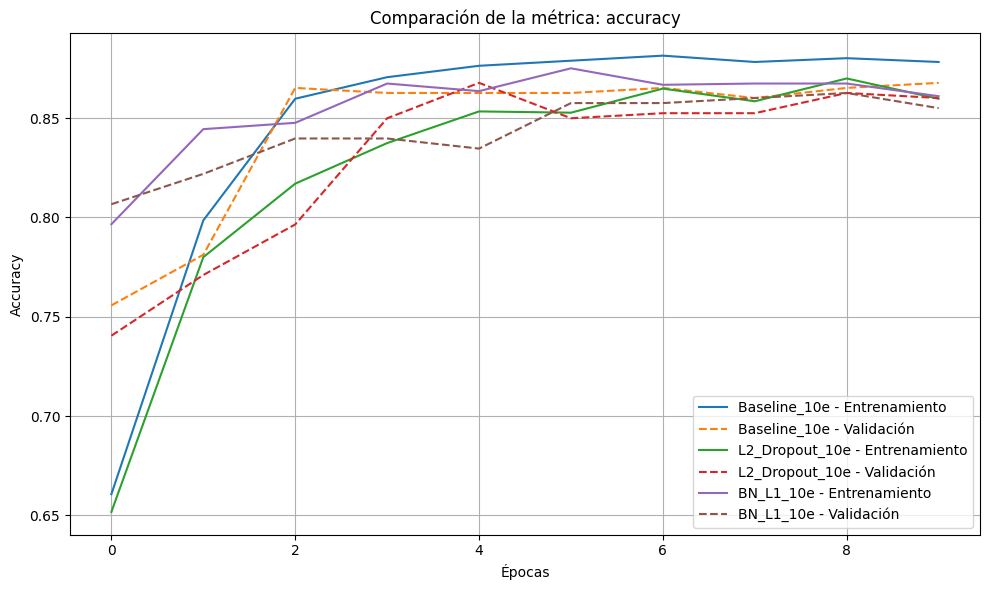

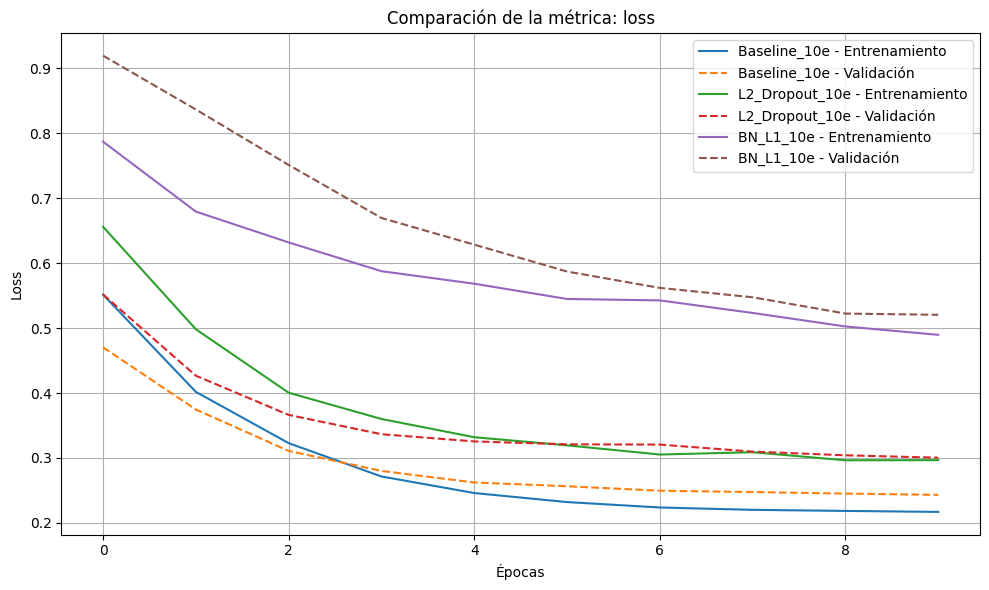

In [451]:
# Gráfico de accuracy
plot_history(histories_10, metric='accuracy')  # Comparación de precisión

# Gráfico de pérdida
plot_history(histories_10, metric='loss')      # Comparación de función de pérdida

20 épocas

In [452]:
histories_20 = entrenar_modelos_clinicos(epocas=20)

Epoch 1/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.6707 - loss: 0.5435 - val_accuracy: 0.7735 - val_loss: 0.3914
Epoch 2/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8160 - loss: 0.3326 - val_accuracy: 0.8524 - val_loss: 0.3086
Epoch 3/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8719 - loss: 0.2699 - val_accuracy: 0.8550 - val_loss: 0.2734
Epoch 4/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8551 - loss: 0.2500 - val_accuracy: 0.8626 - val_loss: 0.2621
Epoch 5/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8720 - loss: 0.2421 - val_accuracy: 0.8575 - val_loss: 0.2540
Epoch 6/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8668 - loss: 0.2342 - val_accuracy: 0.8601 - val_loss: 0.2531
Epoch 7/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8750 - loss: 0.2356 - val_accuracy: 0.8626 - val_loss: 0.2483
Epoch 8/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8724 - loss: 0.2237 - val_accuracy: 0.8626 - val_loss

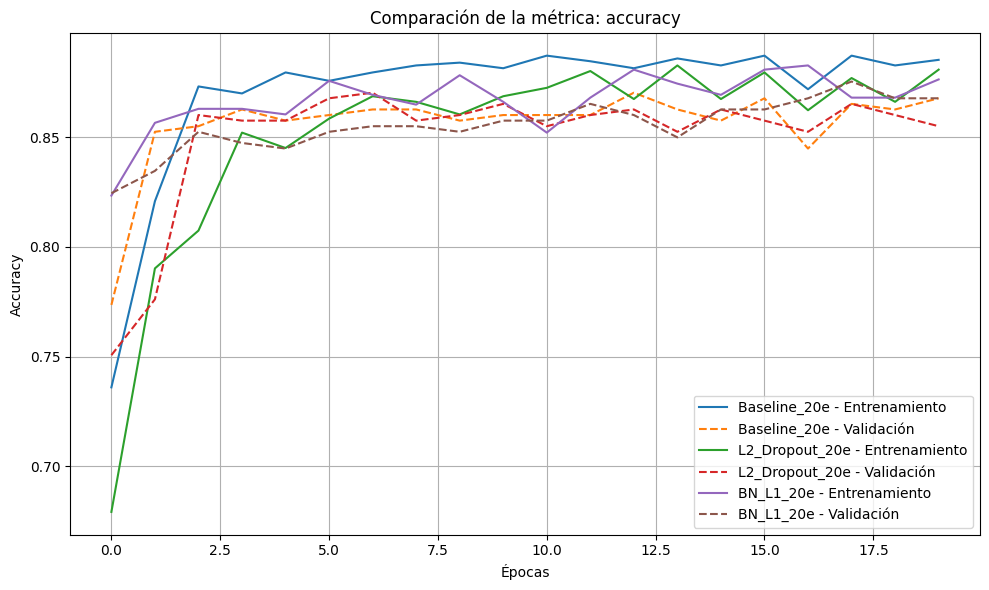

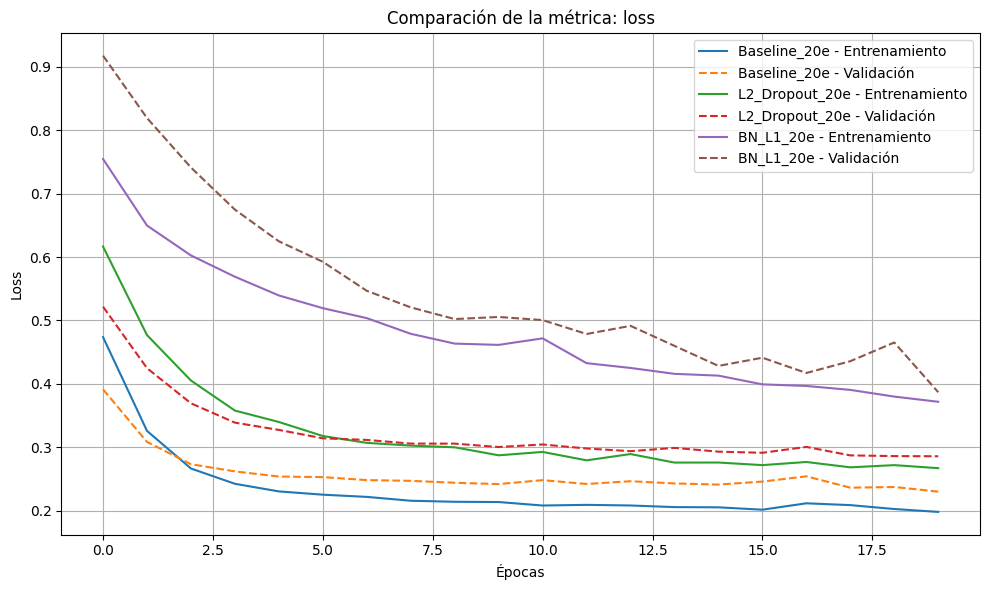

In [453]:
# Gráfico de accuracy
plot_history(histories_20, metric='accuracy')  # Comparación de precisión

# Gráfico de pérdida
plot_history(histories_20, metric='loss')      # Comparación de función de pérdida

30 épocas

In [454]:
histories_30 = entrenar_modelos_clinicos(epocas=30)

Epoch 1/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5422 - loss: 0.7307 - val_accuracy: 0.6387 - val_loss: 0.5246
Epoch 2/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7301 - loss: 0.4641 - val_accuracy: 0.8244 - val_loss: 0.4030
Epoch 3/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8714 - loss: 0.3488 - val_accuracy: 0.8550 - val_loss: 0.3215
Epoch 4/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8704 - loss: 0.2825 - val_accuracy: 0.8550 - val_loss: 0.2840
Epoch 5/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8636 - loss: 0.2618 - val_accuracy: 0.8575 - val_loss: 0.2674
Epoch 6/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8857 - loss: 0.2216 - val_accuracy: 0.8575 - val_loss: 0.2574
Epoch 7/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8497 - loss: 0.2445 - val_accuracy: 0.8677 - val_loss: 0.2546
Epoch 8/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8605 - loss: 0.2375 - val_accuracy: 0.8499 - val_loss:

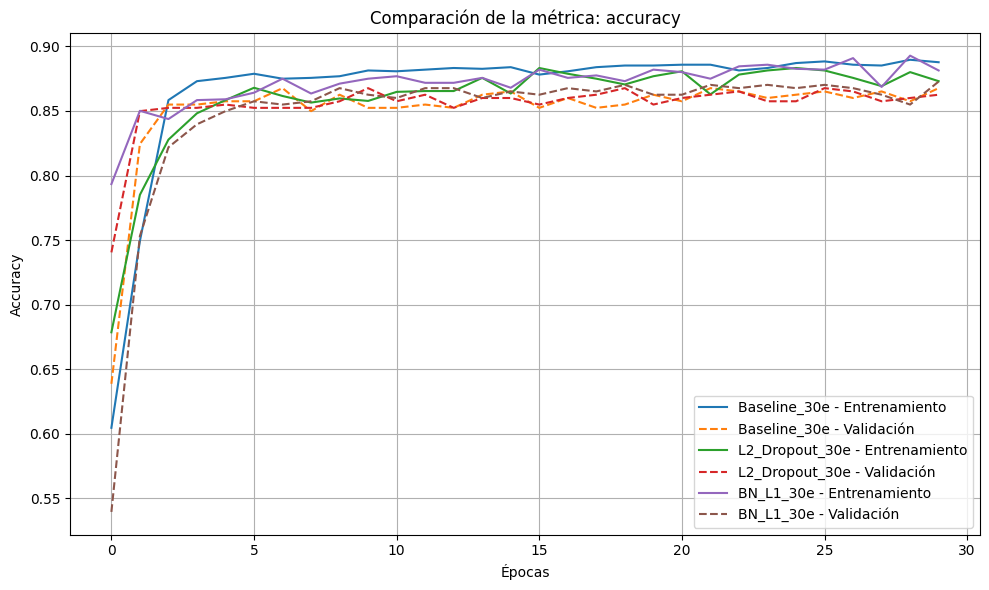

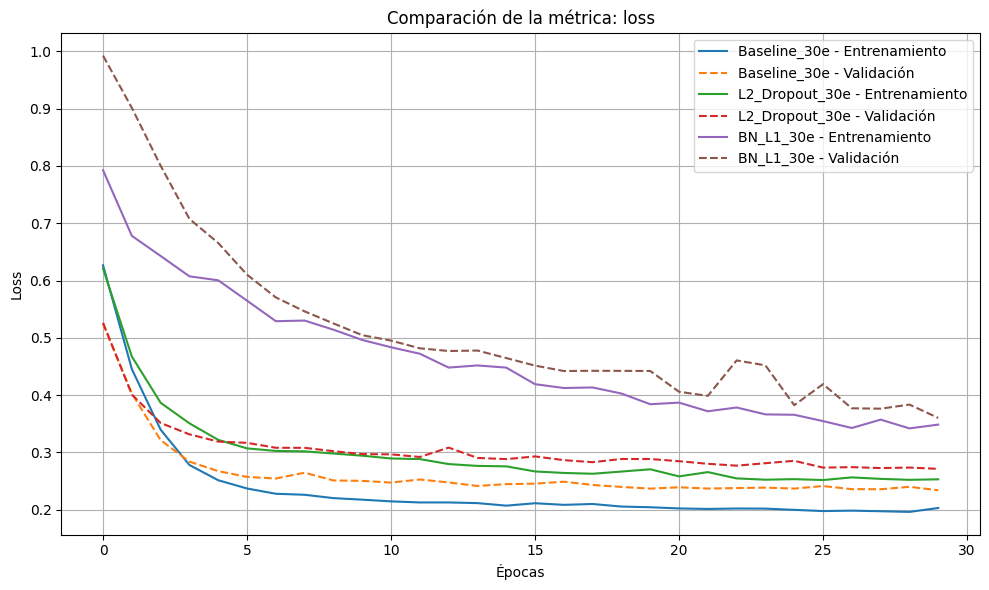

In [455]:
# Gráfico de accuracy
plot_history(histories_30, metric='accuracy')  # Comparación de precisión

# Gráfico de pérdida
plot_history(histories_30, metric='loss')      # Comparación de función de pérdida

1. Baseline (Azul)

- Accuracy: 88-89% (consistentemente el más alto)
- Loss: El más bajo (~0.20-0.25) y más estable
- Generalización: Excelente - train y validation prácticamente iguales
- Estabilidad: Converge rápido y se mantiene estable

2. L2_Dropout (Verde)

- Accuracy: 87-88% (ligeramente menor que Baseline)
- Loss: Bueno (~0.25-0.30) pero mayor que Baseline
- Comportamiento: Estable pero no supera al Baseline

3. BN_L1 (Morado)

- Accuracy: 87% (el menor de los tres)
- Loss: Más alto y fluctuante, especialmente en validación
- Problema: Mayor gap entre train y validation

¿Por qué Baseline es el mejor?

- Mayor accuracy final: Consistentemente superior a los otros

- Menor loss: Las curvas azules están por debajo de las demás

- Mejor generalización: Train y validation casi idénticos

- Simplicidad efectiva: A veces menos es más

- Estabilidad superior: Sin fluctuaciones innecesarias

EXPERIMENTACIÓN (MEJORAR METRICAS)

In [456]:
# Modelo baseline mejorado
def get_model_baseline():
    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(32, activation='relu'),  # Reducido de 64 a 32
        Dense(16, activation='relu'),  # Reducido de 32 a 16
        Dense(1, activation='sigmoid')
    ])

    return model

# Modelo con L2 regularization + Dropout
def get_model_l2_dropout():
    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(32, activation='relu', kernel_regularizer=l2(0.001)),
        Dropout(0.2),
        BatchNormalization(),
        Dense(16, activation='relu', kernel_regularizer=l2(0.001)),
        Dropout(0.15),
        Dense(1, activation='sigmoid')
    ])

    return model

# Modelo con L1 regularization + BatchNorm
def get_model_l1_batchnorm():
    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(32, activation='relu', kernel_regularizer=l1(0.0001)),
        BatchNormalization(),
        Dense(16, activation='relu', kernel_regularizer=l1(0.0001)),
        BatchNormalization(),
        Dense(1, activation='sigmoid')
    ])

    return model

# Modelo más simple para evitar overfitting
def get_model_simple():
    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(24, activation='relu', kernel_regularizer=l2(0.001)),
        Dropout(0.2),
        Dense(12, activation='relu', kernel_regularizer=l2(0.001)),
        Dense(1, activation='sigmoid')
    ])

    return model

# Modelo con arquitectura adaptativa
def get_model_adaptive():
    input_dim = X_train.shape[1]
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(max(16, input_dim), activation='relu', kernel_regularizer=l2(0.001)),
        Dropout(0.2),
        BatchNormalization(),
        Dense(max(8, input_dim//2), activation='relu', kernel_regularizer=l2(0.001)),
        Dropout(0.1),
        Dense(1, activation='sigmoid')
    ])

    return model

**Justificación general de las variantes mejoradas del modelo**

Con el fin de optimizar el rendimiento predictivo en un conjunto de datos clínico limitado (20 variables, ~2000 registros), se propusieron cinco variantes mejoradas del modelo base. Los cambios introducidos se enfocan en reducir el sobreajuste, ajustar la complejidad del modelo y mejorar la generalización en un entorno clínico:

- **get_model_baseline()**:
Modelo simplificado con 32 y 16 neuronas (vs. 64 y 32 originalmente). La reducción busca evitar el sobreajuste al trabajar con un dataset pequeño, manteniendo capacidad para aprender relaciones no lineales moderadas.

- **get_model_l2_dropout()**:
Incluye regularización L2, Dropout y BatchNormalization. Se aplican tasas de dropout menores (0.2 y 0.15) y menor complejidad (32 → 16 neuronas) para reducir la dependencia de nodos individuales, estabilizar activaciones y limitar el sobreajuste sin sacrificar expresividad.

- **get_model_l1_batchnorm()**:
Usa regularización L1 con kernel_regularizer=l1(0.0001) (valor más bajo que antes) para inducir sparsity sin eliminar demasiados pesos relevantes. BatchNormalization tras cada capa estabiliza el entrenamiento y mejora la convergencia.

- **get_model_simple()**:
Variante minimalista con 24 y 12 neuronas, Dropout y L2 regularization. Propuesta como control para medir la capacidad de modelos de baja complejidad frente a configuraciones más profundas y regulares. Ideal para evitar sobreajuste extremo.

- **get_model_adaptive()**:
Modelo adaptable basado en el número de variables clínicas (input_dim). Escoge dinámicamente 16 o más neuronas según la entrada y ajusta la arquitectura a la escala del problema. Integra Dropout y BatchNormalization como estabilizadores.

In [457]:
# Función para entrenar todos los modelos clínicos
def entrenar_modelos_clinicos(epocas):
    # Modelo 1: baseline
    model_baseline = get_model_baseline()
    model_baseline.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history_baseline = model_baseline.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epocas, verbose=1)

    # Modelo 2: L2 + Dropout
    model_l2_dropout = get_model_l2_dropout()
    model_l2_dropout.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history_l2_dropout = model_l2_dropout.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epocas, verbose=1)

    # Modelo 3: L1 + BatchNorm
    model_l1_batchnorm = get_model_l1_batchnorm()
    model_l1_batchnorm.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history_l1_batchnorm = model_l1_batchnorm.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epocas, verbose=1)

    # Modelo 4: Simple
    model_simple = get_model_simple()
    model_simple.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history_simple = model_simple.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epocas, verbose=1)

    # Modelo 5: Adaptive
    model_adaptive = get_model_adaptive()
    model_adaptive.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history_adaptive = model_adaptive.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epocas, verbose=1)

    return {
        f'Baseline_{epocas}e': history_baseline,
        f'L2_Dropout_{epocas}e': history_l2_dropout,
        f'L1_BatchNorm_{epocas}e': history_l1_batchnorm,
        f'Simple_{epocas}e': history_simple,
        f'Adaptive_{epocas}e': history_adaptive
    }

In [458]:
histories_10 = entrenar_modelos_clinicos(epocas=10)

Epoch 1/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.6217 - loss: 0.5702 - val_accuracy: 0.7455 - val_loss: 0.4771
Epoch 2/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7739 - loss: 0.4377 - val_accuracy: 0.7735 - val_loss: 0.3799
Epoch 3/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8059 - loss: 0.3426 - val_accuracy: 0.7812 - val_loss: 0.3222
Epoch 4/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8160 - loss: 0.3059 - val_accuracy: 0.8550 - val_loss: 0.2908
Epoch 5/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8620 - loss: 0.2713 - val_accuracy: 0.8575 - val_loss: 0.2702
Epoch 6/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8581 - loss: 0.2555 - val_accuracy: 0.8626 - val_loss: 0.2597
Epoch 7/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8784 - loss: 0.2312 - val_accuracy: 0.8524 - val_loss: 0.2539
Epoch 8/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8742 - loss: 0.2354 - val_accuracy: 0.8728 - val_loss

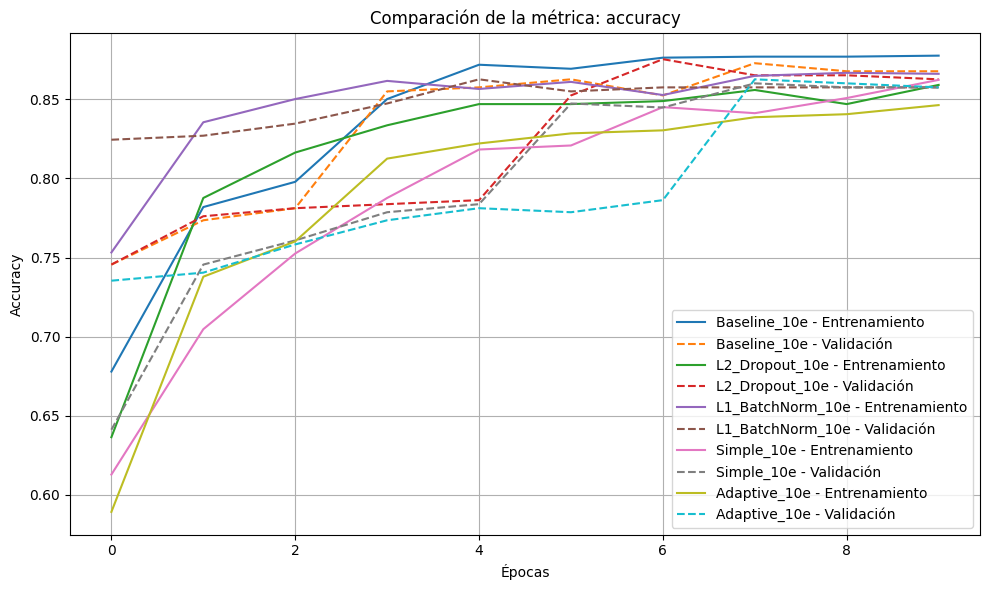

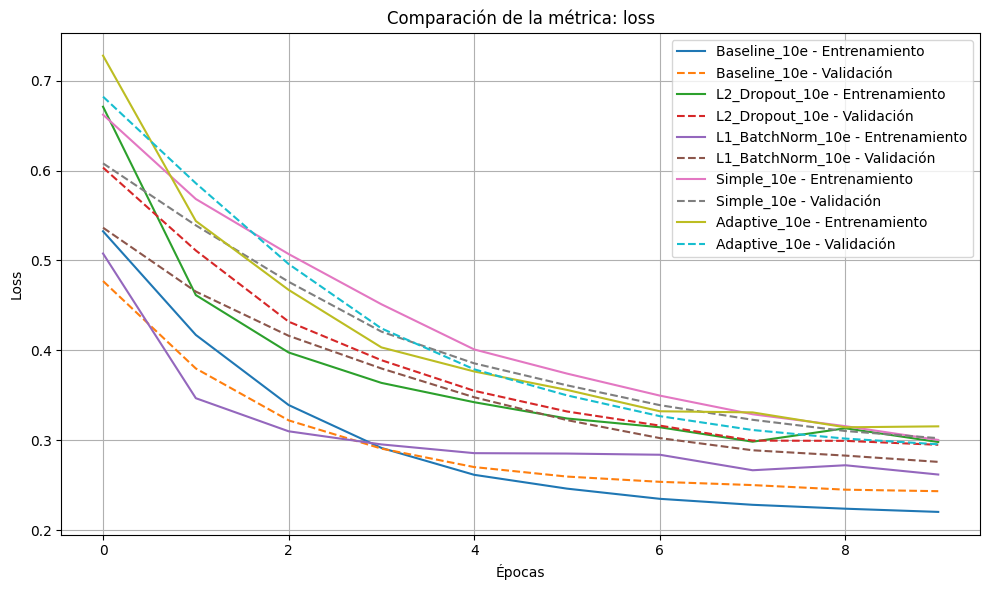

In [459]:
# Gráfico de accuracy
plot_history(histories_10, metric='accuracy')  # Comparación de precisión

# Gráfico de pérdida
plot_history(histories_10, metric='loss')      # Comparación de función de pérdida

In [460]:
histories_20 = entrenar_modelos_clinicos(epocas=20)

Epoch 1/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5363 - loss: 0.6661 - val_accuracy: 0.7328 - val_loss: 0.5540
Epoch 2/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7513 - loss: 0.5103 - val_accuracy: 0.7455 - val_loss: 0.4647
Epoch 3/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7696 - loss: 0.4384 - val_accuracy: 0.8142 - val_loss: 0.3981
Epoch 4/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8406 - loss: 0.3647 - val_accuracy: 0.8473 - val_loss: 0.3475
Epoch 5/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8678 - loss: 0.3183 - val_accuracy: 0.8499 - val_loss: 0.3090
Epoch 6/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8805 - loss: 0.2787 - val_accuracy: 0.8448 - val_loss: 0.2864
Epoch 7/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8584 - loss: 0.2720 - val_accuracy: 0.8422 - val_loss: 0.2738
Epoch 8/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8698 - loss: 0.2435 - val_accuracy: 0.8422 - val_loss:

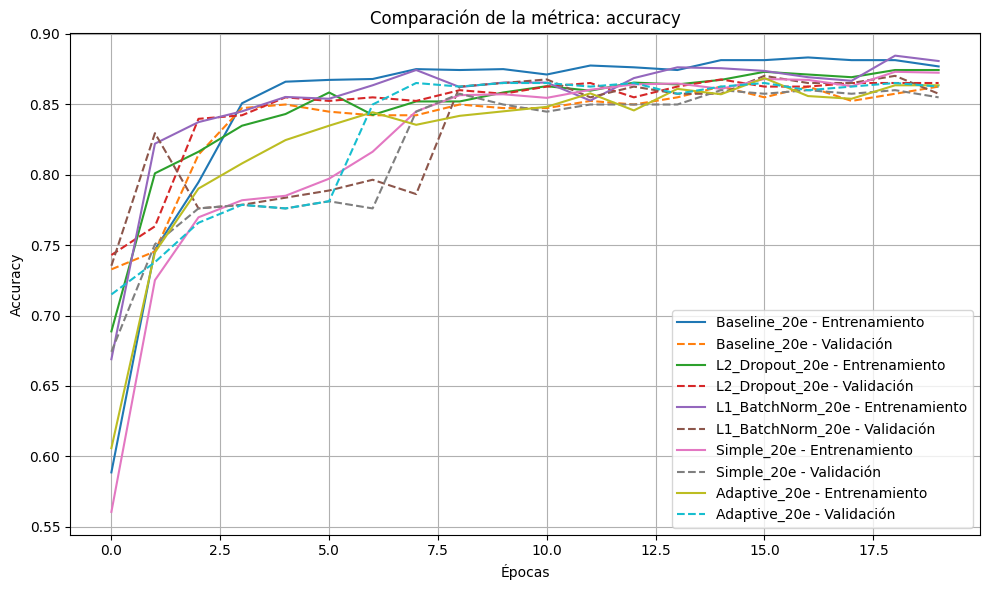

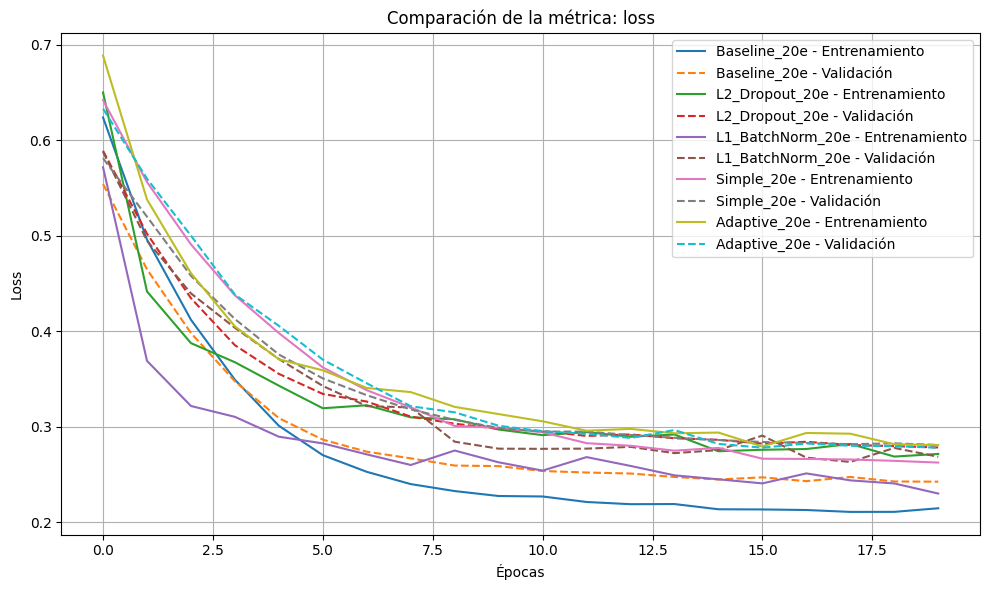

In [461]:
# Gráfico de accuracy
plot_history(histories_20, metric='accuracy')  # Comparación de precisión

# Gráfico de pérdida
plot_history(histories_20, metric='loss')      # Comparación de función de pérdida

In [465]:
histories_30 = entrenar_modelos_clinicos(epocas=30)

Epoch 1/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.7088 - loss: 0.5680 - val_accuracy: 0.7430 - val_loss: 0.4855
Epoch 2/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7776 - loss: 0.4478 - val_accuracy: 0.7684 - val_loss: 0.4047
Epoch 3/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7905 - loss: 0.3746 - val_accuracy: 0.7812 - val_loss: 0.3530
Epoch 4/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8261 - loss: 0.3278 - val_accuracy: 0.8575 - val_loss: 0.3185
Epoch 5/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8632 - loss: 0.2961 - val_accuracy: 0.8499 - val_loss: 0.2958
Epoch 6/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8694 - loss: 0.2689 - val_accuracy: 0.8575 - val_loss: 0.2809
Epoch 7/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8580 - loss: 0.2593 - val_accuracy: 0.8524 - val_loss: 0.2706
Epoch 8/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8681 - loss: 0.2444 - val_accuracy: 0.8499 - val_loss

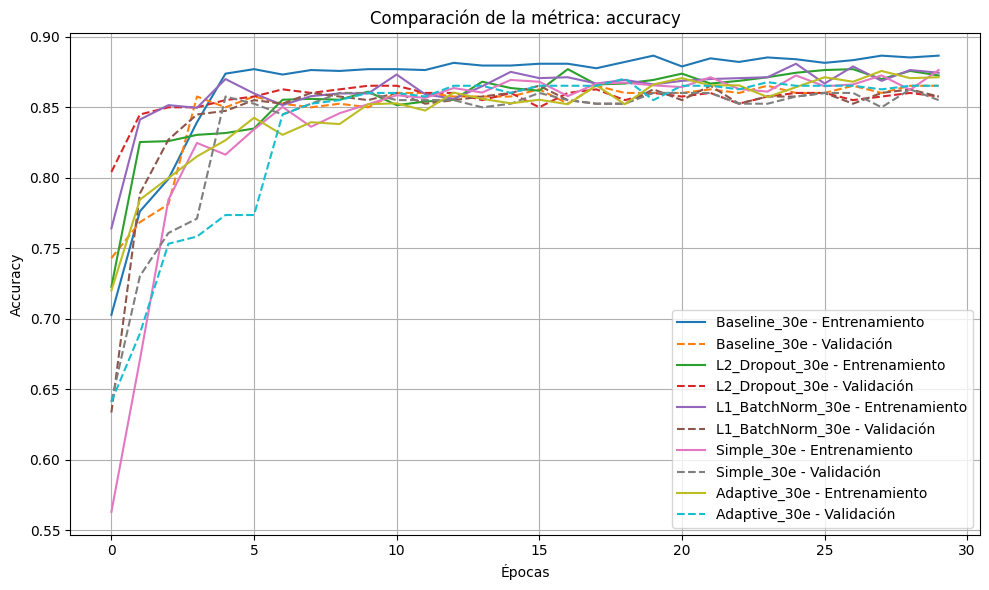

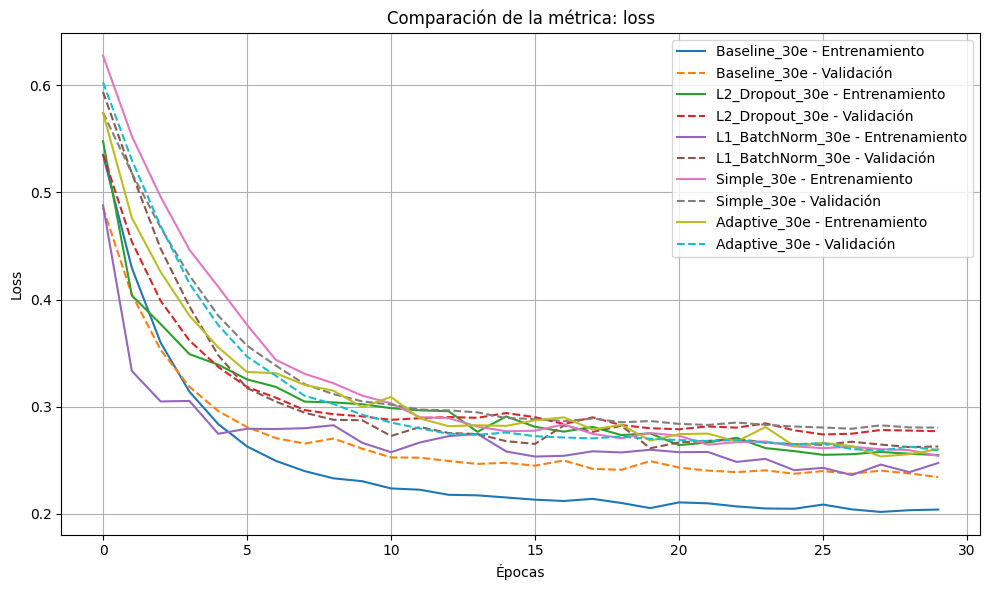

In [466]:
# Gráfico de accuracy
plot_history(histories_30, metric='accuracy')  # Comparación de precisión

# Gráfico de pérdida
plot_history(histories_30, metric='loss')      # Comparación de función de pérdida

1. Baseline (Azul)

- Accuracy: 88% (el más alto y consistente)
- Loss: El más bajo (~0.20-0.22) y más estable
- Convergencia: Rápida y suave
- Generalización: Excelente - gap mínimo entre train/validation
- Estabilidad: Sin fluctuaciones, muy predecible

2. L2_Dropout (Verde)

- Accuracy: 87% (bueno pero menor que Baseline)
- Loss: 0.26-0.28 (mayor que Baseline)
- Comportamiento: Estable pero no supera al simple

3. Simple (Rosa)

- Accuracy: 87% (similar a L2_Dropout)
- Loss: 0.25-0.27 (intermedio)
- Convergencia: Más lenta al inicio

4. L1_BatchNorm (Morado)

- Accuracy: ~86-87% (menor que los anteriores)
- Loss: ~0.27-0.29 (más alto)
- Problema: Más fluctuante en validación

5. Adaptive (Amarillo/Cian)

- Accuracy: ~86% (el más bajo)
- Loss: ~0.27-0.29 (el más alto)
- Convergencia: La más lenta y errática

Conclusión definitiva:
El modelo Baseline es claramente superior en todos los aspectos:

- Mayor accuracy final
- Menor loss (diferencia significativa)
- Mejor generalización
- Mayor estabilidad
- Convergencia más eficiente

**Lección importante:**

Para el dataset (2000 registros, 20 features), la simplicidad gana. Las técnicas de regularización adicionales no solo no mejoran el rendimiento, sino que lo empeoran ligeramente. El modelo baseline encuentra el equilibrio perfecto entre complejidad y capacidad de generalización.

PRIMERA VERSIÓN

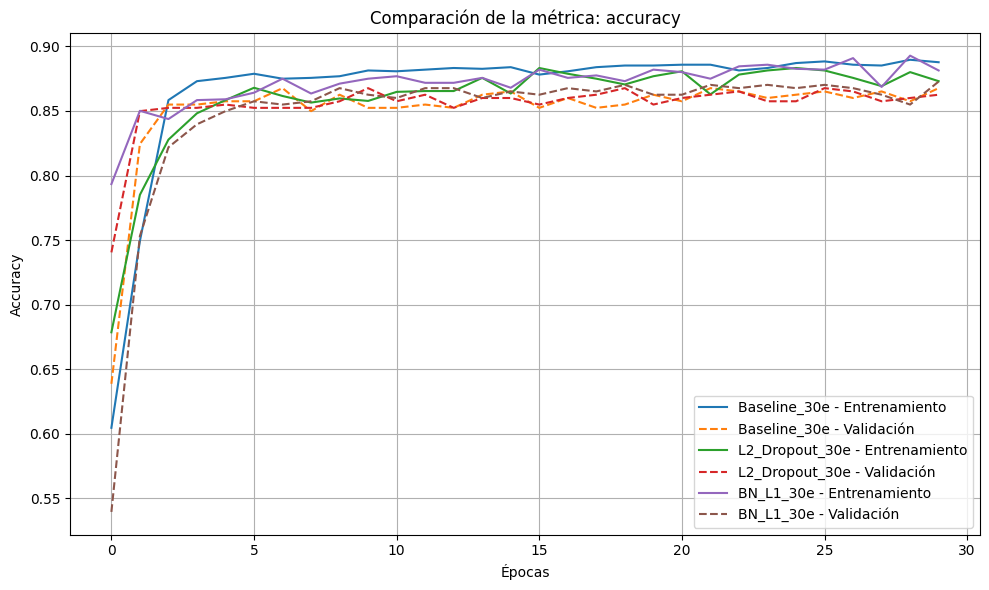

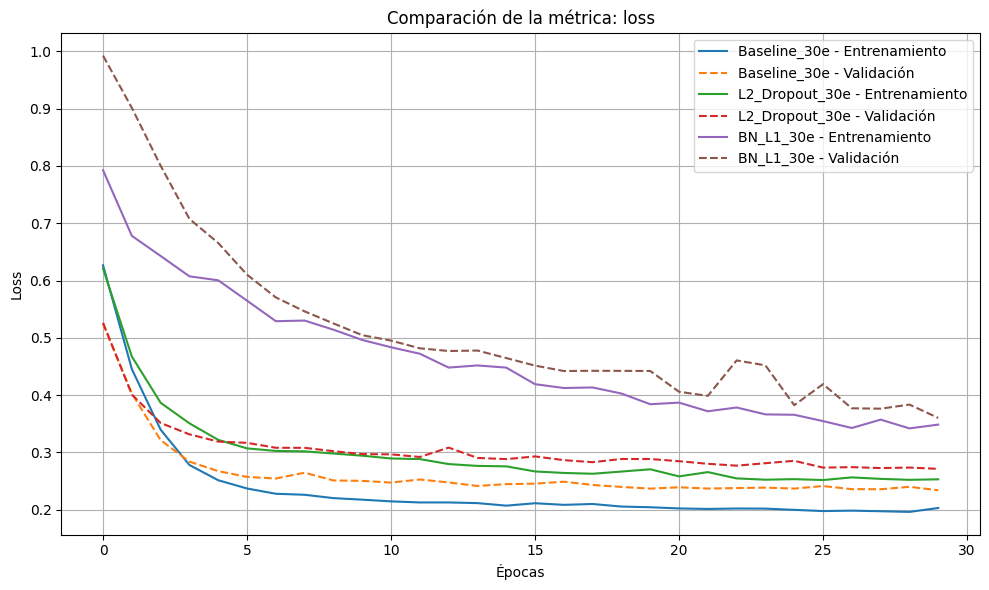

In [ ]:
# Gráfico de accuracy
plot_history(histories_30, metric='accuracy')  # Comparación de precisión

# Gráfico de pérdida
plot_history(histories_30, metric='loss')      # Comparación de función de pérdida

SEGUNDA VERSIÓN

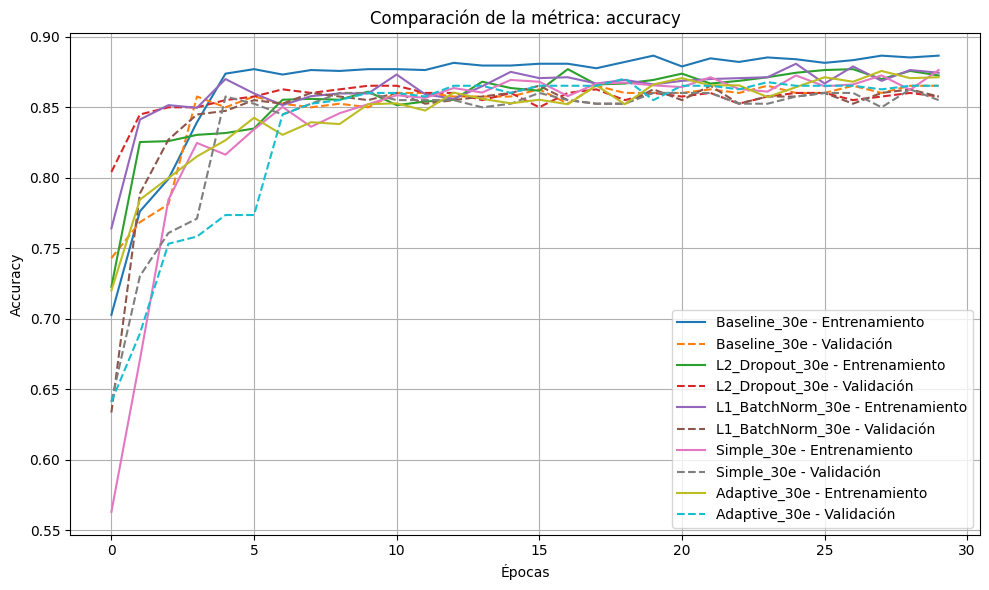

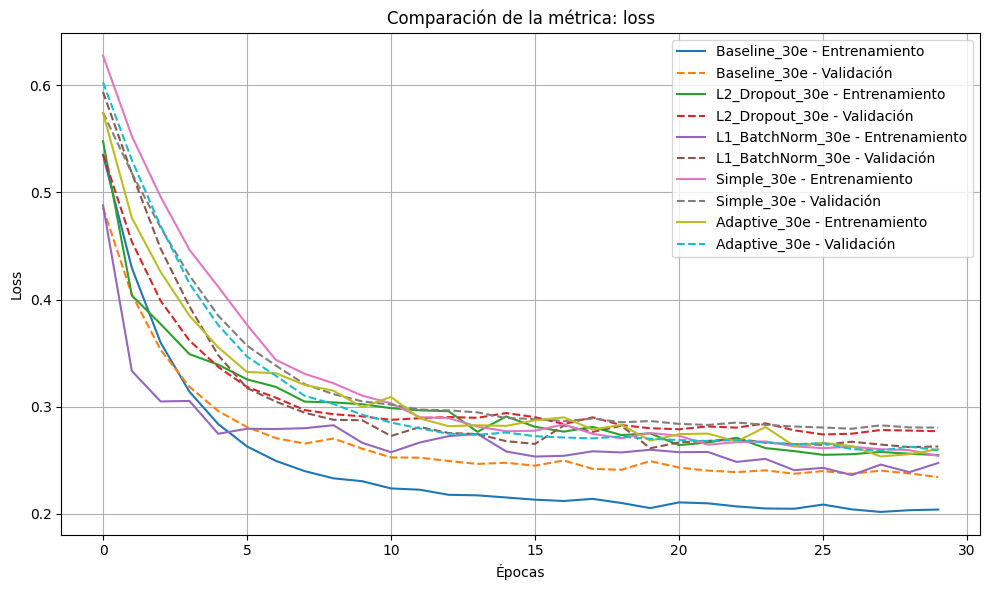

In [ ]:
# Gráfico de accuracy
plot_history(histories_30, metric='accuracy')  # Comparación de precisión

# Gráfico de pérdida
plot_history(histories_30, metric='loss')      # Comparación de función de pérdida

**INSIGHTS**



**Comparación de mejoras entre versiones**

**Baseline_30e:**
- **Primera imagen:** Loss final ~0.20
- **Segunda imagen:** Loss final ~0.20
- **Resultado:** Sin cambios significativos, rendimiento similar

**L2_Dropout_30e:**
- **Primera imagen:** Loss final ~0.27-0.28
- **Segunda imagen:** Loss final ~0.27
- **Resultado:** Ligera mejora o mantenimiento del rendimiento

**BN_L1_30e → L1_BatchNorm_30e:**
- **Primera imagen (BN_L1):** Comportamiento muy errático, picos de validación hasta ~0.47, inestable
- **Segunda imagen (L1_BatchNorm):** Mucho más estable, convergencia suave, loss final ~0.27
- **Resultado:** **MEJORA DRAMÁTICA** - Este modelo tuvo la mayor mejora

**Conclusión:**
- **Baseline:** No cambió
- **L2_Dropout:** Mejora mínima
- **Batch Normalization + L1:** **Mejora significativa** - pasó de ser el peor modelo (inestable y errático) a ser competitivo y estable

Este es un ejemplo clásico de cómo las técnicas de regularización pueden ser muy sensibles a su implementación correcta.

#### 3.1.3. Evaluación

Como el baseline fue el mejor modelo en ambas versiones, compararemos directamente para identificar el mejor modelo.

In [468]:
# Modelo baseline
def get_model_baseline1():
    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    return model

In [469]:
# Modelo baseline mejorado
def get_model_baseline2():
    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(32, activation='relu'),  # Reducido de 64 a 32
        Dense(16, activation='relu'),  # Reducido de 32 a 16
        Dense(1, activation='sigmoid')
    ])

    return model

In [470]:
# Compilación y entrenamiento del modelo baseline original
model_baseline1 = get_model_baseline1()
model_baseline1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history_baseline1 = model_baseline1.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=30,
    batch_size=32,
    verbose=1
)

Epoch 1/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.6282 - loss: 0.5991 - val_accuracy: 0.7659 - val_loss: 0.4575
Epoch 2/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7559 - loss: 0.4192 - val_accuracy: 0.7812 - val_loss: 0.3571
Epoch 3/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.8191 - loss: 0.3194 - val_accuracy: 0.8575 - val_loss: 0.2990
Epoch 4/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8771 - loss: 0.2748 - val_accuracy: 0.8575 - val_loss: 0.2734
Epoch 5/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8767 - loss: 0.2421 - val_accuracy: 0.8601 - val_loss: 0.2612
Epoch 6/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8788 - loss: 0.2393 - val_accuracy: 0.8601 - val_loss: 0.2592
Epoch 7/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8900 - loss: 0.2161 - val_accuracy: 0.8524 - val_loss: 0.2534
Epoch 8/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8767 - loss: 0.2277 - val_accuracy: 0.8601 - val_loss

In [471]:
# Compilación y entrenamiento del modelo baseline mejorado
model_baseline2 = get_model_baseline2()
model_baseline2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history_baseline2 = model_baseline2.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=30,
    batch_size=32,
    verbose=1
)

Epoch 1/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6589 - loss: 0.6189 - val_accuracy: 0.7379 - val_loss: 0.5030
Epoch 2/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7650 - loss: 0.4595 - val_accuracy: 0.7761 - val_loss: 0.4154
Epoch 3/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8121 - loss: 0.3787 - val_accuracy: 0.7863 - val_loss: 0.3584
Epoch 4/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8375 - loss: 0.3106 - val_accuracy: 0.8142 - val_loss: 0.3230
Epoch 5/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8411 - loss: 0.3023 - val_accuracy: 0.8524 - val_loss: 0.2945
Epoch 6/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8632 - loss: 0.2760 - val_accuracy: 0.8626 - val_loss: 0.2784
Epoch 7/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8892 - loss: 0.2431 - val_accuracy: 0.8550 - val_loss: 0.2673
Epoch 8/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8644 - loss: 0.2427 - val_accuracy: 0.8601 - val_loss

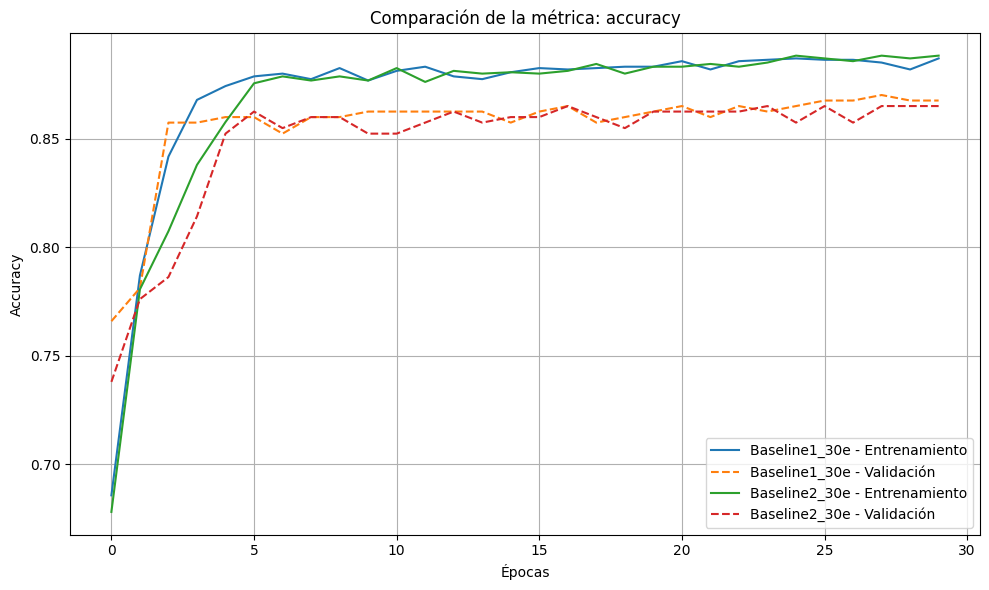

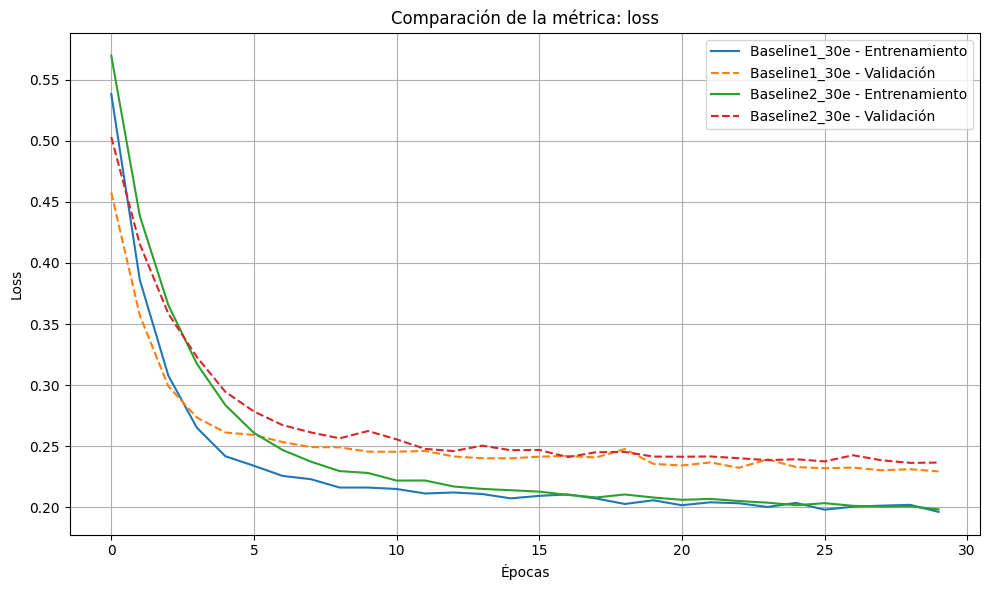

In [472]:
# Diccionario con los histories
histories = {
    'Baseline1_30e': history_baseline1,
    'Baseline2_30e': history_baseline2
}

# Comparar precisión
plot_history(histories, metric='accuracy')

# Comparar pérdida
plot_history(histories, metric='loss')

**Convergencia:**

- Baseline1: Convergencia ligeramente más rápida en las primeras épocas
- Baseline2: Convergencia más gradual pero alcanza el mismo punto final

**Estabilidad:**

- Baseline1: Curvas más suaves, menos fluctuaciones
- Baseline2: Ligeramente más fluctuaciones, especialmente en validación

In [474]:
model_baseline1.save('modelo_baseline1.keras')
model_baseline2.save('modelo_baseline2.keras')

 1/13 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 8 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
📊 Classification Report:
              precision    recall  f1-score   support

           0     0.9778    0.7293    0.8354       181
           1     0.8101    0.9858    0.8894       212

    accuracy                         0.8677       393
   macro avg     0.8939    0.8576    0.8624       393
weighted avg     0.8873    0.8677    0.8645       393

🔵 ROC AUC: 0.9647


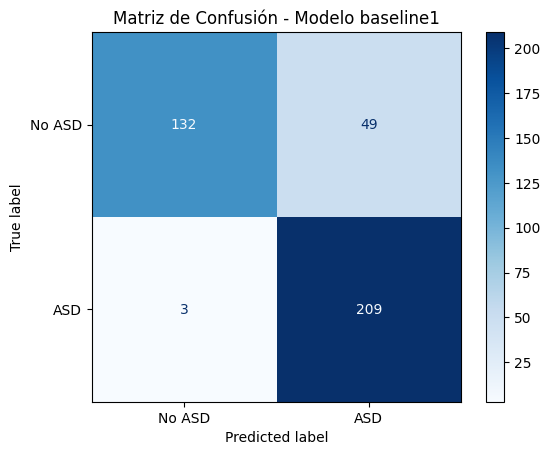

In [520]:
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# 1. Cargar el modelo
model = load_model('modelo_baseline1.keras')

# 2. Predicciones sobre el conjunto de prueba
y_pred_prob = model.predict(X_val)
y_pred = (y_pred_prob > 0.5).astype(int)

# 3. Reporte de métricas
print("📊 Classification Report:")
print(classification_report(y_val, y_pred, digits=4))

# 4. ROC AUC (manual porque no está en el classification_report si binario)
roc_auc = roc_auc_score(y_test, y_pred_prob)
print(f"🔵 ROC AUC: {roc_auc:.4f}")

# 5. Matriz de Confusión
cm = confusion_matrix(y_val, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No ASD", "ASD"])
disp.plot(cmap='Blues')
plt.title("Matriz de Confusión - Modelo baseline1")
plt.grid(False)
plt.show()

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
📊 Classification Report:
              precision    recall  f1-score   support

           0     0.9776    0.7238    0.8317       181
           1     0.8069    0.9858    0.8875       212

    accuracy                         0.8651       393
   macro avg     0.8923    0.8548    0.8596       393
weighted avg     0.8855    0.8651    0.8618       393

🔵 ROC AUC: 0.9630


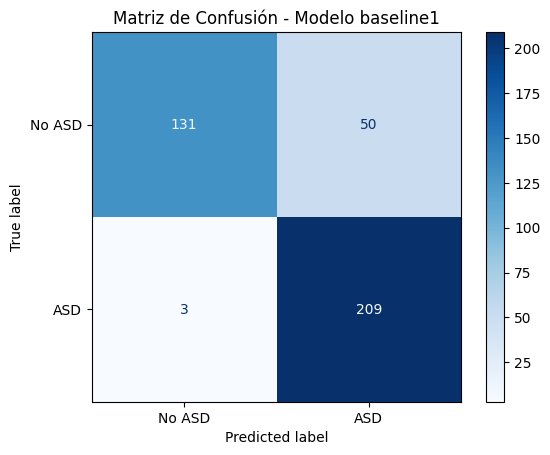

In [691]:
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# 1. Cargar el modelo
model = load_model('modelo_baseline2.keras')

# 2. Predicciones sobre el conjunto de prueba
y_pred_prob = model.predict(X_val)
y_pred = (y_pred_prob > 0.5).astype(int)

# 3. Reporte de métricas
print("📊 Classification Report:")
print(classification_report(y_val, y_pred, digits=4))

# 4. ROC AUC (manual porque no está en el classification_report si binario)
roc_auc = roc_auc_score(y_test, y_pred_prob)
print(f"🔵 ROC AUC: {roc_auc:.4f}")

# 5. Matriz de Confusión
cm = confusion_matrix(y_val, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No ASD", "ASD"])
disp.plot(cmap='Blues')
plt.title("Matriz de Confusión - Modelo baseline1")
plt.grid(False)
plt.show()

### 3.2. MODELO CON DATASET BASE + CLINICO (TRANSFER LEARNING)

#### 3.2.1. Pre-entrenamiento (DATASET 6000 REGISTROS)

In [477]:
df_base

,A1,A2,A3,A4,A5,A6,A7,A8,A9,Qchat_10_Score,Sex_M,Asd_Traits
0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.5,1.0,0.0
1,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.6,1.0,0.0
2,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.9,0.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.8,0.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
5223,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.0
5224,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.5,1.0,0.0
5225,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9,1.0,0.0
5226,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.3,1.0,0.0


División en conjunto de entrenamiento y validación

In [531]:
# División del dataset
X = df_base.drop(columns=["Asd_Traits"])
y = df_base["Asd_Traits"]

# División en conjunto de entrenamiento y validación (80% train / 20% val)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [532]:
X.shape

(5228, 11)

In [533]:
y.shape

(5228,)

In [483]:
y.value_counts()

,count
Asd_Traits,
0.0,3686
1.0,1542


In [484]:
y.value_counts(normalize = True)

,proportion
Asd_Traits,
0.0,0.70505
1.0,0.29495


##### 3.2.1.1. Balanceo de clases (SMOTE)

In [485]:
from imblearn.over_sampling import SMOTE

# Aplicar SMOTE solo al conjunto de entrenamiento
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Mostrar distribución después del resampleo
import pandas as pd
print(pd.Series(y_train_resampled).value_counts())

Asd_Traits
0.0    2949
1.0    2949
Name: count, dtype: int64


##### 3.2.1.2. Modelo

In [498]:
from keras.models import Sequential
from keras.layers import Dense, Input, Dropout
from keras.optimizers import Adam
from keras.regularizers import l1
from keras.regularizers import l2

# Arquitectura para preentrenamiento (modelo base)
def get_pretrained_model_base():
    model = Sequential([
        Input(shape=(X_train_resampled.shape[1],)),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    return model

def get_pretrained_model_no_dropout():
    model = Sequential([
        Input(shape=(X_train_resampled.shape[1],)),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    return model


def get_pretrained_model_l2():
    model = Sequential([
        Input(shape=(X_train_resampled.shape[1],)),
        Dense(64, activation='relu', kernel_regularizer=l2(0.001)),
        Dropout(0.3),
        Dense(32, activation='relu', kernel_regularizer=l2(0.001)),
        Dense(1, activation='sigmoid')
    ])
    return model

def get_pretrained_model_l1_light():
    model = Sequential([
        Input(shape=(X_train_resampled.shape[1],)),
        Dense(48, activation='relu', kernel_regularizer=l1(0.0005)),
        Dropout(0.2),
        Dense(24, activation='relu', kernel_regularizer=l1(0.0005)),
        Dense(1, activation='sigmoid')
    ])
    return model

##### 3.2.1.3. Entrenamiento

In [499]:
# Modelo 1: Base (con Dropout)
model_base = get_pretrained_model_base()
model_base.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history_base = model_base.fit(X_train_resampled, y_train_resampled,
                              validation_data=(X_val, y_val),
                              epochs=50, batch_size=32, verbose=1)

# Modelo 2: Sin Dropout
model_no_dropout = get_pretrained_model_no_dropout()
model_no_dropout.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history_no_dropout = model_no_dropout.fit(X_train_resampled, y_train_resampled,
                                          validation_data=(X_val, y_val),
                                          epochs=50, batch_size=32, verbose=1)

# Modelo 3: L2 regularization
model_l2 = get_pretrained_model_l2()
model_l2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history_l2 = model_l2.fit(X_train_resampled, y_train_resampled,
                          validation_data=(X_val, y_val),
                          epochs=50, batch_size=32, verbose=1)

# Modelo 4: L1 regularization + arquitectura ligera
model_l1_light = get_pretrained_model_l1_light()
model_l1_light.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history_l1_light = model_l1_light.fit(X_train_resampled, y_train_resampled,
                                      validation_data=(X_val, y_val),
                                      epochs=50, batch_size=32, verbose=1)

Epoch 1/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6721 - loss: 0.5831 - val_accuracy: 0.8623 - val_loss: 0.3507
Epoch 2/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8808 - loss: 0.2965 - val_accuracy: 0.8709 - val_loss: 0.3449
Epoch 3/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.8996 - loss: 0.2656 - val_accuracy: 0.8948 - val_loss: 0.2923
Epoch 4/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.9161 - loss: 0.2347 - val_accuracy: 0.8929 - val_loss: 0.2963
Epoch 5/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9225 - loss: 0.2182 - val_accuracy: 0.8939 - val_loss: 0.2716
Epoch 6/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9279 - loss: 0.2099 - val_accuracy: 0.8967 - val_loss: 0.2536
Epoch 7/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9264 - loss: 0.2064 - val_accuracy: 0.8958 - val_loss: 0.2622
Epoch 8/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9288 - loss: 0.2117 - val_accuracy: 0

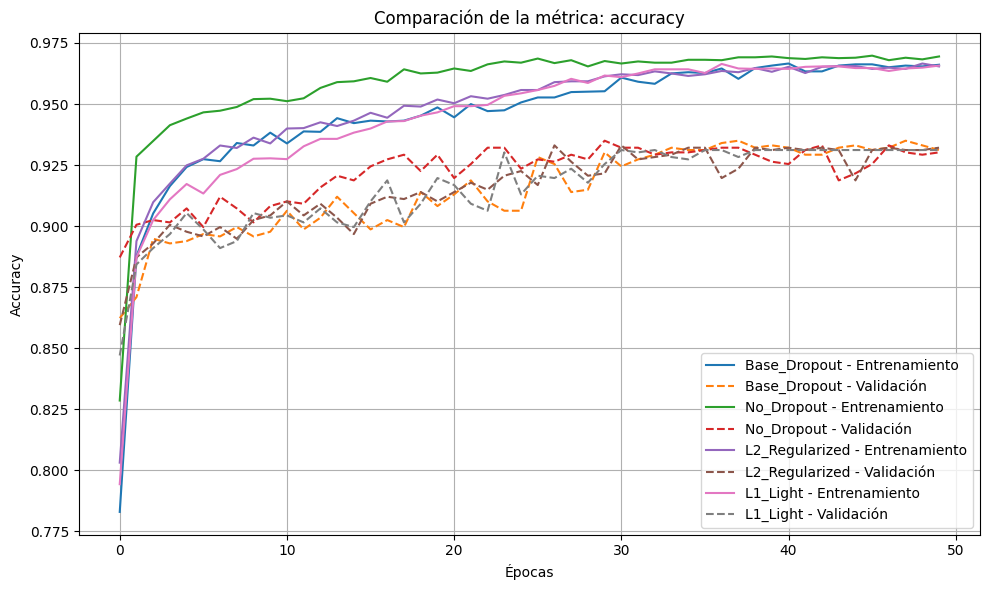

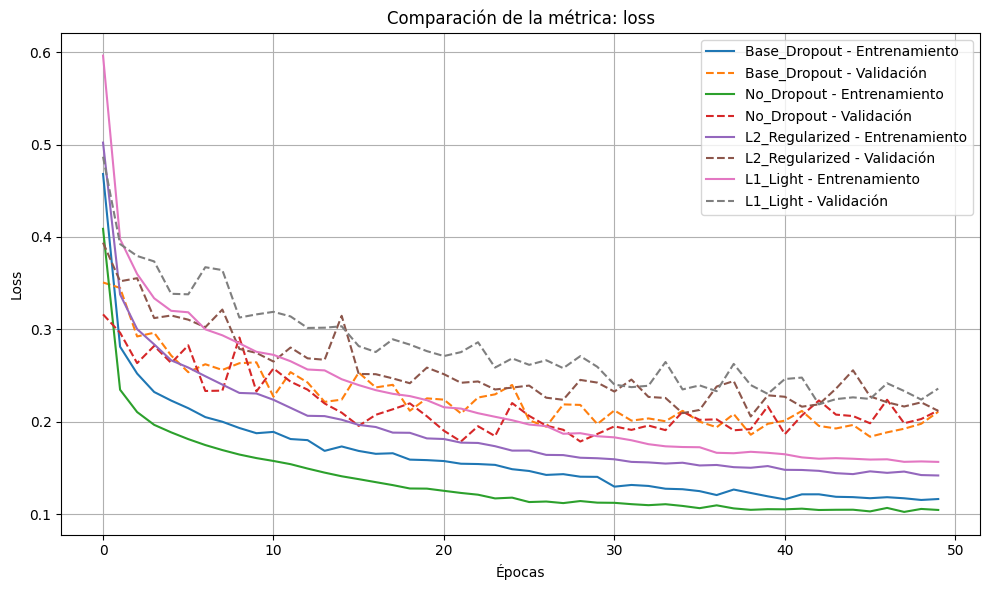

In [502]:
# Diccionario con los histories de los 4 modelos preentrenados
histories_pretrained = {
    'Base_Dropout': history_base,
    'No_Dropout': history_no_dropout,
    'L2_Regularized': history_l2,
    'L1_Light': history_l1_light
}

# Comparar accuracy
plot_history(histories_pretrained, metric='accuracy')

# Comparar loss
plot_history(histories_pretrained, metric='loss')

**Justificación del learning rate**

Se utilizó un learning rate más bajo (0.0001) en lugar del valor por defecto (0.001) con el objetivo de mejorar la estabilidad del entrenamiento, especialmente al trabajar con un conjunto de datos clínicos ya balanceado con SMOTE. Un paso de aprendizaje más pequeño permite que el modelo ajuste sus pesos de manera más gradual, reduciendo el riesgo de fluctuaciones fuertes en la función de pérdida y evitando oscilaciones indeseadas. Esto resulta útil para favorecer una convergencia más estable y controlada, lo cual es clave cuando se busca optimizar el desempeño del modelo sin caer en sobreajuste prematuro, particularmente durante entrenamientos prolongados como los de 50 épocas.

In [505]:
# Configurar Adam optimizer con learning rate más bajo
from tensorflow.keras.optimizers import Adam

# Configuración del optimizer y callbacks
adam_optimizer = Adam(learning_rate=0.0001)  # Learning rate más bajo para estabilidad

# Modelo 1: Base (con Dropout)
model_base = get_pretrained_model_base()
model_base.compile(optimizer=adam_optimizer, loss='binary_crossentropy', metrics=['accuracy'])
history_base = model_base.fit(X_train_resampled, y_train_resampled,
                             validation_data=(X_val, y_val),
                             epochs=50, batch_size=32, verbose=1)

# Modelo 2: Sin Dropout
model_no_dropout = get_pretrained_model_no_dropout()
model_no_dropout.compile(optimizer=adam_optimizer, loss='binary_crossentropy', metrics=['accuracy'])
history_no_dropout = model_no_dropout.fit(X_train_resampled, y_train_resampled,
                                         validation_data=(X_val, y_val),
                                         epochs=50, batch_size=32, verbose=1)

# Modelo 3: L2 regularization
model_l2 = get_pretrained_model_l2()
model_l2.compile(optimizer=adam_optimizer, loss='binary_crossentropy', metrics=['accuracy'])
history_l2 = model_l2.fit(X_train_resampled, y_train_resampled,
                         validation_data=(X_val, y_val),
                         epochs=50, batch_size=32, verbose=1)

# Modelo 4: L1 regularization + arquitectura ligera
model_l1_light = get_pretrained_model_l1_light()
model_l1_light.compile(optimizer=adam_optimizer, loss='binary_crossentropy', metrics=['accuracy'])
history_l1_light = model_l1_light.fit(X_train_resampled, y_train_resampled,
                                     validation_data=(X_val, y_val),
                                     epochs=50, batch_size=32, verbose=1)

Epoch 1/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5334 - loss: 0.6978 - val_accuracy: 0.5927 - val_loss: 0.6626
Epoch 2/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7190 - loss: 0.6095 - val_accuracy: 0.7151 - val_loss: 0.6118
Epoch 3/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7920 - loss: 0.5479 - val_accuracy: 0.7667 - val_loss: 0.5502
Epoch 4/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8235 - loss: 0.4871 - val_accuracy: 0.8136 - val_loss: 0.4807
Epoch 5/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.8428 - loss: 0.4325 - val_accuracy: 0.8279 - val_loss: 0.4365
Epoch 6/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.8468 - loss: 0.4071 - val_accuracy: 0.8413 - val_loss: 0.4030
Epoch 7/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.8565 - loss: 0.3756 - val_accuracy: 0.8442 - val_loss: 0.3847
Epoch 8/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.8699 - loss: 0.3483 - val_accuracy: 0.

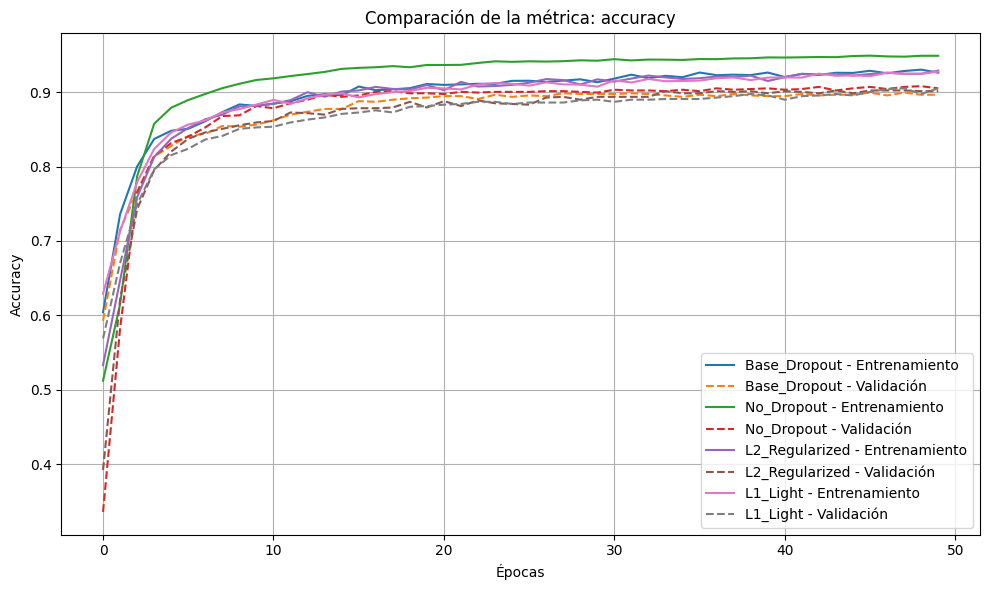

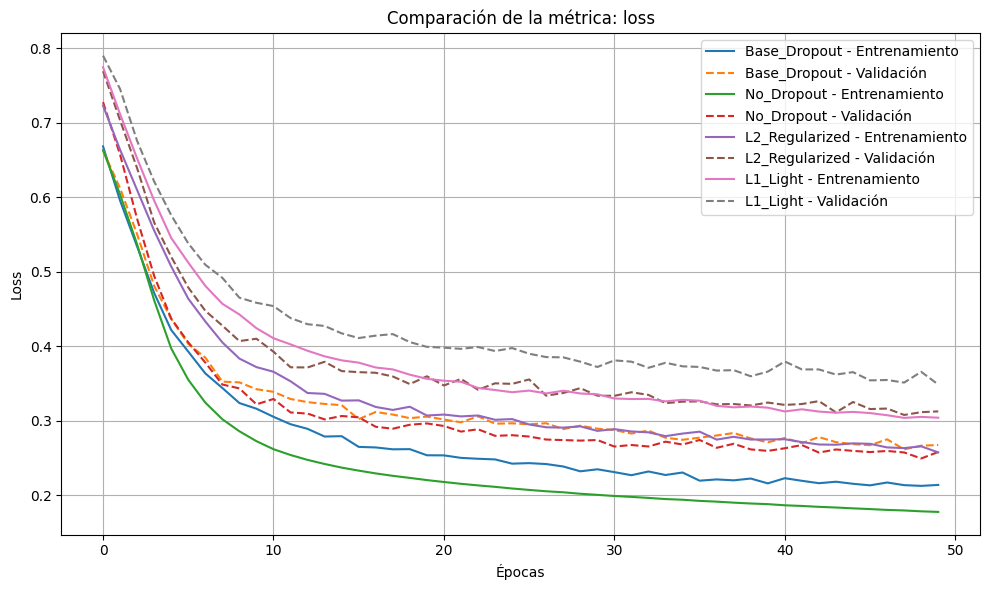

In [506]:
# Diccionario con los histories de los 4 modelos preentrenados
histories_pretrained = {
    'Base_Dropout': history_base,
    'No_Dropout': history_no_dropout,
    'L2_Regularized': history_l2,
    'L1_Light': history_l1_light
}

# Comparar accuracy
plot_history(histories_pretrained, metric='accuracy')

# Comparar loss
plot_history(histories_pretrained, metric='loss')

En ambos la el modelo No_Dropout mostró los mejores resultados.

##### 3.2.1.4. Evaluación

In [507]:
# Modelo 2: Sin Dropout
model_no_dropout_1 = get_pretrained_model_no_dropout()
model_no_dropout_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history_no_dropout_1 = model_no_dropout_1.fit(X_train_resampled, y_train_resampled,
                                          validation_data=(X_val, y_val),
                                          epochs=50, batch_size=32, verbose=1)

Epoch 1/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6462 - loss: 0.5812 - val_accuracy: 0.8595 - val_loss: 0.3538
Epoch 2/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9130 - loss: 0.2606 - val_accuracy: 0.8920 - val_loss: 0.3057
Epoch 3/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9290 - loss: 0.2339 - val_accuracy: 0.9044 - val_loss: 0.2705
Epoch 4/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9366 - loss: 0.2105 - val_accuracy: 0.8958 - val_loss: 0.3066
Epoch 5/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9357 - loss: 0.2082 - val_accuracy: 0.9092 - val_loss: 0.2491
Epoch 6/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9358 - loss: 0.1911 - val_accuracy: 0.9063 - val_loss: 0.2496
Epoch 7/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9427 - loss: 0.1809 - val_accuracy: 0.8967 - val_loss: 0.2661
Epoch 8/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9426 - loss: 0.1797 - val_accuracy: 0.

In [508]:
# Configuración del optimizer y callbacks
adam_optimizer = Adam(learning_rate=0.0001)  # Learning rate más bajo para estabilidad

# Modelo 2: Sin Dropout
model_no_dropout_2 = get_pretrained_model_no_dropout()
model_no_dropout_2.compile(optimizer=adam_optimizer, loss='binary_crossentropy', metrics=['accuracy'])
history_no_dropout_2 = model_no_dropout_2.fit(X_train_resampled, y_train_resampled,
                                         validation_data=(X_val, y_val),
                                         epochs=50, batch_size=32, verbose=1)

Epoch 1/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5592 - loss: 0.6593 - val_accuracy: 0.4828 - val_loss: 0.6813
Epoch 2/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6784 - loss: 0.6016 - val_accuracy: 0.7667 - val_loss: 0.5942
Epoch 3/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8430 - loss: 0.5200 - val_accuracy: 0.8308 - val_loss: 0.5086
Epoch 4/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8863 - loss: 0.4458 - val_accuracy: 0.8346 - val_loss: 0.4530
Epoch 5/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8840 - loss: 0.3957 - val_accuracy: 0.8499 - val_loss: 0.4000
Epoch 6/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8874 - loss: 0.3501 - val_accuracy: 0.8518 - val_loss: 0.3824
Epoch 7/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8972 - loss: 0.3141 - val_accuracy: 0.8556 - val_loss: 0.3677
Epoch 8/50
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9037 - loss: 0.2910 - val_accuracy: 0.

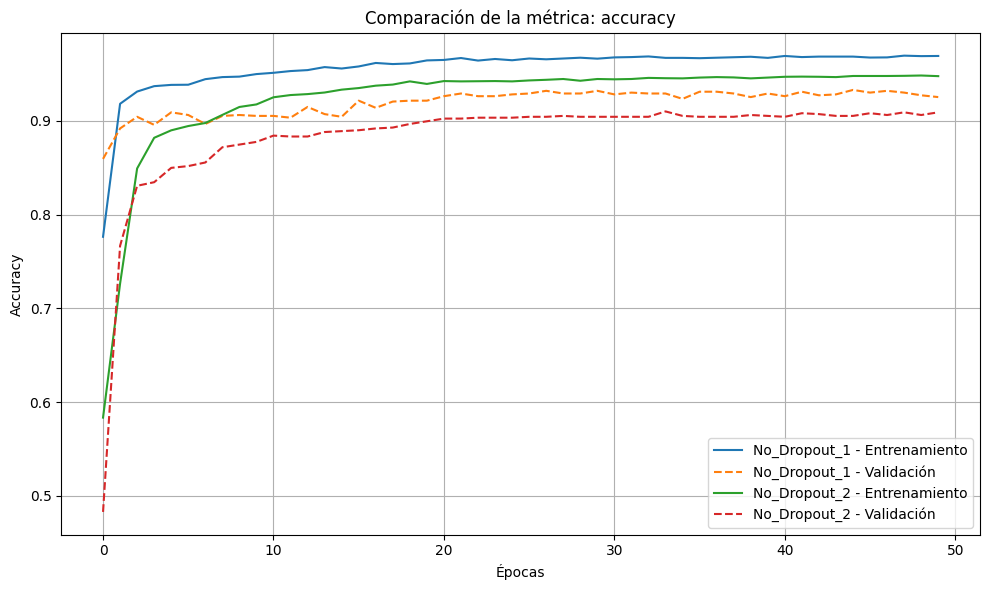

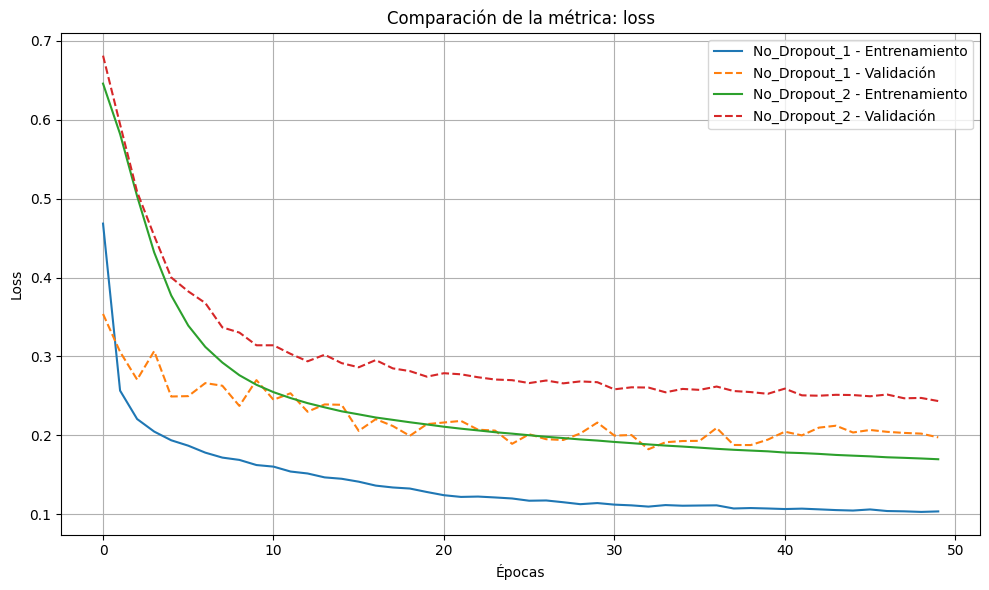

In [509]:
# Diccionario con los histories
histories = {
    'No_Dropout_1': history_no_dropout_1,
    'No_Dropout_2': history_no_dropout_2
}

# Comparar precisión
plot_history(histories, metric='accuracy')

# Comparar pérdida
plot_history(histories, metric='loss')

Ambos modelos logran una alta precisión en los datos de validación, pero se evidencian diferencias clave en su comportamiento. No_Dropout_1, que utilizó el learning rate por defecto (0.001), mostró una rápida convergencia pero con fluctuaciones notables en las métricas de validación, lo cual sugiere un mayor riesgo de sobreajuste. En contraste, No_Dropout_2 fue entrenado con un learning rate más bajo (0.0001), lo que permitió una convergencia más progresiva y estable, especialmente visible en la suavidad de la curva de pérdida de validación. Aunque su precisión es ligeramente menor en algunos puntos, el comportamiento más estable y controlado de No_Dropout_2 lo convierte en una mejor opción si se prioriza la generalización y robustez del modelo frente a nuevas muestras.

In [510]:
model_no_dropout_2.save('model_no_dropout_2.keras')

In [514]:
model_no_dropout_1.save('model_no_dropout_1.keras')

33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
📋 Classification Report:

              precision    recall  f1-score   support

         0.0       0.99      0.91      0.94       737
         1.0       0.81      0.97      0.88       309

    accuracy                           0.93      1046
   macro avg       0.90      0.94      0.91      1046
weighted avg       0.93      0.93      0.93      1046



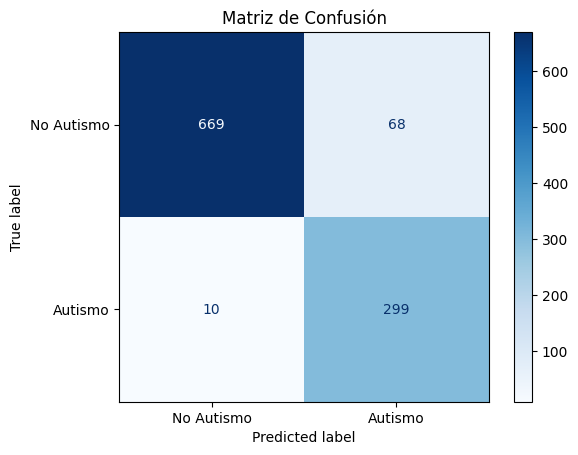


🔍 ROC AUC: 0.9700


In [540]:
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# 1. Cargar el modelo
model = load_model('model_no_dropout_1.keras')

# 2. Realizar predicciones sobre el conjunto de validación
y_pred_probs = model.predict(X_val)  # Probabilidades
y_pred = (y_pred_probs >= 0.5).astype(int)  # Clasificación binaria

# 3. Reporte de clasificación
print("📋 Classification Report:\n")
print(classification_report(y_val, y_pred))

# 4. Matriz de confusión
cm = confusion_matrix(y_val, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Autismo", "Autismo"])
disp.plot(cmap="Blues")
plt.title("Matriz de Confusión")
plt.show()

# 5. ROC AUC
roc_auc = roc_auc_score(y_val, y_pred_probs)
print(f"\n🔍 ROC AUC: {roc_auc:.4f}")


33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
📋 Classification Report:

              precision    recall  f1-score   support

         0.0       0.99      0.88      0.93       737
         1.0       0.77      0.98      0.86       309

    accuracy                           0.91      1046
   macro avg       0.88      0.93      0.90      1046
weighted avg       0.93      0.91      0.91      1046



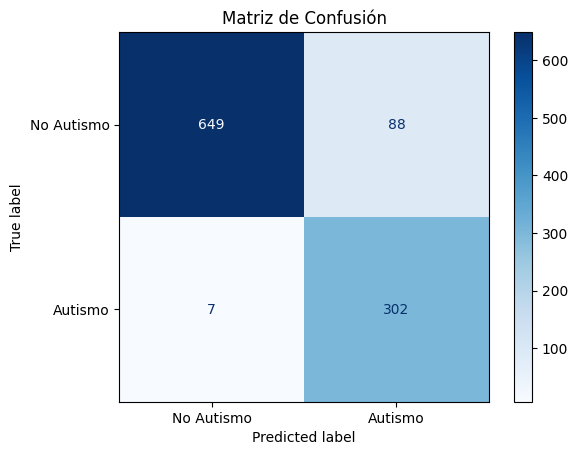


🔍 ROC AUC: 0.9571


In [576]:
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# 1. Cargar el modelo
model = load_model('model_no_dropout_2.keras')

# 2. Realizar predicciones sobre el conjunto de validación
y_pred_probs = model.predict(X_val)  # Probabilidades
y_pred = (y_pred_probs >= 0.5).astype(int)  # Clasificación binaria

# 3. Reporte de clasificación
print("📋 Classification Report:\n")
print(classification_report(y_val, y_pred))

# 4. Matriz de confusión
cm = confusion_matrix(y_val, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Autismo", "Autismo"])
disp.plot(cmap="Blues")
plt.title("Matriz de Confusión")
plt.show()

# 5. ROC AUC
roc_auc = roc_auc_score(y_val, y_pred_probs)
print(f"\n🔍 ROC AUC: {roc_auc:.4f}")


Aunque ambos modelos presentan un rendimiento similar en recall para la clase 1 (autismo), Model_no_dropout_1 logra un mejor equilibrio entre precision y recall, lo que se refleja en un F1-score más alto (0.88 vs 0.86). Además, su mayor precisión (81% vs 77%) implica una menor tasa de falsos positivos, lo cual es crucial en contextos clínicos donde los falsos positivos pueden derivar en sobre-diagnósticos innecesarios.

Finalmente, el ROC AUC más alto (0.9700) indica que Model_no_dropout_1 tiene una mejor capacidad de discriminación general entre clases. En conjunto, estas métricas sugieren que es un modelo más confiable, equilibrado y clínicamente más seguro para detección de rasgos autistas.

#### 3.2.2. Feature Extraction

In [664]:
from keras.models import load_model, Model
from keras.layers import Dense, Input
from keras.optimizers import Adam

# Cargar el modelo preentrenado secuencial
model_sequential = load_model('model_no_dropout_1.keras')

# Reconstruir como modelo funcional (Sequential no tiene acceso directo a .input sin haber sido llamado)
input_layer = Input(shape=(model_sequential.input_shape[1],))

# Congelar y aplicar la primera capa
model_sequential.layers[0].trainable = False  # CORREGIDO: congelar explícitamente
x = model_sequential.layers[0](input_layer)

# Congelar y aplicar las capas ocultas restantes (excepto la última capa original)
for layer in model_sequential.layers[1:-1]:
    layer.trainable = False
    x = layer(x)

# Nueva capa de salida adaptada al nuevo problema
new_output = Dense(1, activation='sigmoid')(x)

# Modelo final de feature extraction
model_feature_extraction = Model(inputs=input_layer, outputs=new_output)

# Compilación
model_feature_extraction.compile(optimizer=Adam(learning_rate=0.0001),
                                 loss='binary_crossentropy',
                                 metrics=['accuracy'])

# Ver resumen del modelo
model_feature_extraction.summary()

Model: "functional_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_163 (InputLayer)    │ (None, 11)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 64)             │           768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,881 (11.25 KB)

 Trainable params: 33 (132.00 B)

 Non-trainable params: 2,848 (11.12 KB)

A continuación, se describe paso a paso el proceso de feature extraction aplicado al modelo preentrenado utilizando Keras:

- **Reconstrucción del modelo original:** Se recrea la arquitectura del modelo preentrenado (model_no_dropout_1.keras) de forma funcional, capa por capa, utilizando la clase Input() de Keras para definir explícitamente el flujo de datos. Esto permite acceder y modificar sus capas internas sin errores de grafo.

- **Congelación de capas ocultas:** Todas las capas ocultas (exceptuando la capa de salida original) se recorren y se marcan como no entrenables (trainable = False). Esto asegura que durante el nuevo entrenamiento, los pesos previamente aprendidos no se modifiquen, manteniendo las representaciones generales aprendidas.

- **Reemplazo de la capa de salida:** Se elimina la capa de salida original y se añade una nueva capa Dense(1, activation='sigmoid'), adaptada a la nueva tarea clínica. Esta capa será la única entrenada durante el proceso de feature extraction.

- **Construcción del nuevo modelo funcional:** Se construye un nuevo modelo (model_feature_extraction) que mantiene la arquitectura congelada hasta la última capa oculta, pero termina en la nueva salida. Esto permite reutilizar el conocimiento anterior para una nueva base de datos más especializada.

- **Compilación del modelo:** Se compila el modelo con el optimizador Adam y una tasa de aprendizaje reducida (learning_rate=0.0001).
Esto se hace para que el ajuste sobre el nuevo conjunto clínico sea más estable y progresivo, evitando oscilaciones bruscas en la función de pérdida.



In [550]:
df_base

,A1,A2,A3,A4,A5,A6,A7,A8,A9,Qchat_10_Score,Sex_M,Asd_Traits
0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.5,1.0,0.0
1,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.6,1.0,0.0
2,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.9,0.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.8,0.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
5223,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.0
5224,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.5,1.0,0.0
5225,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9,1.0,0.0
5226,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.3,1.0,0.0


In [552]:
df_clinical

,PCA_1,A6,A9,Social_Interaction_Issues_%,A7,A5,Qchat_10_Score,Communication_Issues_%,A4,A1,...,A8,Sex_M,A3,Global_Developmental_Delay_Intellectual_Disability,Speech_Delay_Language_Disorder,Depression,Social_Behavioural_Issues,Anxiety_Disorder,Comorbidity_%,Asd_Traits
0,1.088451,0.0,0.0,0.40,1.0,0.0,0.3,0.6,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0000,0
1,1.579185,1.0,0.0,0.75,1.0,0.0,0.4,0.4,0.0,1.0,...,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0000,1
2,1.374183,0.0,0.0,0.50,1.0,0.0,0.4,0.6,0.0,1.0,...,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0000,1
3,2.163503,1.0,1.0,1.00,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.8571,1
4,2.171407,1.0,1.0,1.00,1.0,1.0,0.9,0.8,1.0,1.0,...,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.8571,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1956,-1.745133,0.0,0.0,0.00,0.0,0.0,0.1,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0
1957,-1.931111,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0
1958,-1.745133,0.0,0.0,0.00,0.0,0.0,0.1,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,1
1959,-1.862742,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0


In [665]:
# Variables usadas en preentrenamiento
features_pretrained = ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9','Qchat_10_Score','Sex_M']

# Preparar inputs clínicos con solo esas columnas
X_clinical = df_clinical[features_pretrained]
y_clinical = df_clinical['Asd_Traits'].astype(int)

# División
X_clinical_train, X_clinical_val, y_clinical_train, y_clinical_val = train_test_split(
    X_clinical, y_clinical, test_size=0.2, stratify=y_clinical, random_state=42
)

In [666]:
# Entrenamiento en nuevo conjunto clínico
history_feature_extraction = model_feature_extraction.fit(
    X_clinical_train, y_clinical_train,
    validation_data=(X_clinical_val, y_clinical_val),
    epochs=50,
    batch_size=32,
    verbose=1
)

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2427 - loss: 0.8271 - val_accuracy: 0.2748 - val_loss: 0.7914
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2447 - loss: 0.7933 - val_accuracy: 0.2774 - val_loss: 0.7666
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2624 - loss: 0.7669 - val_accuracy: 0.2824 - val_loss: 0.7455
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2700 - loss: 0.7462 - val_accuracy: 0.4555 - val_loss: 0.7278
Epoch 5/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4617 - loss: 0.7252 - val_accuracy: 0.4758 - val_loss: 0.7125
Epoch 6/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4655 - loss: 0.7107 - val_accuracy: 0.5191 - val_loss: 0.6995
Epoch 7/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5020 - loss: 0.6996 - val_accuracy: 0.5445 - val_loss: 0.6880
Epoch 8/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5532 - loss: 0.6831 - val_accuracy: 0.6081 - val_loss:

#### 3.2.3. Fine Tuning Parcial

In [667]:
from keras.models import Model
from keras.layers import Dense, Input
from keras.optimizers import Adam

# Entrada para 20 variables clínicas
input_layer = Input(shape=(20,))

# Primera capa nueva, pero podrías inicializarla con pesos similares si quisieras
x = Dense(64, activation='relu')(input_layer)

# Reutilizamos la segunda capa oculta del modelo preentrenado (ajustada a 64 neuronas)
pretrained_layer = model_sequential.layers[1]
pretrained_layer.trainable = True  # hacer fine-tuning parcial
x = pretrained_layer(x)

output = Dense(1, activation='sigmoid')(x)

model_finetuned = Model(inputs=input_layer, outputs=output)

model_finetuned.compile(optimizer=Adam(learning_rate=0.0001),
                        loss='binary_crossentropy',
                        metrics=['accuracy'])


In [668]:
# Datos clínicos con todas las variables (ya escalados)
X_clinical_full = df_clinical.drop(columns=['Asd_Traits'])
y_clinical_full = df_clinical['Asd_Traits'].astype(int)

# División
X_train_ft, X_val_ft, y_train_ft, y_val_ft = train_test_split(
    X_clinical_full, y_clinical_full, test_size=0.2, stratify=y_clinical_full, random_state=42
)

# Empezar desde donde quedó el feature extraction
history_finetuned = model_finetuned.fit(
    X_train_ft, y_train_ft,
    validation_data=(X_val_ft, y_val_ft),
    epochs=50,
    batch_size=32,
    verbose=1
)

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.5315 - loss: 1.2521 - val_accuracy: 0.5394 - val_loss: 1.0517
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5273 - loss: 1.0398 - val_accuracy: 0.5394 - val_loss: 0.8840
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5414 - loss: 0.8492 - val_accuracy: 0.5394 - val_loss: 0.7634
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5446 - loss: 0.7437 - val_accuracy: 0.5394 - val_loss: 0.6828
Epoch 5/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5539 - loss: 0.6384 - val_accuracy: 0.5394 - val_loss: 0.6217
Epoch 6/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5435 - loss: 0.5964 - val_accuracy: 0.6412 - val_loss: 0.5750
Epoch 7/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6635 - loss: 0.5621 - val_accuracy: 0.6438 - val_loss: 0.5405
Epoch 8/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6815 - loss: 0.5072 - val_accuracy: 0.6972 - val_loss:

#### 3.2.4. Evaluación

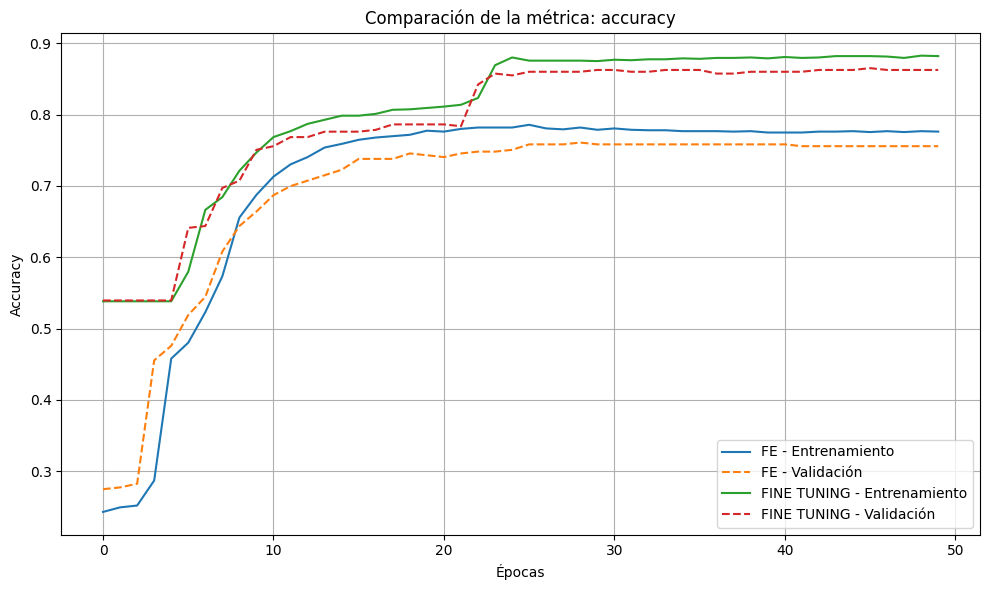

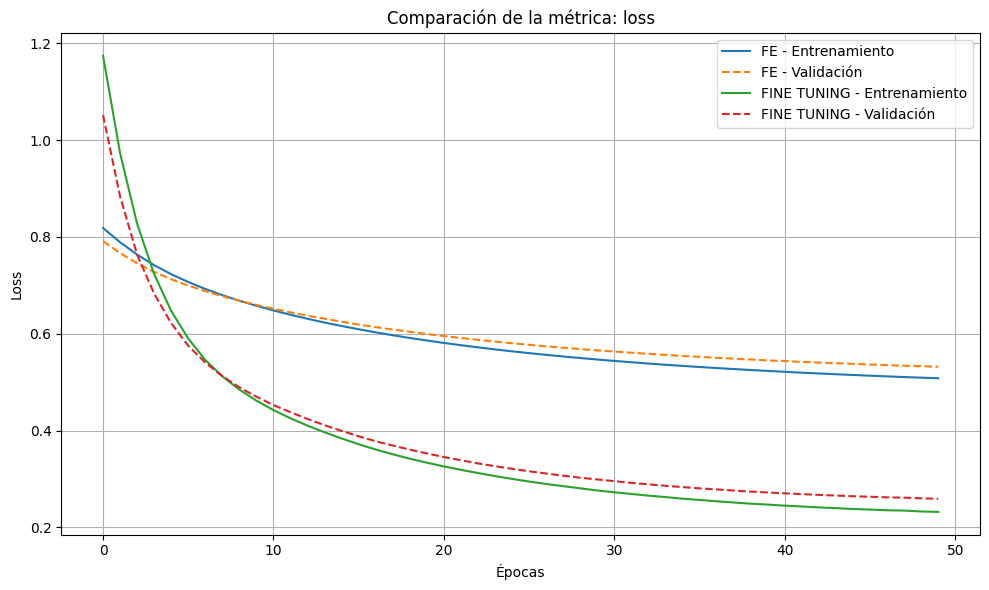

In [669]:
# Diccionario con los histories
histories = {
    'FE': history_feature_extraction,
    'FINE TUNING': history_finetuned
}

# Comparar precisión
plot_history(histories, metric='accuracy')

# Comparar pérdida
plot_history(histories, metric='loss')

## 4. EVALUACIÓN FINAL

In [686]:
# División del dataset
X = df_clinical.drop(columns=["Asd_Traits"])
y = df_clinical["Asd_Traits"]

# División en conjunto de entrenamiento y validación (80% train / 20% val)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [687]:
# Modelo baseline
def get_model_baseline1():
    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    return model

In [688]:
# Compilación y entrenamiento del modelo baseline original
model_baseline1 = get_model_baseline1()
model_baseline1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history_baseline1 = model_baseline1.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,
    batch_size=32,
    verbose=1
)

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6793 - loss: 0.5852 - val_accuracy: 0.7786 - val_loss: 0.4336
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8038 - loss: 0.3891 - val_accuracy: 0.8550 - val_loss: 0.3279
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8669 - loss: 0.2866 - val_accuracy: 0.8702 - val_loss: 0.2842
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8765 - loss: 0.2639 - val_accuracy: 0.8626 - val_loss: 0.2643
Epoch 5/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8687 - loss: 0.2441 - val_accuracy: 0.8575 - val_loss: 0.2545
Epoch 6/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8816 - loss: 0.2231 - val_accuracy: 0.8550 - val_loss: 0.2520
Epoch 7/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8737 - loss: 0.2255 - val_accuracy: 0.8524 - val_loss: 0.2543
Epoch 8/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8741 - loss: 0.2342 - val_accuracy: 0.8575 - val_loss:

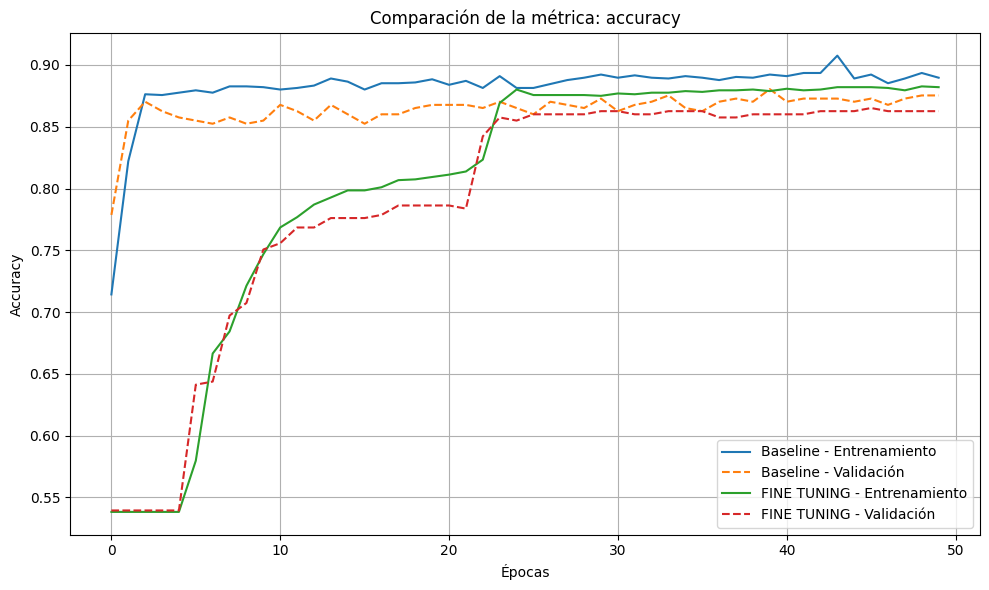

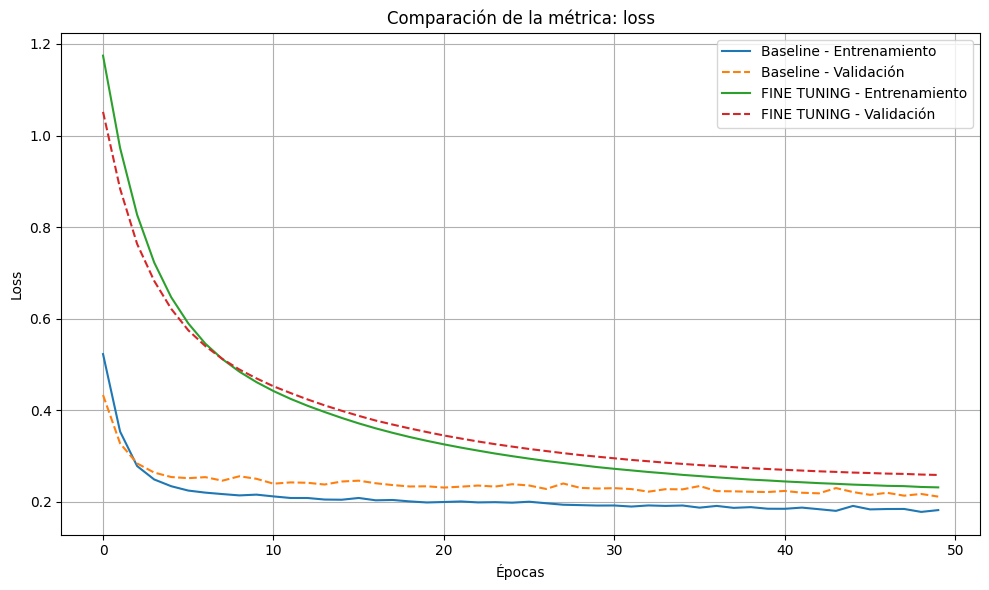

In [692]:
# Diccionario con los histories
histories = {
    'Baseline': history_baseline1,
    'FINE TUNING': history_finetuned
}

# Comparar precisión
plot_history(histories, metric='accuracy')

# Comparar pérdida
plot_history(histories, metric='loss')

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 8 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
📋 Classification Report:

              precision    recall  f1-score   support

           0       0.98      0.73      0.84       181
           1       0.81      0.99      0.89       212

    accuracy                           0.87       393
   macro avg       0.89      0.86      0.86       393
weighted avg       0.89      0.87      0.86       393



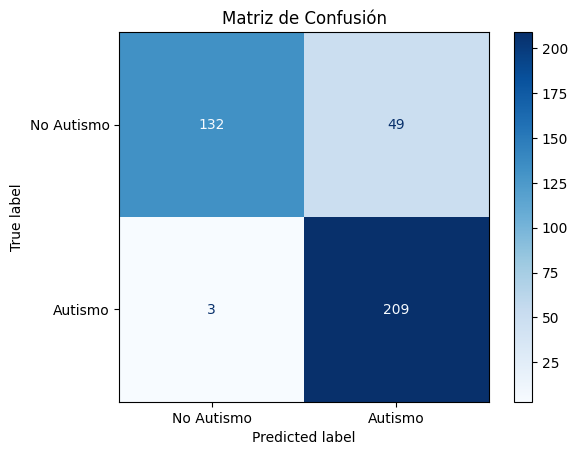


🔍 ROC AUC: 0.9647


In [693]:
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# Cargar el modelo
model = load_model('modelo_baseline1.keras')

# Realizar predicciones sobre el conjunto de validación
y_pred_probs = model.predict(X_val)  # Probabilidades
y_pred = (y_pred_probs >= 0.5).astype(int)  # Clasificación binaria

# Reporte de clasificación
print("📋 Classification Report:\n")
print(classification_report(y_val, y_pred))

# Matriz de confusión
cm = confusion_matrix(y_val, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Autismo", "Autismo"])
disp.plot(cmap="Blues")
plt.title("Matriz de Confusión")
plt.show()

# ROC AUC
roc_auc = roc_auc_score(y_val, y_pred_probs)
print(f"\n🔍 ROC AUC: {roc_auc:.4f}")


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
📋 Classification Report:

              precision    recall  f1-score   support

           0       0.98      0.71      0.82       181
           1       0.80      0.99      0.88       212

    accuracy                           0.86       393
   macro avg       0.89      0.85      0.85       393
weighted avg       0.88      0.86      0.86       393



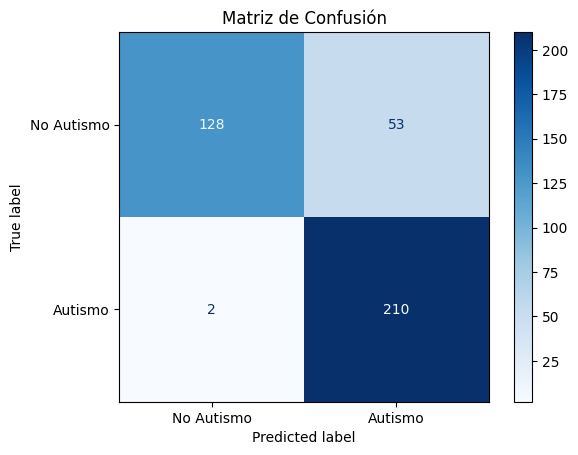


🔍 ROC AUC: 0.9671


In [694]:
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# Cargar el modelo
model = load_model("model_finetuned (1).keras")

# Realizar predicciones sobre el conjunto de validación
y_pred_probs = model.predict(X_val)  # Probabilidades
y_pred = (y_pred_probs >= 0.5).astype(int)  # Clasificación binaria

# Reporte de clasificación
print("📋 Classification Report:\n")
print(classification_report(y_val, y_pred))

# Matriz de confusión
cm = confusion_matrix(y_val, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Autismo", "Autismo"])
disp.plot(cmap="Blues")
plt.title("Matriz de Confusión")
plt.show()

# ROC AUC
roc_auc = roc_auc_score(y_val, y_pred_probs)
print(f"\n🔍 ROC AUC: {roc_auc:.4f}")


VERSUS SVM RADIAL

Métricas del modelo:
   Accuracy  Precision    Recall  F1-Score       AUC
0  0.875318   0.814672  0.995283  0.895966  0.962681


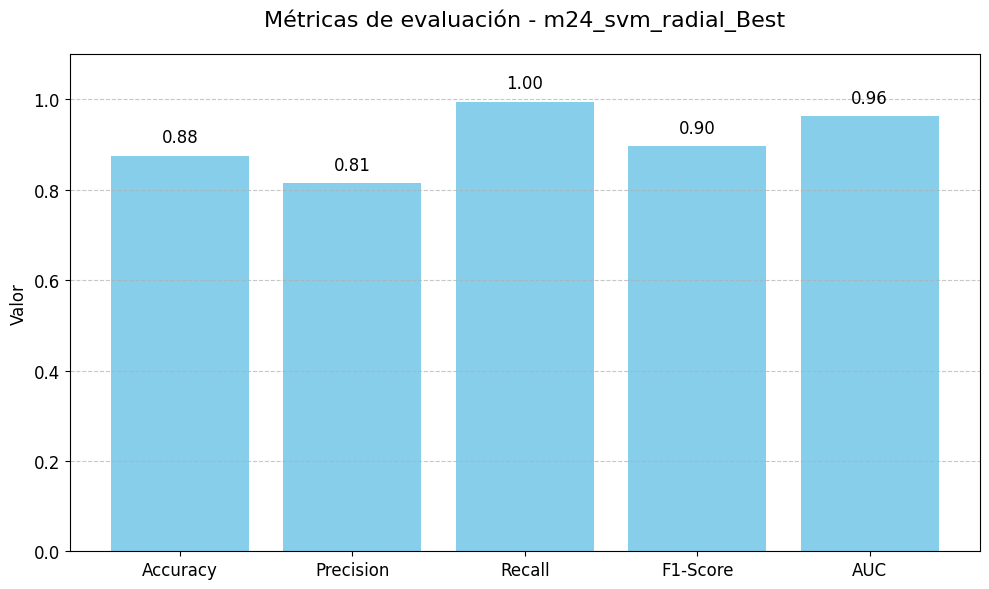

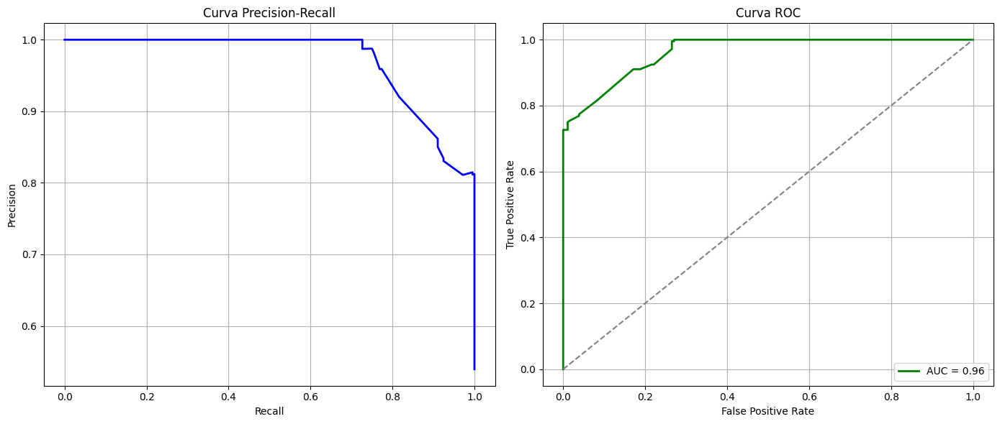

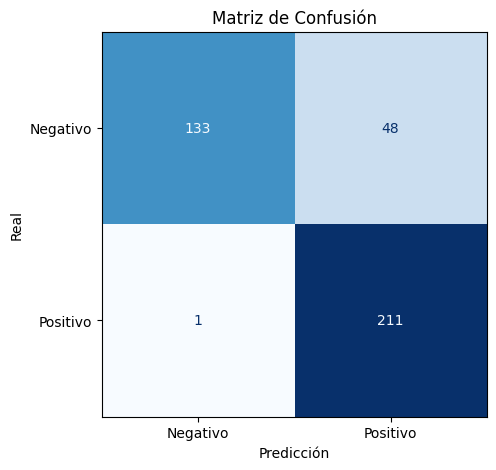

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Mostrar el DataFrame con las métricas
print("Métricas del modelo:")
print(modelo_desc)

# Extraer nombres de métricas y sus valores desde el DataFrame
metricas = modelo_desc.columns.tolist()
valores = modelo_desc.iloc[0].tolist()

# --- GRÁFICO DE BARRAS DE MÉTRICAS ---
plt.figure(figsize=(10, 6))
plt.bar(metricas, valores, color='skyblue')
plt.ylim(0, 1.1)
plt.title(f'Métricas de evaluación - {modelo_elegido}', fontsize=16, pad=20)
plt.ylabel('Valor', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Mostrar valores encima de cada barra
for i, v in enumerate(valores):
    plt.text(i, v + 0.03, f"{v:.2f}", ha='center', fontsize=12)

plt.tight_layout()
plt.show()

# --- CURVAS PRECISION-RECALL Y ROC ---
precision, recall, _ = precision_recall_curve(y_test_set, y_proba)
fpr, tpr, _ = roc_curve(y_test_set, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(14, 6))

# Curva Precision-Recall
plt.subplot(1, 2, 1)
plt.plot(recall, precision, color='blue', lw=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Curva Precision-Recall')
plt.grid(True)

# Curva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='green', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)

plt.tight_layout()
plt.show()

# --- MATRIZ DE CONFUSIÓN ---
cm = confusion_matrix(y_test_set, y_pred)
labels = ["Negativo", "Positivo"]

# Visualización con anotaciones
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(ax=ax, cmap='Blues', colorbar=False)

plt.title("Matriz de Confusión")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.grid(False)
plt.show()

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

 Métricas globales:
   Accuracy  Precision    Recall  F1-Score       AUC
0  0.860051   0.798479  0.990566  0.884211  0.967059


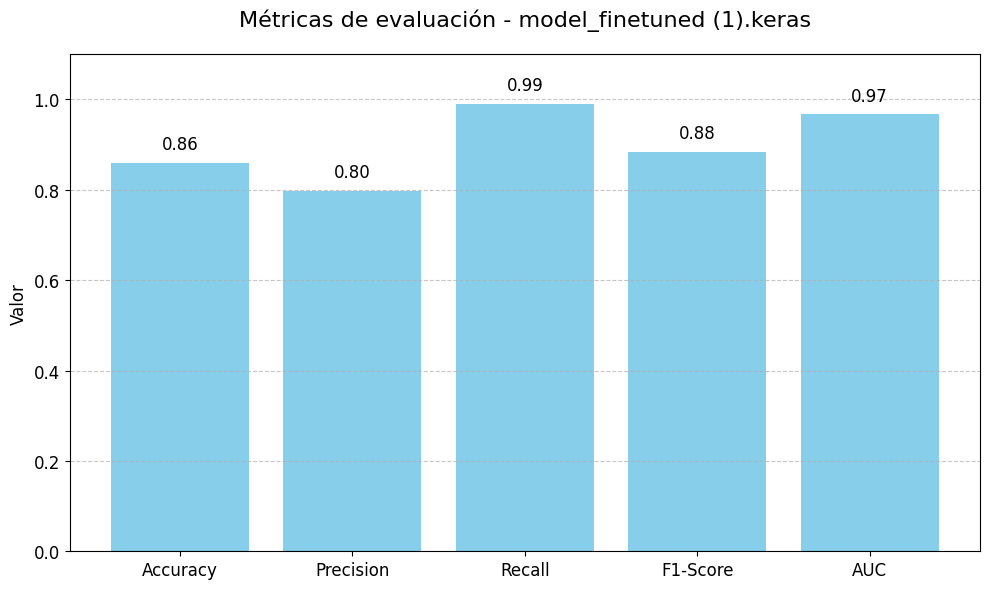

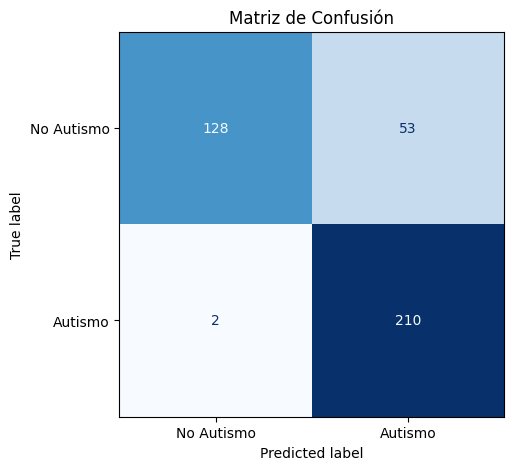

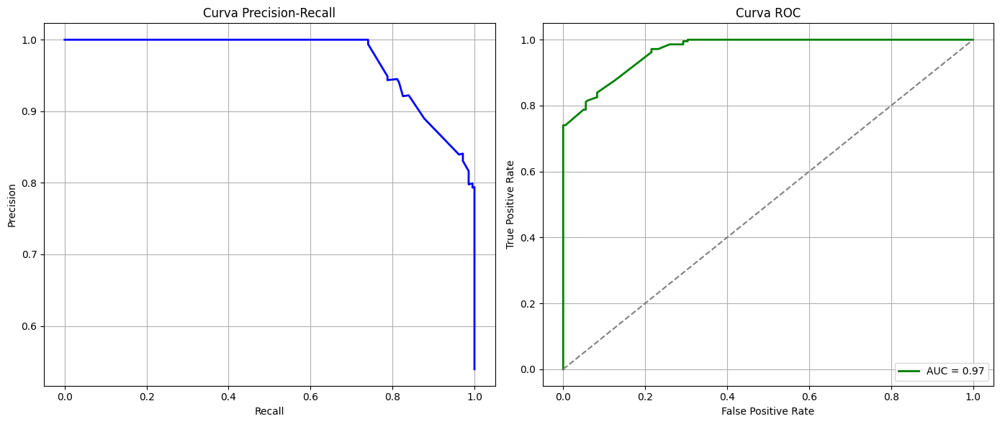

In [710]:
from keras.models import load_model
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_curve, roc_curve, auc
)
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# --- Nombre del modelo y carga ---
modelo_elegido = 'model_finetuned (1).keras'
model = load_model(modelo_elegido)

# --- Predicciones ---
y_pred_probs = model.predict(X_val).flatten()
y_pred = (y_pred_probs >= 0.5).astype(int)

# ---  Métricas en tabla y gráfico ---
resultados = {
    'Accuracy': accuracy_score(y_val, y_pred),
    'Precision': precision_score(y_val, y_pred),
    'Recall': recall_score(y_val, y_pred),
    'F1-Score': f1_score(y_val, y_pred),
    'AUC': roc_auc_score(y_val, y_pred_probs)
}
modelo_desc = pd.DataFrame([resultados])

print("\n Métricas globales:")
print(modelo_desc)

# Gráfico de barras
metricas = modelo_desc.columns.tolist()
valores = modelo_desc.iloc[0].tolist()

plt.figure(figsize=(10, 6))
plt.bar(metricas, valores, color='skyblue')
plt.ylim(0, 1.1)
plt.title(f'Métricas de evaluación - {modelo_elegido}', fontsize=16, pad=20)
plt.ylabel('Valor', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Etiquetas sobre las barras
for i, v in enumerate(valores):
    plt.text(i, v + 0.03, f"{v:.2f}", ha='center', fontsize=12)

plt.tight_layout()
plt.show()

# ---  Matriz de confusión ---
cm = confusion_matrix(y_val, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Autismo", "Autismo"])
fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(ax=ax, cmap="Blues", colorbar=False)
plt.title("Matriz de Confusión")
plt.grid(False)
plt.show()

# --- 3. Curvas Precision-Recall y ROC ---
precision, recall, _ = precision_recall_curve(y_val, y_pred_probs)
fpr, tpr, _ = roc_curve(y_val, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(14, 6))

# Precision-Recall
plt.subplot(1, 2, 1)
plt.plot(recall, precision, color='blue', lw=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Curva Precision-Recall')
plt.grid(True)

# ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='green', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)

plt.tight_layout()
plt.show()


 1/13 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 8 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step

 Métricas globales:
   Accuracy  Precision    Recall  F1-Score       AUC
0  0.867684   0.810078  0.985849  0.889362  0.964714


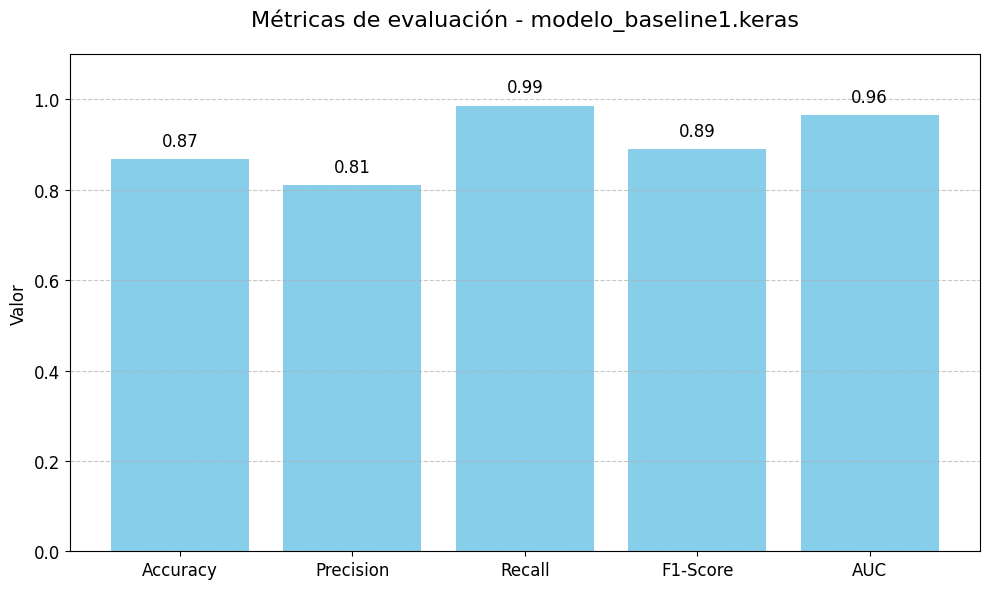

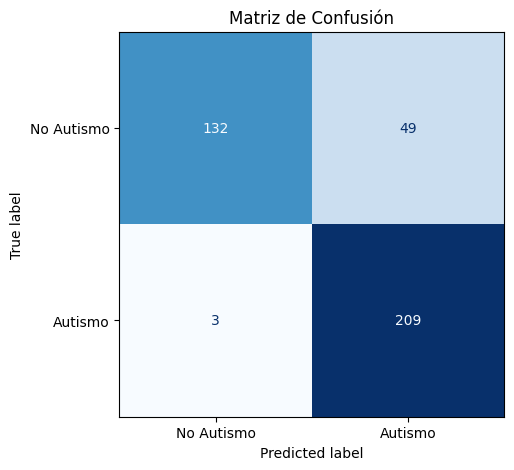

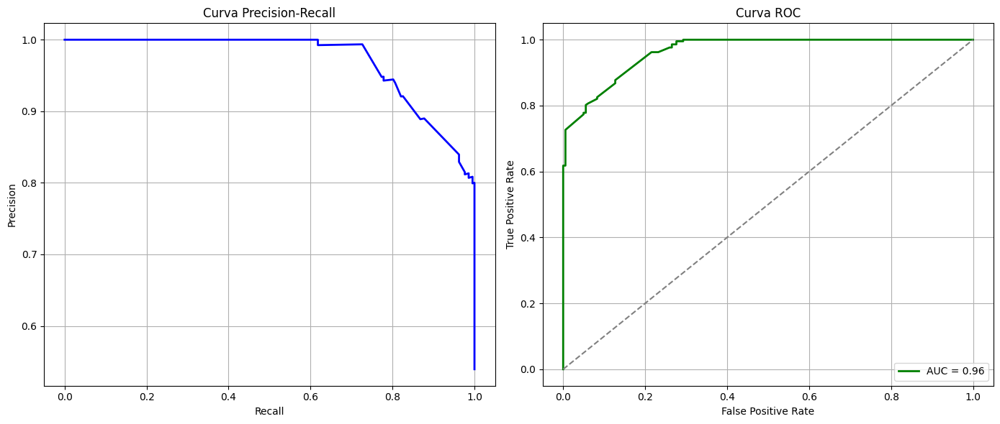

In [713]:
from keras.models import load_model
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_curve, roc_curve, auc
)
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# --- Nombre del modelo y carga ---
modelo_elegido = 'modelo_baseline1.keras'
model = load_model(modelo_elegido)

# --- Predicciones ---
y_pred_probs = model.predict(X_val).flatten()
y_pred = (y_pred_probs >= 0.5).astype(int)

# ---  Métricas en tabla y gráfico ---
resultados = {
    'Accuracy': accuracy_score(y_val, y_pred),
    'Precision': precision_score(y_val, y_pred),
    'Recall': recall_score(y_val, y_pred),
    'F1-Score': f1_score(y_val, y_pred),
    'AUC': roc_auc_score(y_val, y_pred_probs)
}
modelo_desc = pd.DataFrame([resultados])

print("\n Métricas globales:")
print(modelo_desc)

# Gráfico de barras
metricas = modelo_desc.columns.tolist()
valores = modelo_desc.iloc[0].tolist()

plt.figure(figsize=(10, 6))
plt.bar(metricas, valores, color='skyblue')
plt.ylim(0, 1.1)
plt.title(f'Métricas de evaluación - {modelo_elegido}', fontsize=16, pad=20)
plt.ylabel('Valor', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Etiquetas sobre las barras
for i, v in enumerate(valores):
    plt.text(i, v + 0.03, f"{v:.2f}", ha='center', fontsize=12)

plt.tight_layout()
plt.show()

# ---  Matriz de confusión ---
cm = confusion_matrix(y_val, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Autismo", "Autismo"])
fig, ax = plt.subplots(figsize=(6, 5))
disp.plot(ax=ax, cmap="Blues", colorbar=False)
plt.title("Matriz de Confusión")
plt.grid(False)
plt.show()

# --- 3. Curvas Precision-Recall y ROC ---
precision, recall, _ = precision_recall_curve(y_val, y_pred_probs)
fpr, tpr, _ = roc_curve(y_val, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(14, 6))

# Precision-Recall
plt.subplot(1, 2, 1)
plt.plot(recall, precision, color='blue', lw=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Curva Precision-Recall')
plt.grid(True)

# ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='green', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(True)

plt.tight_layout()
plt.show()


**INTERPRETACIÓN**

Se evaluaron tres modelos distintos para la predicción de rasgos de autismo: un modelo SVM con kernel radial (`m24_svm_radial_Best`), un modelo de red neuronal fine-tuned (`model_finetuned (1).keras`) y un modelo base (`modelo_baseline1.keras`). A continuación se muestra una comparación resumida de sus métricas de desempeño:

| Métrica   | m24_svm_radial_Best | model_finetuned (1).keras | modelo_baseline1.keras |
|-----------|---------------------|----------------------------|-------------------------|
| Accuracy  | 0.88                | 0.86                       | 0.87                    |
| Precision | 0.81                | 0.80                       | 0.81                    |
| Recall    | 1.00                | 0.99                       | 0.99                    |
| F1-Score  | 0.90                | 0.88                       | 0.89                    |
| AUC       | 0.96                | 0.97                       | 0.96                    |

**Análisis:**

- El modelo `m24_svm_radial_Best` destaca por su **Recall perfecto (1.00)**, lo que lo convierte en la mejor opción cuando es prioritario minimizar los falsos negativos, como en escenarios clínicos de detección temprana.
- El modelo `model_finetuned (1).keras` presenta el **mayor valor de AUC (0.97)**, indicando una excelente capacidad discriminativa global. Sin embargo, su precisión es ligeramente menor.
- El modelo `modelo_baseline1.keras` muestra un **rendimiento consistente** en todas las métricas, con resultados muy cercanos a los mejores, siendo una opción robusta y balanceada.

**Conclusión:**

- Si el objetivo es **maximizar la detección de casos positivos**, se recomienda el uso del modelo `m24_svm_radial_Best`.
- Si se busca un modelo con **excelente capacidad de discriminación y generalización**, `model_finetuned (1).keras` es una buena alternativa.
- Para un **modelo equilibrado y confiable**, `modelo_baseline1.keras` ofrece una solución sólida sin puntos débiles notorios.

La elección final debería considerar tanto las métricas como el contexto clínico o aplicativo específico del sistema de diagnóstico.
